In [1]:
import math
import json
import os
import logging
import re
import random
import time
from pathlib import Path

import numpy as np
import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers, models, initializers
from tensorflow.keras.layers import (Dense, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D,
                                     LeakyReLU, Input, Flatten, Conv2D, BatchNormalization, Activation)
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.models import load_model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import (EarlyStopping, ModelCheckpoint,
                                        ReduceLROnPlateau, LearningRateScheduler, Callback, TensorBoard)
from tensorflow.keras.optimizers import Adam
from tensorflow_addons.optimizers import AdamW
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.mixed_precision import set_global_policy
from tensorflow.keras.utils import Progbar
from tensorflow.data.experimental import AUTOTUNE

from glob import glob
from collections import defaultdict
from types import SimpleNamespace

from keras import optimizers
from tensorflow.keras.preprocessing.image import load_img, save_img, img_to_array, array_to_img

import torch
import torch.nn as nn
import torchvision.transforms as T
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay,recall_score, cohen_kappa_score,
                             roc_curve, auc, classification_report, matthews_corrcoef,
                             accuracy_score, f1_score, precision_score)
from sklearn.utils.class_weight import compute_class_weight
from collections import Counter
from IPython.display import Image
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt


%matplotlib inline

In [4]:
# === KÍCH HOẠT GPU/TPU ===
def enable_gpu_tpu():
    try:
        tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
        print('Running on TPU:', tpu.master())
        tf.config.experimental_connect_to_cluster(tpu)
        tf.tpu.experimental.initialize_tpu_system(tpu)
        strategy = tf.distribute.TPUStrategy(tpu)
        print("TPU đã kích hoạt với", strategy.num_replicas_in_sync, "lõi!")
        return strategy
    except ValueError:
        gpus = tf.config.list_physical_devices('GPU')
        if gpus:
            try:
                for gpu in gpus:
                    tf.config.experimental.set_memory_growth(gpu, True)
                print(f"{len(gpus)} GPU đã kích hoạt với memory growth!")
                strategy = tf.distribute.MirroredStrategy()
                return strategy
            except RuntimeError as e:
                print(f"Lỗi khi cấu hình GPU: {e}")
        print("Không có GPU/TPU, sẽ chạy trên CPU!")
        strategy = tf.distribute.get_strategy()
        return strategy

strategy = enable_gpu_tpu()

Không có GPU/TPU, sẽ chạy trên CPU!


In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
train_dir = r"P:\BreaKHis_v1\200\train"
test_dir =  r"P:\BreaKHis_v1\200\test"

# Data preprocessing
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Create generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # adjust based on your image size
    batch_size=32,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary'
)

# Build model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # binary classification
])

# Compile model
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Train model
model.fit(train_generator, epochs=10, validation_data=test_generator)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy:.2f}')


Found 1416 images belonging to 2 classes.
Found 597 images belonging to 2 classes.
Epoch 1/10
45/45 [==============================] - 22s 482ms/step - loss: 0.7752 - accuracy: 0.6476 - val_loss: 0.6050 - val_accuracy: 0.7186
Epoch 2/10
45/45 [==============================] - 8s 175ms/step - loss: 0.6234 - accuracy: 0.6787 - val_loss: 0.5980 - val_accuracy: 0.7186
Epoch 3/10
45/45 [==============================] - 8s 173ms/step - loss: 0.6095 - accuracy: 0.6787 - val_loss: 0.6018 - val_accuracy: 0.7186
Epoch 4/10
45/45 [==============================] - 8s 179ms/step - loss: 0.6013 - accuracy: 0.6787 - val_loss: 0.5935 - val_accuracy: 0.7186
Epoch 5/10
45/45 [==============================] - 9s 189ms/step - loss: 0.5542 - accuracy: 0.6857 - val_loss: 0.5960 - val_accuracy: 0.7203
Epoch 6/10
45/45 [==============================] - 9s 192ms/step - loss: 0.4910 - accuracy: 0.7493 - val_loss: 0.6057 - val_accuracy: 0.7035
Epoch 7/10
45/45 [==============================] - 8s 181ms/ste

In [25]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# Directories
train_dir = r"P:\BreaKHis_v1\200\data\train1"
test_dir =  r"P:\BreaKHis_v1\200\data\test1"

# Image dimensions
img_height, img_width = 224, 224  # Required input size for VGG16

# Data generators
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=20,
                                   width_shift_range=0.1,
                                   height_shift_range=0.1,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

# Load VGG16 without top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification layers
x = Flatten()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Train
model.fit(train_generator, epochs=30, validation_data=test_generator)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy:.2f}')
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Get true labels and predictions
Y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Predict class probabilities
Y_pred_proba = model.predict(test_generator, verbose=1)
Y_pred = np.argmax(Y_pred_proba, axis=1)

# Compute confusion matrix
cm = confusion_matrix(Y_true, Y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title('Confusion Matrix')
plt.show()

Found 2832 images belonging to 2 classes.
Found 1194 images belonging to 2 classes.
Epoch 1/30
82/89 [==========================>...] - ETA: 14s - loss: 0.5999 - accuracy: 0.6860 

KeyboardInterrupt: 

Found 1416 images belonging to 2 classes.
Found 597 images belonging to 2 classes.
Epoch 1/30
45/45 [==============================] - 137s 3s/step - loss: 0.6904 - accuracy: 0.6328 - val_loss: 0.5636 - val_accuracy: 0.7219
Epoch 2/30
45/45 [==============================] - 132s 3s/step - loss: 0.6052 - accuracy: 0.6801 - val_loss: 0.5644 - val_accuracy: 0.7605
Epoch 3/30
45/45 [==============================] - 130s 3s/step - loss: 0.5699 - accuracy: 0.6928 - val_loss: 0.5305 - val_accuracy: 0.7605
Epoch 4/30
45/45 [==============================] - 128s 3s/step - loss: 0.5441 - accuracy: 0.7175 - val_loss: 0.5194 - val_accuracy: 0.7672
Epoch 5/30
45/45 [==============================] - 131s 3s/step - loss: 0.5397 - accuracy: 0.7210 - val_loss: 0.5172 - val_accuracy: 0.7739
Epoch 6/30
45/45 [==============================] - 127s 3s/step - loss: 0.5256 - accuracy: 0.7210 - val_loss: 0.5120 - val_accuracy: 0.7755
Epoch 7/30
45/45 [==============================] - 126s 3s/step - loss

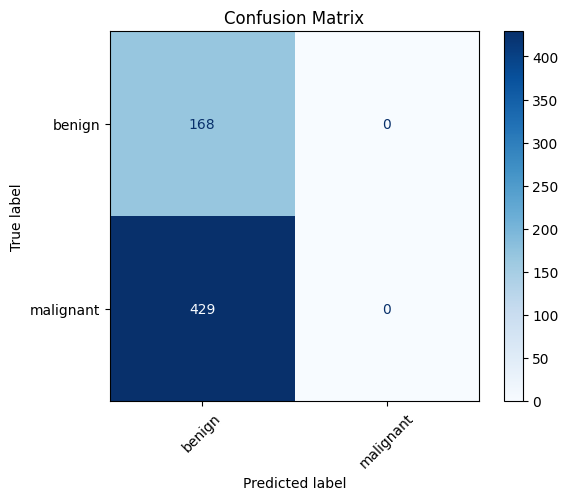

In [24]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# Directories
train_dir = r"P:\BreaKHis_v1\200\data\train"
test_dir =  r"P:\BreaKHis_v1\200\data\test"

# Image dimensions
img_height, img_width = 224, 224  # Required input size for VGG16

# Data generators
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=20,
                                   width_shift_range=0.1,
                                   height_shift_range=0.1,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

# Load VGG16 without top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification layers
x = Flatten()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Train
model.fit(train_generator, epochs=30, validation_data=test_generator)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy:.2f}')
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Get true labels and predictions
Y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Predict class probabilities
Y_pred_proba = model.predict(test_generator, verbose=1)
Y_pred = np.argmax(Y_pred_proba, axis=1)

# Compute confusion matrix
cm = confusion_matrix(Y_true, Y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title('Confusion Matrix')
plt.show()

Found 1133 images belonging to 2 classes.
Found 283 images belonging to 2 classes.
Found 597 images belonging to 2 classes.

Training InceptionV3...
Epoch 1/30
36/36 [==============================] - 133s 4s/step - loss: 0.3050 - accuracy: 0.8464 - val_loss: 0.9639 - val_accuracy: 0.6961
Epoch 2/30
36/36 [==============================] - 127s 4s/step - loss: 0.0317 - accuracy: 0.9903 - val_loss: 0.4534 - val_accuracy: 0.8481
Epoch 3/30
36/36 [==============================] - 129s 4s/step - loss: 0.0205 - accuracy: 0.9929 - val_loss: 0.5069 - val_accuracy: 0.8551
Epoch 4/30
36/36 [==============================] - 127s 4s/step - loss: 0.0231 - accuracy: 0.9929 - val_loss: 0.7122 - val_accuracy: 0.8269
Epoch 5/30
36/36 [==============================] - 128s 4s/step - loss: 0.0118 - accuracy: 0.9965 - val_loss: 1.0408 - val_accuracy: 0.8127
Epoch 6/30
36/36 [==============================] - 127s 4s/step - loss: 0.0138 - accuracy: 0.9956 - val_loss: 0.8770 - val_accuracy: 0.8304
Epoch

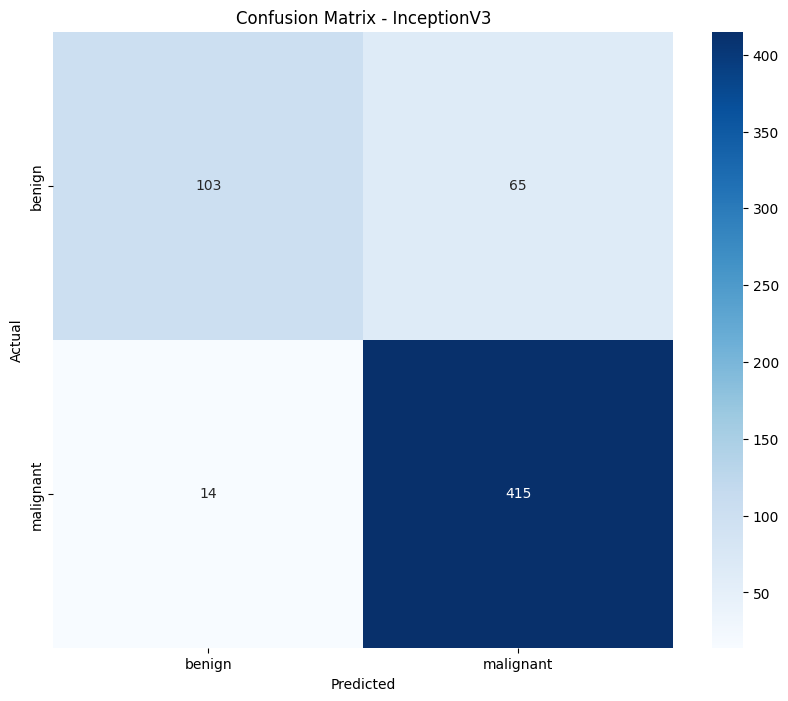

Classification Report - InceptionV3:

              precision    recall  f1-score   support

      benign       0.88      0.61      0.72       168
   malignant       0.86      0.97      0.91       429

    accuracy                           0.87       597
   macro avg       0.87      0.79      0.82       597
weighted avg       0.87      0.87      0.86       597


Training InceptionResNetV2...
Epoch 1/30
36/36 [==============================] - 383s 10s/step - loss: 0.3946 - accuracy: 0.8076 - val_loss: 1.6721 - val_accuracy: 0.6784
Epoch 2/30
36/36 [==============================] - 341s 9s/step - loss: 0.1388 - accuracy: 0.9426 - val_loss: 1.3937 - val_accuracy: 0.7138
Epoch 3/30
36/36 [==============================] - 384s 11s/step - loss: 0.0461 - accuracy: 0.9850 - val_loss: 1.2183 - val_accuracy: 0.7809
Epoch 4/30
36/36 [==============================] - 385s 11s/step - loss: 0.0256 - accuracy: 0.9938 - val_loss: 1.3648 - val_accuracy: 0.7986
Epoch 5/30
36/36 [===================

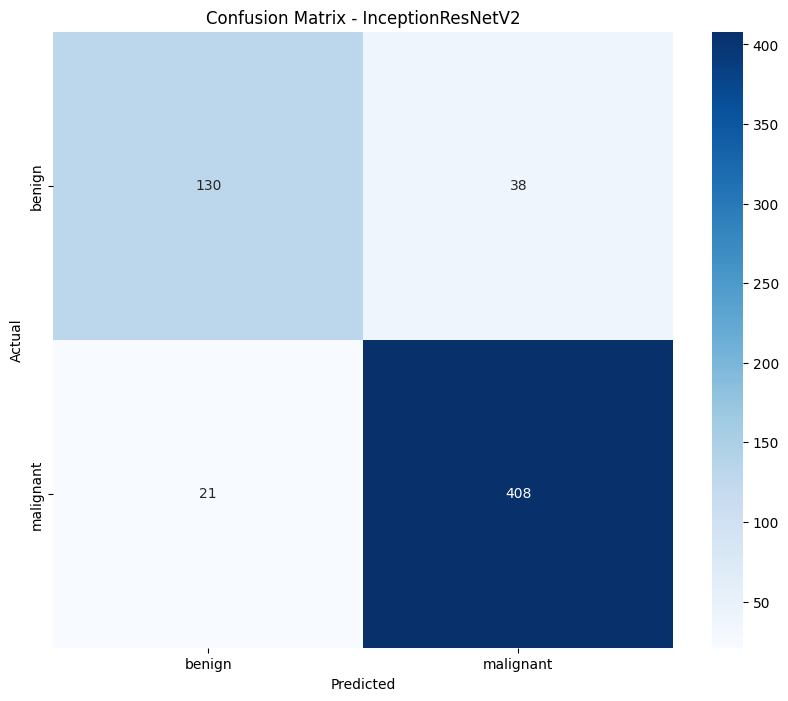

Classification Report - InceptionResNetV2:

              precision    recall  f1-score   support

      benign       0.86      0.77      0.82       168
   malignant       0.91      0.95      0.93       429

    accuracy                           0.90       597
   macro avg       0.89      0.86      0.87       597
weighted avg       0.90      0.90      0.90       597


Training Xception...
83683744/83683744 [==============================] - 4s 0us/step
Epoch 1/30
36/36 [==============================] - 256s 7s/step - loss: 0.3463 - accuracy: 0.8473 - val_loss: 0.5873 - val_accuracy: 0.7032
Epoch 2/30
36/36 [==============================] - 241s 7s/step - loss: 0.0524 - accuracy: 0.9868 - val_loss: 0.3691 - val_accuracy: 0.8445
Epoch 3/30
36/36 [==============================] - 242s 7s/step - loss: 0.0131 - accuracy: 1.0000 - val_loss: 0.7549 - val_accuracy: 0.7951
Epoch 4/30
36/36 [==============================] - 342s 10s/step - loss: 0.0086 - accuracy: 0.9982 - val_loss: 1.0474 

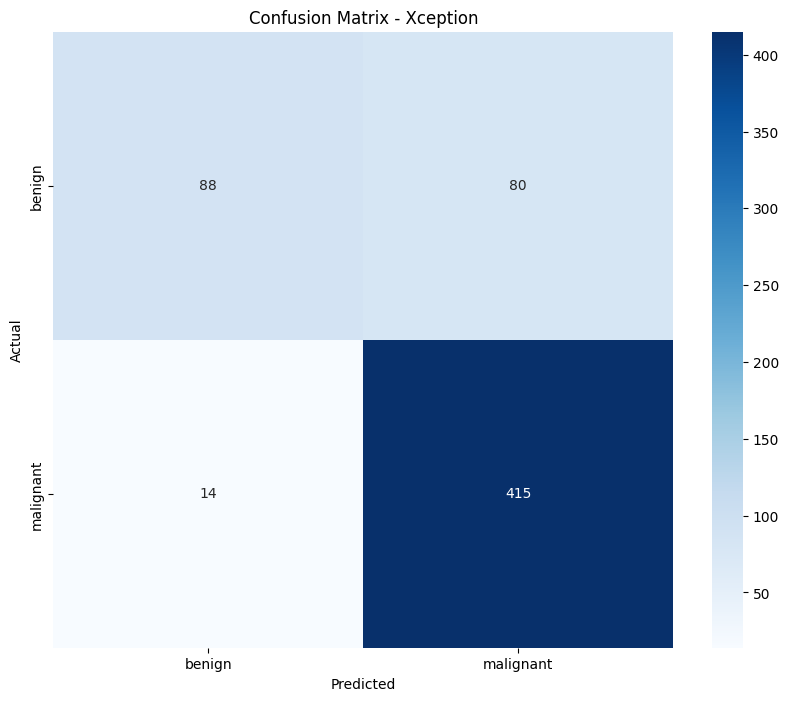

Classification Report - Xception:

              precision    recall  f1-score   support

      benign       0.86      0.52      0.65       168
   malignant       0.84      0.97      0.90       429

    accuracy                           0.84       597
   macro avg       0.85      0.75      0.78       597
weighted avg       0.85      0.84      0.83       597



In [2]:
###### import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3, InceptionResNetV2, Xception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Paths
train_dir = r"P:\BreaKHis_v1\200\data\train1"
test_dir = r"P:\BreaKHis_v1\200\data\test1"

# Config
input_shape = (299, 299, 3)
batch_size = 32
epochs = 30
num_classes = len(os.listdir(train_dir))

# Data Generators
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)
val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Build model function
def build_model(base_model, dropout=True, trainable_layers=100):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    if dropout:
        x = Dropout(0.5)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=output)

    # Freeze all layers
    for layer in model.layers:
        layer.trainable = False
    # Unfreeze last N layers
    for layer in model.layers[-trainable_layers:]:
        layer.trainable = True

    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Plot confusion matrix
def plot_confusion_matrix(model, generator, title):
    Y_pred = model.predict(generator)
    y_pred = np.argmax(Y_pred, axis=1)
    y_true = generator.classes
    class_names = list(generator.class_indices.keys())

    cm = confusion_matrix(y_true, y_pred)
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.title(f'Confusion Matrix - {title}')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

    print(f"Classification Report - {title}:\n")
    print(classification_report(y_true, y_pred, target_names=class_names))

# Callback
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# ---- InceptionV3 ----
print("\nTraining InceptionV3...")
base_model_v3 = InceptionV3(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_v3 = build_model(base_model_v3, dropout=False, trainable_layers=260)
model_v3.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_v3, test_generator, title="InceptionV3")

# ---- InceptionResNetV2 ----
print("\nTraining InceptionResNetV2...")
base_model_resnet = InceptionResNetV2(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_resnet = build_model(base_model_resnet, dropout=True, trainable_layers=720)
model_resnet.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_resnet, test_generator, title="InceptionResNetV2")

# ---- Xception ----
print("\nTraining Xception...")
base_model_xception = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_xception = build_model(base_model_xception, dropout=True, trainable_layers=115)
model_xception.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_xception, test_generator, title="Xception")


Found 770 images belonging to 4 classes.
Found 191 images belonging to 4 classes.
Found 429 images belonging to 4 classes.

----- Training InceptionV3 -----
Epoch 1/30
25/25 [==============================] - 70s 3s/step - loss: 0.8280 - accuracy: 0.7000 - val_loss: 1.3941 - val_accuracy: 0.6859
Epoch 2/30
25/25 [==============================] - 66s 3s/step - loss: 0.5217 - accuracy: 0.7922 - val_loss: 1.8853 - val_accuracy: 0.6806
Epoch 3/30
25/25 [==============================] - 65s 3s/step - loss: 0.3691 - accuracy: 0.8714 - val_loss: 1.6663 - val_accuracy: 0.6545
Epoch 4/30
25/25 [==============================] - 63s 3s/step - loss: 0.2509 - accuracy: 0.9156 - val_loss: 1.7526 - val_accuracy: 0.6230
Epoch 5/30
25/25 [==============================] - 63s 3s/step - loss: 0.2035 - accuracy: 0.9338 - val_loss: 1.8149 - val_accuracy: 0.5759
Epoch 6/30
14/14 [==============================] - 20s 1s/step


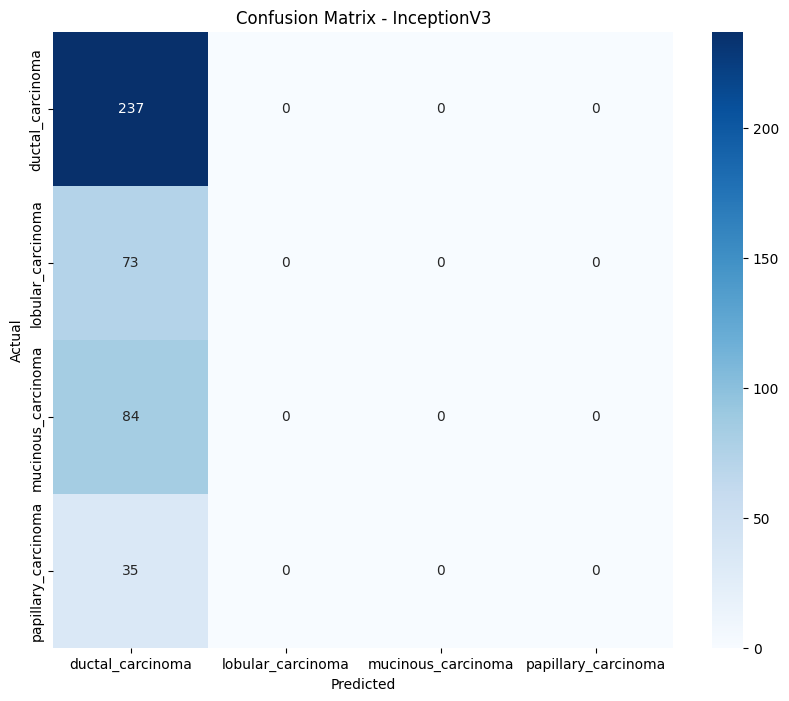


Classification Report - InceptionV3:

                     precision    recall  f1-score   support

   ductal_carcinoma       0.55      1.00      0.71       237
  lobular_carcinoma       0.00      0.00      0.00        73
 mucinous_carcinoma       0.00      0.00      0.00        84
papillary_carcinoma       0.00      0.00      0.00        35

           accuracy                           0.55       429
          macro avg       0.14      0.25      0.18       429
       weighted avg       0.31      0.55      0.39       429


----- Training InceptionResNetV2 -----


C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch 1/30
25/25 [==============================] - 167s 6s/step - loss: 0.9574 - accuracy: 0.6753 - val_loss: 1.0650 - val_accuracy: 0.6859
Epoch 2/30
25/25 [==============================] - 158s 6s/step - loss: 0.6539 - accuracy: 0.7727 - val_loss: 1.0304 - val_accuracy: 0.6859
Epoch 3/30
25/25 [==============================] - 149s 6s/step - loss: 0.5238 - accuracy: 0.8091 - val_loss: 1.0528 - val_accuracy: 0.6806
Epoch 4/30
25/25 [==============================] - 149s 6s/step - loss: 0.3991 - accuracy: 0.8468 - val_loss: 1.2068 - val_accuracy: 0.6492
Epoch 5/30
25/25 [==============================] - 149s 6s/step - loss: 0.3026 - accuracy: 0.8935 - val_loss: 1.5437 - val_accuracy: 0.6230
Epoch 6/30
25/25 [==============================] - 152s 6s/step - loss: 0.2817 - accuracy: 0.8935 - val_loss: 1.5776 - val_accuracy: 0.6230
Epoch 7/30
14/14 [==============================] - 46s 3s/step


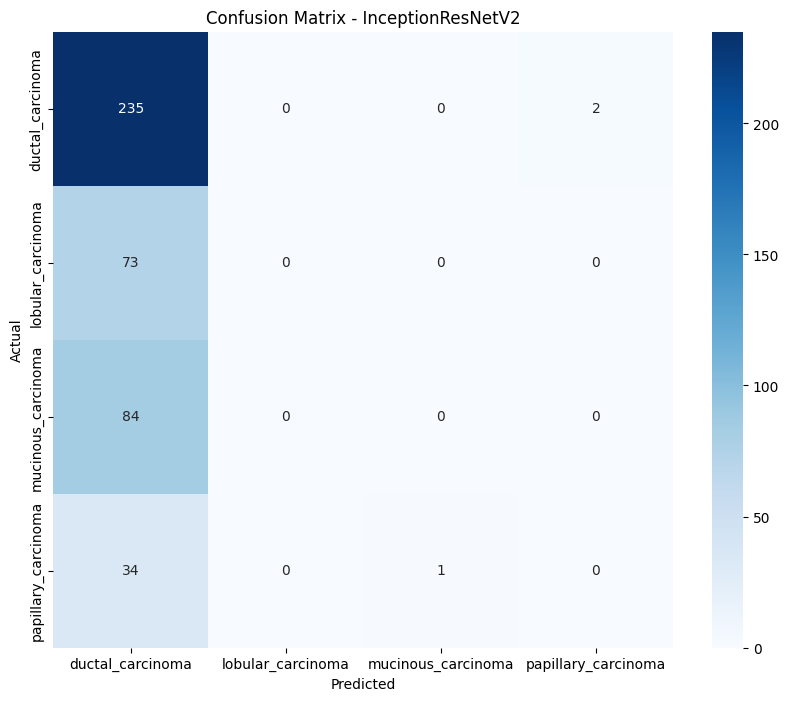


Classification Report - InceptionResNetV2:

                     precision    recall  f1-score   support

   ductal_carcinoma       0.55      0.99      0.71       237
  lobular_carcinoma       0.00      0.00      0.00        73
 mucinous_carcinoma       0.00      0.00      0.00        84
papillary_carcinoma       0.00      0.00      0.00        35

           accuracy                           0.55       429
          macro avg       0.14      0.25      0.18       429
       weighted avg       0.30      0.55      0.39       429


----- Training Xception -----


C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch 1/30
25/25 [==============================] - 223s 9s/step - loss: 0.9019 - accuracy: 0.6584 - val_loss: 0.9645 - val_accuracy: 0.6859
Epoch 2/30
25/25 [==============================] - 217s 9s/step - loss: 0.6485 - accuracy: 0.7299 - val_loss: 1.0150 - val_accuracy: 0.6754
Epoch 3/30
25/25 [==============================] - 216s 9s/step - loss: 0.4525 - accuracy: 0.8364 - val_loss: 1.0374 - val_accuracy: 0.6440
Epoch 4/30
25/25 [==============================] - 207s 8s/step - loss: 0.3116 - accuracy: 0.8974 - val_loss: 1.1885 - val_accuracy: 0.6178
Epoch 5/30
25/25 [==============================] - 204s 8s/step - loss: 0.2379 - accuracy: 0.9182 - val_loss: 1.3001 - val_accuracy: 0.5864
Epoch 6/30
14/14 [==============================] - 26s 2s/step


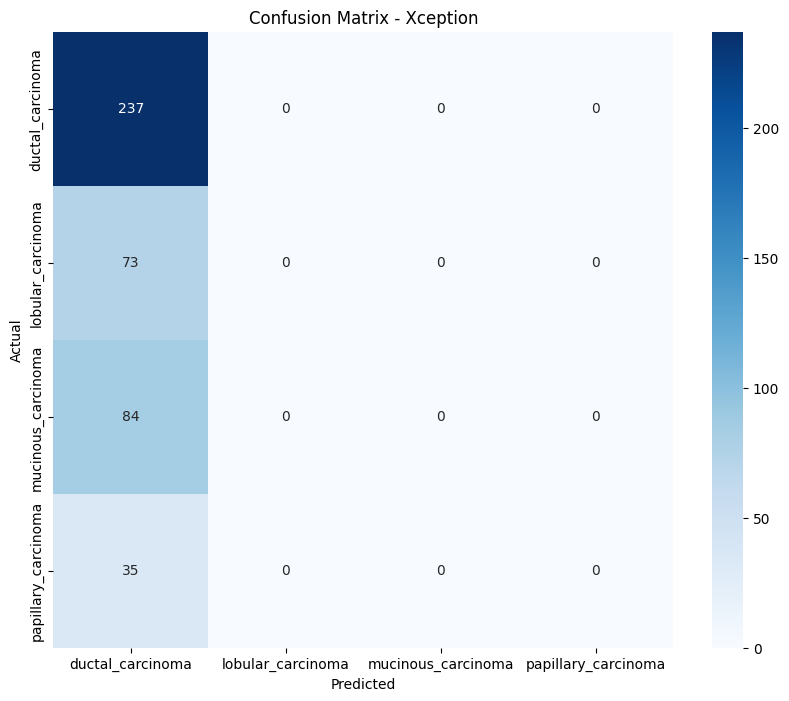


Classification Report - Xception:

                     precision    recall  f1-score   support

   ductal_carcinoma       0.55      1.00      0.71       237
  lobular_carcinoma       0.00      0.00      0.00        73
 mucinous_carcinoma       0.00      0.00      0.00        84
papillary_carcinoma       0.00      0.00      0.00        35

           accuracy                           0.55       429
          macro avg       0.14      0.25      0.18       429
       weighted avg       0.31      0.55      0.39       429



C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [9]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3, InceptionResNetV2, Xception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------ Paths ------------------
train_dir = r"P:\BreaKHis_v1\200\data\train_mal"
test_dir = r"P:\BreaKHis_v1\200\data\test_mal"

# ------------------ Configuration ------------------
input_shape = (299, 299, 3)
batch_size = 32
epochs = 30

# ------------------ Data Generators ------------------
# ------------------ Data Generators ------------------
# Data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Only rescaling for validation
val_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Training generator with augmentation
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

# Validation generator (no augmentation)
val_generator = val_datagen.flow_from_directory(
    train_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

# Test generator (no augmentation)
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


# ------------------ Model Building ------------------
def build_model(base_model, dropout=True, trainable_layers=100):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    if dropout:
        x = Dropout(0.5)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=output)

    # Freeze all layers
    for layer in base_model.layers:
        layer.trainable = False
    # Unfreeze last N layers
    for layer in base_model.layers[-trainable_layers:]:
        layer.trainable = True

    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# ------------------ Confusion Matrix Plot ------------------
def plot_confusion_matrix(model, generator, title):
    Y_pred = model.predict(generator, verbose=1)
    y_pred = np.argmax(Y_pred, axis=1)
    y_true = generator.classes
    class_names = list(generator.class_indices.keys())

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.title(f'Confusion Matrix - {title}')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

    print(f"\nClassification Report - {title}:\n")
    print(classification_report(y_true, y_pred, target_names=class_names))

# ------------------ Callbacks ------------------
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# ------------------ Training Section ------------------

# InceptionV3
print("\n----- Training InceptionV3 -----")
base_model_v3 = InceptionV3(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_v3 = build_model(base_model_v3, dropout=False, trainable_layers=100)
model_v3.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_v3, test_generator, title="InceptionV3")

# InceptionResNetV2
print("\n----- Training InceptionResNetV2 -----")
base_model_resnet = InceptionResNetV2(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_resnet = build_model(base_model_resnet, dropout=True, trainable_layers=150)
model_resnet.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_resnet, test_generator, title="InceptionResNetV2")

# Xception
print("\n----- Training Xception -----")
base_model_xception = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_xception = build_model(base_model_xception, dropout=True, trainable_layers=80)
model_xception.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_xception, test_generator, title="Xception")


Found 367 images belonging to 4 classes.
Found 88 images belonging to 4 classes.
Found 168 images belonging to 4 classes.

----- Training InceptionV3 -----
Epoch 1/30
12/12 [==============================] - 28s 2s/step - loss: 1.1501 - accuracy: 0.4986 - val_loss: 1.1546 - val_accuracy: 0.4659
Epoch 2/30
12/12 [==============================] - 25s 2s/step - loss: 0.7096 - accuracy: 0.7248 - val_loss: 0.9755 - val_accuracy: 0.5682
Epoch 3/30
12/12 [==============================] - 25s 2s/step - loss: 0.4742 - accuracy: 0.8256 - val_loss: 0.9770 - val_accuracy: 0.4773
Epoch 4/30
12/12 [==============================] - 25s 2s/step - loss: 0.3063 - accuracy: 0.8910 - val_loss: 1.0044 - val_accuracy: 0.6023
Epoch 5/30
12/12 [==============================] - 25s 2s/step - loss: 0.1972 - accuracy: 0.9183 - val_loss: 1.0711 - val_accuracy: 0.5341
Epoch 6/30
12/12 [==============================] - 25s 2s/step - loss: 0.1160 - accuracy: 0.9646 - val_loss: 1.3953 - val_accuracy: 0.6136
Epoc

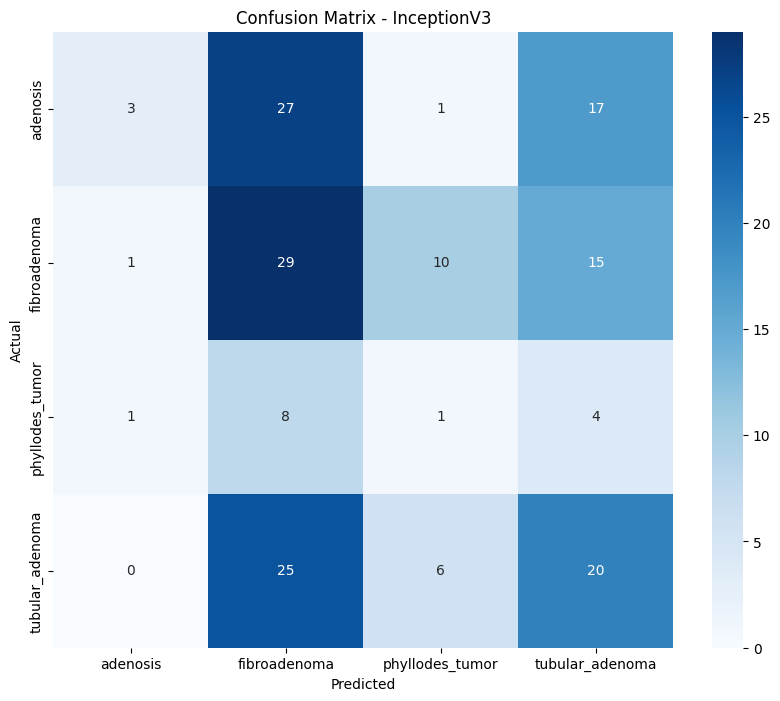


Classification Report - InceptionV3:

                 precision    recall  f1-score   support

       adenosis       0.60      0.06      0.11        48
   fibroadenoma       0.33      0.53      0.40        55
phyllodes_tumor       0.06      0.07      0.06        14
tubular_adenoma       0.36      0.39      0.37        51

       accuracy                           0.32       168
      macro avg       0.33      0.26      0.24       168
   weighted avg       0.39      0.32      0.28       168


----- Training InceptionResNetV2 -----
Epoch 1/30
12/12 [==============================] - 62s 5s/step - loss: 1.3295 - accuracy: 0.4060 - val_loss: 1.2330 - val_accuracy: 0.4659
Epoch 2/30
12/12 [==============================] - 55s 5s/step - loss: 1.0765 - accuracy: 0.5613 - val_loss: 1.1919 - val_accuracy: 0.4545
Epoch 3/30
12/12 [==============================] - 53s 4s/step - loss: 0.8559 - accuracy: 0.6649 - val_loss: 1.1662 - val_accuracy: 0.4545
Epoch 4/30
12/12 [========================

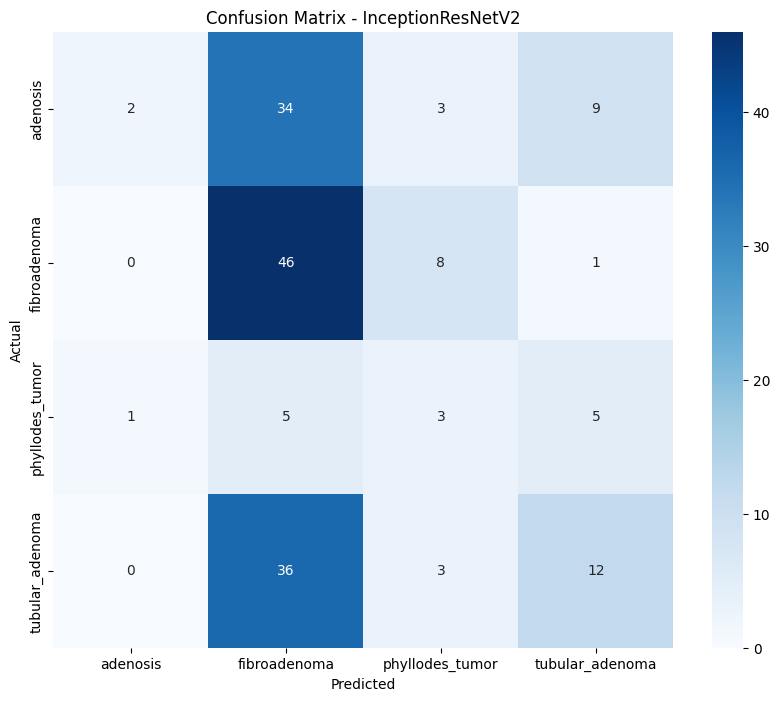


Classification Report - InceptionResNetV2:

                 precision    recall  f1-score   support

       adenosis       0.67      0.04      0.08        48
   fibroadenoma       0.38      0.84      0.52        55
phyllodes_tumor       0.18      0.21      0.19        14
tubular_adenoma       0.44      0.24      0.31        51

       accuracy                           0.38       168
      macro avg       0.42      0.33      0.28       168
   weighted avg       0.46      0.38      0.30       168


----- Training Xception -----
Epoch 1/30
12/12 [==============================] - 70s 6s/step - loss: 1.2520 - accuracy: 0.4387 - val_loss: 1.2454 - val_accuracy: 0.4659
Epoch 2/30
12/12 [==============================] - 95s 8s/step - loss: 0.9980 - accuracy: 0.5967 - val_loss: 1.1591 - val_accuracy: 0.4545
Epoch 3/30
12/12 [==============================] - 93s 8s/step - loss: 0.7349 - accuracy: 0.7493 - val_loss: 1.0722 - val_accuracy: 0.5000
Epoch 4/30
12/12 [===========================

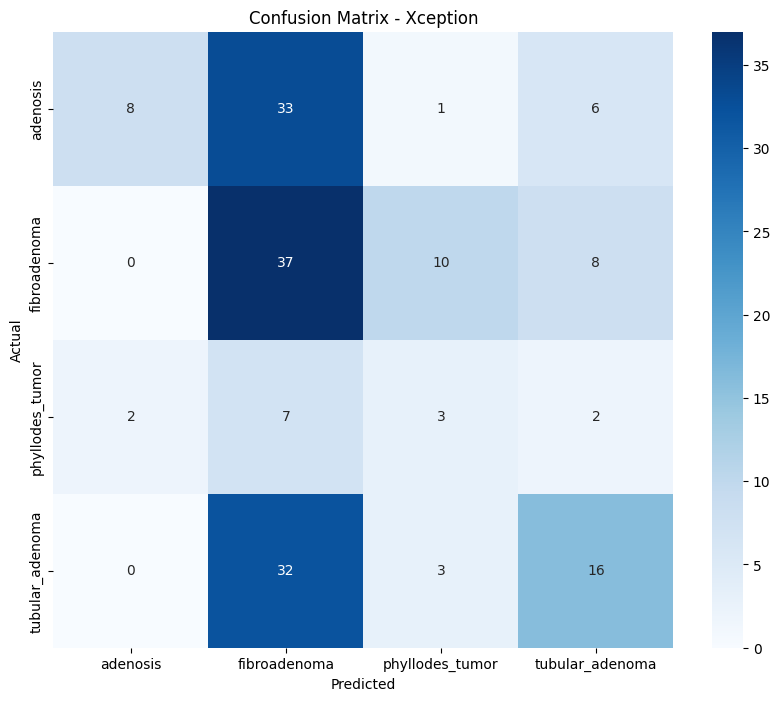


Classification Report - Xception:

                 precision    recall  f1-score   support

       adenosis       0.80      0.17      0.28        48
   fibroadenoma       0.34      0.67      0.45        55
phyllodes_tumor       0.18      0.21      0.19        14
tubular_adenoma       0.50      0.31      0.39        51

       accuracy                           0.38       168
      macro avg       0.45      0.34      0.33       168
   weighted avg       0.51      0.38      0.36       168



In [8]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3, InceptionResNetV2, Xception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------ Paths ------------------
train_dir = r"P:\BreaKHis_v1\200\data\train_b"
test_dir = r"P:\BreaKHis_v1\200\data\test_b"

# ------------------ Configuration ------------------
input_shape = (299, 299, 3)
batch_size = 32
epochs = 30

# ------------------ Data Generators ------------------
# ------------------ Data Generators ------------------
# Data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Only rescaling for validation
val_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Training generator with augmentation
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

# Validation generator (no augmentation)
val_generator = val_datagen.flow_from_directory(
    train_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

# Test generator (no augmentation)
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


# ------------------ Model Building ------------------
def build_model(base_model, dropout=True, trainable_layers=100):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    if dropout:
        x = Dropout(0.5)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=output)

    # Freeze all layers
    for layer in base_model.layers:
        layer.trainable = False
    # Unfreeze last N layers
    for layer in base_model.layers[-trainable_layers:]:
        layer.trainable = True

    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# ------------------ Confusion Matrix Plot ------------------
def plot_confusion_matrix(model, generator, title):
    Y_pred = model.predict(generator, verbose=1)
    y_pred = np.argmax(Y_pred, axis=1)
    y_true = generator.classes
    class_names = list(generator.class_indices.keys())

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.title(f'Confusion Matrix - {title}')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

    print(f"\nClassification Report - {title}:\n")
    print(classification_report(y_true, y_pred, target_names=class_names))

# ------------------ Callbacks ------------------
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# ------------------ Training Section ------------------

# InceptionV3
print("\n----- Training InceptionV3 -----")
base_model_v3 = InceptionV3(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_v3 = build_model(base_model_v3, dropout=False, trainable_layers=100)
model_v3.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_v3, test_generator, title="InceptionV3")

# InceptionResNetV2
print("\n----- Training InceptionResNetV2 -----")
base_model_resnet = InceptionResNetV2(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_resnet = build_model(base_model_resnet, dropout=True, trainable_layers=150)
model_resnet.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_resnet, test_generator, title="InceptionResNetV2")

# Xception
print("\n----- Training Xception -----")
base_model_xception = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_xception = build_model(base_model_xception, dropout=True, trainable_layers=80)
model_xception.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_xception, test_generator, title="Xception")


Found 367 images belonging to 4 classes.
Found 88 images belonging to 4 classes.
Found 168 images belonging to 4 classes.

----- Training InceptionV3 -----
Epoch 1/30
12/12 [==============================] - 26s 2s/step - loss: 1.0826 - accuracy: 0.5422 - val_loss: 1.1275 - val_accuracy: 0.4773
Epoch 2/30
12/12 [==============================] - 23s 2s/step - loss: 0.2544 - accuracy: 0.9646 - val_loss: 1.1597 - val_accuracy: 0.5568
Epoch 3/30
12/12 [==============================] - 23s 2s/step - loss: 0.0582 - accuracy: 0.9973 - val_loss: 1.4413 - val_accuracy: 0.5795
Epoch 4/30
12/12 [==============================] - 25s 2s/step - loss: 0.0151 - accuracy: 1.0000 - val_loss: 1.5593 - val_accuracy: 0.5909
Epoch 5/30
12/12 [==============================] - 25s 2s/step - loss: 0.0098 - accuracy: 1.0000 - val_loss: 1.3058 - val_accuracy: 0.6023
Epoch 6/30
6/6 [==============================] - 7s 931ms/step


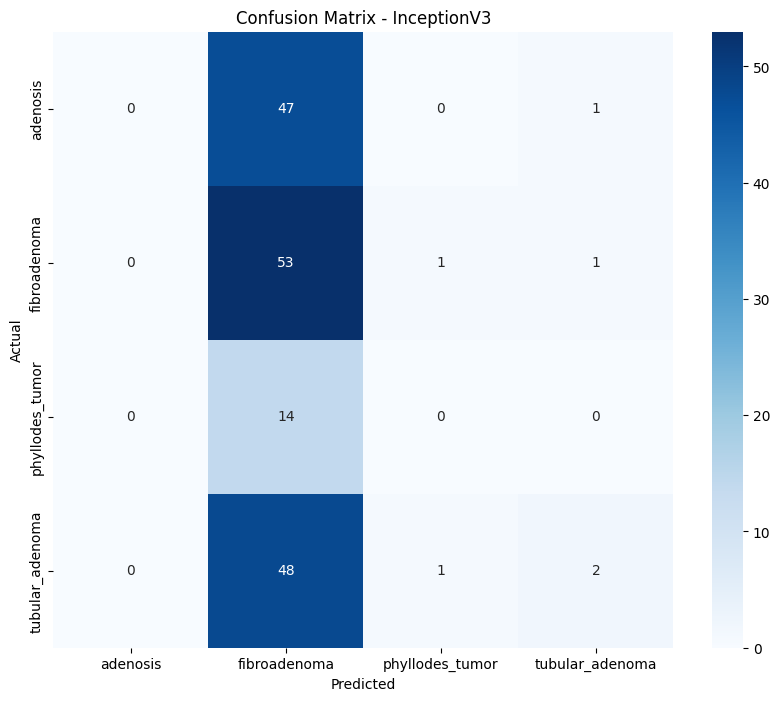


Classification Report - InceptionV3:

                 precision    recall  f1-score   support

       adenosis       0.00      0.00      0.00        48
   fibroadenoma       0.33      0.96      0.49        55
phyllodes_tumor       0.00      0.00      0.00        14
tubular_adenoma       0.50      0.04      0.07        51

       accuracy                           0.33       168
      macro avg       0.21      0.25      0.14       168
   weighted avg       0.26      0.33      0.18       168


----- Training InceptionResNetV2 -----


C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch 1/30
12/12 [==============================] - 66s 5s/step - loss: 1.2437 - accuracy: 0.4278 - val_loss: 1.1858 - val_accuracy: 0.5000
Epoch 2/30
12/12 [==============================] - 52s 4s/step - loss: 0.7734 - accuracy: 0.7030 - val_loss: 1.2222 - val_accuracy: 0.4886
Epoch 3/30
12/12 [==============================] - 51s 4s/step - loss: 0.3073 - accuracy: 0.9264 - val_loss: 1.2647 - val_accuracy: 0.4091
Epoch 4/30
12/12 [==============================] - 51s 4s/step - loss: 0.0940 - accuracy: 0.9809 - val_loss: 1.3392 - val_accuracy: 0.4091
Epoch 5/30
12/12 [==============================] - 51s 4s/step - loss: 0.0280 - accuracy: 0.9946 - val_loss: 1.4881 - val_accuracy: 0.4091
Epoch 6/30
6/6 [==============================] - 15s 2s/step


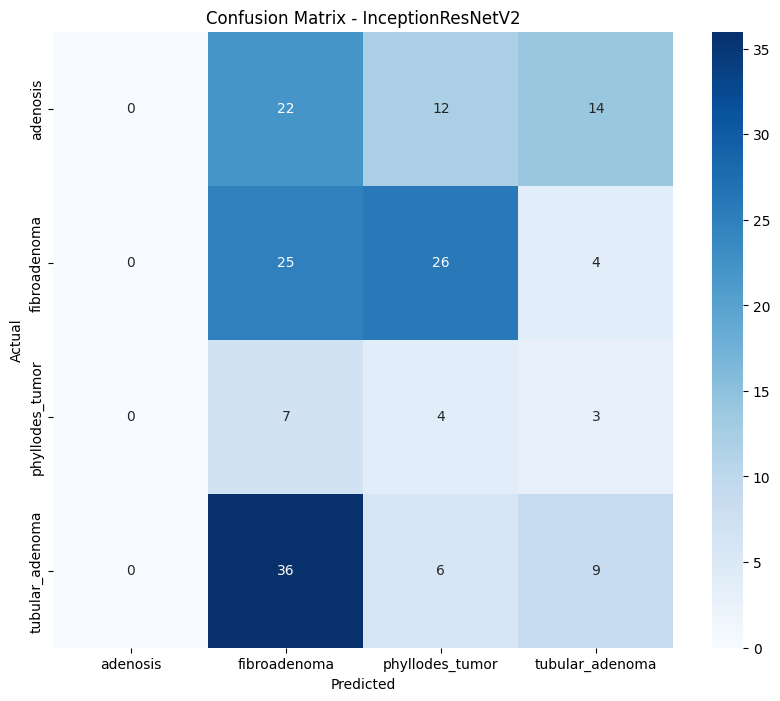


Classification Report - InceptionResNetV2:

                 precision    recall  f1-score   support

       adenosis       0.00      0.00      0.00        48
   fibroadenoma       0.28      0.45      0.34        55
phyllodes_tumor       0.08      0.29      0.13        14
tubular_adenoma       0.30      0.18      0.22        51

       accuracy                           0.23       168
      macro avg       0.17      0.23      0.17       168
   weighted avg       0.19      0.23      0.19       168


----- Training Xception -----


C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch 1/30
12/12 [==============================] - 68s 6s/step - loss: 1.2586 - accuracy: 0.4387 - val_loss: 1.2233 - val_accuracy: 0.4659
Epoch 2/30
12/12 [==============================] - 63s 5s/step - loss: 0.7857 - accuracy: 0.7493 - val_loss: 1.1737 - val_accuracy: 0.4659
Epoch 3/30
12/12 [==============================] - 64s 5s/step - loss: 0.4520 - accuracy: 0.9074 - val_loss: 1.0851 - val_accuracy: 0.4659
Epoch 4/30
12/12 [==============================] - 63s 5s/step - loss: 0.2118 - accuracy: 0.9782 - val_loss: 0.9433 - val_accuracy: 0.5000
Epoch 5/30
12/12 [==============================] - 63s 5s/step - loss: 0.0840 - accuracy: 0.9946 - val_loss: 1.0050 - val_accuracy: 0.4205
Epoch 6/30
12/12 [==============================] - 63s 5s/step - loss: 0.0396 - accuracy: 0.9973 - val_loss: 1.0748 - val_accuracy: 0.4545
Epoch 7/30
12/12 [==============================] - 63s 5s/step - loss: 0.0256 - accuracy: 0.9973 - val_loss: 1.1548 - val_accuracy: 0.4545
Epoch 8/30
12/12 [==

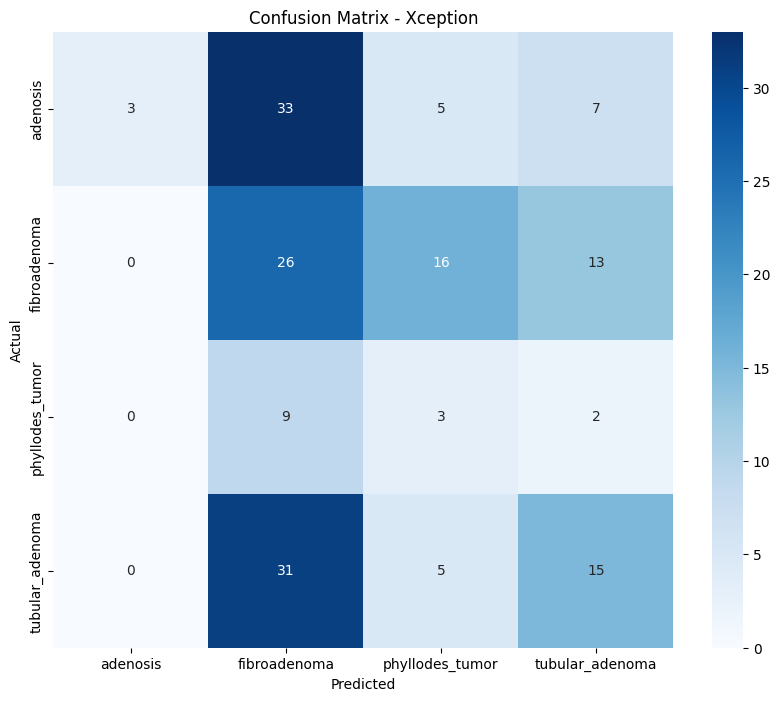


Classification Report - Xception:

                 precision    recall  f1-score   support

       adenosis       1.00      0.06      0.12        48
   fibroadenoma       0.26      0.47      0.34        55
phyllodes_tumor       0.10      0.21      0.14        14
tubular_adenoma       0.41      0.29      0.34        51

       accuracy                           0.28       168
      macro avg       0.44      0.26      0.23       168
   weighted avg       0.50      0.28      0.26       168



In [7]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3, InceptionResNetV2, Xception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------ Paths ------------------
train_dir = r"P:\BreaKHis_v1\200\data\train_b"
test_dir = r"P:\BreaKHis_v1\200\data\test_b"

# ------------------ Configuration ------------------
input_shape = (299, 299, 3)
batch_size = 32
epochs = 30

# ------------------ Data Generators ------------------
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

# Use one generator to get class names/length
num_classes = len(train_generator.class_indices)

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# ------------------ Model Building ------------------
def build_model(base_model, dropout=True, trainable_layers=100):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    if dropout:
        x = Dropout(0.5)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=output)

    # Freeze all layers
    for layer in base_model.layers:
        layer.trainable = False
    # Unfreeze last N layers
    for layer in base_model.layers[-trainable_layers:]:
        layer.trainable = True

    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# ------------------ Confusion Matrix Plot ------------------
def plot_confusion_matrix(model, generator, title):
    Y_pred = model.predict(generator, verbose=1)
    y_pred = np.argmax(Y_pred, axis=1)
    y_true = generator.classes
    class_names = list(generator.class_indices.keys())

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.title(f'Confusion Matrix - {title}')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

    print(f"\nClassification Report - {title}:\n")
    print(classification_report(y_true, y_pred, target_names=class_names))

# ------------------ Callbacks ------------------
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# ------------------ Training Section ------------------

# InceptionV3
print("\n----- Training InceptionV3 -----")
base_model_v3 = InceptionV3(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_v3 = build_model(base_model_v3, dropout=False, trainable_layers=100)
model_v3.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_v3, test_generator, title="InceptionV3")

# InceptionResNetV2
print("\n----- Training InceptionResNetV2 -----")
base_model_resnet = InceptionResNetV2(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_resnet = build_model(base_model_resnet, dropout=True, trainable_layers=150)
model_resnet.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_resnet, test_generator, title="InceptionResNetV2")

# Xception
print("\n----- Training Xception -----")
base_model_xception = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
model_xception = build_model(base_model_xception, dropout=True, trainable_layers=80)
model_xception.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_xception, test_generator, title="Xception")


Found 1133 images belonging to 2 classes.
Found 283 images belonging to 2 classes.
Found 597 images belonging to 2 classes.

Training InceptionV3...
Epoch 1/30
36/36 [==============================] - 126s 3s/step - loss: 0.4038 - accuracy: 0.8111 - val_loss: 0.8866 - val_accuracy: 0.7314
Epoch 2/30
36/36 [==============================] - 124s 3s/step - loss: 0.0764 - accuracy: 0.9771 - val_loss: 1.6440 - val_accuracy: 0.7102
Epoch 3/30
36/36 [==============================] - 124s 3s/step - loss: 0.0518 - accuracy: 0.9788 - val_loss: 2.1603 - val_accuracy: 0.6996
Epoch 4/30
36/36 [==============================] - 124s 3s/step - loss: 0.0434 - accuracy: 0.9876 - val_loss: 2.1239 - val_accuracy: 0.7102
Epoch 5/30
36/36 [==============================] - 121s 3s/step - loss: 0.0268 - accuracy: 0.9885 - val_loss: 1.4135 - val_accuracy: 0.7420
Epoch 6/30
19/19 [==============================] - 20s 1s/step


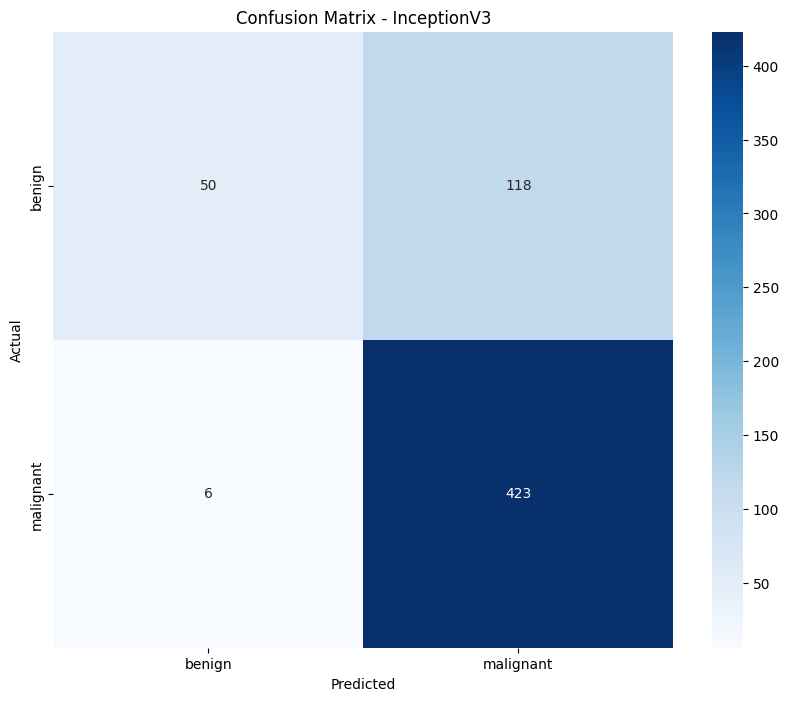

Classification Report - InceptionV3:

              precision    recall  f1-score   support

      benign       0.89      0.30      0.45       168
   malignant       0.78      0.99      0.87       429

    accuracy                           0.79       597
   macro avg       0.84      0.64      0.66       597
weighted avg       0.81      0.79      0.75       597


Training InceptionResNetV2...
Epoch 1/30
36/36 [==============================] - 372s 10s/step - loss: 0.5319 - accuracy: 0.7237 - val_loss: 1.7603 - val_accuracy: 0.6855
Epoch 2/30
36/36 [==============================] - 358s 10s/step - loss: 0.2502 - accuracy: 0.8914 - val_loss: 2.2450 - val_accuracy: 0.6820
Epoch 3/30
36/36 [==============================] - 368s 10s/step - loss: 0.0915 - accuracy: 0.9718 - val_loss: 1.9767 - val_accuracy: 0.7314
Epoch 4/30
36/36 [==============================] - 375s 10s/step - loss: 0.0583 - accuracy: 0.9771 - val_loss: 2.6396 - val_accuracy: 0.7032
Epoch 5/30
32/36 [==================

KeyboardInterrupt: 

In [1]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3, InceptionResNetV2, Xception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input, Lambda
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Paths
train_dir = r"P:\BreaKHis_v1\200\data\train"
test_dir = r"P:\BreaKHis_v1\200\data\test"

# Config
input_shape = (299, 299, 1)  # Grayscale input
batch_size = 32
epochs = 30
num_classes = len(os.listdir(train_dir))

# Data Generators
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    color_mode='grayscale',
    subset='training',
    shuffle=True
)
val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    color_mode='grayscale',
    subset='validation',
    shuffle=False
)

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    color_mode='grayscale',
    shuffle=False
)

# Confusion matrix function
def plot_confusion_matrix(model, generator, title):
    Y_pred = model.predict(generator)
    y_pred = np.argmax(Y_pred, axis=1)
    y_true = generator.classes
    class_names = list(generator.class_indices.keys())

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.title(f'Confusion Matrix - {title}')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

    print(f"Classification Report - {title}:\n")
    print(classification_report(y_true, y_pred, target_names=class_names))

# Build model function for grayscale input
def build_model(base_model_class, dropout=True, trainable_layers=100):
    grayscale_input = Input(shape=input_shape)
    x = Lambda(lambda x: tf.image.grayscale_to_rgb(x))(grayscale_input)  # Convert 1-channel to 3
    base_model = base_model_class(weights='imagenet', include_top=False, input_tensor=x)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    if dropout:
        x = Dropout(0.5)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=grayscale_input, outputs=output)

    # Freeze all layers
    for layer in model.layers:
        layer.trainable = False
    # Unfreeze last N layers
    for layer in model.layers[-trainable_layers:]:
        layer.trainable = True

    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Callback
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# ---- InceptionV3 ----
print("\nTraining InceptionV3...")
model_v3 = build_model(InceptionV3, dropout=False, trainable_layers=260)
model_v3.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_v3, test_generator, title="InceptionV3")

# ---- InceptionResNetV2 ----
print("\nTraining InceptionResNetV2...")
model_resnet = build_model(InceptionResNetV2, dropout=True, trainable_layers=720)
model_resnet.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_resnet, test_generator, title="InceptionResNetV2")

# ---- Xception ----
print("\nTraining Xception...")
model_xception = build_model(Xception, dropout=True, trainable_layers=115)
model_xception.fit(train_generator, epochs=epochs, validation_data=val_generator, callbacks=[early_stop])
plot_confusion_matrix(model_xception, test_generator, title="Xception")


In [8]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# Directories
train_dir = r"P:\BreaKHis_v1\200\train"
test_dir =  r"P:\BreaKHis_v1\200\test"

# Image dimensions
img_height, img_width = 224, 224  # Required input size for VGG16

# Data generators
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=20,
                                   width_shift_range=0.1,
                                   height_shift_range=0.1,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

# Load VGG16 without top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification layers
x = Flatten()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Train
model.fit(train_generator, epochs=100, validation_data=test_generator)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy:.2f}')


Found 1416 images belonging to 2 classes.
Found 597 images belonging to 2 classes.
Epoch 1/100
45/45 [==============================] - 125s 3s/step - loss: 0.6773 - accuracy: 0.6540 - val_loss: 0.5926 - val_accuracy: 0.7571
Epoch 2/100
45/45 [==============================] - 127s 3s/step - loss: 0.5940 - accuracy: 0.6857 - val_loss: 0.5547 - val_accuracy: 0.7605
Epoch 3/100
45/45 [==============================] - 125s 3s/step - loss: 0.5763 - accuracy: 0.6921 - val_loss: 0.5555 - val_accuracy: 0.7471
Epoch 4/100
45/45 [==============================] - 121s 3s/step - loss: 0.5394 - accuracy: 0.7196 - val_loss: 0.5295 - val_accuracy: 0.7655
Epoch 5/100
45/45 [==============================] - 123s 3s/step - loss: 0.5227 - accuracy: 0.7316 - val_loss: 0.5145 - val_accuracy: 0.7806
Epoch 6/100
45/45 [==============================] - 124s 3s/step - loss: 0.5105 - accuracy: 0.7366 - val_loss: 0.5218 - val_accuracy: 0.7705
Epoch 7/100
45/45 [==============================] - 125s 3s/step

Found 455 images belonging to 4 classes.
Found 168 images belonging to 4 classes.
Epoch 1/10
15/15 [==============================] - 46s 3s/step - loss: 1.3725 - accuracy: 0.3758 - val_loss: 1.3868 - val_accuracy: 0.3274 - lr: 1.0000e-04
Epoch 2/10
15/15 [==============================] - 47s 3s/step - loss: 1.1278 - accuracy: 0.4923 - val_loss: 1.2799 - val_accuracy: 0.4345 - lr: 1.0000e-04
Epoch 3/10
15/15 [==============================] - 47s 3s/step - loss: 1.0056 - accuracy: 0.5495 - val_loss: 1.2391 - val_accuracy: 0.5060 - lr: 1.0000e-04
Epoch 4/10
15/15 [==============================] - 48s 3s/step - loss: 0.9163 - accuracy: 0.6000 - val_loss: 1.3385 - val_accuracy: 0.4524 - lr: 1.0000e-04
Epoch 5/10
15/15 [==============================] - 48s 3s/step - loss: 0.8584 - accuracy: 0.5934 - val_loss: 1.3345 - val_accuracy: 0.4643 - lr: 1.0000e-04
Epoch 6/10
15/15 [==============================] - 47s 3s/step - loss: 0.8010 - accuracy: 0.6769 - val_loss: 1.4731 - val_accuracy: 

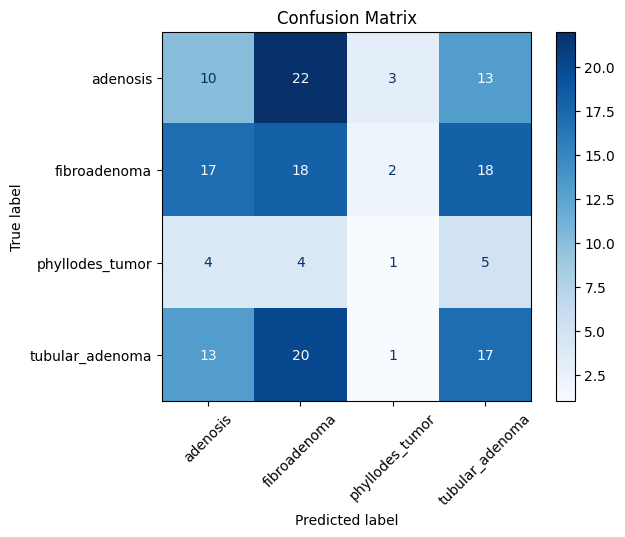

In [20]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Directories
train_dir = r"P:\BreaKHis_v1\200\train_benign"
test_dir =  r"P:\BreaKHis_v1\200\test_benign"

# Image dimensions
img_height, img_width = 224, 224  # Required input size for VGG16
num_classes = 4  # adenosis, ductal_carcinoma, ..., tubular_adenoma

# Data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'  # changed from 'binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'  # changed from 'binary'
)

# Load VGG16 without top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Unfreeze last 8 layers for fine-tuning
for layer in base_model.layers[:-4]:
    layer.trainable = False
for layer in base_model.layers[-4:]:
    layer.trainable = True

# Add custom classification layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)  # changed from 1/sigmoid

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

# Train
model.fit(
    train_generator,
    epochs=10,
    validation_data=test_generator,
    callbacks=[lr_scheduler]
)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy:.2f}')
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Get true labels and predictions
Y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Predict class probabilities
Y_pred_proba = model.predict(test_generator, verbose=1)
Y_pred = np.argmax(Y_pred_proba, axis=1)

# Compute confusion matrix
cm = confusion_matrix(Y_true, Y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title('Confusion Matrix')
plt.show()


In [19]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Directories
train_dir = r"P:\BreaKHis_v1\200\train_malignant"
test_dir =  r"P:\BreaKHis_v1\200\test_malignant"

# Image dimensions
img_height, img_width = 224, 224  # Required input size for VGG16
num_classes = 4  # adenosis, ductal_carcinoma, ..., tubular_adenoma

# Data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'  # changed from 'binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'  # changed from 'binary'
)

# Load VGG16 without top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Unfreeze last 8 layers for fine-tuning
for layer in base_model.layers[:-4]:
    layer.trainable = False
for layer in base_model.layers[-4:]:
    layer.trainable = True

# Add custom classification layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)  # changed from 1/sigmoid

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

# Train
model.fit(
    train_generator,
    epochs=100,
    validation_data=test_generator,
    callbacks=[lr_scheduler]
)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy:.2f}')


Found 961 images belonging to 4 classes.
Found 429 images belonging to 4 classes.
Epoch 1/100
31/31 [==============================] - 104s 3s/step - loss: 0.9785 - accuracy: 0.6701 - val_loss: 1.2814 - val_accuracy: 0.5524 - lr: 1.0000e-04
Epoch 2/100
31/31 [==============================] - 104s 3s/step - loss: 0.8694 - accuracy: 0.6805 - val_loss: 1.1981 - val_accuracy: 0.5221 - lr: 1.0000e-04
Epoch 3/100
31/31 [==============================] - 108s 4s/step - loss: 0.7835 - accuracy: 0.6961 - val_loss: 1.2480 - val_accuracy: 0.5128 - lr: 1.0000e-04
Epoch 4/100
31/31 [==============================] - 104s 3s/step - loss: 0.8025 - accuracy: 0.6701 - val_loss: 1.2297 - val_accuracy: 0.5478 - lr: 1.0000e-04
Epoch 5/100
31/31 [==============================] - 105s 3s/step - loss: 0.8281 - accuracy: 0.6764 - val_loss: 1.2085 - val_accuracy: 0.5431 - lr: 1.0000e-04
Epoch 6/100
31/31 [==============================] - 106s 3s/step - loss: 0.7488 - accuracy: 0.6857 - val_loss: 1.3002 - va

KeyboardInterrupt: 

Found 961 images belonging to 4 classes.
Found 429 images belonging to 4 classes.
Epoch 1/10
31/31 [==============================] - 103s 3s/step - loss: 1.0459 - accuracy: 0.6316 - val_loss: 1.3539 - val_accuracy: 0.5524 - lr: 1.0000e-04
Epoch 2/10
31/31 [==============================] - 101s 3s/step - loss: 0.9148 - accuracy: 0.6753 - val_loss: 1.2596 - val_accuracy: 0.5455 - lr: 1.0000e-04
Epoch 3/10
31/31 [==============================] - 105s 3s/step - loss: 0.8457 - accuracy: 0.6909 - val_loss: 1.3030 - val_accuracy: 0.5128 - lr: 1.0000e-04
Epoch 4/10
31/31 [==============================] - 106s 3s/step - loss: 0.7792 - accuracy: 0.7034 - val_loss: 1.3457 - val_accuracy: 0.4988 - lr: 1.0000e-04
Epoch 5/10
31/31 [==============================] - 106s 3s/step - loss: 0.7715 - accuracy: 0.6982 - val_loss: 1.3986 - val_accuracy: 0.5082 - lr: 1.0000e-04
Epoch 6/10
31/31 [==============================] - 106s 3s/step - loss: 0.7351 - accuracy: 0.7190 - val_loss: 1.3842 - val_accu

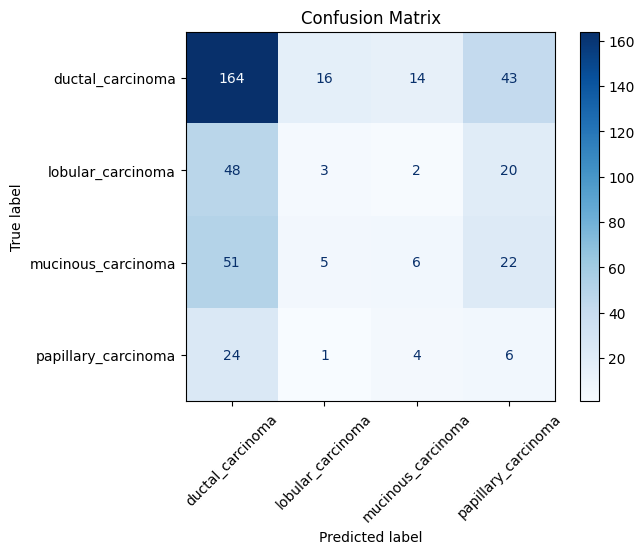

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Directories
train_dir = r"P:\BreaKHis_v1\200\train_malignant"
test_dir =  r"P:\BreaKHis_v1\200\test_malignant"

# Image dimensions
img_height, img_width = 224, 224  # Required input size for VGG16
num_classes = 4  # adenosis, ductal_carcinoma, ..., tubular_adenoma

# Data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'  # changed from 'binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'  # changed from 'binary'
)

# Load VGG16 without top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Unfreeze last 8 layers for fine-tuning
for layer in base_model.layers[:-4]:
    layer.trainable = False
for layer in base_model.layers[-4:]:
    layer.trainable = True

# Add custom classification layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)  # changed from 1/sigmoid

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

# Train
model.fit(
    train_generator,
    epochs=10,
    validation_data=test_generator,
    callbacks=[lr_scheduler]
)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy:.2f}')

# Get true labels and predictions
Y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Predict class probabilities
Y_pred_proba = model.predict(test_generator, verbose=1)
Y_pred = np.argmax(Y_pred_proba, axis=1)

# Compute confusion matrix
cm = confusion_matrix(Y_true, Y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title('Confusion Matrix')
plt.show()


In [15]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf

# Directories
train_dir = r"P:\BreaKHis_v1\200\data\train"
test_dir =  r"P:\BreaKHis_v1\200\data\test"

# Image dimensions
img_height, img_width = 224, 224
num_classes = 8

# Data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

print("Class indices:", train_generator.class_indices)

# Load EfficientNetB0
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Fine-tune last 20 layers
for layer in base_model.layers:
    layer.trainable = False
for layer in base_model.layers[-20:]:
    layer.trainable = True

# Classification head
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)

# Train
model.fit(
    train_generator,
    epochs=100,
    validation_data=test_generator,
    callbacks=[lr_scheduler, early_stop]
)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy (EfficientNetB0): {accuracy:.2f}')
# Get true labels and predictions
Y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Predict class probabilities
Y_pred_proba = model.predict(test_generator, verbose=1)
Y_pred = np.argmax(Y_pred_proba, axis=1)

# Compute confusion matrix
cm = confusion_matrix(Y_true, Y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title('Confusion Matrix')
plt.show()

Found 1416 images belonging to 8 classes.
Found 597 images belonging to 8 classes.
Class indices: {'adenosis': 0, 'ductal_carcinoma': 1, 'fibroadenoma': 2, 'lobular_carcinoma': 3, 'mucinous_carcinoma': 4, 'papillary_carcinoma': 5, 'phyllodes_tumor': 6, 'tubular_adenoma': 7}
Epoch 1/100
45/45 [==============================] - 43s 895ms/step - loss: 1.8004 - accuracy: 0.4364 - val_loss: 1.9854 - val_accuracy: 0.3970 - lr: 1.0000e-04
Epoch 2/100
45/45 [==============================] - 38s 842ms/step - loss: 1.7375 - accuracy: 0.4612 - val_loss: 1.9314 - val_accuracy: 0.3970 - lr: 1.0000e-04
Epoch 3/100
45/45 [==============================] - 38s 835ms/step - loss: 1.7194 - accuracy: 0.4633 - val_loss: 1.8863 - val_accuracy: 0.3970 - lr: 1.0000e-04
Epoch 4/100
45/45 [==============================] - 37s 826ms/step - loss: 1.7342 - accuracy: 0.4647 - val_loss: 1.8846 - val_accuracy: 0.3970 - lr: 1.0000e-04
Epoch 5/100
45/45 [==============================] - 38s 836ms/step - loss: 1.726

KeyboardInterrupt: 

Found 168 images belonging to 4 classes.
Found 455 images belonging to 4 classes.
Epoch 1/30
6/6 [==============================] - 45s 8s/step - loss: 1.4121 - accuracy: 0.3690 - val_loss: 1.3441 - val_accuracy: 0.3934 - lr: 1.0000e-04
Epoch 2/30
6/6 [==============================] - 44s 9s/step - loss: 1.0956 - accuracy: 0.5893 - val_loss: 1.4528 - val_accuracy: 0.3582 - lr: 1.0000e-04
Epoch 3/30
6/6 [==============================] - 42s 8s/step - loss: 0.7480 - accuracy: 0.7798 - val_loss: 1.5661 - val_accuracy: 0.4176 - lr: 1.0000e-04
Epoch 4/30
6/6 [==============================] - 46s 8s/step - loss: 0.5577 - accuracy: 0.7917 - val_loss: 1.7877 - val_accuracy: 0.4637 - lr: 1.0000e-04
Epoch 5/30
6/6 [==============================] - 43s 8s/step - loss: 0.3316 - accuracy: 0.8810 - val_loss: 2.1278 - val_accuracy: 0.4220 - lr: 1.0000e-04
Epoch 6/30
6/6 [==============================] - ETA: 0s - loss: 0.2734 - accuracy: 0.9107 
Epoch 6: ReduceLROnPlateau reducing learning rate 

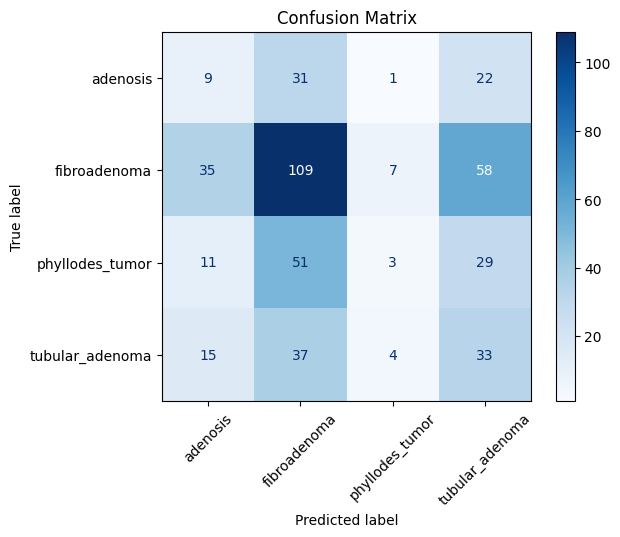

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Directories
train_dir = r"P:\BreaKHis_v1\200\data\test1\benign"
test_dir =  r"P:\BreaKHis_v1\200\data\train1\benign"

# Image dimensions
img_height, img_width = 224, 224  # Required input size for VGG16
num_classes = 4  # adenosis, ductal_carcinoma, ..., tubular_adenoma

# Data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'  # changed from 'binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'  # changed from 'binary'
)

# Load VGG16 without top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Unfreeze last 8 layers for fine-tuning
for layer in base_model.layers[:-4]:
    layer.trainable = False
for layer in base_model.layers[-4:]:
    layer.trainable = True

# Add custom classification layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)  # changed from 1/sigmoid

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

# Train
model.fit(
    train_generator,
    epochs=30,
    validation_data=test_generator,
    callbacks=[lr_scheduler]
)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy:.2f}')

# Get true labels and predictions
Y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Predict class probabilities
Y_pred_proba = model.predict(test_generator, verbose=1)
Y_pred = np.argmax(Y_pred_proba, axis=1)

# Compute confusion matrix
cm = confusion_matrix(Y_true, Y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title('Confusion Matrix')
plt.show()


Found 429 images belonging to 4 classes.
Found 961 images belonging to 4 classes.
Epoch 1/30
14/14 [==============================] - 106s 8s/step - loss: 1.1938 - accuracy: 0.5058 - val_loss: 0.9852 - val_accuracy: 0.6857 - lr: 1.0000e-04
Epoch 2/30
14/14 [==============================] - 98s 7s/step - loss: 1.0643 - accuracy: 0.5874 - val_loss: 1.0272 - val_accuracy: 0.6837 - lr: 1.0000e-04
Epoch 3/30
14/14 [==============================] - 96s 7s/step - loss: 0.9130 - accuracy: 0.6573 - val_loss: 1.0285 - val_accuracy: 0.6753 - lr: 1.0000e-04
Epoch 4/30
14/14 [==============================] - 94s 7s/step - loss: 0.7486 - accuracy: 0.6946 - val_loss: 1.1321 - val_accuracy: 0.6649 - lr: 1.0000e-04
Epoch 5/30
14/14 [==============================] - 96s 7s/step - loss: 0.6452 - accuracy: 0.7366 - val_loss: 1.2776 - val_accuracy: 0.6410 - lr: 1.0000e-04
Epoch 6/30
14/14 [==============================] - ETA: 0s - loss: 0.5359 - accuracy: 0.7902 
Epoch 6: ReduceLROnPlateau reducing l

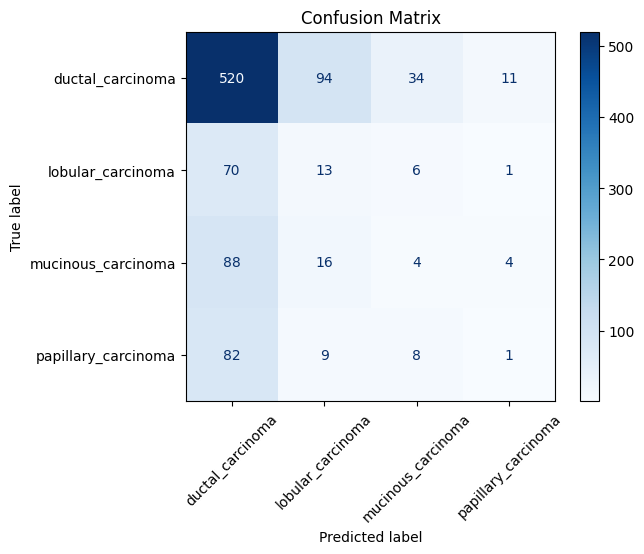

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Directories
train_dir = r"P:\BreaKHis_v1\200\data\test1\malignant"
test_dir =  r"P:\BreaKHis_v1\200\data\train1\malignant"

# Image dimensions
img_height, img_width = 224, 224  # Required input size for VGG16
num_classes = 4  # adenosis, ductal_carcinoma, ..., tubular_adenoma

# Data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'  # changed from 'binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'  # changed from 'binary'
)

# Load VGG16 without top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Unfreeze last 8 layers for fine-tuning
for layer in base_model.layers[:-4]:
    layer.trainable = False
for layer in base_model.layers[-4:]:
    layer.trainable = True

# Add custom classification layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)  # changed from 1/sigmoid

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

# Train
model.fit(
    train_generator,
    epochs=30,
    validation_data=test_generator,
    callbacks=[lr_scheduler]
)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy:.2f}')

# Get true labels and predictions
Y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Predict class probabilities
Y_pred_proba = model.predict(test_generator, verbose=1)
Y_pred = np.argmax(Y_pred_proba, axis=1)

# Compute confusion matrix
cm = confusion_matrix(Y_true, Y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title('Confusion Matrix')
plt.show()


In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf

# Directories
train_dir = r"P:\BreaKHis_v1\200\data\train"
test_dir =  r"P:\BreaKHis_v1\200\data\test"

# Image dimensions
img_height, img_width = 224, 224
num_classes = 8

# Data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

print("Class indices:", train_generator.class_indices)

# Load ResNet50
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Fine-tune last 20 layers
for layer in base_model.layers:
    layer.trainable = False
for layer in base_model.layers[-20:]:
    layer.trainable = True

# Classification head
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)

# Train
model.fit(
    train_generator,
    epochs=100,
    validation_data=test_generator,
    callbacks=[lr_scheduler, early_stop]
)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy (ResNet50): {accuracy:.2f}')


In [13]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Directories
train_dir = r"P:\BreaKHis_v1\200\train"
test_dir =  r"P:\BreaKHis_v1\200\test"

# Image dimensions
img_height, img_width = 224, 224  # Required input size for VGG16

# Data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

# Load VGG16 without top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Unfreeze last 8 layers for fine-tuning
for layer in base_model.layers[:-8]:
    layer.trainable = False
for layer in base_model.layers[-8:]:
    layer.trainable = True

# Add custom classification layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

# Train
model.fit(
    train_generator,
    epochs=100,
    validation_data=test_generator,
    callbacks=[lr_scheduler]
)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy:.2f}')


Found 1416 images belonging to 2 classes.
Found 597 images belonging to 2 classes.
Epoch 1/100
45/45 [==============================] - 201s 4s/step - loss: 0.6574 - accuracy: 0.6427 - val_loss: 0.5598 - val_accuracy: 0.7203 - lr: 1.0000e-04
Epoch 2/100
45/45 [==============================] - 204s 5s/step - loss: 0.5703 - accuracy: 0.6829 - val_loss: 0.5385 - val_accuracy: 0.7672 - lr: 1.0000e-04
Epoch 3/100
45/45 [==============================] - 215s 5s/step - loss: 0.5525 - accuracy: 0.7189 - val_loss: 0.5508 - val_accuracy: 0.7621 - lr: 1.0000e-04
Epoch 4/100
45/45 [==============================] - 219s 5s/step - loss: 0.5679 - accuracy: 0.7013 - val_loss: 0.6282 - val_accuracy: 0.7688 - lr: 1.0000e-04
Epoch 5/100
45/45 [==============================] - 208s 5s/step - loss: 0.4579 - accuracy: 0.7754 - val_loss: 0.5980 - val_accuracy: 0.7889 - lr: 1.0000e-04
Epoch 6/100
45/45 [==============================] - 210s 5s/step - loss: 0.4545 - accuracy: 0.7733 - val_loss: 0.5292 - v

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import tensorflow as tf

# Directory paths
train_dir = r"P:\BreaKHis_v1\200\train"
test_dir = r"P:\BreaKHis_v1\200\test"

# Data augmentation and image preprocessing
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.2,
    shear_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest',
    validation_split=0.02  # 2% of the training data for validation
)

# Train and validation generators
train_generation = datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',  # For binary classification
    subset='training',
    shuffle=True
)

val_generation = datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    subset='validation',
    shuffle=True
)

# Model architecture
cancer_model = Sequential([
    # Conv Block 1
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(pool_size=(2, 2)),

    # Conv Block 2
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),

    # Conv Block 3
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.4),

    # Conv Block 4
    Conv2D(256, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.2),

    # Dense layers
    Flatten(),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')  # Binary classification
])

# Model summary
cancer_model.summary()

# Learning rate schedule
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
    initial_learning_rate=0.001,
    decay_steps=20 * 50,  # Adjust as needed
    decay_rate=1,
    staircase=False
)

# Optimizer
def get_optimizer():
    return tf.keras.optimizers.Adam(learning_rate=lr_schedule)

# Compile the model
cancer_model.compile(
    optimizer=get_optimizer(),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint("Best_model.h5", save_best_only=True, monitor='val_loss', mode='min')

# Train the model
history = cancer_model.fit(
    train_generation,
    validation_data=val_generation,
    epochs=200,
    callbacks=[early_stop, checkpoint],
    verbose=1
)


Found 1388 images belonging to 2 classes.
Found 28 images belonging to 2 classes.
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_19 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 63, 63, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 63, 63, 64)        18496     
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 31, 31, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 31, 31, 128)       73856     
                                      

In [6]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# Directories
train_dir = r"P:\BreaKHis_v1\200\train"
test_dir =  r"P:\BreaKHis_v1\200\test"

# Image dimensions
img_height, img_width = 224, 224  # Required input size for VGG16

# Data generators
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=20,
                                   width_shift_range=0.1,
                                   height_shift_range=0.1,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

# Load VGG16 without top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification layers
x = Flatten()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Train
model.fit(train_generator, epochs=50, validation_data=test_generator)

# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {accuracy:.2f}')


Found 1416 images belonging to 2 classes.
Found 597 images belonging to 2 classes.
Epoch 1/50
45/45 [==============================] - 129s 3s/step - loss: 0.6839 - accuracy: 0.6328 - val_loss: 0.5640 - val_accuracy: 0.7236
Epoch 2/50
45/45 [==============================] - 135s 3s/step - loss: 0.6119 - accuracy: 0.6787 - val_loss: 0.5686 - val_accuracy: 0.7554
Epoch 3/50
45/45 [==============================] - 136s 3s/step - loss: 0.5774 - accuracy: 0.6822 - val_loss: 0.5296 - val_accuracy: 0.7437
Epoch 4/50
45/45 [==============================] - 136s 3s/step - loss: 0.5637 - accuracy: 0.6935 - val_loss: 0.5524 - val_accuracy: 0.7554
Epoch 5/50
45/45 [==============================] - 127s 3s/step - loss: 0.5517 - accuracy: 0.7041 - val_loss: 0.5455 - val_accuracy: 0.7521
Epoch 6/50
45/45 [==============================] - 129s 3s/step - loss: 0.5285 - accuracy: 0.7323 - val_loss: 0.5260 - val_accuracy: 0.7588
Epoch 7/50
45/45 [==============================] - 131s 3s/step - loss

In [4]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# Directories
train_dir = r"P:\BreaKHis_v1\200\train"
test_dir =  r"P:\BreaKHis_v1\200\test"

# Image dimensions
img_height, img_width = 224, 224  # ResNet50 input size

# Data generators with augmentation
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=20,
                                   width_shift_range=0.1,
                                   height_shift_range=0.1,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='binary'
)

# Load ResNet50 base model (no top)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)  # Binary output

model = Model(inputs=base_model.input, outputs=output)

# Compile model
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Train model
model.fit(train_generator, epochs=10, validation_data=test_generator)

# Evaluate model
loss, accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {accuracy:.2f}")


Found 1416 images belonging to 2 classes.
Found 597 images belonging to 2 classes.
Epoch 1/10
45/45 [==============================] - 86s 2s/step - loss: 0.7014 - accuracy: 0.6059 - val_loss: 0.6004 - val_accuracy: 0.7186
Epoch 2/10
45/45 [==============================] - 82s 2s/step - loss: 0.6685 - accuracy: 0.6469 - val_loss: 0.6022 - val_accuracy: 0.7186
Epoch 3/10
45/45 [==============================] - 83s 2s/step - loss: 0.6534 - accuracy: 0.6610 - val_loss: 0.6037 - val_accuracy: 0.7186
Epoch 4/10
45/45 [==============================] - 73s 2s/step - loss: 0.6416 - accuracy: 0.6667 - val_loss: 0.6063 - val_accuracy: 0.7186
Epoch 5/10
45/45 [==============================] - 68s 2s/step - loss: 0.6293 - accuracy: 0.6716 - val_loss: 0.6065 - val_accuracy: 0.7186
Epoch 6/10
45/45 [==============================] - 69s 2s/step - loss: 0.6195 - accuracy: 0.6674 - val_loss: 0.6076 - val_accuracy: 0.7186
Epoch 7/10
45/45 [==============================] - 71s 2s/step - loss: 0.627

In [5]:
# Unfreeze last few layers of VGG16
for layer in base_model.layers[-4:]:
    layer.trainable = True

# Recompile with a lower learning rate
model.compile(optimizer=Adam(learning_rate=1e-5), loss='binary_crossentropy', metrics=['accuracy'])

# Fine-tune
model.fit(train_generator, epochs=5, validation_data=test_generator)


Epoch 1/5
45/45 [==============================] - 71s 2s/step - loss: 0.6121 - accuracy: 0.6638 - val_loss: 0.6092 - val_accuracy: 0.7186
Epoch 2/5
45/45 [==============================] - 66s 1s/step - loss: 0.6112 - accuracy: 0.6780 - val_loss: 0.6112 - val_accuracy: 0.7186
Epoch 3/5
45/45 [==============================] - 66s 1s/step - loss: 0.6043 - accuracy: 0.6702 - val_loss: 0.6151 - val_accuracy: 0.7186
Epoch 4/5
45/45 [==============================] - 67s 1s/step - loss: 0.6035 - accuracy: 0.6744 - val_loss: 0.6163 - val_accuracy: 0.7186
Epoch 5/5
45/45 [==============================] - 67s 1s/step - loss: 0.5979 - accuracy: 0.6801 - val_loss: 0.6146 - val_accuracy: 0.7152


In [4]:
import tensorflow as tf
import os
import matplotlib.pyplot as plt
import numpy as np

# Define constants
IMG_SIZE = 224
BATCH_SIZE = 28
SEED = 42
train_dir = r"P:\BreaKHis_v1\200\train"
test_dir = r"P:\BreaKHis_v1\200\test"

# Load the datasets
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode="int",
    seed=SEED,
    validation_split=0.1,  # Split 10% of the data for validation
    subset="training"  # Specifies that this is the training subset
)

# Load the validation dataset from the same directory
valid_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode="int",
    seed=SEED,
    validation_split=0.1,  # Same split for validation
    subset="validation"  # Specifies that this is the validation subset
)

# Load the test dataset
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    test_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode="int",
    seed=SEED
)

# Access class names before caching and prefetching
class_names = train_ds.class_names
print("Class Names:", class_names)

# Cache and prefetch datasets for performance optimization
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
valid_ds = valid_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Data augmentation and model definition
custom_model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    tf.keras.layers.RandomBrightness(0.2, seed=SEED),
    tf.keras.layers.RandomFlip(seed=SEED),
    tf.keras.layers.RandomRotation(0.2, seed=SEED),
    # Convolutional block I
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(32, 3, activation="relu"),
    tf.keras.layers.MaxPooling2D(),
    # Convolutional block II
    tf.keras.layers.Conv2D(64, 3, activation="relu"),
    tf.keras.layers.MaxPooling2D(),
    # Convolutional block III
    tf.keras.layers.Conv2D(128, 3, activation="relu"),
    tf.keras.layers.MaxPooling2D(),
    # Fully connected layers
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Dense(256, activation="relu"),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(1, activation="sigmoid")
], name="CustomCNN")

custom_model.summary()

# Compile the model
custom_model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.BinaryCrossentropy(),
    metrics=["accuracy"]
)

# Fit the model
history = custom_model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=20
)


Found 1416 files belonging to 2 classes.
Using 1275 files for training.
Found 1416 files belonging to 2 classes.
Using 141 files for validation.
Found 597 files belonging to 2 classes.
Class Names: ['benign', 'malignant']
Model: "CustomCNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_brightness (RandomBr  (None, 224, 224, 3)      0         
 ightness)                                                       
                                                                 
 random_flip (RandomFlip)    (None, 224, 224, 3)       0         
                                                                 
 random_rotation (RandomRota  (None, 224, 224, 3)      0         
 tion)                                                           
                                                                 
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                 

In [ ]:
from fastai.vision import *

# Define the paths for training and testing datasets
train_dir = r"P:\BreaKHis_v1\200\train"
test_dir = r"P:\BreaKHis_v1\200\test"

# Prepare the data
data = (ImageList.from_folder(train_dir)  # Load images from the train directory
        .split_by_folder(valid="test")  # Use the 'test' folder as the validation set
        .label_from_folder()  # Label images based on folder names (e.g., benign, malignant)
        .transform(tfms=get_transforms(do_flip=True, flip_vert=True), size=224)  # Apply augmentation
        .databunch()  # Create a DataBunch object for training
        .normalize())  # Normalize the dataset

# Print class names and dataset sizes
print(data.classes)
print(f'Training data size: {len(data.train_ds)}')
print(f'Validation data size: {len(data.valid_ds)}')

# Show a batch of data
data.show_batch(rows=4, figsize=(10,10))

# Create a CNN learner with ResNet50 architecture
learn = cnn_learner(data, models.resnet50, metrics=accuracy)

# Find the optimal learning rate
learn.lr_find()
learn.recorder.plot()

# Train the model for 3 epochs
learn.fit_one_cycle(3, 1e-3)
learn.save("clas1")

# Display confusion matrix and top losses
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()
interp.plot_top_losses(9, figsize=(10,10))

# Unfreeze the model and further fine-tune it
learn.unfreeze()
learn.fit_one_cycle(3, 1e-6)
learn.recorder.plot_losses()

# Calculate predictions and accuracy
preds, y, loss = learn.get_preds(with_loss=True)
acc = accuracy(preds, y)
print(f'The accuracy is {acc*100}%.')


In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

#Getting the losses
loss = history.history['loss']
val_loss = history.history['val_loss']

#No of epochs it trained
epochs_range = history.epoch

#Plotting Training and Validation accuracy
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

#Plotting Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
#Loading the test data using Image Data Generator
test_gen = datagen.flow_from_directory("../Cancer_test/", target_size=(128,128), class_mode="binary", batch_size=1, shuffle=False)
pred = cancer_model.evaluate(test_gen)

Đã lưu biểu đồ tại: /kaggle/working/pie_class_distribution.png


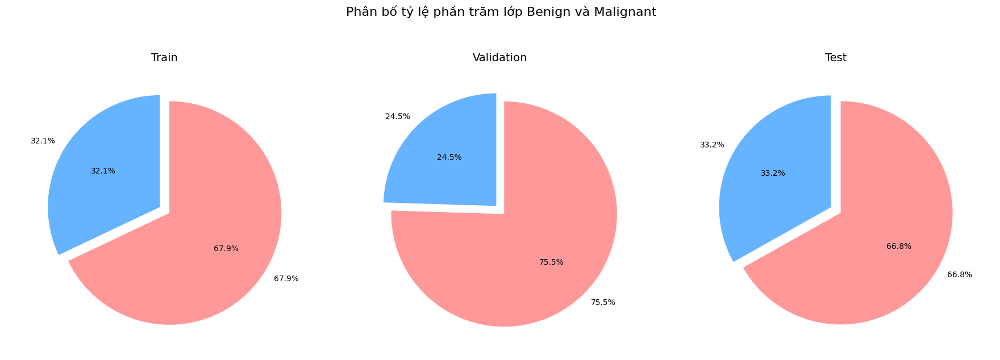

In [13]:
def plot_pie_class_distribution(train_labels, val_labels, test_labels, save_path=None):
    # Tính tỷ lệ phần trăm cho từng tập
    train_counts = np.bincount(train_labels)
    val_counts = np.bincount(val_labels)
    test_counts = np.bincount(test_labels)

    # Đảm bảo độ dài của counts là 2 (Benign và Malignant)
    if len(train_counts) < 2:
        train_counts = np.array([train_counts[0] if len(train_counts) > 0 else 0, 0])
    if len(val_counts) < 2:
        val_counts = np.array([val_counts[0] if len(val_counts) > 0 else 0, 0])
    if len(test_counts) < 2:
        test_counts = np.array([test_counts[0] if len(test_counts) > 0 else 0, 0])

    train_percentages = train_counts / train_counts.sum() * 100
    val_percentages = val_counts / val_counts.sum() * 100
    test_percentages = test_counts / test_counts.sum() * 100

    labels = ['Benign', 'Malignant']
    colors = ['#66b3ff', '#ff9999']  # Màu xanh nhạt cho Benign, hồng nhạt cho Malignant
    explode = (0.1, 0)  # Tách nhẹ lớp Benign để nổi bật

    # Tạo figure với 3 subplot nằm ngang
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

    # Biểu đồ cho Train
    ax1.pie(train_percentages, explode=explode, labels=[f'{p:.1f}%' for p in train_percentages], colors=colors, autopct='%1.1f%%', startangle=90)
    ax1.axis('equal')  # Đảm bảo biểu đồ tròn
    ax1.set_title('Train', fontsize=14)

    # Biểu đồ cho Validation
    ax2.pie(val_percentages, explode=explode, labels=[f'{p:.1f}%' for p in val_percentages], colors=colors, autopct='%1.1f%%', startangle=90)
    ax2.axis('equal')
    ax2.set_title('Validation', fontsize=14)

    # Biểu đồ cho Test
    ax3.pie(test_percentages, explode=explode, labels=[f'{p:.1f}%' for p in test_percentages], colors=colors, autopct='%1.1f%%', startangle=90)
    ax3.axis('equal')
    ax3.set_title('Test', fontsize=14)

    # Thêm tiêu đề chung và điều chỉnh layout
    fig.suptitle('Phân bố tỷ lệ phần trăm lớp Benign và Malignant', fontsize=16, y=1.05)
    plt.tight_layout()

    # Lưu biểu đồ nếu có đường dẫn
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Đã lưu biểu đồ tại: {save_path}")

    plt.show()

# Gọi hàm sau phần TẢI DỮ LIỆU VÀ TẠO DATASET
plot_pie_class_distribution(train_labels, val_labels, test_labels, save_path="/kaggle/working/pie_class_distribution.png")

In [14]:
strategy = tf.distribute.MirroredStrategy()
print("Running on GPU/CPU with MirroredStrategy")

# === 🔹 CẤU HÌNH HYPERPARAMETERS ===
# Hyperparameters cho Phase 1
PHASE_1_EPOCHS = 125  
LEARNING_RATE_PHASE_1 = 3e-4  
BATCH_SIZE = 16

# Hyperparameters cho Phase 2 (Fine-tuning)
PHASE_2_EPOCHS = 65  
LEARNING_RATE_PHASE_2 = 4e-5  
FINE_TUNE_AT = 205

# Đường dẫn lưu log và mô hình
LOGS_DIR = "/kaggle/working/logs"
if not os.path.exists(LOGS_DIR):
    os.makedirs(LOGS_DIR, exist_ok=True)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
Running on GPU/CPU with MirroredStrategy


In [15]:
from tensorflow.keras.utils import register_keras_serializable

@register_keras_serializable()

class F1Score(tf.keras.metrics.Metric):
    """
    Custom F1-score metric cho bài toán phân loại nhị phân.
    """
    def __init__(self, name='f1_score', threshold=0.5, **kwargs):
        super().__init__(name=name, **kwargs)
        self.threshold = threshold
        self.precision = tf.keras.metrics.Precision(thresholds=threshold)
        self.recall = tf.keras.metrics.Recall(thresholds=threshold)

    def update_state(self, y_true, y_pred, sample_weight=None):
        self.precision.update_state(y_true, y_pred, sample_weight)
        self.recall.update_state(y_true, y_pred, sample_weight)

    def result(self):
        p = self.precision.result()
        r = self.recall.result()
        return tf.where((p + r) > 0, 2 * (p * r) / (p + r), 0.0)

    def reset_states(self):
        self.precision.reset_states()
        self.recall.reset_states()

    def get_config(self):
        config = super().get_config()
        config.update({'threshold': self.threshold})
        return config

In [28]:
def count_trainable_params(model):
    """
    Đếm số tham số có thể huấn luyện trong mô hình.
    """
    return sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])

def build_model(input_shape=(299, 299, 1), num_classes=1, fine_tune_at=0, training=False):
    """
    Xây dựng mô hình phân loại nhị phân với InceptionResNetV2 làm base model.
    Args:
        input_shape: Kích thước đầu vào của ảnh (mặc định: 299x299x3).
        num_classes: Số lớp đầu ra (mặc định: 1 cho phân loại nhị phân).
        fine_tune_at: Số layer cuối của base model sẽ được mở khóa để fine-tune (0 nếu không fine-tune).
        training: Chế độ huấn luyện (True/False).
    Returns:
        model: Mô hình đã được xây dựng.
    """
    # Tải base model InceptionResNetV2 với trọng số ImageNet
    base_model = tf.keras.applications.InceptionResNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    
    # Đóng băng base model ban đầu
    base_model.trainable = False
    
    # Mở khóa các layer cuối nếu fine_tune_at > 0
    if fine_tune_at > 0:
        print(f"Mở khóa {fine_tune_at} lớp cuối của Base Model để fine-tune")
        base_model.trainable = True
        for layer in base_model.layers[:-fine_tune_at]:
            layer.trainable = False
        # Đóng băng các layer BatchNormalization để tránh vấn đề khi fine-tune
        for layer in base_model.layers:
            if isinstance(layer, tf.keras.layers.BatchNormalization):
                layer.trainable = False

    # Xây dựng mô hình
    inputs = tf.keras.Input(shape=input_shape)
    x = base_model(inputs, training=training)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    # Fully connected layers với regularization và dropout mạnh hơn
    x = tf.keras.layers.Dense(130, kernel_initializer='he_uniform', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
    x = tf.keras.layers.Dropout(0.5)(x)  

    x = tf.keras.layers.Dense(70, kernel_initializer='he_uniform', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
    x = tf.keras.layers.Dropout(0.4)(x)  

    # Lớp đầu ra cho phân loại nhị phân
    outputs = tf.keras.layers.Dense(num_classes, activation='sigmoid', dtype=tf.float32)(x)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

In [29]:
def convert_history_to_serializable(history_dict):
    """
    Chuyển đổi history sang định dạng có thể lưu dưới dạng JSON.
    """
    return {key: [float(v) for v in values] for key, values in history_dict.items()}

def save_history(history, filename):
    """
    Lưu history huấn luyện vào file JSON.
    """
    history_path = os.path.join(LOGS_DIR, filename)
    with open(history_path, 'w') as f:
        json.dump(convert_history_to_serializable(history.history), f)
    print(f"Đã lưu history vào {history_path}")

# Callback để lưu mô hình tốt nhất
checkpoint_callback = ModelCheckpoint(
    filepath="/kaggle/working/best_model.keras",
    monitor="accuracy",  
    save_best_only=True,
    save_weights_only=False,
    mode='max',
    verbose=1
)

# Callback giảm learning rate khi val_loss không cải thiện
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=9, 
    min_lr=1e-7,
    verbose=1
)

# Callback Cosine Decay để giảm learning rate dần
cosine_decay = tf.keras.callbacks.LearningRateScheduler(
    tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=LEARNING_RATE_PHASE_1,
        decay_steps=PHASE_1_EPOCHS * steps_per_epoch,
        alpha=0.0  # Giảm learning rate về 0
    )
)

# Callback TensorBoard để theo dõi huấn luyện
tensorboard_callback = TensorBoard(
    log_dir=LOGS_DIR,
    histogram_freq=1,
    write_graph=True,
    update_freq='epoch'
)

# Danh sách callback
callbacks_list_phase = [checkpoint_callback, lr_scheduler, cosine_decay, tensorboard_callback]

In [30]:
def train_model(model, train_data, val_data, class_weight_dict, phase, epochs, initial_lrate, validation_steps=None, fine_tune=False):
    """
    Hàm huấn luyện mô hình cho từng giai đoạn.
    Args:
        model: Mô hình cần huấn luyện.
        train_data: Dữ liệu huấn luyện (tf.data.Dataset).
        val_data: Dữ liệu validation (tf.data.Dataset).
        class_weight_dict: Trọng số lớp để xử lý mất cân bằng.
        phase: Giai đoạn huấn luyện (1 hoặc 2).
        epochs: Số epoch huấn luyện.
        initial_lrate: Learning rate ban đầu.
        validation_steps: Số bước validation mỗi epoch.
        fine_tune: Có fine-tune base model hay không.
    Returns:
        history: Lịch sử huấn luyện.
    """
    if train_data is None or val_data is None:
        raise ValueError("Dữ liệu huấn luyện hoặc validation không hợp lệ!")

    print(f"Huấn luyện mô hình - Giai đoạn {phase}...")

    # Compile mô hình bên trong strategy.scope()
    with strategy.scope():
        if fine_tune:
            base_model = None
            # Tìm base model InceptionResNetV2 trong các layer của mô hình
            for layer in model.layers:
                if isinstance(layer, tf.keras.Model) and layer.name == 'inception_resnet_v2':
                    base_model = layer
                    break
            if base_model is None:
                raise ValueError("Không tìm thấy InceptionResNetV2 trong mô hình!")

            # Mở khóa base model để fine-tune
            base_model.trainable = True
            print(f"Tổng số layer trong base model: {len(base_model.layers)}")
            # Đóng băng tất cả layer trừ FINE_TUNE_AT layer cuối
            for layer in base_model.layers[:-FINE_TUNE_AT]:
                layer.trainable = False
            # Đóng băng các layer BatchNormalization
            for layer in base_model.layers:
                if isinstance(layer, tf.keras.layers.BatchNormalization):
                    layer.trainable = False

            print(f"Tổng số tham số có thể train (Giai đoạn {phase}): {count_trainable_params(model):,}")
            model.summary()

        # Compile mô hình
        optimizer = tfa.optimizers.AdamW(
            learning_rate=initial_lrate,
            weight_decay=1e-4,
            clipnorm=0.5  # Thêm gradient clipping để tránh gradient bùng nổ
        )
        f1_score_metric = F1Score(threshold=0.5)
        model.compile(
            optimizer=optimizer,
            loss=tf.keras.losses.BinaryCrossentropy(label_smoothing=0.1),  # Tăng label smoothing để giảm overconfidence
            metrics=["accuracy", f1_score_metric],
            steps_per_execution=32
        )

    # Huấn luyện mô hình
    start_time = time.time()
    history = model.fit(
        train_data,
        validation_data=val_data,
        validation_steps=validation_steps,
        steps_per_epoch=steps_per_epoch,
        epochs=epochs,
        callbacks=callbacks_list_phase,
        class_weight=class_weight_dict,
        workers=4,
        use_multiprocessing=True,
        verbose=2
    )

    print(f"Thời gian huấn luyện giai đoạn {phase}: {(time.time() - start_time) / 60:.2f} phút")
    save_history(history, f"history_phase_{phase}.json")

    return history

In [31]:
# Phase 1: Huấn luyện với base model đóng băng
tf.keras.backend.clear_session()
with strategy.scope():
    model = build_model(training=False)
    print(f"Tổng số tham số có thể train (Giai đoạn 1): {count_trainable_params(model):,}")
    model.summary()

ValueError: The input must have 3 channels; Received `input_shape=(299, 299, 1)`

In [26]:
import tensorflow as tf

def convert_grayscale_to_rgb(image, label):
    image = tf.image.grayscale_to_rgb(image)  # Converts (299, 299, 1) → (299, 299, 3)
    return image, label

train_dataset = train_dataset.map(convert_grayscale_to_rgb)
val_dataset = val_dataset.map(convert_grayscale_to_rgb)


ValueError: in user code:

    File "C:\Users\pnryl\AppData\Local\Temp\ipykernel_6400\4142942624.py", line 4, in convert_grayscale_to_rgb  *
        image = tf.image.grayscale_to_rgb(image)  # Converts (299, 299, 1) → (299, 299, 3)

    ValueError: Last dimension of a grayscale image should be size 1.


In [23]:
print("="*80)
print("=== 🔹 BẮT ĐẦU HUẤN LUYỆN GIAI ĐOẠN 1 ===")
history_phase_1 = train_model(
    model=model,
    train_data=train_dataset,  # Sử dụng dataset từ phần trước
    val_data=val_dataset,
    class_weight_dict=class_weight_dict,
    phase=1,
    epochs=PHASE_1_EPOCHS,
    initial_lrate=LEARNING_RATE_PHASE_1,
    validation_steps=validation_steps,
    fine_tune=False
)

=== 🔹 BẮT ĐẦU HUẤN LUYỆN GIAI ĐOẠN 1 ===
Huấn luyện mô hình - Giai đoạn 1...
Epoch 1/125
INFO:tensorflow:Error reported to Coordinator: Exception encountered when calling layer "inception_resnet_v2" "                 f"(type Functional).

Input 0 of layer "conv2d" is incompatible with the layer: expected min_ndim=4, found ndim=3. Full shape received: (16, 299, 299)

Call arguments received by layer "inception_resnet_v2" "                 f"(type Functional):
  • inputs=tf.Tensor(shape=(16, 299, 299), dtype=float32)
  • training=False
  • mask=None
Traceback (most recent call last):
  File "C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\tensorflow\python\training\coordinator.py", line 293, in stop_on_exception
    yield
  File "C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\tensorflow\python\distribute\mirrored_run.py", line 386, in run
    self.main_result = self.main_fn(*self.main_args, **self.main_kwargs)
  File "C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\

ValueError: in user code:

    File "C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\keras\engine\training.py", line 1201, in train_function  *
        for _ in tf.range(self._steps_per_execution):

    ValueError: 'outputs' must be defined before the loop
    Note: AutoGraph tried to define it automatically, but ran into a ValueError: Exception encountered when calling layer "inception_resnet_v2" "                 f"(type Functional).
    
    Input 0 of layer "conv2d" is incompatible with the layer: expected min_ndim=4, found ndim=3. Full shape received: (16, 299, 299)
    
    Call arguments received by layer "inception_resnet_v2" "                 f"(type Functional):
      • inputs=tf.Tensor(shape=(16, 299, 299), dtype=float32)
      • training=False
      • mask=None


In [32]:
import os
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50, VGG16, VGG19, EfficientNetB0, DenseNet121
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet
from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_vgg
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_efficientnet
from tensorflow.keras.applications.densenet import preprocess_input as preprocess_densenet
import cv2
import pandas as pd  # For saving as CSV

# Load the models (without top layers)
model_resnet50 = ResNet50(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_vgg16 = VGG16(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_vgg19 = VGG19(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_efficientnet = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_densenet121 = DenseNet121(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))

# Function to convert grayscale to RGB
def convert_grayscale_to_rgb(img_gray):
    return np.repeat(img_gray[:, :, np.newaxis], 3, axis=2)

# Preprocessing functions for each model
def preprocess_image(img, model_name):
    img_rgb = convert_grayscale_to_rgb(img)
    img_resized = cv2.resize(img_rgb, (224, 224))
    img_expanded = np.expand_dims(img_resized, axis=0)  # Add batch dimension
    if model_name == 'resnet50':
        return preprocess_resnet(img_expanded)
    elif model_name == 'vgg16':
        return preprocess_vgg(img_expanded)
    elif model_name == 'vgg19':
        return preprocess_vgg(img_expanded)
    elif model_name == 'efficientnet':
        return preprocess_efficientnet(img_expanded)
    elif model_name == 'densenet121':
        return preprocess_densenet(img_expanded)
    else:
        raise ValueError("Unknown model name")

# Function to extract features from all images in a folder and save them as CSV
def extract_features_from_folder(folder_path, model_name='resnet50'):
    extracted_features = []
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]

    for img_file in image_files:
        img_path = os.path.join(folder_path, img_file)
        img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Load grayscale image

        # Preprocess the image and extract features
        img_preprocessed = preprocess_image(img_gray, model_name)
        if model_name == 'resnet50':
            features = model_resnet50.predict(img_preprocessed)
        elif model_name == 'vgg16':
            features = model_vgg16.predict(img_preprocessed)
        elif model_name == 'vgg19':
            features = model_vgg19.predict(img_preprocessed)
        elif model_name == 'efficientnet':
            features = model_efficientnet.predict(img_preprocessed)
        elif model_name == 'densenet121':
            features = model_densenet121.predict(img_preprocessed)
        else:
            raise ValueError("Unknown model name")
        
        extracted_features.append(features.flatten())  # Flatten the features into a 1D array

    # Convert the list of features into a numpy array
    extracted_features = np.array(extracted_features)

    # Save features to CSV
    df = pd.DataFrame(extracted_features)
    df.to_csv(os.path.join(folder_path, f'{model_name}_features.csv'), index=False)
    print(f'Features saved as {model_name}_features.csv')

    return extracted_features

# Example usage
folder_path = r'P:\BreaKHis_v1\200\train\benign'  # Replace with your folder path

# Extract features for a specific model (e.g., ResNet50)
resnet50_features = extract_features_from_folder(folder_path, model_name='resnet50')
print(resnet50_features.shape)  # Example output: (num_images, 2048)

# Extract features for other models as needed
vgg16_features = extract_features_from_folder(folder_path, model_name='vgg16')
vgg19_features = extract_features_from_folder(folder_path, model_name='vgg19')
efficientnet_features = extract_features_from_folder(folder_path, model_name='efficientnet')
densenet121_features = extract_features_from_folder(folder_path, model_name='densenet121')


1/1 [==============================] - 0s 87ms/step
Features saved as resnet50_features.csv
(455, 2048)
1/1 [==============================] - 0s 106ms/step
Features saved as vgg16_features.csv
1/1 [==============================] - 0s 113ms/step
Features saved as vgg19_features.csv
1/1 [==============================] - 0s 58ms/step
Features saved as efficientnet_features.csv
1/1 [==============================] - 0s 128ms/step
Features saved as densenet121_features.csv


In [33]:
import os
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50, VGG16, VGG19, EfficientNetB0, DenseNet121
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet
from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_vgg
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_efficientnet
from tensorflow.keras.applications.densenet import preprocess_input as preprocess_densenet
import cv2
import pandas as pd  # For saving as CSV

# Load the models (without top layers)
model_resnet50 = ResNet50(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_vgg16 = VGG16(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_vgg19 = VGG19(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_efficientnet = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_densenet121 = DenseNet121(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))

# Function to convert grayscale to RGB
def convert_grayscale_to_rgb(img_gray):
    return np.repeat(img_gray[:, :, np.newaxis], 3, axis=2)

# Preprocessing functions for each model
def preprocess_image(img, model_name):
    img_rgb = convert_grayscale_to_rgb(img)
    img_resized = cv2.resize(img_rgb, (224, 224))
    img_expanded = np.expand_dims(img_resized, axis=0)  # Add batch dimension
    if model_name == 'resnet50':
        return preprocess_resnet(img_expanded)
    elif model_name == 'vgg16':
        return preprocess_vgg(img_expanded)
    elif model_name == 'vgg19':
        return preprocess_vgg(img_expanded)
    elif model_name == 'efficientnet':
        return preprocess_efficientnet(img_expanded)
    elif model_name == 'densenet121':
        return preprocess_densenet(img_expanded)
    else:
        raise ValueError("Unknown model name")

# Function to extract features from all images in a folder and save them as CSV
def extract_features_from_folder(folder_path, model_name='resnet50'):
    extracted_features = []
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]

    for img_file in image_files:
        img_path = os.path.join(folder_path, img_file)
        img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Load grayscale image

        # Preprocess the image and extract features
        img_preprocessed = preprocess_image(img_gray, model_name)
        if model_name == 'resnet50':
            features = model_resnet50.predict(img_preprocessed)
        elif model_name == 'vgg16':
            features = model_vgg16.predict(img_preprocessed)
        elif model_name == 'vgg19':
            features = model_vgg19.predict(img_preprocessed)
        elif model_name == 'efficientnet':
            features = model_efficientnet.predict(img_preprocessed)
        elif model_name == 'densenet121':
            features = model_densenet121.predict(img_preprocessed)
        else:
            raise ValueError("Unknown model name")
        
        extracted_features.append(features.flatten())  # Flatten the features into a 1D array

    # Convert the list of features into a numpy array
    extracted_features = np.array(extracted_features)

    # Save features to CSV
    df = pd.DataFrame(extracted_features)
    df.to_csv(os.path.join(folder_path, f'{model_name}_features.csv'), index=False)
    print(f'Features saved as {model_name}_features.csv')

    return extracted_features

# Example usage
folder_path = r'P:\BreaKHis_v1\200\train\malignant'  # Replace with your folder path

# Extract features for a specific model (e.g., ResNet50)
resnet50_features = extract_features_from_folder(folder_path, model_name='resnet50')
print(resnet50_features.shape)  # Example output: (num_images, 2048)

# Extract features for other models as needed
vgg16_features = extract_features_from_folder(folder_path, model_name='vgg16')
vgg19_features = extract_features_from_folder(folder_path, model_name='vgg19')
efficientnet_features = extract_features_from_folder(folder_path, model_name='efficientnet')
densenet121_features = extract_features_from_folder(folder_path, model_name='densenet121')


1/1 [==============================] - 0s 134ms/step
Features saved as resnet50_features.csv
(961, 2048)
1/1 [==============================] - 0s 130ms/step
Features saved as vgg16_features.csv
1/1 [==============================] - 0s 148ms/step
Features saved as vgg19_features.csv
1/1 [==============================] - 0s 124ms/step
Features saved as efficientnet_features.csv
1/1 [==============================] - 0s 367ms/step
Features saved as densenet121_features.csv


In [34]:
import os
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50, VGG16, VGG19, EfficientNetB0, DenseNet121
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet
from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_vgg
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_efficientnet
from tensorflow.keras.applications.densenet import preprocess_input as preprocess_densenet
import cv2
import pandas as pd  # For saving as CSV

# Load the models (without top layers)
model_resnet50 = ResNet50(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_vgg16 = VGG16(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_vgg19 = VGG19(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_efficientnet = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_densenet121 = DenseNet121(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))

# Function to convert grayscale to RGB
def convert_grayscale_to_rgb(img_gray):
    return np.repeat(img_gray[:, :, np.newaxis], 3, axis=2)

# Preprocessing functions for each model
def preprocess_image(img, model_name):
    img_rgb = convert_grayscale_to_rgb(img)
    img_resized = cv2.resize(img_rgb, (224, 224))
    img_expanded = np.expand_dims(img_resized, axis=0)  # Add batch dimension
    if model_name == 'resnet50':
        return preprocess_resnet(img_expanded)
    elif model_name == 'vgg16':
        return preprocess_vgg(img_expanded)
    elif model_name == 'vgg19':
        return preprocess_vgg(img_expanded)
    elif model_name == 'efficientnet':
        return preprocess_efficientnet(img_expanded)
    elif model_name == 'densenet121':
        return preprocess_densenet(img_expanded)
    else:
        raise ValueError("Unknown model name")

# Function to extract features from all images in a folder and save them as CSV
def extract_features_from_folder(folder_path, model_name='resnet50'):
    extracted_features = []
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]

    for img_file in image_files:
        img_path = os.path.join(folder_path, img_file)
        img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Load grayscale image

        # Preprocess the image and extract features
        img_preprocessed = preprocess_image(img_gray, model_name)
        if model_name == 'resnet50':
            features = model_resnet50.predict(img_preprocessed)
        elif model_name == 'vgg16':
            features = model_vgg16.predict(img_preprocessed)
        elif model_name == 'vgg19':
            features = model_vgg19.predict(img_preprocessed)
        elif model_name == 'efficientnet':
            features = model_efficientnet.predict(img_preprocessed)
        elif model_name == 'densenet121':
            features = model_densenet121.predict(img_preprocessed)
        else:
            raise ValueError("Unknown model name")
        
        extracted_features.append(features.flatten())  # Flatten the features into a 1D array

    # Convert the list of features into a numpy array
    extracted_features = np.array(extracted_features)

    # Save features to CSV
    df = pd.DataFrame(extracted_features)
    df.to_csv(os.path.join(folder_path, f'{model_name}_features.csv'), index=False)
    print(f'Features saved as {model_name}_features.csv')

    return extracted_features

# Example usage
folder_path = r'P:\BreaKHis_v1\200\test\benign'  # Replace with your folder path

# Extract features for a specific model (e.g., ResNet50)
resnet50_features = extract_features_from_folder(folder_path, model_name='resnet50')
print(resnet50_features.shape)  # Example output: (num_images, 2048)

# Extract features for other models as needed
vgg16_features = extract_features_from_folder(folder_path, model_name='vgg16')
vgg19_features = extract_features_from_folder(folder_path, model_name='vgg19')
efficientnet_features = extract_features_from_folder(folder_path, model_name='efficientnet')
densenet121_features = extract_features_from_folder(folder_path, model_name='densenet121')


1/1 [==============================] - 0s 316ms/step
Features saved as resnet50_features.csv
(168, 2048)
1/1 [==============================] - 0s 270ms/step
Features saved as vgg16_features.csv
1/1 [==============================] - 0s 339ms/step
Features saved as vgg19_features.csv
1/1 [==============================] - 0s 158ms/step
Features saved as efficientnet_features.csv
1/1 [==============================] - 0s 392ms/step
Features saved as densenet121_features.csv


In [35]:
import os
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50, VGG16, VGG19, EfficientNetB0, DenseNet121
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet
from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_vgg
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_efficientnet
from tensorflow.keras.applications.densenet import preprocess_input as preprocess_densenet
import cv2
import pandas as pd  # For saving as CSV

# Load the models (without top layers)
model_resnet50 = ResNet50(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_vgg16 = VGG16(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_vgg19 = VGG19(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_efficientnet = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))
model_densenet121 = DenseNet121(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))

# Function to convert grayscale to RGB
def convert_grayscale_to_rgb(img_gray):
    return np.repeat(img_gray[:, :, np.newaxis], 3, axis=2)

# Preprocessing functions for each model
def preprocess_image(img, model_name):
    img_rgb = convert_grayscale_to_rgb(img)
    img_resized = cv2.resize(img_rgb, (224, 224))
    img_expanded = np.expand_dims(img_resized, axis=0)  # Add batch dimension
    if model_name == 'resnet50':
        return preprocess_resnet(img_expanded)
    elif model_name == 'vgg16':
        return preprocess_vgg(img_expanded)
    elif model_name == 'vgg19':
        return preprocess_vgg(img_expanded)
    elif model_name == 'efficientnet':
        return preprocess_efficientnet(img_expanded)
    elif model_name == 'densenet121':
        return preprocess_densenet(img_expanded)
    else:
        raise ValueError("Unknown model name")

# Function to extract features from all images in a folder and save them as CSV
def extract_features_from_folder(folder_path, model_name='resnet50'):
    extracted_features = []
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]

    for img_file in image_files:
        img_path = os.path.join(folder_path, img_file)
        img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Load grayscale image

        # Preprocess the image and extract features
        img_preprocessed = preprocess_image(img_gray, model_name)
        if model_name == 'resnet50':
            features = model_resnet50.predict(img_preprocessed)
        elif model_name == 'vgg16':
            features = model_vgg16.predict(img_preprocessed)
        elif model_name == 'vgg19':
            features = model_vgg19.predict(img_preprocessed)
        elif model_name == 'efficientnet':
            features = model_efficientnet.predict(img_preprocessed)
        elif model_name == 'densenet121':
            features = model_densenet121.predict(img_preprocessed)
        else:
            raise ValueError("Unknown model name")
        
        extracted_features.append(features.flatten())  # Flatten the features into a 1D array

    # Convert the list of features into a numpy array
    extracted_features = np.array(extracted_features)

    # Save features to CSV
    df = pd.DataFrame(extracted_features)
    df.to_csv(os.path.join(folder_path, f'{model_name}_features.csv'), index=False)
    print(f'Features saved as {model_name}_features.csv')

    return extracted_features
# Example usage
folder_path = r'P:\BreaKHis_v1\200\test\malignant'  # Replace with your folder path

# Extract features for a specific model (e.g., ResNet50)
resnet50_features = extract_features_from_folder(folder_path, model_name='resnet50')
print(resnet50_features.shape)  # Example output: (num_images, 2048)

# Extract features for other models as needed
vgg16_features = extract_features_from_folder(folder_path, model_name='vgg16')
vgg19_features = extract_features_from_folder(folder_path, model_name='vgg19')
efficientnet_features = extract_features_from_folder(folder_path, model_name='efficientnet')
densenet121_features = extract_features_from_folder(folder_path, model_name='densenet121')


1/1 [==============================] - 0s 356ms/step
Features saved as resnet50_features.csv
(429, 2048)
1/1 [==============================] - 0s 341ms/step
Features saved as vgg16_features.csv
1/1 [==============================] - 0s 401ms/step
Features saved as vgg19_features.csv
1/1 [==============================] - 0s 195ms/step
Features saved as efficientnet_features.csv
1/1 [==============================] - 0s 493ms/step
Features saved as densenet121_features.csv


In [20]:
def add_channel_and_convert_to_rgb(image, label):
    image = tf.expand_dims(image, -1)               # (299, 299) → (299, 299, 1)
    image = tf.image.grayscale_to_rgb(image)        # (299, 299, 1) → (299, 299, 3)
    return image, label

train_dataset = train_dataset.map(add_channel_and_convert_to_rgb)
val_dataset = val_dataset.map(add_channel_and_convert_to_rgb)


In [32]:
print("="*80)
print("=== 🔹 BẮT ĐẦU HUẤN LUYỆN GIAI ĐOẠN 1 ===")
history_phase_1 = train_model(
    model=model,
    train_data=train_dataset,  # Sử dụng dataset từ phần trước
    val_data=val_dataset,
    class_weight_dict=class_weight_dict,
    phase=1,
    epochs=PHASE_1_EPOCHS,
    initial_lrate=LEARNING_RATE_PHASE_1,
    validation_steps=validation_steps,
    fine_tune=False
)

=== 🔹 BẮT ĐẦU HUẤN LUYỆN GIAI ĐOẠN 1 ===
Huấn luyện mô hình - Giai đoạn 1...
Epoch 1/125


C:\Users\pnryl\anaconda3\envs\tf_env\lib\site-packages\keras\engine\training.py:2319: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 1: accuracy improved from -inf to 0.97500, saving model to /kaggle/working\best_model.keras
80/80 - 438s - loss: 0.4757 - accuracy: 0.9750 - f1_score: 0.0000e+00 - val_loss: 4.1579 - val_accuracy: 0.2560 - val_f1_score: 0.0000e+00 - lr: 3.0000e-04 - 438s/epoch - 5s/step
Epoch 2/125

Epoch 2: accuracy improved from 0.97500 to 1.00000, saving model to /kaggle/working\best_model.keras
80/80 - 457s - loss: 0.3096 - accuracy: 1.0000 - f1_score: 0.0000e+00 - val_loss: 4.0052 - val_accuracy: 0.2560 - val_f1_score: 0.0000e+00 - lr: 3.0000e-04 - 457s/epoch - 6s/step
Epoch 3/125


KeyboardInterrupt: 

In [31]:
import tensorflow as tf

# Set up MirroredStrategy for distributed training
strategy = tf.distribute.MirroredStrategy()

# Create and compile the model inside the strategy scope
with strategy.scope():
    model = create_grayscale_inceptionresnetv2(input_shape=(299, 299, 1))

    # Compile the model
    optimizer = tfa.optimizers.AdamW(
        learning_rate=3e-4,
        weight_decay=1e-4,
        clipnorm=0.5
    )
    f1_score_metric = F1Score(threshold=0.5)
    model.compile(
        optimizer=optimizer,
        loss=tf.keras.losses.BinaryCrossentropy(label_smoothing=0.1),  # Example loss
        metrics=["accuracy", f1_score_metric],
        steps_per_execution=32
    )


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)


In [29]:
strategy = tf.distribute.MirroredStrategy()
print("Running on GPU/CPU with MirroredStrategy")

# === 🔹 CẤU HÌNH HYPERPARAMETERS ===
# Hyperparameters cho Phase 1
PHASE_1_EPOCHS = 125  
LEARNING_RATE_PHASE_1 = 3e-4  
BATCH_SIZE = 16

# Hyperparameters cho Phase 2 (Fine-tuning)
PHASE_2_EPOCHS = 65  
LEARNING_RATE_PHASE_2 = 4e-5  
FINE_TUNE_AT = 205

# Đường dẫn lưu log và mô hình
LOGS_DIR = "/kaggle/working/logs"
if not os.path.exists(LOGS_DIR):
    os.makedirs(LOGS_DIR, exist_ok=True)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
Running on GPU/CPU with MirroredStrategy


In [26]:
from tensorflow.keras import layers, models
from tensorflow.keras.applications import InceptionResNetV2

def create_grayscale_inceptionresnetv2(input_shape=(299, 299, 1)):
    # Input layer for grayscale images
    input_layer = layers.Input(shape=input_shape)

    # Convert grayscale to 3 channels (RGB-like)
    x = layers.Conv2D(3, (1, 1), padding='same')(input_layer)  # Adds 2 additional channels

    # Use InceptionResNetV2 as base without the top layers
    base_model = InceptionResNetV2(include_top=False, weights='imagenet', input_shape=(299, 299, 3))

    # Pass the output of Conv2D to the base model
    x = base_model(x)

    # Freeze the pre-trained model layers to prevent weight loading issues
    base_model.trainable = False  # Freeze the base model

    # Add classification head (you can adjust this for your problem)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(1, activation='sigmoid')(x)  # Binary classification (change for multi-class)

    # Create the final model
    model = models.Model(inputs=input_layer, outputs=x)
    return model

# Create model with grayscale input
model = create_grayscale_inceptionresnetv2(input_shape=(299, 299, 1))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [17]:
tf.keras.backend.clear_session()
with strategy.scope():
    model = build_model(training=False)
    print(f"Tổng số tham số có thể train (Giai đoạn 1): {count_trainable_params(model):,}")
    model.summary()

Tổng số tham số có thể train (Giai đoạn 1): 209,451
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 inception_resnet_v2 (Functi  (None, 8, 8, 1536)       54336736  
 onal)                                                           
                                                                 
 global_average_pooling2d (G  (None, 1536)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 130)               199810    
                                                                 
 batch_normalization_203 (Ba  (None, 130)              520       
 tchNormalization)                                               
         

In [15]:
def convert_history_to_serializable(history_dict):
    """
    Chuyển đổi history sang định dạng có thể lưu dưới dạng JSON.
    """
    return {key: [float(v) for v in values] for key, values in history_dict.items()}

def save_history(history, filename):
    """
    Lưu history huấn luyện vào file JSON.
    """
    history_path = os.path.join(LOGS_DIR, filename)
    with open(history_path, 'w') as f:
        json.dump(convert_history_to_serializable(history.history), f)
    print(f"Đã lưu history vào {history_path}")

# Callback để lưu mô hình tốt nhất
checkpoint_callback = ModelCheckpoint(
    filepath="/kaggle/working/best_model.keras",
    monitor="accuracy",  
    save_best_only=True,
    save_weights_only=False,
    mode='max',
    verbose=1
)

# Callback giảm learning rate khi val_loss không cải thiện
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=9, 
    min_lr=1e-7,
    verbose=1
)

# Callback Cosine Decay để giảm learning rate dần
cosine_decay = tf.keras.callbacks.LearningRateScheduler(
    tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=LEARNING_RATE_PHASE_1,
        decay_steps=PHASE_1_EPOCHS * steps_per_epoch,
        alpha=0.0  # Giảm learning rate về 0
    )
)

# Callback TensorBoard để theo dõi huấn luyện
tensorboard_callback = TensorBoard(
    log_dir=LOGS_DIR,
    histogram_freq=1,
    write_graph=True,
    update_freq='epoch'
)

# Danh sách callback
callbacks_list_phase = [checkpoint_callback, lr_scheduler, cosine_decay, tensorboard_callback]

In [14]:
# === 2️⃣ XÂY DỰNG MÔ HÌNH ===
def count_trainable_params(model):
    """
    Đếm số tham số có thể huấn luyện trong mô hình.
    """
    return sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])

def build_model(input_shape=(299, 299, 3), num_classes=1, fine_tune_at=0, training=False):
    """
    Xây dựng mô hình phân loại nhị phân với InceptionResNetV2 làm base model.
    Args:
        input_shape: Kích thước đầu vào của ảnh (mặc định: 299x299x3).
        num_classes: Số lớp đầu ra (mặc định: 1 cho phân loại nhị phân).
        fine_tune_at: Số layer cuối của base model sẽ được mở khóa để fine-tune (0 nếu không fine-tune).
        training: Chế độ huấn luyện (True/False).
    Returns:
        model: Mô hình đã được xây dựng.
    """
    # Tải base model InceptionResNetV2 với trọng số ImageNet
    base_model = tf.keras.applications.InceptionResNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    
    # Đóng băng base model ban đầu
    base_model.trainable = False
    
    # Mở khóa các layer cuối nếu fine_tune_at > 0
    if fine_tune_at > 0:
        print(f"Mở khóa {fine_tune_at} lớp cuối của Base Model để fine-tune")
        base_model.trainable = True
        for layer in base_model.layers[:-fine_tune_at]:
            layer.trainable = False
        # Đóng băng các layer BatchNormalization để tránh vấn đề khi fine-tune
        for layer in base_model.layers:
            if isinstance(layer, tf.keras.layers.BatchNormalization):
                layer.trainable = False

    # Xây dựng mô hình
    inputs = tf.keras.Input(shape=input_shape)
    x = base_model(inputs, training=training)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    # Fully connected layers với regularization và dropout mạnh hơn
    x = tf.keras.layers.Dense(130, kernel_initializer='he_uniform', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
    x = tf.keras.layers.Dropout(0.5)(x)  

    x = tf.keras.layers.Dense(70, kernel_initializer='he_uniform', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
    x = tf.keras.layers.Dropout(0.4)(x)  

    # Lớp đầu ra cho phân loại nhị phân
    outputs = tf.keras.layers.Dense(num_classes, activation='sigmoid', dtype=tf.float32)(x)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

In [36]:
# === 🔹 STRATEGY (Multi-GPU/TPU) ===
strategy = tf.distribute.MirroredStrategy()
print("Running on GPU/CPU with MirroredStrategy")

# === 🔹 CẤU HÌNH HYPERPARAMETERS ===
# Hyperparameters cho Phase 1
PHASE_1_EPOCHS = 125  
LEARNING_RATE_PHASE_1 = 3e-4  
BATCH_SIZE = 16

# Hyperparameters cho Phase 2 (Fine-tuning)
PHASE_2_EPOCHS = 65  
LEARNING_RATE_PHASE_2 = 4e-5  
FINE_TUNE_AT = 205

LOGS_DIR = "./logs"  # Or a specific path you prefer
if not os.path.exists(LOGS_DIR):
    os.makedirs(LOGS_DIR, exist_ok=True)

@tf.keras.utils.register_keras_serializable()
class F1Score(tf.keras.metrics.Metric):
    """
    Custom F1-score metric cho bài toán phân loại nhị phân.
    """
    def __init__(self, name='f1_score', threshold=0.5, **kwargs):
        super().__init__(name=name, **kwargs)
        self.threshold = threshold
        self.precision = tf.keras.metrics.Precision(thresholds=threshold)
        self.recall = tf.keras.metrics.Recall(thresholds=threshold)

    def update_state(self, y_true, y_pred, sample_weight=None):
        self.precision.update_state(y_true, y_pred, sample_weight)
        self.recall.update_state(y_true, y_pred, sample_weight)

    def result(self):
        p = self.precision.result()
        r = self.recall.result()
        return tf.where((p + r) > 0, 2 * (p * r) / (p + r), 0.0)

    def reset_states(self):
        self.precision.reset_states()
        self.recall.reset_states()

    def get_config(self):
        config = super().get_config()
        config.update({'threshold': self.threshold})
        return config

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
Running on GPU/CPU with MirroredStrategy


ValueError: Custom>F1Score has already been registered to <class '__main__.F1Score'>

In [11]:
if __name__ == "__main__":
    print("="*80)
    print("========================= BẮT ĐẦU TẢI VÀ CHIA DỮ LIỆU ==========================")

    # Tải và chia dữ liệu
    train_paths, train_labels, val_paths, val_labels, test_paths, test_labels, class_weight_dict = load_and_split_data(
        train_folder, test_folder, seed=SEED
    )

    # Kiểm tra tính hợp lệ của các đường dẫn ảnh
    print("Kiểm tra file ảnh trong train_paths...")
    train_paths, train_labels, discarded_train = verify_image_paths(train_paths, train_labels)
    print(f"Số lượng mẫu trong train sau khi kiểm tra: {len(train_paths)}")

    print("\nKiểm tra file ảnh trong val_paths...")
    val_paths, val_labels, discarded_val = verify_image_paths(val_paths, val_labels)
    print(f"Số lượng mẫu trong validation sau khi kiểm tra: {len(val_paths)}")

    print("\nKiểm tra file ảnh trong test_paths...")
    test_paths, test_labels, discarded_test = verify_image_paths(test_paths, test_labels)
    print(f"Số lượng mẫu trong test sau khi kiểm tra: {len(test_paths)}")

    print("="*40)
    # Tạo dataset
    print("Tạo dataset cho tập train...")
    train_dataset = create_dataset(train_paths, train_labels, BATCH_SIZE, dataset_name="train", augment=True, cache_data=True)

    print("\nTạo dataset cho tập validation...")
    val_dataset = create_dataset(val_paths, val_labels, BATCH_SIZE, dataset_name="val", augment=False, cache_data=True)

    print("\nTạo dataset cho tập test...")
    test_dataset = create_dataset(test_paths, test_labels, BATCH_SIZE, dataset_name="test", augment=False, cache_data=True)

    # Tính số bước mỗi epoch
    steps_per_epoch = len(train_paths) // BATCH_SIZE if len(train_paths) > 0 else 1
    validation_steps = len(val_paths) // BATCH_SIZE if len(val_paths) > 0 else 1
    test_steps = len(test_paths) // BATCH_SIZE if len(test_paths) > 0 else 1

    # Cảnh báo nếu số batch quá nhỏ
    if steps_per_epoch <= 1:
        print("CẢNH BÁO: Số batch trong train_data quá nhỏ, có thể ảnh hưởng đến huấn luyện!")
    if validation_steps <= 1:
        print("CẢNH BÁO: Số batch trong val_data quá nhỏ, có thể ảnh hưởng đến đánh giá!")
    if test_steps <= 1:
        print("CẢNH BÁO: Số batch trong test_data quá nhỏ, có thể ảnh hưởng đến kiểm tra!")

    print("="*40)
    print(f"Số batch trong train_data: {steps_per_epoch}")
    print(f"Số batch trong val_data: {validation_steps}")
    print(f"Số batch trong test_data: {test_steps}")
    print("="*40)

    print("========================= HOÀN TẤT TẢI VÀ CHIA DỮ LIỆU =========================")
    print("="*80)

    # Kiểm tra dataset
    if train_dataset is not None:
        print("Train dataset đã được tạo thành công!")
    if val_dataset is not None:
        print("Validation dataset đã được tạo thành công!")
    if test_dataset is not None:
        print("Test dataset đã được tạo thành công!")

========================= BẮT ĐẦU TẢI VÀ CHIA DỮ LIỆU ==========================
Thư mục P:\BreaKHis_v1\200\train\benign: Tổng số file ảnh: 455, Số file hợp lệ: 455, Số file không hợp lệ: 0
Số Patient ID duy nhất trong thư mục P:\BreaKHis_v1\200\train\benign: 15
Danh sách Patient ID: ['13200', '14134', '16184', '21978AB', '21998AB', '21998CD', '21998EF', '22549AB', '22549CD', '22704', '23222AB', '25197', '29960AB', '3411F', '9133']

Thư mục P:\BreaKHis_v1\200\train\malignant: Tổng số file ảnh: 961, Số file hợp lệ: 961, Số file không hợp lệ: 0
Số Patient ID duy nhất trong thư mục P:\BreaKHis_v1\200\train\malignant: 38
Danh sách Patient ID: ['10147', '11031', '11520', '11951', '12204', '12312', '12465', '13412', '13413', '13418DE', '13993', '14015', '14926', '15570C', '15572', '15696', '15704', '16336', '16448', '16716', '16875', '17901', '17915', '18650', '18842', '190EF', '19440', '19979', '19979C', '20636', '2523', '2773', '3909', '5287', '5694', '5695', '6241', '9461']

Thư mục P:\Br

In [10]:
def verify_image_paths(paths, labels):
    """
    Kiểm tra tính hợp lệ của các đường dẫn ảnh.
    Args:
        paths: Danh sách đường dẫn ảnh.
        labels: Danh sách nhãn tương ứng.
    Returns:
        valid_paths: Danh sách đường dẫn hợp lệ.
        valid_labels: Danh sách nhãn tương ứng.
        discarded_files: Danh sách các file bị loại bỏ.
    """
    valid_paths = []
    valid_labels = []
    discarded_files = []
    for path, label in zip(paths, labels):
        if tf.io.gfile.exists(path):
            try:
                img = tf.io.read_file(path)
                img = tf.image.decode_image(img, channels=3, expand_animations=False)
                img = tf.cast(img, tf.float32)
                img_max = tf.reduce_max(img)
                if img_max < 10.0:  # Giảm ngưỡng để giữ lại nhiều ảnh hơn
                    print(f"Ảnh có giá trị max quá thấp ({img_max}): {path}")
                    discarded_files.append(path)
                    continue
                valid_paths.append(path)
                valid_labels.append(label)
            except tf.errors.InvalidArgumentError:
                print(f"File ảnh không hợp lệ: {path}")
                discarded_files.append(path)
        else:
            print(f"File không tồn tại: {path}")
            discarded_files.append(path)
    if discarded_files:
        print(f"Các file bị loại bỏ trong verify_image_paths: {discarded_files}")
    return valid_paths, valid_labels, discarded_files

# === 8️⃣ HÀM TẠO DATASET ===
def create_dataset(paths, labels, batch_size, dataset_name, augment=False, cache_data=True):
    """
    Tạo tf.data.Dataset từ danh sách đường dẫn và nhãn.
    Args:
        paths: Danh sách đường dẫn ảnh.
        labels: Danh sách nhãn.
        batch_size: Kích thước batch.
        dataset_name: Tên tập dữ liệu ("train", "val", "test").
        augment: Có áp dụng tăng cường dữ liệu hay không.
        cache_data: Có sử dụng cache hay không (default: True).
    Returns:
        dataset: tf.data.Dataset đã được tiền xử lý và batch.
    """
    if len(paths) == 0:
        print(f"Dataset {dataset_name} trống! Không thể tạo dataset.")
        print(f"Số lượng paths: {len(paths)}")
        print(f"Số lượng labels: {len(labels)}")
        return None

    if len(paths) != len(labels):
        print(f"Số lượng paths ({len(paths)}) không khớp với số lượng labels ({len(labels)}) trong dataset {dataset_name}!")
        return None

    unique_labels = set(labels)
    expected_labels = {0, 1}
    if not unique_labels.issubset(expected_labels):
        print(f"Nhãn không hợp lệ trong dataset {dataset_name}! Nhãn tìm thấy: {unique_labels}, Nhãn kỳ vọng: {expected_labels}")
        valid_indices = [i for i, label in enumerate(labels) if label in expected_labels]
        paths = [paths[i] for i in valid_indices]
        labels = [labels[i] for i in valid_indices]
        if len(paths) == 0:
            print(f"Sau khi lọc nhãn không hợp lệ, dataset {dataset_name} trống!")
            return None

    labels = tf.cast(labels, tf.float32)
    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    
    dataset = dataset.map(
        lambda x, y: preprocess_and_augment(x, y, dataset_name, augment=augment), 
        num_parallel_calls=tf.data.AUTOTUNE
    )

    if cache_data:
        dataset = dataset.cache()
        print(f"Sử dụng cache cho dataset {dataset_name}.")
    else:
        print(f"Không sử dụng cache cho dataset {dataset_name} để tiết kiệm RAM.")

    if augment:
        buffer_size = min(len(paths), 2000)
        dataset = dataset.shuffle(buffer_size=buffer_size, reshuffle_each_iteration=True)
        print(f"Áp dụng shuffle cho dataset {dataset_name} với buffer_size={buffer_size}.")

    dataset = dataset.batch(batch_size, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

In [9]:
def extract_patient_id(filename):
    """
    Trích xuất Patient ID từ tên file ảnh.
    Args:
        filename: Tên file ảnh (string).
    Returns:
        Patient ID (string) hoặc None nếu không trích xuất được.
    """
    try:
        parts = filename.split('-')
        if len(parts) < 3:
            print(f"Định dạng tên file không đúng, không thể trích xuất Patient ID: {filename}")
            return None
        pid = parts[-3]
        # Kiểm tra tính hợp lệ của Patient ID (chỉ chứa chữ và số, độ dài từ 3 đến 15 ký tự)
        if not re.match(r'^[a-zA-Z0-9]{3,15}$', pid):
            print(f"Patient ID không hợp lệ (chứa ký tự không mong muốn hoặc độ dài không phù hợp): {pid} từ file {filename}")
            return None
        return pid
    except Exception as e:
        print(f"Lỗi khi trích xuất Patient ID từ file {filename}: {str(e)}")
        return None

# === 6️⃣ TẢI DỮ LIỆU VÀ CHIA LẠI THEO PATIENT ID ===
def load_and_split_data(train_folder, test_folder, seed=SEED):
    """
    Tải dữ liệu và chia lại train/val/test theo Patient ID để tránh data leakage.
    Args:
        train_folder: Đường dẫn đến thư mục train.
        test_folder: Đường dẫn đến thư mục test.
        seed: Random seed để tái lập kết quả.
    Returns:
        train_paths, train_labels, val_paths, val_labels, test_paths, test_labels, class_weight_dict.
    """
    def get_all_images_with_pid(directory):
        """
        Lấy danh sách đường dẫn ảnh và Patient ID từ một thư mục.
        Args:
            directory: Đường dẫn đến thư mục chứa ảnh.
        Returns:
            image_paths: Danh sách đường dẫn ảnh.
            patient_ids: Danh sách Patient ID tương ứng.
            discarded_files: Danh sách các file bị loại bỏ.
        """
        if not os.path.exists(directory):
            print(f"Thư mục không tồn tại: {directory}")
            return [], [], []
        
        image_paths = []
        patient_ids = []
        discarded_files = []
        total_files = 0
        invalid_files = 0
        for filename in os.listdir(directory):
            if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                total_files += 1
                path = os.path.join(directory, filename)
                if tf.io.gfile.exists(path):
                    pid = extract_patient_id(filename)
                    if pid is None or pid.strip() == "":
                        invalid_files += 1
                        discarded_files.append(path)
                        continue
                    image_paths.append(path)
                    patient_ids.append(pid)
                else:
                    print(f"File không tồn tại: {path}")
                    invalid_files += 1
                    discarded_files.append(path)
        print(f"Thư mục {directory}: Tổng số file ảnh: {total_files}, Số file hợp lệ: {len(image_paths)}, Số file không hợp lệ: {invalid_files}")
        unique_pids = set(patient_ids)
        print(f"Số Patient ID duy nhất trong thư mục {directory}: {len(unique_pids)}")
        print(f"Danh sách Patient ID: {sorted(unique_pids)}\n")
        if discarded_files:
            print(f"Các file bị loại bỏ trong thư mục {directory}: {discarded_files}")
        return image_paths, patient_ids, discarded_files

    # Đường dẫn đến các thư mục con
    benign_train_dir = os.path.join(train_folder, 'benign')
    malign_train_dir = os.path.join(train_folder, 'malignant')
    benign_test_dir = os.path.join(test_folder, 'benign')
    malign_test_dir = os.path.join(test_folder, 'malignant')

    # Lấy danh sách ảnh và Patient ID từ các thư mục
    train_benign_paths, train_benign_pids, discarded_train_benign = get_all_images_with_pid(benign_train_dir)
    train_malign_paths, train_malign_pids, discarded_train_malign = get_all_images_with_pid(malign_train_dir)
    test_benign_paths, test_benign_pids, discarded_test_benign = get_all_images_with_pid(benign_test_dir)
    test_malign_paths, test_malign_pids, discarded_test_malign = get_all_images_with_pid(malign_test_dir)

    # Kiểm tra xem có ảnh hợp lệ không
    if not train_benign_paths and not train_malign_paths:
        print("Không có ảnh hợp lệ trong tập train!")
    if not test_benign_paths and not test_malign_paths:
        print("Không có ảnh hợp lệ trong tập test!")

    # Gộp tất cả dữ liệu
    all_paths = train_benign_paths + train_malign_paths + test_benign_paths + test_malign_paths
    all_labels = [0] * len(train_benign_paths) + [1] * len(train_malign_paths) + \
                 [0] * len(test_benign_paths) + [1] * len(test_malign_paths)
    all_pids = train_benign_pids + train_malign_pids + test_benign_pids + test_malign_pids
    all_discarded = discarded_train_benign + discarded_train_malign + discarded_test_benign + discarded_test_malign

    print("="*80)
    print(f"Số lượng ảnh ban đầu trong train_benign: {len(train_benign_paths)}")
    print(f"Số lượng ảnh ban đầu trong train_malignant: {len(train_malign_paths)}")
    print(f"Số lượng ảnh ban đầu trong test_benign: {len(test_benign_paths)}")
    print(f"Số lượng ảnh ban đầu trong test_malignant: {len(test_malign_paths)}")
    print(f"Tổng số ảnh hợp lệ: {len(all_paths)}")
    print(f"Tổng số ảnh bị loại bỏ: {len(all_discarded)}")
    print("="*80)

    # Nhóm ảnh theo Patient ID
    pid_to_images = defaultdict(list)
    for path, label, pid in zip(all_paths, all_labels, all_pids):
        pid_to_images[pid].append((path, label))

    # Tính nhãn chính của mỗi Patient (dựa trên đa số nhãn của ảnh)
    pid_to_label = {}
    for pid, images in pid_to_images.items():
        labels = [label for _, label in images]
        pid_to_label[pid] = 1 if sum(labels) / len(labels) > 0.5 else 0

    # Chia train/val/test theo Patient ID với stratified sampling
    unique_pids = list(pid_to_images.keys())
    pid_labels = [pid_to_label[pid] for pid in unique_pids]
    train_val_pids, test_pids = train_test_split(unique_pids, test_size=0.2, stratify=pid_labels, random_state=seed)
    train_val_labels = [pid_to_label[pid] for pid in train_val_pids]
    train_pids, val_pids = train_test_split(train_val_pids, test_size=0.2, stratify=train_val_labels, random_state=seed)

    print(f"Số Patient ID duy nhất trong train: {len(train_pids)}")
    print(f"Số Patient ID duy nhất trong validation: {len(val_pids)}")
    print(f"Số Patient ID duy nhất trong test: {len(test_pids)}")
    print("="*80)

    print(f"Danh sách Patient ID trong tập train: {sorted(train_pids)}")
    print(f"Danh sách Patient ID trong tập validation: {sorted(val_pids)}")
    print(f"Danh sách Patient ID trong tập test: {sorted(test_pids)}")
    print("="*80)

    # Phân chia ảnh vào các tập train/val/test
    train_paths = []
    train_labels = []
    val_paths = []
    val_labels = []
    test_paths = []
    test_labels = []

    for pid in train_pids:
        for path, label in pid_to_images[pid]:
            train_paths.append(path)
            train_labels.append(label)
    for pid in val_pids:
        for path, label in pid_to_images[pid]:
            val_paths.append(path)
            val_labels.append(label)
    for pid in test_pids:
        for path, label in pid_to_images[pid]:
            test_paths.append(path)
            test_labels.append(label)

    # Xáo trộn tập train
    train_paths, train_labels = shuffle(train_paths, train_labels, random_state=seed)

    # In phân bố số lượng ảnh theo Patient ID
    def print_pid_distribution(pids, paths, name):
        pid_to_count = defaultdict(int)
        for pid in pids:
            pid_to_count[pid] = sum(1 for path, _ in pid_to_images[pid] if path in paths)
        counts = list(pid_to_count.values())
        if counts:
            print(f"Phân bố số lượng ảnh theo Patient ID trong tập {name}:")
            print(f" - Số ảnh tối đa của một Patient: {max(counts)}")
            print(f" - Số ảnh tối thiểu của một Patient: {min(counts)}")
            print(f" - Số ảnh trung bình của một Patient: {np.mean(counts):.2f}")
        else:
            print(f"Không có dữ liệu trong tập {name} để tính phân bố!")

    print_pid_distribution(train_pids, train_paths, "train")
    print_pid_distribution(val_pids, val_paths, "validation")
    print_pid_distribution(test_pids, test_paths, "test")
    print("="*80)

    # Tính class weights để xử lý mất cân bằng lớp
    class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(train_labels), y=train_labels)
    class_weight_dict = {i: float(w) for i, w in enumerate(class_weights)}

    # Kiểm tra data leakage
    train_val_pids_set = set(train_pids + val_pids)
    test_pids_set = set(test_pids)
    overlap_ids = train_val_pids_set.intersection(test_pids_set)
    print(f"Số Patient ID trùng giữa train/val và test: {len(overlap_ids)}")
    if overlap_ids:
        print(f"Danh sách Patient ID trùng: {sorted(overlap_ids)}")

    train_pids_set = set(train_pids)
    val_pids_set = set(val_pids)
    overlap_train_val = train_pids_set.intersection(val_pids_set)
    print(f"Số Patient ID trùng giữa train và validation: {len(overlap_train_val)}")
    if overlap_train_val:
        print(f"Danh sách Patient ID trùng: {sorted(overlap_train_val)}")
    print("="*80)

    # In thông tin số lượng ảnh và tỷ lệ lớp
    print(f"Số lượng ảnh train: {len(train_paths)}")
    print(f"Số lượng ảnh validation: {len(val_paths)}")
    print(f"Số lượng ảnh test: {len(test_paths)}")
    print("="*80)
    print(f"Tỷ lệ lớp trong train: Benign={sum(1 for l in train_labels if l == 0)} ({sum(1 for l in train_labels if l == 0)/len(train_labels):.2%}), Malignant={sum(1 for l in train_labels if l == 1)} ({sum(1 for l in train_labels if l == 1)/len(train_labels):.2%})")
    print(f"Tỷ lệ lớp trong validation: Benign={sum(1 for l in val_labels if l == 0)} ({sum(1 for l in val_labels if l == 0)/len(val_labels):.2%}), Malignant={sum(1 for l in val_labels if l == 1)} ({sum(1 for l in val_labels if l == 1)/len(val_labels):.2%})")
    print(f"Tỷ lệ lớp trong test: Benign={sum(1 for l in test_labels if l == 0)} ({sum(1 for l in test_labels if l == 0)/len(test_labels):.2%}), Malignant={sum(1 for l in test_labels if l == 1)} ({sum(1 for l in test_labels if l == 1)/len(test_labels):.2%})")
    print("="*80)
    print(f"Class weights: {class_weight_dict}")
    print("="*80)

    return train_paths, train_labels, val_paths, val_labels, test_paths, test_labels, class_weight_dict

In [8]:
IMG_SIZE = (299, 299)  # Kích thước ảnh phù hợp với InceptionResNetV2
BATCH_SIZE = 16        # Kích thước batch
SEED = 42              # Seed để tái lập kết quả
train_folder =r"P:\BreaKHis_v1\200\train"
test_folder = r"P:\BreaKHis_v1\200\test"

In [7]:
import cv2
import numpy as np
import tensorflow as tf

def apply_clahe_and_enhance(image):
    """
    Áp dụng CLAHE và tăng cường cạnh cho ảnh xám.
    Args:
        image: Ảnh xám trong thang [0, 255] (dtype: float32 hoặc uint8).
    Returns:
        Ảnh xám trong thang [0, 255] (dtype: float32).
    """
    image = (image * 255.0).astype(np.uint8) if image.dtype != np.uint8 else image
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    # Apply CLAHE to the grayscale image directly
    clahe_image = clahe.apply(image)

    # Edge enhancement using Laplacian
    laplacian = cv2.Laplacian(clahe_image, cv2.CV_8U)
    enhanced_image = cv2.addWeighted(clahe_image, 0.8, laplacian, 0.2, 0.0)

    # Apply sharpening filter
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], dtype=np.float32)
    result = cv2.filter2D(enhanced_image, -1, kernel)

    result = result.astype(np.float32)
    if result.shape != (299, 299):
        raise ValueError(f"Shape không đúng sau tiền xử lý: {result.shape}")
    if np.any(np.isnan(result)) or np.any(np.isinf(result)):
        raise ValueError("Dữ liệu sau tiền xử lý chứa NaN hoặc Inf!")
    result = np.clip(result, 0, 255)
    return result

# === 3️⃣ TĂNG CƯỜNG DỮ LIỆU ===
common_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.5),
    tf.keras.layers.RandomZoom(0.4),
    tf.keras.layers.RandomTranslation(height_factor=0.3, width_factor=0.3),
    tf.keras.layers.RandomContrast(0.2),
    tf.keras.layers.RandomBrightness(0.1),
    tf.keras.layers.RandomCrop(height=299, width=299),
])

def add_noise(x, gaussian_stddev=0.02, salt_pepper_prob=0.01):
    """
    Thêm nhiễu Gaussian và nhiễu muối tiêu cho ảnh xám.
    Args:
        x: Ảnh xám trong thang [0, 255].
        gaussian_stddev: Độ lệch chuẩn của nhiễu Gaussian.
        salt_pepper_prob: Xác suất của nhiễu muối tiêu.
    Returns:
        Ảnh xám trong thang [0, 255].
    """
    noise = tf.random.normal(shape=tf.shape(x), mean=0.0, stddev=gaussian_stddev * 255, dtype=tf.float32)
    x = x + noise
    x = tf.clip_by_value(x, 0.0, 255.0)

    noise = tf.random.uniform(shape=tf.shape(x), minval=0, maxval=1)
    salt = noise < salt_pepper_prob / 2
    pepper = noise > (1 - salt_pepper_prob / 2)
    x = tf.where(salt, 255.0, x)
    x = tf.where(pepper, 0.0, x)
    return x

def benign_augmentation(x):
    """
    Tăng cường dữ liệu cho lớp Benign: Áp dụng pipeline chung và thêm nhiễu.
    Args:
        x: Ảnh xám trong thang [0, 255].
    Returns:
        Ảnh xám trong thang [0, 255].
    """
    x = common_augmentation(x, training=True)
    x = add_noise(x, gaussian_stddev=0.02, salt_pepper_prob=0.01)
    return x

def malignant_augmentation(x):
    """
    Tăng cường dữ liệu cho lớp Malignant: Áp dụng pipeline chung và thêm nhiễu.
    Args:
        x: Ảnh xám trong thang [0, 255].
    Returns:
        Ảnh xám trong thang [0, 255].
    """
    x = common_augmentation(x, training=True)
    x = add_noise(x, gaussian_stddev=0.01, salt_pepper_prob=0.005)
    return x

# === 4️⃣ HÀM TIỀN XỬ LÝ VÀ TĂNG CƯỜNG TỔNG HỢP ===
def preprocess_and_augment(x, y, dataset_name, augment=False):
    """
    Tiền xử lý và tăng cường dữ liệu cho ảnh xám.
    Args:
        x: Đường dẫn file ảnh (string).
        y: Nhãn (0: Benign, 1: Malignant).
        dataset_name: Tên tập dữ liệu ("train", "val", "test").
        augment: Có áp dụng tăng cường dữ liệu hay không.
    Returns:
        img: Ảnh đã được tiền xử lý và tăng cường (thang [-1, 1]).
        y: Nhãn đã được định dạng lại.
    """
    try:
        if isinstance(x, bytes):
            x = x.decode('utf-8')
        elif not isinstance(x, str):
            x = tf.cast(x, tf.string)

        img = tf.io.read_file(x)
        img = tf.image.decode_png(img, channels=1)  # Grayscale images have 1 channel

        img = tf.image.resize(img, [299, 299])
        img = tf.cast(img, tf.float32)

        img = tf.numpy_function(apply_clahe_and_enhance, [img], tf.float32)
        img = tf.ensure_shape(img, (299, 299))  # Single channel image
        img = tf.clip_by_value(img, 0, 255)

        if augment:
            img = tf.cond(tf.equal(y, 0),
                          lambda: benign_augmentation(img),
                          lambda: malignant_augmentation(img))

        # Chuẩn hóa với mean và std của ImageNet (only for grayscale)
        mean = tf.constant([123.68], dtype=tf.float32)
        std = tf.constant([58.395], dtype=tf.float32)
        img = (img - mean) / std

        # Chuẩn hóa tuyến tính về [-1, 1]
        img_min = tf.reduce_min(img)
        img_max = tf.reduce_max(img)
        img = 2 * (img - img_min) / (img_max - img_min + 1e-8) - 1
        img = tf.clip_by_value(img, -1.0, 1.0)

        y = tf.expand_dims(tf.cast(y, tf.float32), axis=-1)
    except Exception as e:
        print(f"Lỗi trong preprocess_and_augment cho ảnh: {x} - Lỗi: {str(e)}")
        img = tf.zeros([299, 299], dtype=tf.float32)
        y = tf.zeros([1], dtype=tf.float32)
    return img, y


In [6]:
# === KÍCH HOẠT GPU/TPU ===
def enable_gpu_tpu():
    try:
        tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
        print('Running on TPU:', tpu.master())
        tf.config.experimental_connect_to_cluster(tpu)
        tf.tpu.experimental.initialize_tpu_system(tpu)
        strategy = tf.distribute.TPUStrategy(tpu)
        print("TPU đã kích hoạt với", strategy.num_replicas_in_sync, "lõi!")
        return strategy
    except ValueError:
        gpus = tf.config.list_physical_devices('GPU')
        if gpus:
            try:
                for gpu in gpus:
                    tf.config.experimental.set_memory_growth(gpu, True)
                print(f"{len(gpus)} GPU đã kích hoạt với memory growth!")
                strategy = tf.distribute.MirroredStrategy()
                return strategy
            except RuntimeError as e:
                print(f"Lỗi khi cấu hình GPU: {e}")
        print("Không có GPU/TPU, sẽ chạy trên CPU!")
        strategy = tf.distribute.get_strategy()
        return strategy

strategy = enable_gpu_tpu()

Không có GPU/TPU, sẽ chạy trên CPU!


In [2]:
import math
import json
import os
import logging
import re
import random
import time
from pathlib import Path

import numpy as np
import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers, models, initializers
from tensorflow.keras.layers import (Dense, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D,
                                     LeakyReLU, Input, Flatten, Conv2D, BatchNormalization, Activation)
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.models import load_model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import (EarlyStopping, ModelCheckpoint,
                                        ReduceLROnPlateau, LearningRateScheduler, Callback, TensorBoard)
from tensorflow.keras.optimizers import Adam
from tensorflow_addons.optimizers import AdamW
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.mixed_precision import set_global_policy
from tensorflow.keras.utils import Progbar
from tensorflow.data.experimental import AUTOTUNE

from glob import glob
from collections import defaultdict
from types import SimpleNamespace

from keras import optimizers
from tensorflow.keras.preprocessing.image import load_img, save_img, img_to_array, array_to_img

import torch
import torch.nn as nn
import torchvision.transforms as T
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay,recall_score, cohen_kappa_score,
                             roc_curve, auc, classification_report, matthews_corrcoef,
                             accuracy_score, f1_score, precision_score)
from sklearn.utils.class_weight import compute_class_weight
from collections import Counter
from IPython.display import Image
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt


%matplotlib inline

In [70]:
import pandas as pd
import numpy as np

# Load original dataset
df =pd.read_csv(r'C:\Users\pnryl\OneDrive\Masaüstü\test200_0.csv', delimiter=';')

# Separate features and labels
features = df.iloc[:, :-1]
labels = df.iloc[:, -1]

# Augment by adding small Gaussian noise to features
noise = np.random.normal(loc=0, scale=0.01, size=features.shape)  # scale can be adjusted
augmented_features = features + noise

# Clip to ensure values remain in [0, 1] if needed
augmented_features = np.clip(augmented_features, 0, 1)

# Combine with labels
augmented_data = pd.concat([pd.DataFrame(augmented_features), labels], axis=1)

# Combine original + augmented
doubled_df = pd.concat([df, augmented_data], ignore_index=True)

# Save to new CSV
doubled_df.to_csv(r'P:\norm\test200_0_normalized.csv', sep=';', header=False)


In [38]:
import pandas as pd

# Read the CSV file with semicolon separator
df = pd.read_csv(r"P:\norm\train100_normalized.csv", sep=',')

# Save it with comma separator
df.to_csv(r"P:\norm\train100_normalized.csv", index=False, sep=';')

In [39]:
import pandas as pd

# Read the CSV file with semicolon separator
df = pd.read_csv(r"P:\norm\train200_normalized.csv", sep=',')

# Save it with comma separator
df.to_csv(r"P:\norm\train200_normalized.csv", index=False, sep=';')

In [40]:
import pandas as pd

# Read the CSV file with semicolon separator
df = pd.read_csv(r"P:\norm\test200_normalized.csv", sep=',')

# Save it with comma separator
df.to_csv(r"P:\norm\test200_normalized.csv", index=False, sep=';')

In [41]:
import pandas as pd

# Read the CSV file with semicolon separator
df = pd.read_csv(r"P:\norm\train400_normalized.csv", sep=',')

# Save it with comma separator
df.to_csv(r"P:\norm\train400_normalized.csv", index=False, sep=';')

In [42]:
import pandas as pd

# Read the CSV file with semicolon separator
df = pd.read_csv(r"P:\norm\test400_normalized.csv", sep=',')

# Save it with comma separator
df.to_csv(r"P:\norm\test400_normalized.csv", index=False, sep=';')

Missing values in training data:
 0
Missing values in test data:
 0

y_train class distribution:
Class
1.0    829
0.0    422
Name: count, dtype: int64
y_test class distribution:
Class
1.0    203
0.0     92
Name: count, dtype: int64
X_train shape: (1251, 93), y_train shape: (1251,)
X_test shape: (295, 93), y_test shape: (295,)

Training RandomForest...
Fitting 5 folds for each of 243 candidates, totalling 1215 fits


C:\Users\pnryl\anaconda3\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


RandomForest - Test Accuracy: 0.7153
RandomForest - Test ROC AUC: 0.6899
              precision    recall  f1-score   support

         0.0       0.62      0.23      0.33        92
         1.0       0.73      0.94      0.82       203

    accuracy                           0.72       295
   macro avg       0.67      0.58      0.58       295
weighted avg       0.69      0.72      0.67       295



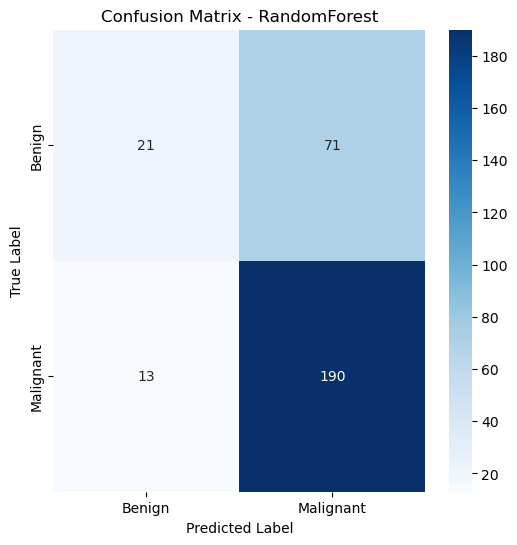

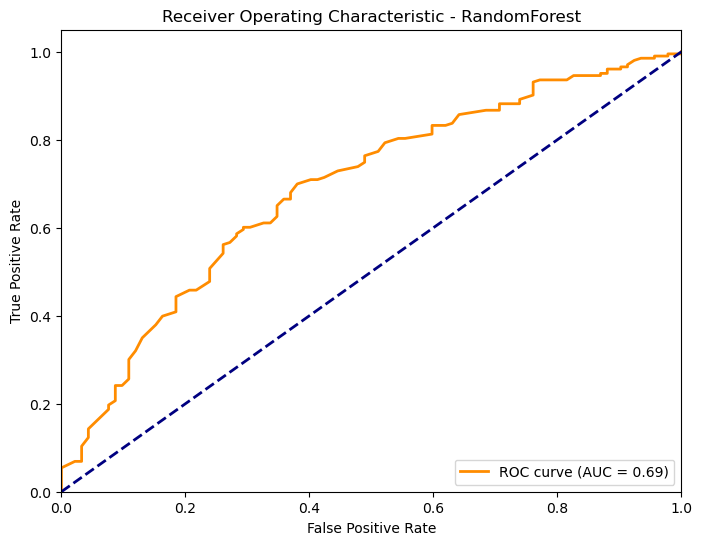


Training SVM...
Fitting 5 folds for each of 108 candidates, totalling 540 fits
SVM - Test Accuracy: 0.6814
SVM - Test ROC AUC: 0.7046
              precision    recall  f1-score   support

         0.0       0.48      0.34      0.40        92
         1.0       0.74      0.84      0.78       203

    accuracy                           0.68       295
   macro avg       0.61      0.59      0.59       295
weighted avg       0.66      0.68      0.66       295



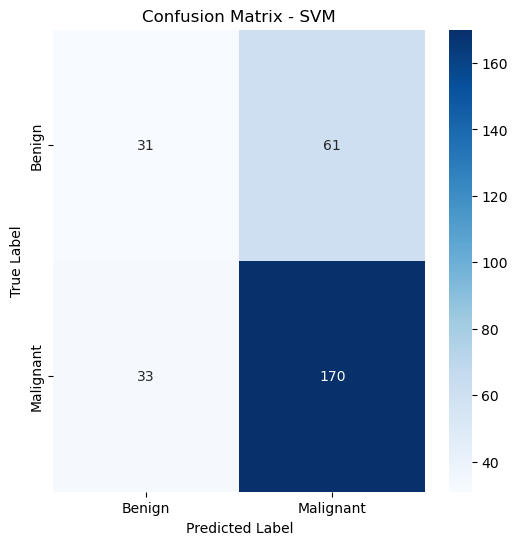

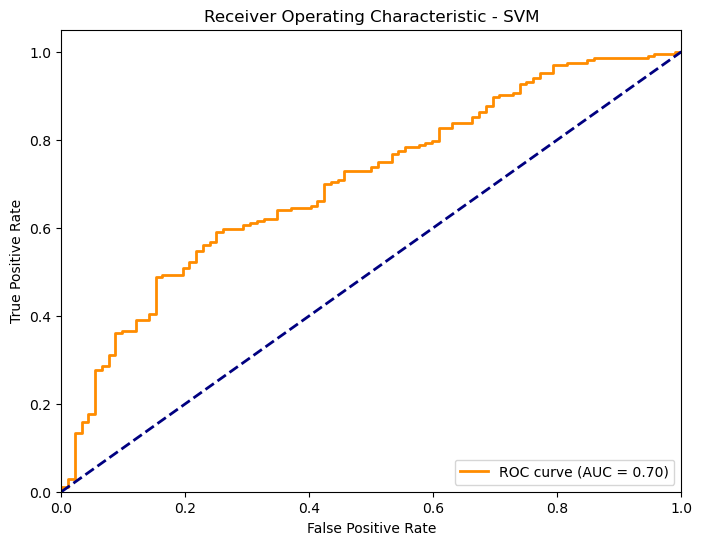


Training XGBoost...
Fitting 5 folds for each of 486 candidates, totalling 2430 fits


C:\Users\pnryl\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBoost - Test Accuracy: 0.6847
XGBoost - Test ROC AUC: 0.7174
              precision    recall  f1-score   support

         0.0       0.49      0.32      0.38        92
         1.0       0.73      0.85      0.79       203

    accuracy                           0.68       295
   macro avg       0.61      0.58      0.59       295
weighted avg       0.66      0.68      0.66       295



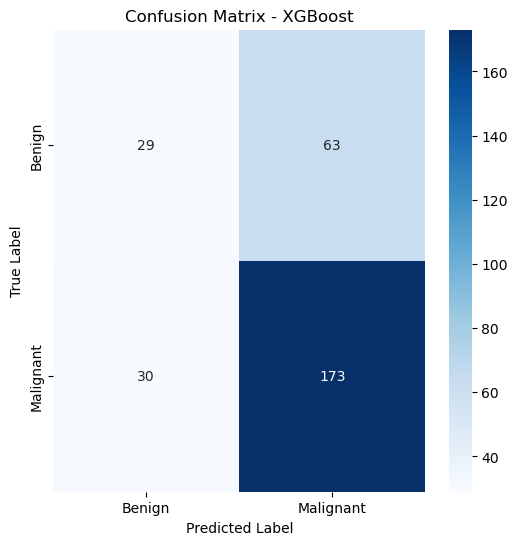

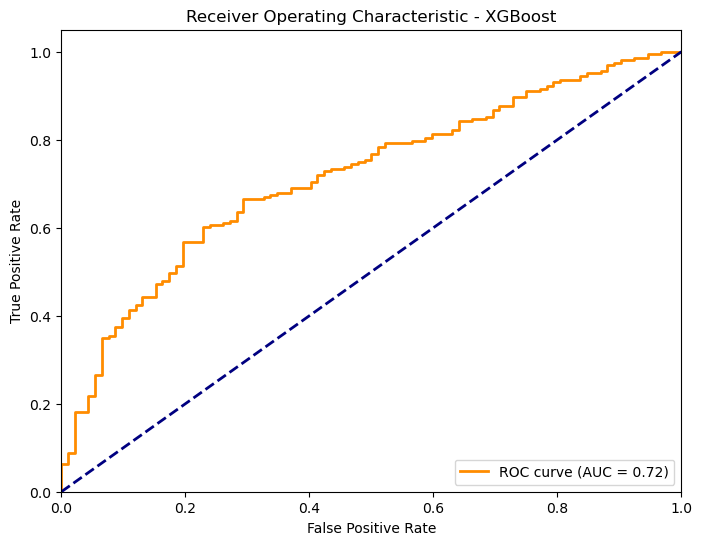


Training LogisticRegression...
Fitting 5 folds for each of 54 candidates, totalling 270 fits
LogisticRegression - Test Accuracy: 0.6814
LogisticRegression - Test ROC AUC: 0.7020
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        92
         1.0       0.69      0.99      0.81       203

    accuracy                           0.68       295
   macro avg       0.34      0.50      0.41       295
weighted avg       0.47      0.68      0.56       295



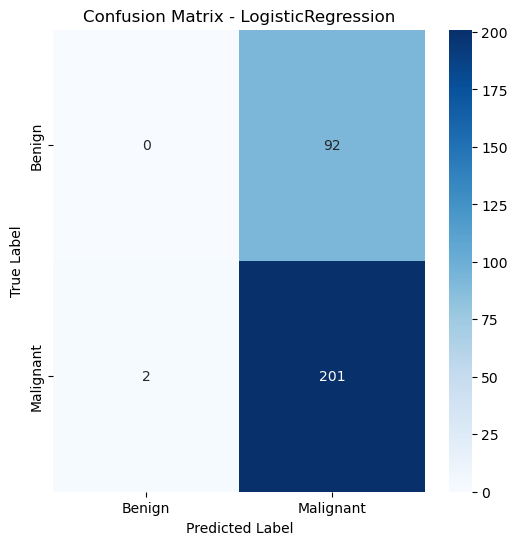

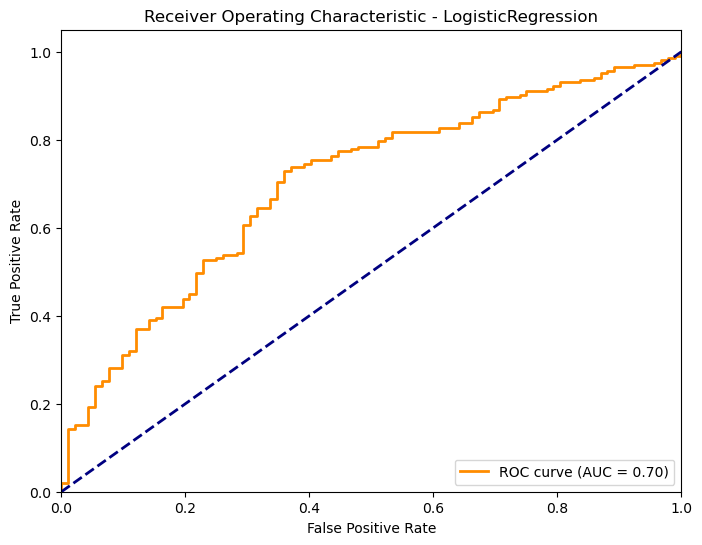


--- Training Ensemble Model: Voting Classifier ---
VotingClassifier - Test Accuracy: 0.6983
VotingClassifier - Test Precision: 0.6952
VotingClassifier - Test Recall: 1.0000
VotingClassifier - Test F1-score: 0.8202
VotingClassifier - Test ROC AUC: 0.7230

Classification Report for VotingClassifier:
               precision    recall  f1-score   support

         0.0       1.00      0.03      0.06        92
         1.0       0.70      1.00      0.82       203

    accuracy                           0.70       295
   macro avg       0.85      0.52      0.44       295
weighted avg       0.79      0.70      0.58       295



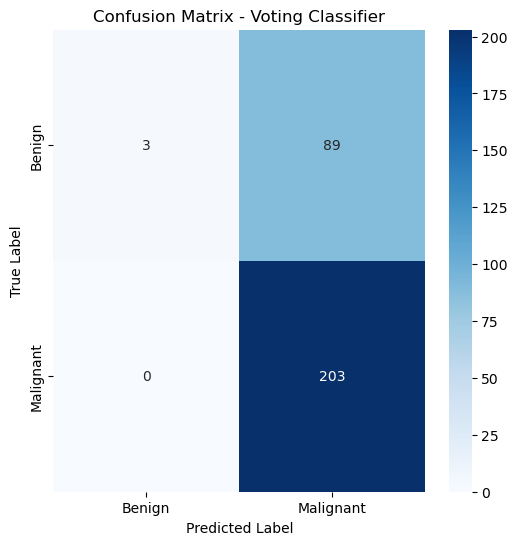

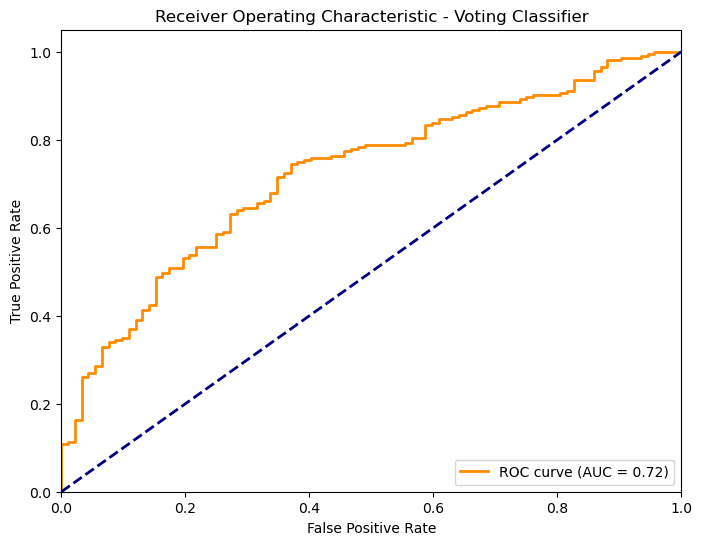


--- Final Model Comparison (with Ensemble) ---
                   CV Accuracy  Test Accuracy  Test Precision  Test Recall  \
VotingClassifier           N/A       0.698305        0.695205     1.000000   
RandomForest          0.699853       0.715254        0.727969     0.935961   
LogisticRegression    0.687517       0.681356        0.686007     0.990148   
XGBoost               0.710924       0.684746        0.733051     0.852217   
SVM                   0.696444       0.681356        0.735931     0.837438   

                     Test F1  Test ROC AUC  
VotingClassifier    0.820202      0.723013  
RandomForest        0.818966      0.689869  
LogisticRegression  0.810484      0.702024  
XGBoost             0.788155      0.717445  
SVM                 0.783410      0.704594  


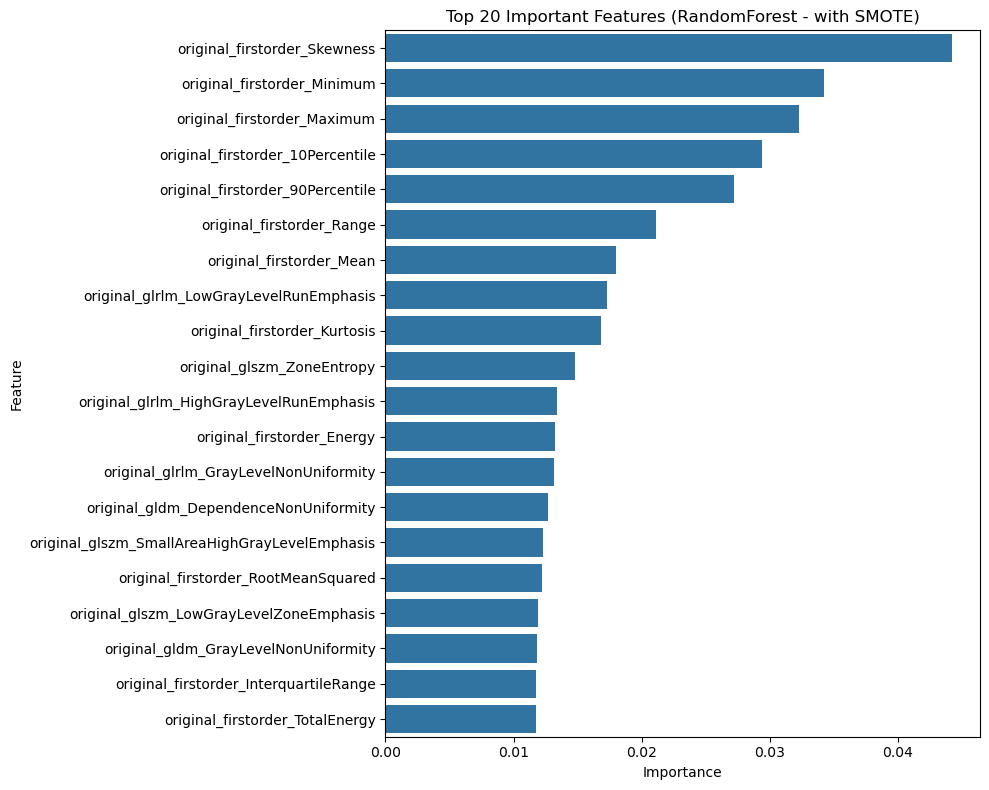

In [50]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, roc_auc_score, confusion_matrix,
                             classification_report, roc_curve, auc)
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE

# --- IMPORTANT MODIFICATION: Loading train and test data from separate CSVs ---

# Define the target column name
target_column_name = 'Class' # As previously clarified

# Load your pre-split training and testing datasets
try:
    train_df =pd.read_csv(r'P:\norm\train400_normalized.csv', delimiter=';')
    test_df = pd.read_csv(r"P:\norm\test400_normalized.csv", delimiter=';')
except FileNotFoundError:
    print("Error: Make sure 'train40.csv' and 'test40.csv' are in the specified path.")
    print("Please check the file paths and try again.")
    exit() # Exit the script if files are not found

# Separate features (X) and target (y) for training data
X_train = train_df.drop(columns=[target_column_name, ','], errors='ignore')
y_train = train_df[target_column_name]

# Separate features (X) and target (y) for testing data
X_test = test_df.drop(columns=[target_column_name, ','], errors='ignore')
y_test = test_df[target_column_name]

# --- End of IMPORTANT MODIFICATION ---

# Check for missing values in train and test sets (optional, but good practice)
print("Missing values in training data:\n", X_train.isnull().sum().sum())
print("Missing values in test data:\n", X_test.isnull().sum().sum())

# Check class distribution in train and test sets
print(f"\ny_train class distribution:\n{y_train.value_counts()}")
print(f"y_test class distribution:\n{y_test.value_counts()}")

# Confirm shapes of the loaded data
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")


# Define the pipeline steps with SMOTE for handling imbalance
pipeline_steps = [
    ('scaler', StandardScaler()),  # Standardize features
    ('feature_selection', SelectKBest(score_func=f_classif)),  # Feature selection
    ('smote', SMOTE(random_state=42)), # SMOTE for oversampling minority class (Important for imbalance!)
    ('classifier', None)  # This will be replaced with different classifiers
]

# Create pipeline using ImbPipeline
pipeline = ImbPipeline(pipeline_steps)

# Define classifiers and their parameter grids for grid search
classifiers = {
    'RandomForest': {
        'classifier_instance': RandomForestClassifier(random_state=42),
        'param_grid': {
            'classifier__n_estimators': [100, 200, 300],
            'classifier__max_depth': [10, 20, None],
            'classifier__min_samples_split': [2, 5, 10],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'SVM': {
        'classifier_instance': SVC(probability=True, random_state=42),
        'param_grid': {
            'classifier__C': [0.1, 1, 10],
            'classifier__kernel': ['linear', 'rbf'],
            'classifier__gamma': ['scale', 'auto'],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'XGBoost': {
        'classifier_instance': XGBClassifier(random_state=42, eval_metric='logloss', use_label_encoder=False),
        'param_grid': {
            'classifier__n_estimators': [100, 200, 300],
            'classifier__max_depth': [3, 6, 9],
            'classifier__learning_rate': [0.01, 0.1, 0.2],
            'classifier__subsample': [0.8, 1.0],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'LogisticRegression': {
        'classifier_instance': LogisticRegression(random_state=42, max_iter=2000),
        'param_grid': {
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['l2'],
            'classifier__solver': ['lbfgs', 'liblinear'],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    }
}

# Evaluate each classifier
results = {}
best_models = {}

for clf_name, clf_info in classifiers.items():
    print(f"\nTraining {clf_name}...")

    pipeline.set_params(classifier=clf_info['classifier_instance'])

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    grid_search = GridSearchCV(
        pipeline,
        param_grid=clf_info['param_grid'],
        cv=cv,
        scoring='f1_weighted',
        n_jobs=-1,
        verbose=1
    )

    grid_search.fit(X_train, y_train)

    best_models[clf_name] = grid_search.best_estimator_
    results[clf_name] = {
        'best_params': grid_search.best_params_,
        'best_score': grid_search.best_score_,
        'cv_results': grid_search.cv_results_
    }

    y_pred = grid_search.predict(X_test)
    y_proba = grid_search.predict_proba(X_test)[:, 1]

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_proba)

    results[clf_name].update({
        'test_accuracy': accuracy,
        'test_precision': precision,
        'test_recall': recall,
        'test_f1': f1,
        'test_roc_auc': roc_auc
    })

    print(f"{clf_name} - Test Accuracy: {accuracy:.4f}")
    print(f"{clf_name} - Test ROC AUC: {roc_auc:.4f}")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Benign', 'Malignant'],
                yticklabels=['Benign', 'Malignant'])
    plt.title(f'Confusion Matrix - {clf_name}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc_val = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2,
             label=f'ROC curve (AUC = {roc_auc_val:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {clf_name}')
    plt.legend(loc="lower right")
    plt.show()

# --- Ensemble Model: Voting Classifier ---
print("\n--- Training Ensemble Model: Voting Classifier ---")

estimators = [
    ('RandomForest', best_models['RandomForest']),
    ('SVM', best_models['SVM']),
    ('XGBoost', best_models['XGBoost']),
    ('LogisticRegression', best_models['LogisticRegression'])
]

voting_clf = VotingClassifier(estimators=estimators, voting='soft', n_jobs=-1)

voting_clf.fit(X_train, y_train)

y_pred_ensemble = voting_clf.predict(X_test)
y_proba_ensemble = voting_clf.predict_proba(X_test)[:, 1]

ensemble_accuracy = accuracy_score(y_test, y_pred_ensemble)
ensemble_precision = precision_score(y_test, y_pred_ensemble)
ensemble_recall = recall_score(y_test, y_pred_ensemble)
ensemble_f1 = f1_score(y_test, y_pred_ensemble)
ensemble_roc_auc = roc_auc_score(y_test, y_proba_ensemble)

print(f"VotingClassifier - Test Accuracy: {ensemble_accuracy:.4f}")
print(f"VotingClassifier - Test Precision: {ensemble_precision:.4f}")
print(f"VotingClassifier - Test Recall: {ensemble_recall:.4f}")
print(f"VotingClassifier - Test F1-score: {ensemble_f1:.4f}")
print(f"VotingClassifier - Test ROC AUC: {ensemble_roc_auc:.4f}")
print("\nClassification Report for VotingClassifier:\n", classification_report(y_test, y_pred_ensemble))

cm_ensemble = confusion_matrix(y_test, y_pred_ensemble)
plt.figure(figsize=(6, 6))
sns.heatmap(cm_ensemble, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Benign', 'Malignant'],
            yticklabels=['Benign', 'Malignant'])
plt.title('Confusion Matrix - Voting Classifier')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

fpr_ensemble, tpr_ensemble, _ = roc_curve(y_test, y_proba_ensemble)
roc_auc_ensemble = auc(fpr_ensemble, tpr_ensemble)

plt.figure(figsize=(8, 6))
plt.plot(fpr_ensemble, tpr_ensemble, color='darkorange', lw=2,
         label=f'ROC curve (AUC = {roc_auc_ensemble:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Voting Classifier')
plt.legend(loc="lower right")
plt.show()

ensemble_results_summary = {
    'CV Accuracy': 'N/A',
    'Test Accuracy': ensemble_accuracy,
    'Test Precision': ensemble_precision,
    'Test Recall': ensemble_recall,
    'Test F1': ensemble_f1,
    'Test ROC AUC': ensemble_roc_auc
}
results['VotingClassifier'] = ensemble_results_summary

print("\n--- Final Model Comparison (with Ensemble) ---")
comparison_df = pd.DataFrame.from_dict({
    clf: {
        'CV Accuracy': res['best_score'] if 'best_score' in res else res['CV Accuracy'],
        'Test Accuracy': res['test_accuracy'] if 'test_accuracy' in res else res['Test Accuracy'],
        'Test Precision': res['test_precision'] if 'test_precision' in res else res['Test Precision'],
        'Test Recall': res['test_recall'] if 'test_recall' in res else res['Test Recall'],
        'Test F1': res['test_f1'] if 'test_f1' in res else res['Test F1'],
        'Test ROC AUC': res['test_roc_auc'] if 'test_roc_auc' in res else res['Test ROC AUC']
    } for clf, res in results.items()
}, orient='index')

print(comparison_df.sort_values(by='Test F1', ascending=False))

# Feature importance from the best model (using RandomForest as example)
# Note: Feature importance here is for the the specific model within the pipeline that includes
# SMOTE and feature selection.
best_model_rf = best_models['RandomForest']
if hasattr(best_model_rf.named_steps['classifier'], 'feature_importances_'):
    selected_features_mask = best_model_rf.named_steps['feature_selection'].get_support()
    # Use X_train.columns to get original feature names (or X_full.columns if you prefer,
    # but X_train is directly used for training features)
    feature_names = X_train.columns[selected_features_mask]

    importances = best_model_rf.named_steps['classifier'].feature_importances_

    feature_importance = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature',
                data=feature_importance.head(20))
    plt.title('Top 20 Important Features (RandomForest - with SMOTE)')
    plt.tight_layout()
    plt.show()
elif hasattr(best_model_rf.named_steps['classifier'], 'coef_'):
    print(f"\nFeature Coefficients for {best_model_rf.named_steps['classifier']._class.name_}:")
    selected_features_mask = best_model_rf.named_steps['feature_selection'].get_support()
    feature_names = X_train.columns[selected_features_mask] # Use X_train.columns

    coefficients = best_model_rf.named_steps['classifier'].coef_[0]

    feature_coef = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': coefficients
    }).sort_values('Coefficient', ascending=False)

    print(feature_coef)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Coefficient', y='Feature',
                data=feature_coef.head(20))
    plt.title(f'Top 20 Feature Coefficients ({best_model_rf.named_steps["classifier"]._class.name_} - with SMOTE)')
    plt.tight_layout()
    plt.show()

else:
    print(f"\nFeature importance/coefficients not directly available for {best_model_rf.named_steps['classifier']._class.name_}.")

Missing values in training data:
 0
Missing values in test data:
 0

y_train class distribution:
Class
1.0    989
0.0    888
Name: count, dtype: int64
y_test class distribution:
Class
1.0    216
0.0    198
Name: count, dtype: int64
X_train shape: (1877, 93), y_train shape: (1877,)
X_test shape: (414, 93), y_test shape: (414,)

Training RandomForest...
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
RandomForest - Test Accuracy: 0.5386
RandomForest - Test ROC AUC: 0.5651
              precision    recall  f1-score   support

         0.0       0.54      0.23      0.33       198
         1.0       0.54      0.82      0.65       216

    accuracy                           0.54       414
   macro avg       0.54      0.53      0.49       414
weighted avg       0.54      0.54      0.49       414



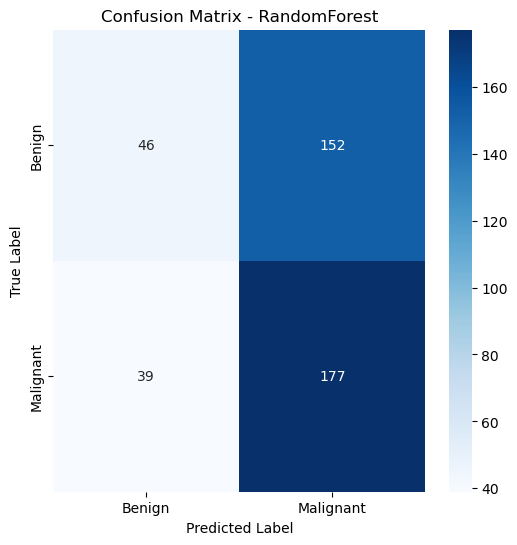

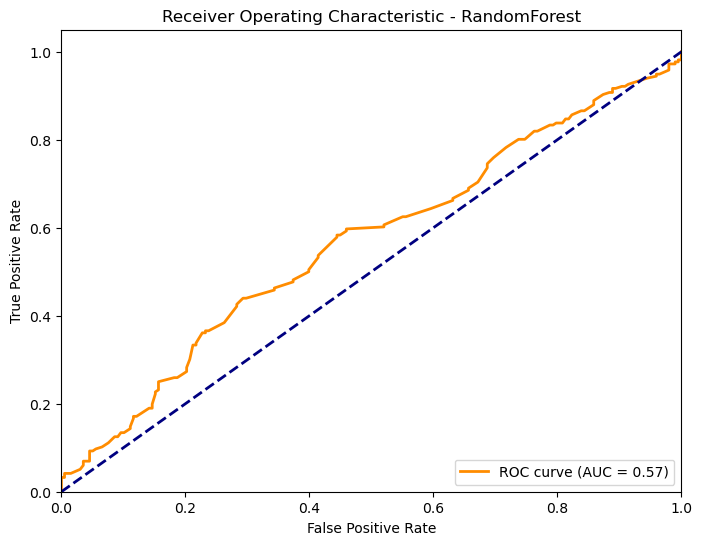


Training SVM...
Fitting 5 folds for each of 108 candidates, totalling 540 fits


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, roc_auc_score, confusion_matrix,
                             classification_report, roc_curve, auc)
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE

# --- IMPORTANT MODIFICATION: Loading train and test data from separate CSVs ---

# Define the target column name
target_column_name = 'Class' # As previously clarified

# Load your pre-split training and testing datasets
try:
    train_df =pd.read_csv(r'P:\norm\train200_normalized.csv', delimiter=';')
    test_df = pd.read_csv(r"P:\norm\test200_normalized.csv", delimiter=';')
except FileNotFoundError:
    print("Error: Make sure 'train40.csv' and 'test40.csv' are in the specified path.")
    print("Please check the file paths and try again.")
    exit() # Exit the script if files are not found

# Separate features (X) and target (y) for training data
X_train = train_df.drop(columns=[target_column_name, ','], errors='ignore')
y_train = train_df[target_column_name]

# Separate features (X) and target (y) for testing data
X_test = test_df.drop(columns=[target_column_name, ','], errors='ignore')
y_test = test_df[target_column_name]

# --- End of IMPORTANT MODIFICATION ---

# Check for missing values in train and test sets (optional, but good practice)
print("Missing values in training data:\n", X_train.isnull().sum().sum())
print("Missing values in test data:\n", X_test.isnull().sum().sum())

# Check class distribution in train and test sets
print(f"\ny_train class distribution:\n{y_train.value_counts()}")
print(f"y_test class distribution:\n{y_test.value_counts()}")

# Confirm shapes of the loaded data
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")


# Define the pipeline steps with SMOTE for handling imbalance
pipeline_steps = [
    ('scaler', StandardScaler()),  # Standardize features
    ('feature_selection', SelectKBest(score_func=f_classif)),  # Feature selection
    ('smote', SMOTE(random_state=42)), # SMOTE for oversampling minority class (Important for imbalance!)
    ('classifier', None)  # This will be replaced with different classifiers
]

# Create pipeline using ImbPipeline
pipeline = ImbPipeline(pipeline_steps)

# Define classifiers and their parameter grids for grid search
classifiers = {
    'RandomForest': {
        'classifier_instance': RandomForestClassifier(random_state=42),
        'param_grid': {
            'classifier__n_estimators': [100, 200, 300],
            'classifier__max_depth': [10, 20, None],
            'classifier__min_samples_split': [2, 5, 10],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'SVM': {
        'classifier_instance': SVC(probability=True, random_state=42),
        'param_grid': {
            'classifier__C': [0.1, 1, 10],
            'classifier__kernel': ['linear', 'rbf'],
            'classifier__gamma': ['scale', 'auto'],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'XGBoost': {
        'classifier_instance': XGBClassifier(random_state=42, eval_metric='logloss', use_label_encoder=False),
        'param_grid': {
            'classifier__n_estimators': [100, 200, 300],
            'classifier__max_depth': [3, 6, 9],
            'classifier__learning_rate': [0.01, 0.1, 0.2],
            'classifier__subsample': [0.8, 1.0],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'LogisticRegression': {
        'classifier_instance': LogisticRegression(random_state=42, max_iter=2000),
        'param_grid': {
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['l2'],
            'classifier__solver': ['lbfgs', 'liblinear'],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    }
}

# Evaluate each classifier
results = {}
best_models = {}

for clf_name, clf_info in classifiers.items():
    print(f"\nTraining {clf_name}...")

    pipeline.set_params(classifier=clf_info['classifier_instance'])

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    grid_search = GridSearchCV(
        pipeline,
        param_grid=clf_info['param_grid'],
        cv=cv,
        scoring='f1_weighted',
        n_jobs=-1,
        verbose=1
    )

    grid_search.fit(X_train, y_train)

    best_models[clf_name] = grid_search.best_estimator_
    results[clf_name] = {
        'best_params': grid_search.best_params_,
        'best_score': grid_search.best_score_,
        'cv_results': grid_search.cv_results_
    }

    y_pred = grid_search.predict(X_test)
    y_proba = grid_search.predict_proba(X_test)[:, 1]

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_proba)

    results[clf_name].update({
        'test_accuracy': accuracy,
        'test_precision': precision,
        'test_recall': recall,
        'test_f1': f1,
        'test_roc_auc': roc_auc
    })

    print(f"{clf_name} - Test Accuracy: {accuracy:.4f}")
    print(f"{clf_name} - Test ROC AUC: {roc_auc:.4f}")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Benign', 'Malignant'],
                yticklabels=['Benign', 'Malignant'])
    plt.title(f'Confusion Matrix - {clf_name}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc_val = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2,
             label=f'ROC curve (AUC = {roc_auc_val:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {clf_name}')
    plt.legend(loc="lower right")
    plt.show()

# --- Ensemble Model: Voting Classifier ---
print("\n--- Training Ensemble Model: Voting Classifier ---")

estimators = [
    ('RandomForest', best_models['RandomForest']),
    ('SVM', best_models['SVM']),
    ('XGBoost', best_models['XGBoost']),
    ('LogisticRegression', best_models['LogisticRegression'])
]

voting_clf = VotingClassifier(estimators=estimators, voting='soft', n_jobs=-1)

voting_clf.fit(X_train, y_train)

y_pred_ensemble = voting_clf.predict(X_test)
y_proba_ensemble = voting_clf.predict_proba(X_test)[:, 1]

ensemble_accuracy = accuracy_score(y_test, y_pred_ensemble)
ensemble_precision = precision_score(y_test, y_pred_ensemble)
ensemble_recall = recall_score(y_test, y_pred_ensemble)
ensemble_f1 = f1_score(y_test, y_pred_ensemble)
ensemble_roc_auc = roc_auc_score(y_test, y_proba_ensemble)

print(f"VotingClassifier - Test Accuracy: {ensemble_accuracy:.4f}")
print(f"VotingClassifier - Test Precision: {ensemble_precision:.4f}")
print(f"VotingClassifier - Test Recall: {ensemble_recall:.4f}")
print(f"VotingClassifier - Test F1-score: {ensemble_f1:.4f}")
print(f"VotingClassifier - Test ROC AUC: {ensemble_roc_auc:.4f}")
print("\nClassification Report for VotingClassifier:\n", classification_report(y_test, y_pred_ensemble))

cm_ensemble = confusion_matrix(y_test, y_pred_ensemble)
plt.figure(figsize=(6, 6))
sns.heatmap(cm_ensemble, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Benign', 'Malignant'],
            yticklabels=['Benign', 'Malignant'])
plt.title('Confusion Matrix - Voting Classifier')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

fpr_ensemble, tpr_ensemble, _ = roc_curve(y_test, y_proba_ensemble)
roc_auc_ensemble = auc(fpr_ensemble, tpr_ensemble)

plt.figure(figsize=(8, 6))
plt.plot(fpr_ensemble, tpr_ensemble, color='darkorange', lw=2,
         label=f'ROC curve (AUC = {roc_auc_ensemble:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Voting Classifier')
plt.legend(loc="lower right")
plt.show()

ensemble_results_summary = {
    'CV Accuracy': 'N/A',
    'Test Accuracy': ensemble_accuracy,
    'Test Precision': ensemble_precision,
    'Test Recall': ensemble_recall,
    'Test F1': ensemble_f1,
    'Test ROC AUC': ensemble_roc_auc
}
results['VotingClassifier'] = ensemble_results_summary

print("\n--- Final Model Comparison (with Ensemble) ---")
comparison_df = pd.DataFrame.from_dict({
    clf: {
        'CV Accuracy': res['best_score'] if 'best_score' in res else res['CV Accuracy'],
        'Test Accuracy': res['test_accuracy'] if 'test_accuracy' in res else res['Test Accuracy'],
        'Test Precision': res['test_precision'] if 'test_precision' in res else res['Test Precision'],
        'Test Recall': res['test_recall'] if 'test_recall' in res else res['Test Recall'],
        'Test F1': res['test_f1'] if 'test_f1' in res else res['Test F1'],
        'Test ROC AUC': res['test_roc_auc'] if 'test_roc_auc' in res else res['Test ROC AUC']
    } for clf, res in results.items()
}, orient='index')

print(comparison_df.sort_values(by='Test F1', ascending=False))

# Feature importance from the best model (using RandomForest as example)
# Note: Feature importance here is for the the specific model within the pipeline that includes
# SMOTE and feature selection.
best_model_rf = best_models['RandomForest']
if hasattr(best_model_rf.named_steps['classifier'], 'feature_importances_'):
    selected_features_mask = best_model_rf.named_steps['feature_selection'].get_support()
    # Use X_train.columns to get original feature names (or X_full.columns if you prefer,
    # but X_train is directly used for training features)
    feature_names = X_train.columns[selected_features_mask]

    importances = best_model_rf.named_steps['classifier'].feature_importances_

    feature_importance = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature',
                data=feature_importance.head(20))
    plt.title('Top 20 Important Features (RandomForest - with SMOTE)')
    plt.tight_layout()
    plt.show()
elif hasattr(best_model_rf.named_steps['classifier'], 'coef_'):
    print(f"\nFeature Coefficients for {best_model_rf.named_steps['classifier']._class.name_}:")
    selected_features_mask = best_model_rf.named_steps['feature_selection'].get_support()
    feature_names = X_train.columns[selected_features_mask] # Use X_train.columns

    coefficients = best_model_rf.named_steps['classifier'].coef_[0]

    feature_coef = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': coefficients
    }).sort_values('Coefficient', ascending=False)

    print(feature_coef)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Coefficient', y='Feature',
                data=feature_coef.head(20))
    plt.title(f'Top 20 Feature Coefficients ({best_model_rf.named_steps["classifier"]._class.name_} - with SMOTE)')
    plt.tight_layout()
    plt.show()

else:
    print(f"\nFeature importance/coefficients not directly available for {best_model_rf.named_steps['classifier']._class.name_}.")

Missing values in training data:
 0
Missing values in test data:
 0

y_train class distribution:
Class
1.0    1034
0.0     431
Name: count, dtype: int64
y_test class distribution:
Class
1.0    191
0.0     98
Name: count, dtype: int64
X_train shape: (1465, 93), y_train shape: (1465,)
X_test shape: (289, 93), y_test shape: (289,)

Training RandomForest...
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
RandomForest - Test Accuracy: 0.6817
RandomForest - Test ROC AUC: 0.6498
              precision    recall  f1-score   support

         0.0       0.69      0.11      0.19        98
         1.0       0.68      0.97      0.80       191

    accuracy                           0.68       289
   macro avg       0.68      0.54      0.50       289
weighted avg       0.68      0.68      0.60       289



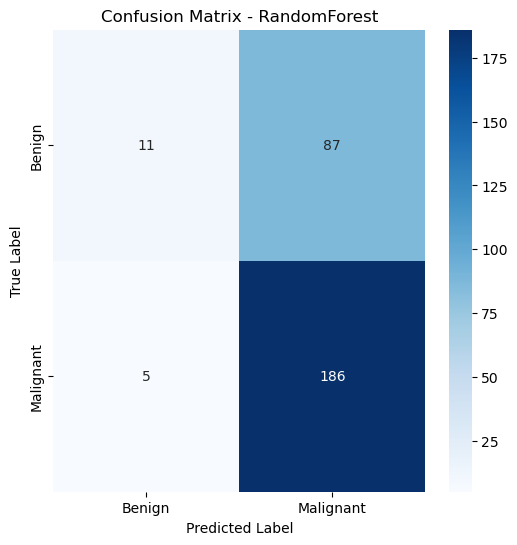

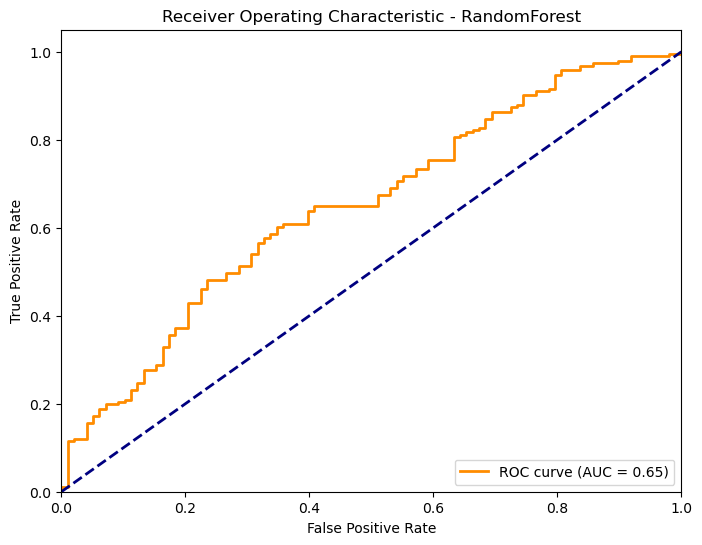


Training SVM...
Fitting 5 folds for each of 108 candidates, totalling 540 fits
SVM - Test Accuracy: 0.6436
SVM - Test ROC AUC: 0.6616
              precision    recall  f1-score   support

         0.0       0.33      0.05      0.09        98
         1.0       0.66      0.95      0.78       191

    accuracy                           0.64       289
   macro avg       0.50      0.50      0.43       289
weighted avg       0.55      0.64      0.54       289



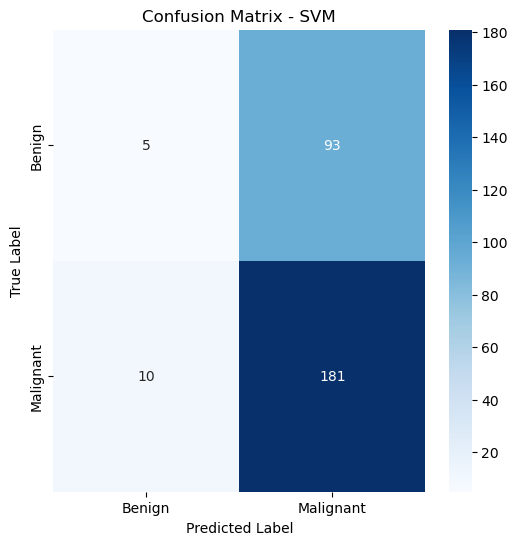

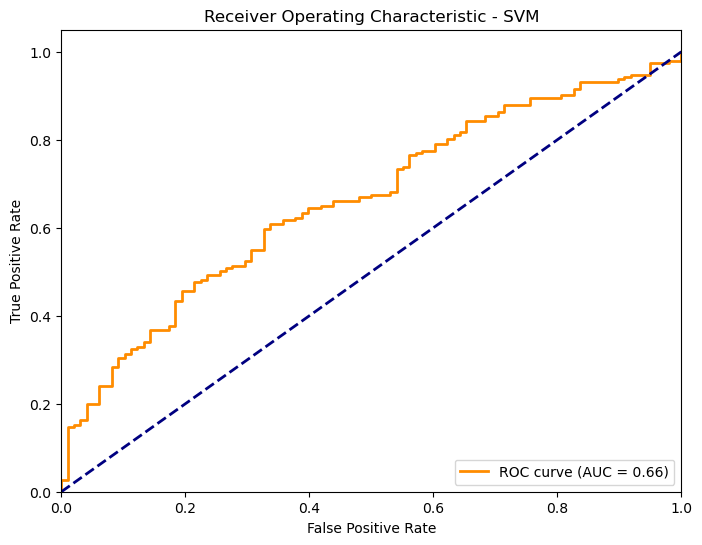


Training XGBoost...
Fitting 5 folds for each of 486 candidates, totalling 2430 fits


C:\Users\pnryl\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBoost - Test Accuracy: 0.6817
XGBoost - Test ROC AUC: 0.6790
              precision    recall  f1-score   support

         0.0       0.54      0.46      0.49        98
         1.0       0.74      0.80      0.77       191

    accuracy                           0.68       289
   macro avg       0.64      0.63      0.63       289
weighted avg       0.67      0.68      0.68       289



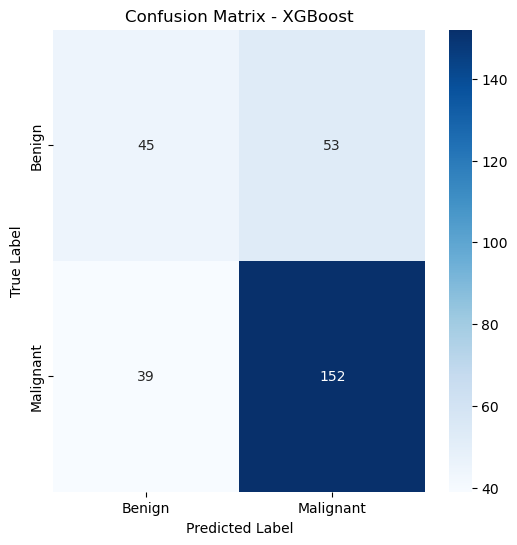

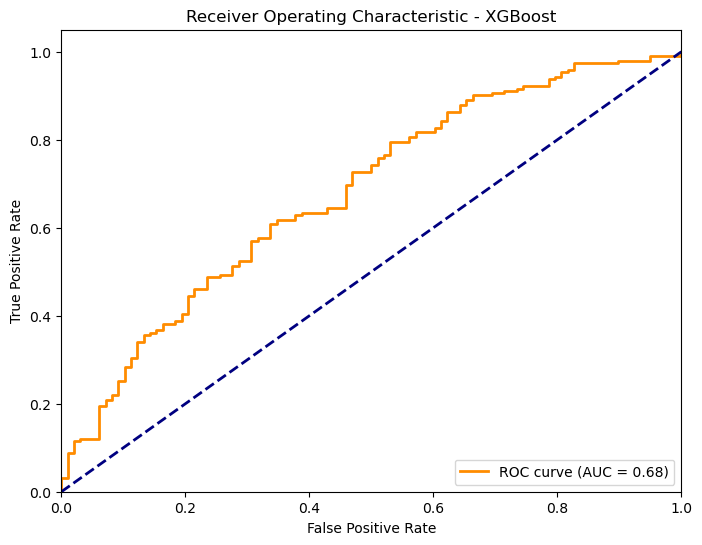


Training LogisticRegression...
Fitting 5 folds for each of 54 candidates, totalling 270 fits
LogisticRegression - Test Accuracy: 0.6505
LogisticRegression - Test ROC AUC: 0.6457
              precision    recall  f1-score   support

         0.0       0.36      0.04      0.07        98
         1.0       0.66      0.96      0.78       191

    accuracy                           0.65       289
   macro avg       0.51      0.50      0.43       289
weighted avg       0.56      0.65      0.54       289



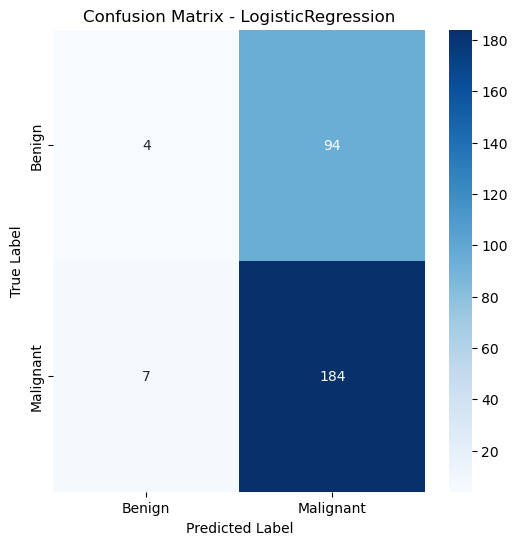

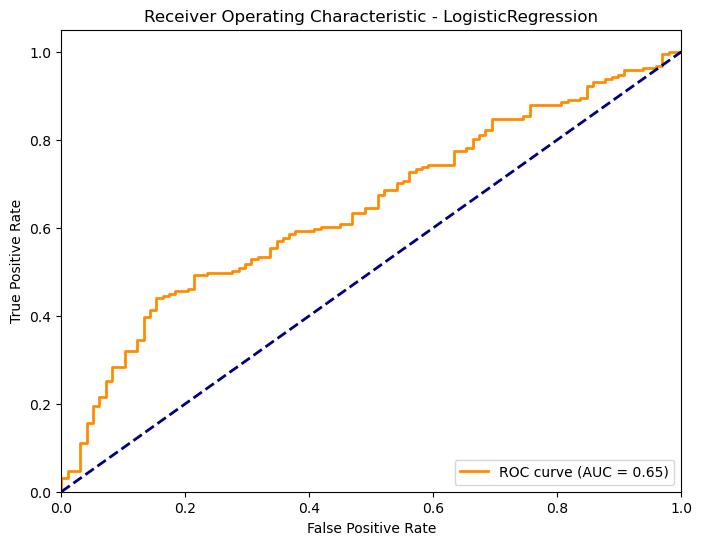


--- Training Ensemble Model: Voting Classifier ---
VotingClassifier - Test Accuracy: 0.6747
VotingClassifier - Test Precision: 0.6738
VotingClassifier - Test Recall: 0.9843
VotingClassifier - Test F1-score: 0.8000
VotingClassifier - Test ROC AUC: 0.7181

Classification Report for VotingClassifier:
               precision    recall  f1-score   support

         0.0       0.70      0.07      0.13        98
         1.0       0.67      0.98      0.80       191

    accuracy                           0.67       289
   macro avg       0.69      0.53      0.46       289
weighted avg       0.68      0.67      0.57       289



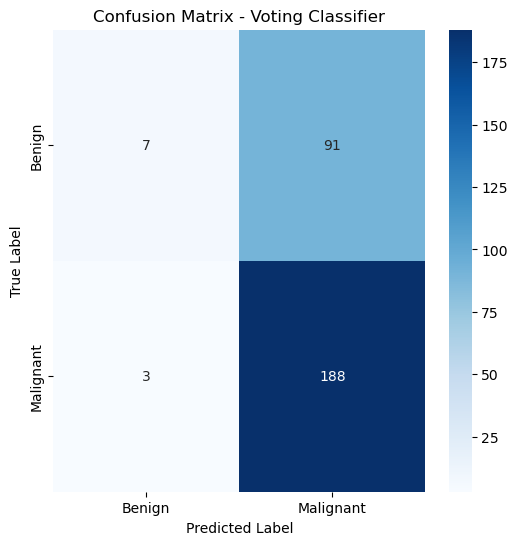

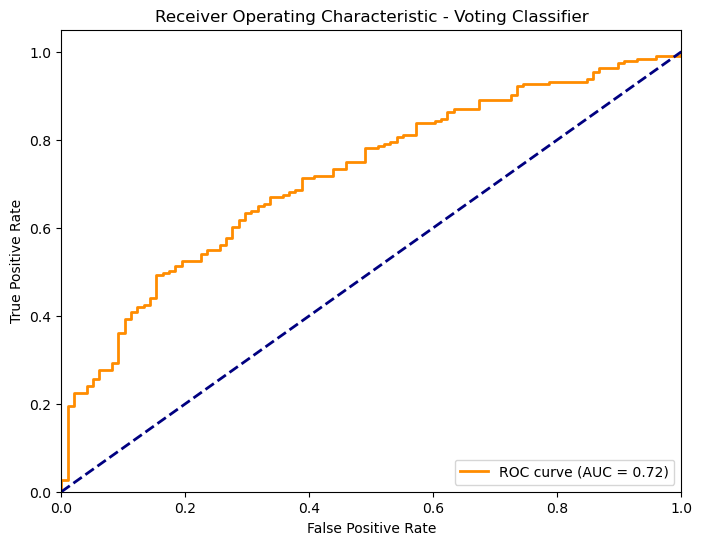


--- Final Model Comparison (with Ensemble) ---
                   CV Accuracy  Test Accuracy  Test Precision  Test Recall  \
RandomForest          0.753727       0.681661        0.681319     0.973822   
VotingClassifier           N/A       0.674740        0.673835     0.984293   
LogisticRegression    0.686402       0.650519        0.661871     0.963351   
SVM                    0.74227       0.643599        0.660584     0.947644   
XGBoost               0.771549       0.681661        0.741463     0.795812   

                     Test F1  Test ROC AUC  
RandomForest        0.801724      0.649802  
VotingClassifier    0.800000      0.718132  
LogisticRegression  0.784648      0.645689  
SVM                 0.778495      0.661556  
XGBoost             0.767677      0.679026  


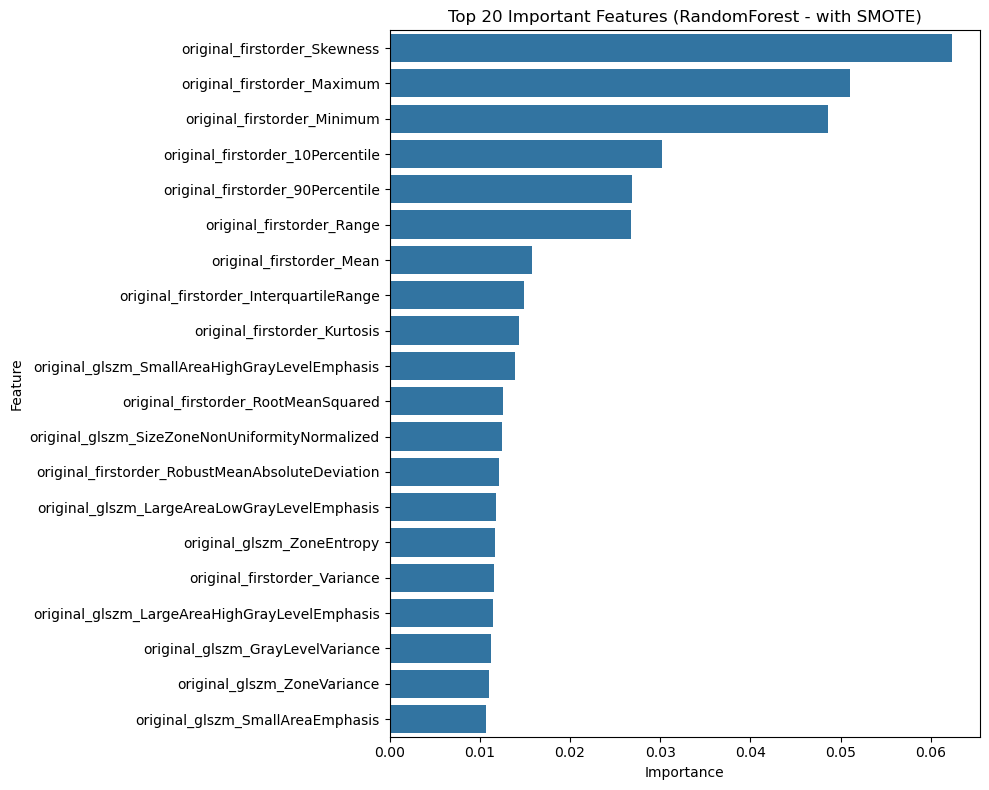

In [49]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, roc_auc_score, confusion_matrix,
                             classification_report, roc_curve, auc)
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE

# --- IMPORTANT MODIFICATION: Loading train and test data from separate CSVs ---

# Define the target column name
target_column_name = 'Class' # As previously clarified

# Load your pre-split training and testing datasets
try:
    train_df =pd.read_csv(r'P:\norm\train100_normalized.csv', delimiter=';')
    test_df = pd.read_csv(r"P:\norm\test100_normalized.csv", delimiter=';')
except FileNotFoundError:
    print("Error: Make sure 'train40.csv' and 'test40.csv' are in the specified path.")
    print("Please check the file paths and try again.")
    exit() # Exit the script if files are not found

# Separate features (X) and target (y) for training data
X_train = train_df.drop(columns=[target_column_name, ','], errors='ignore')
y_train = train_df[target_column_name]

# Separate features (X) and target (y) for testing data
X_test = test_df.drop(columns=[target_column_name, ','], errors='ignore')
y_test = test_df[target_column_name]

# --- End of IMPORTANT MODIFICATION ---

# Check for missing values in train and test sets (optional, but good practice)
print("Missing values in training data:\n", X_train.isnull().sum().sum())
print("Missing values in test data:\n", X_test.isnull().sum().sum())

# Check class distribution in train and test sets
print(f"\ny_train class distribution:\n{y_train.value_counts()}")
print(f"y_test class distribution:\n{y_test.value_counts()}")

# Confirm shapes of the loaded data
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")


# Define the pipeline steps with SMOTE for handling imbalance
pipeline_steps = [
    ('scaler', StandardScaler()),  # Standardize features
    ('feature_selection', SelectKBest(score_func=f_classif)),  # Feature selection
    ('smote', SMOTE(random_state=42)), # SMOTE for oversampling minority class (Important for imbalance!)
    ('classifier', None)  # This will be replaced with different classifiers
]

# Create pipeline using ImbPipeline
pipeline = ImbPipeline(pipeline_steps)

# Define classifiers and their parameter grids for grid search
classifiers = {
    'RandomForest': {
        'classifier_instance': RandomForestClassifier(random_state=42),
        'param_grid': {
            'classifier__n_estimators': [100, 200, 300],
            'classifier__max_depth': [10, 20, None],
            'classifier__min_samples_split': [2, 5, 10],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'SVM': {
        'classifier_instance': SVC(probability=True, random_state=42),
        'param_grid': {
            'classifier__C': [0.1, 1, 10],
            'classifier__kernel': ['linear', 'rbf'],
            'classifier__gamma': ['scale', 'auto'],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'XGBoost': {
        'classifier_instance': XGBClassifier(random_state=42, eval_metric='logloss', use_label_encoder=False),
        'param_grid': {
            'classifier__n_estimators': [100, 200, 300],
            'classifier__max_depth': [3, 6, 9],
            'classifier__learning_rate': [0.01, 0.1, 0.2],
            'classifier__subsample': [0.8, 1.0],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'LogisticRegression': {
        'classifier_instance': LogisticRegression(random_state=42, max_iter=2000),
        'param_grid': {
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['l2'],
            'classifier__solver': ['lbfgs', 'liblinear'],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    }
}

# Evaluate each classifier
results = {}
best_models = {}

for clf_name, clf_info in classifiers.items():
    print(f"\nTraining {clf_name}...")

    pipeline.set_params(classifier=clf_info['classifier_instance'])

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    grid_search = GridSearchCV(
        pipeline,
        param_grid=clf_info['param_grid'],
        cv=cv,
        scoring='f1_weighted',
        n_jobs=-1,
        verbose=1
    )

    grid_search.fit(X_train, y_train)

    best_models[clf_name] = grid_search.best_estimator_
    results[clf_name] = {
        'best_params': grid_search.best_params_,
        'best_score': grid_search.best_score_,
        'cv_results': grid_search.cv_results_
    }

    y_pred = grid_search.predict(X_test)
    y_proba = grid_search.predict_proba(X_test)[:, 1]

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_proba)

    results[clf_name].update({
        'test_accuracy': accuracy,
        'test_precision': precision,
        'test_recall': recall,
        'test_f1': f1,
        'test_roc_auc': roc_auc
    })

    print(f"{clf_name} - Test Accuracy: {accuracy:.4f}")
    print(f"{clf_name} - Test ROC AUC: {roc_auc:.4f}")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Benign', 'Malignant'],
                yticklabels=['Benign', 'Malignant'])
    plt.title(f'Confusion Matrix - {clf_name}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc_val = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2,
             label=f'ROC curve (AUC = {roc_auc_val:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {clf_name}')
    plt.legend(loc="lower right")
    plt.show()

# --- Ensemble Model: Voting Classifier ---
print("\n--- Training Ensemble Model: Voting Classifier ---")

estimators = [
    ('RandomForest', best_models['RandomForest']),
    ('SVM', best_models['SVM']),
    ('XGBoost', best_models['XGBoost']),
    ('LogisticRegression', best_models['LogisticRegression'])
]

voting_clf = VotingClassifier(estimators=estimators, voting='soft', n_jobs=-1)

voting_clf.fit(X_train, y_train)

y_pred_ensemble = voting_clf.predict(X_test)
y_proba_ensemble = voting_clf.predict_proba(X_test)[:, 1]

ensemble_accuracy = accuracy_score(y_test, y_pred_ensemble)
ensemble_precision = precision_score(y_test, y_pred_ensemble)
ensemble_recall = recall_score(y_test, y_pred_ensemble)
ensemble_f1 = f1_score(y_test, y_pred_ensemble)
ensemble_roc_auc = roc_auc_score(y_test, y_proba_ensemble)

print(f"VotingClassifier - Test Accuracy: {ensemble_accuracy:.4f}")
print(f"VotingClassifier - Test Precision: {ensemble_precision:.4f}")
print(f"VotingClassifier - Test Recall: {ensemble_recall:.4f}")
print(f"VotingClassifier - Test F1-score: {ensemble_f1:.4f}")
print(f"VotingClassifier - Test ROC AUC: {ensemble_roc_auc:.4f}")
print("\nClassification Report for VotingClassifier:\n", classification_report(y_test, y_pred_ensemble))

cm_ensemble = confusion_matrix(y_test, y_pred_ensemble)
plt.figure(figsize=(6, 6))
sns.heatmap(cm_ensemble, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Benign', 'Malignant'],
            yticklabels=['Benign', 'Malignant'])
plt.title('Confusion Matrix - Voting Classifier')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

fpr_ensemble, tpr_ensemble, _ = roc_curve(y_test, y_proba_ensemble)
roc_auc_ensemble = auc(fpr_ensemble, tpr_ensemble)

plt.figure(figsize=(8, 6))
plt.plot(fpr_ensemble, tpr_ensemble, color='darkorange', lw=2,
         label=f'ROC curve (AUC = {roc_auc_ensemble:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Voting Classifier')
plt.legend(loc="lower right")
plt.show()

ensemble_results_summary = {
    'CV Accuracy': 'N/A',
    'Test Accuracy': ensemble_accuracy,
    'Test Precision': ensemble_precision,
    'Test Recall': ensemble_recall,
    'Test F1': ensemble_f1,
    'Test ROC AUC': ensemble_roc_auc
}
results['VotingClassifier'] = ensemble_results_summary

print("\n--- Final Model Comparison (with Ensemble) ---")
comparison_df = pd.DataFrame.from_dict({
    clf: {
        'CV Accuracy': res['best_score'] if 'best_score' in res else res['CV Accuracy'],
        'Test Accuracy': res['test_accuracy'] if 'test_accuracy' in res else res['Test Accuracy'],
        'Test Precision': res['test_precision'] if 'test_precision' in res else res['Test Precision'],
        'Test Recall': res['test_recall'] if 'test_recall' in res else res['Test Recall'],
        'Test F1': res['test_f1'] if 'test_f1' in res else res['Test F1'],
        'Test ROC AUC': res['test_roc_auc'] if 'test_roc_auc' in res else res['Test ROC AUC']
    } for clf, res in results.items()
}, orient='index')

print(comparison_df.sort_values(by='Test F1', ascending=False))

# Feature importance from the best model (using RandomForest as example)
# Note: Feature importance here is for the the specific model within the pipeline that includes
# SMOTE and feature selection.
best_model_rf = best_models['RandomForest']
if hasattr(best_model_rf.named_steps['classifier'], 'feature_importances_'):
    selected_features_mask = best_model_rf.named_steps['feature_selection'].get_support()
    # Use X_train.columns to get original feature names (or X_full.columns if you prefer,
    # but X_train is directly used for training features)
    feature_names = X_train.columns[selected_features_mask]

    importances = best_model_rf.named_steps['classifier'].feature_importances_

    feature_importance = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature',
                data=feature_importance.head(20))
    plt.title('Top 20 Important Features (RandomForest - with SMOTE)')
    plt.tight_layout()
    plt.show()
elif hasattr(best_model_rf.named_steps['classifier'], 'coef_'):
    print(f"\nFeature Coefficients for {best_model_rf.named_steps['classifier']._class.name_}:")
    selected_features_mask = best_model_rf.named_steps['feature_selection'].get_support()
    feature_names = X_train.columns[selected_features_mask] # Use X_train.columns

    coefficients = best_model_rf.named_steps['classifier'].coef_[0]

    feature_coef = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': coefficients
    }).sort_values('Coefficient', ascending=False)

    print(feature_coef)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Coefficient', y='Feature',
                data=feature_coef.head(20))
    plt.title(f'Top 20 Feature Coefficients ({best_model_rf.named_steps["classifier"]._class.name_} - with SMOTE)')
    plt.tight_layout()
    plt.show()

else:
    print(f"\nFeature importance/coefficients not directly available for {best_model_rf.named_steps['classifier']._class.name_}.")

Missing values in training data:
 0
Missing values in test data:
 0

y_train class distribution:
Class
1    957
0    430
Name: count, dtype: int64
y_test class distribution:
Class
1    200
0     88
Name: count, dtype: int64
X_train shape: (1387, 93), y_train shape: (1387,)
X_test shape: (288, 93), y_test shape: (288,)

Training RandomForest...
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
RandomForest - Test Accuracy: 0.7569
RandomForest - Test ROC AUC: 0.7137
              precision    recall  f1-score   support

           0       0.66      0.42      0.51        88
           1       0.78      0.91      0.84       200

    accuracy                           0.76       288
   macro avg       0.72      0.66      0.68       288
weighted avg       0.74      0.76      0.74       288



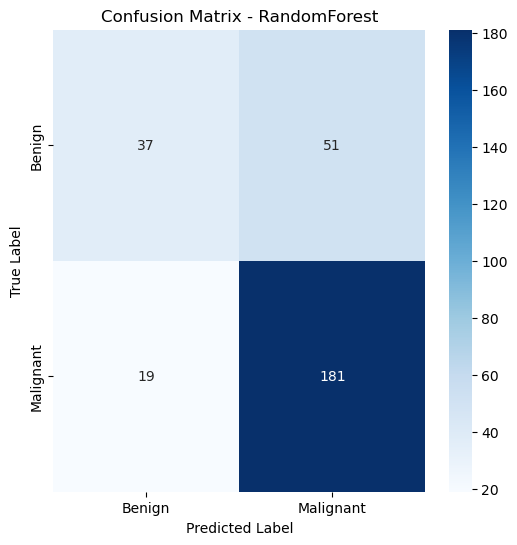

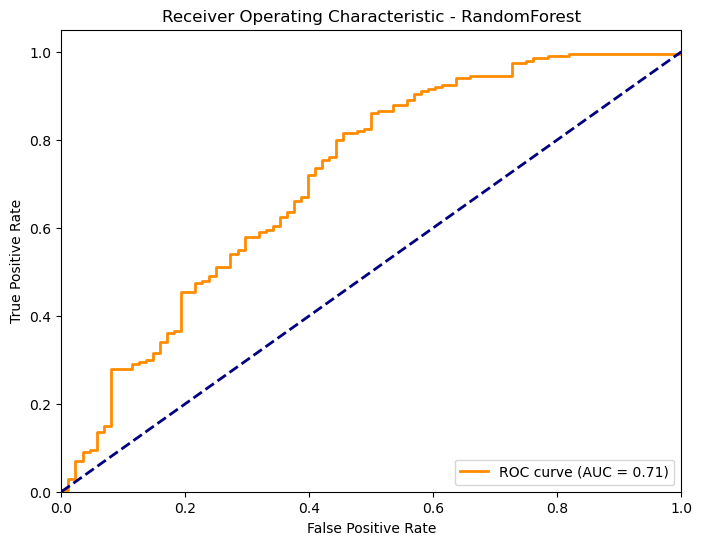


Training SVM...
Fitting 5 folds for each of 108 candidates, totalling 540 fits
SVM - Test Accuracy: 0.6285
SVM - Test ROC AUC: 0.6560
              precision    recall  f1-score   support

           0       0.42      0.60      0.50        88
           1       0.79      0.64      0.71       200

    accuracy                           0.63       288
   macro avg       0.60      0.62      0.60       288
weighted avg       0.67      0.63      0.64       288



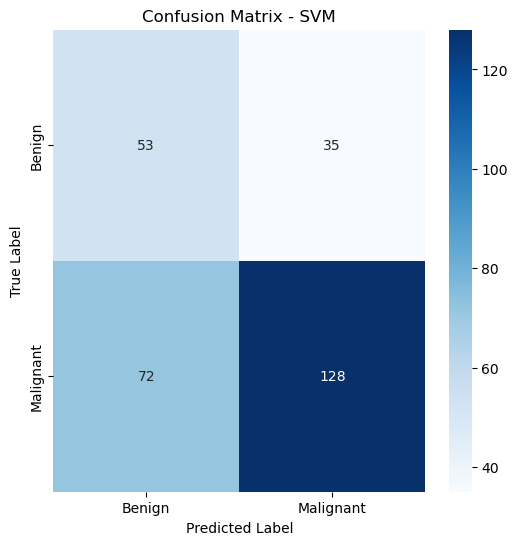

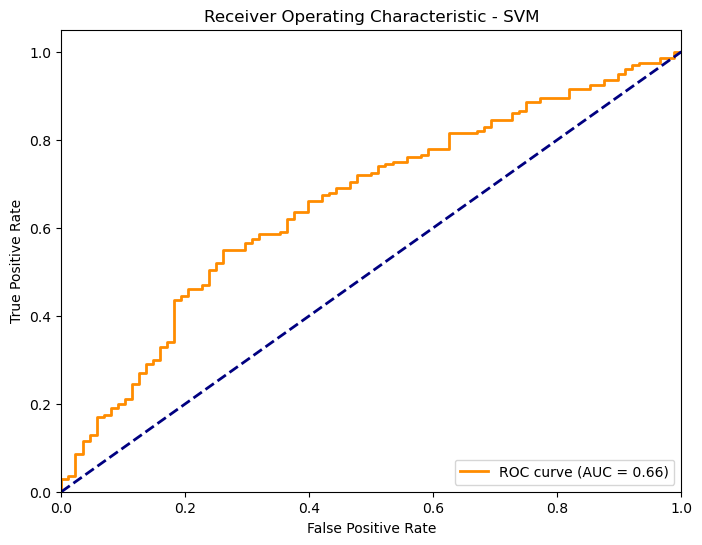


Training XGBoost...
Fitting 5 folds for each of 486 candidates, totalling 2430 fits


C:\Users\pnryl\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBoost - Test Accuracy: 0.6875
XGBoost - Test ROC AUC: 0.6752
              precision    recall  f1-score   support

           0       0.49      0.40      0.44        88
           1       0.75      0.81      0.78       200

    accuracy                           0.69       288
   macro avg       0.62      0.61      0.61       288
weighted avg       0.67      0.69      0.68       288



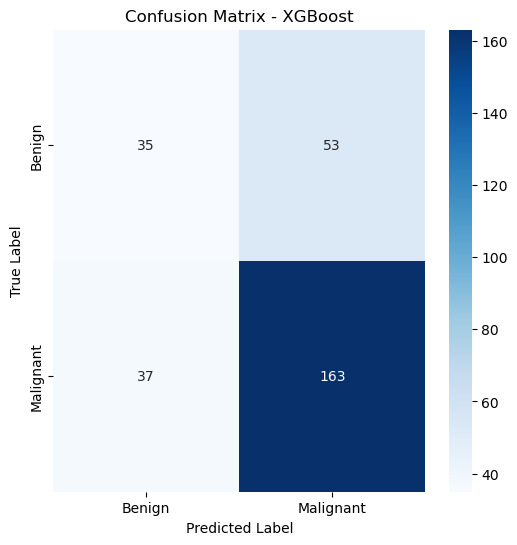

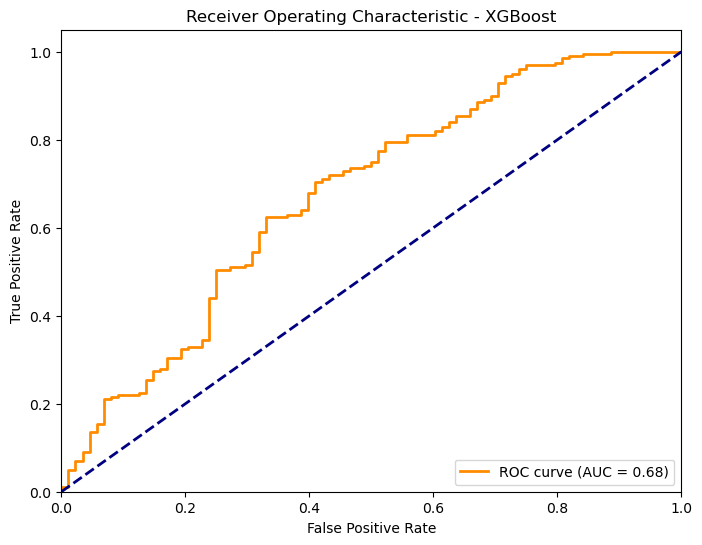


Training LogisticRegression...
Fitting 5 folds for each of 54 candidates, totalling 270 fits
LogisticRegression - Test Accuracy: 0.7014
LogisticRegression - Test ROC AUC: 0.6306
              precision    recall  f1-score   support

           0       0.51      0.43      0.47        88
           1       0.77      0.82      0.79       200

    accuracy                           0.70       288
   macro avg       0.64      0.63      0.63       288
weighted avg       0.69      0.70      0.69       288



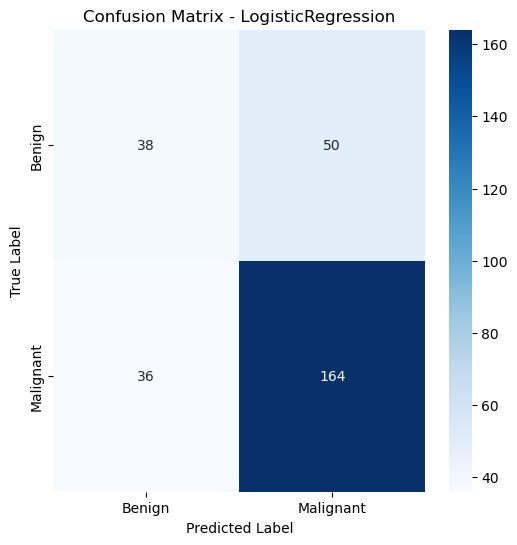

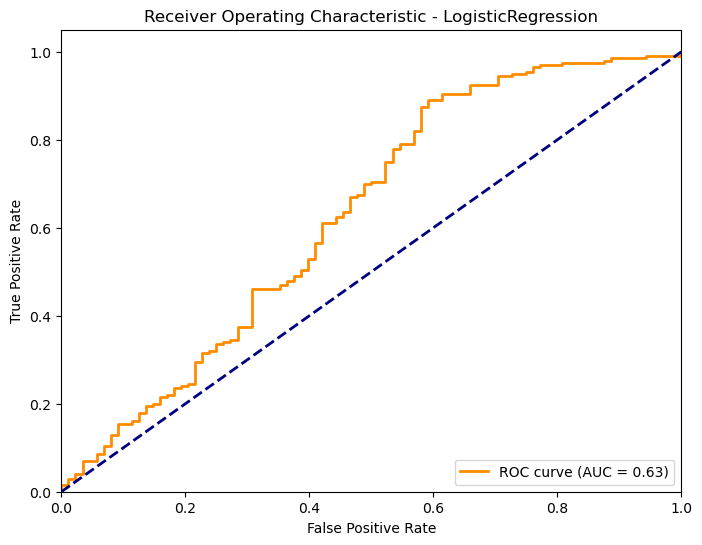


--- Training Ensemble Model: Voting Classifier ---
VotingClassifier - Test Accuracy: 0.7257
VotingClassifier - Test Precision: 0.7713
VotingClassifier - Test Recall: 0.8600
VotingClassifier - Test F1-score: 0.8132
VotingClassifier - Test ROC AUC: 0.6993

Classification Report for VotingClassifier:
               precision    recall  f1-score   support

           0       0.57      0.42      0.48        88
           1       0.77      0.86      0.81       200

    accuracy                           0.73       288
   macro avg       0.67      0.64      0.65       288
weighted avg       0.71      0.73      0.71       288



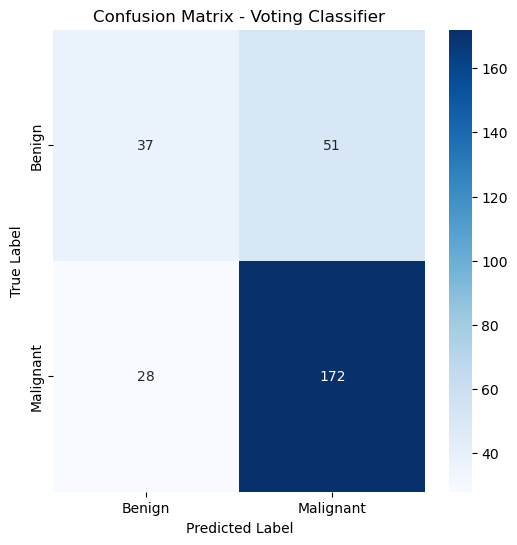

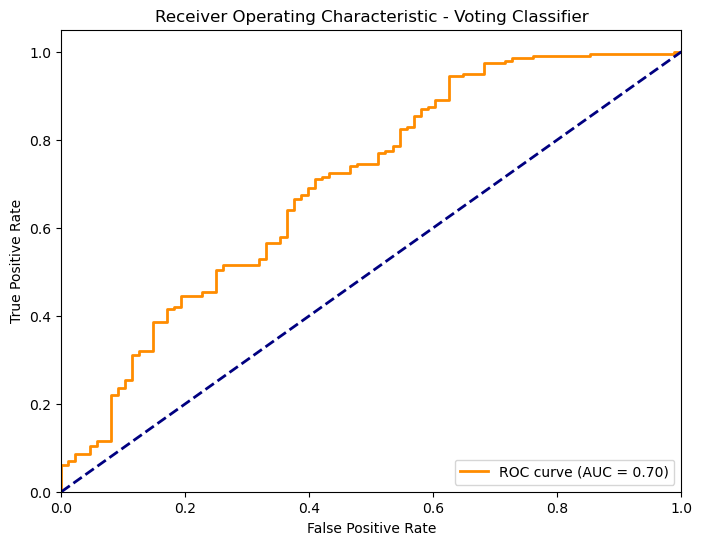


--- Final Model Comparison (with Ensemble) ---
                   CV Accuracy  Test Accuracy  Test Precision  Test Recall  \
RandomForest           0.74911       0.756944        0.780172        0.905   
VotingClassifier           N/A       0.725694        0.771300        0.860   
LogisticRegression    0.718711       0.701389        0.766355        0.820   
XGBoost               0.763928       0.687500        0.754630        0.815   
SVM                     0.7423       0.628472        0.785276        0.640   

                     Test F1  Test ROC AUC  
RandomForest        0.837963      0.713750  
VotingClassifier    0.813239      0.699261  
LogisticRegression  0.792271      0.630568  
XGBoost             0.783654      0.675227  
SVM                 0.705234      0.656023  


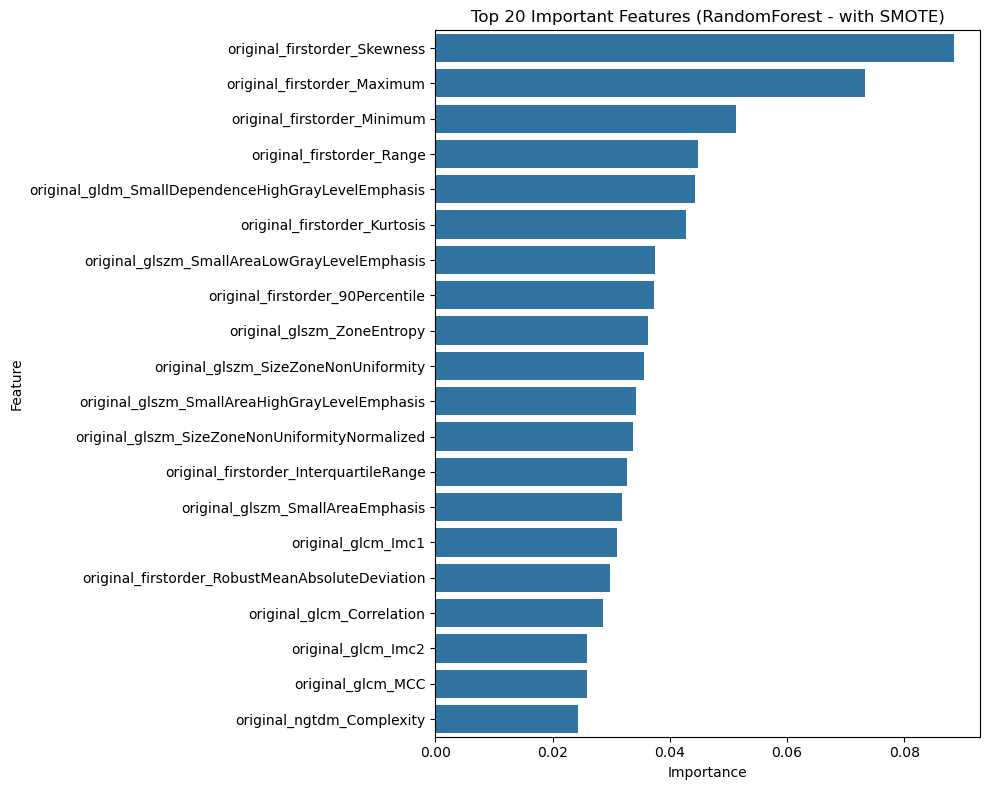

In [36]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, roc_auc_score, confusion_matrix,
                             classification_report, roc_curve, auc)
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE

# --- IMPORTANT MODIFICATION: Loading train and test data from separate CSVs ---

# Define the target column name
target_column_name = 'Class' # As previously clarified

# Load your pre-split training and testing datasets
try:
    train_df =pd.read_csv(r'P:\norm\train40_normalized.csv', delimiter=';')
    test_df = pd.read_csv(r"P:\norm\test40_normalized.csv", delimiter=';')
except FileNotFoundError:
    print("Error: Make sure 'train40.csv' and 'test40.csv' are in the specified path.")
    print("Please check the file paths and try again.")
    exit() # Exit the script if files are not found

# Separate features (X) and target (y) for training data
X_train = train_df.drop(columns=[target_column_name, ','], errors='ignore')
y_train = train_df[target_column_name]

# Separate features (X) and target (y) for testing data
X_test = test_df.drop(columns=[target_column_name, ','], errors='ignore')
y_test = test_df[target_column_name]

# --- End of IMPORTANT MODIFICATION ---

# Check for missing values in train and test sets (optional, but good practice)
print("Missing values in training data:\n", X_train.isnull().sum().sum())
print("Missing values in test data:\n", X_test.isnull().sum().sum())

# Check class distribution in train and test sets
print(f"\ny_train class distribution:\n{y_train.value_counts()}")
print(f"y_test class distribution:\n{y_test.value_counts()}")

# Confirm shapes of the loaded data
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")


# Define the pipeline steps with SMOTE for handling imbalance
pipeline_steps = [
    ('scaler', StandardScaler()),  # Standardize features
    ('feature_selection', SelectKBest(score_func=f_classif)),  # Feature selection
    ('smote', SMOTE(random_state=42)), # SMOTE for oversampling minority class (Important for imbalance!)
    ('classifier', None)  # This will be replaced with different classifiers
]

# Create pipeline using ImbPipeline
pipeline = ImbPipeline(pipeline_steps)

# Define classifiers and their parameter grids for grid search
classifiers = {
    'RandomForest': {
        'classifier_instance': RandomForestClassifier(random_state=42),
        'param_grid': {
            'classifier__n_estimators': [100, 200, 300],
            'classifier__max_depth': [10, 20, None],
            'classifier__min_samples_split': [2, 5, 10],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'SVM': {
        'classifier_instance': SVC(probability=True, random_state=42),
        'param_grid': {
            'classifier__C': [0.1, 1, 10],
            'classifier__kernel': ['linear', 'rbf'],
            'classifier__gamma': ['scale', 'auto'],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'XGBoost': {
        'classifier_instance': XGBClassifier(random_state=42, eval_metric='logloss', use_label_encoder=False),
        'param_grid': {
            'classifier__n_estimators': [100, 200, 300],
            'classifier__max_depth': [3, 6, 9],
            'classifier__learning_rate': [0.01, 0.1, 0.2],
            'classifier__subsample': [0.8, 1.0],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'LogisticRegression': {
        'classifier_instance': LogisticRegression(random_state=42, max_iter=2000),
        'param_grid': {
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['l2'],
            'classifier__solver': ['lbfgs', 'liblinear'],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    }
}

# Evaluate each classifier
results = {}
best_models = {}

for clf_name, clf_info in classifiers.items():
    print(f"\nTraining {clf_name}...")

    pipeline.set_params(classifier=clf_info['classifier_instance'])

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    grid_search = GridSearchCV(
        pipeline,
        param_grid=clf_info['param_grid'],
        cv=cv,
        scoring='f1_weighted',
        n_jobs=-1,
        verbose=1
    )

    grid_search.fit(X_train, y_train)

    best_models[clf_name] = grid_search.best_estimator_
    results[clf_name] = {
        'best_params': grid_search.best_params_,
        'best_score': grid_search.best_score_,
        'cv_results': grid_search.cv_results_
    }

    y_pred = grid_search.predict(X_test)
    y_proba = grid_search.predict_proba(X_test)[:, 1]

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_proba)

    results[clf_name].update({
        'test_accuracy': accuracy,
        'test_precision': precision,
        'test_recall': recall,
        'test_f1': f1,
        'test_roc_auc': roc_auc
    })

    print(f"{clf_name} - Test Accuracy: {accuracy:.4f}")
    print(f"{clf_name} - Test ROC AUC: {roc_auc:.4f}")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Benign', 'Malignant'],
                yticklabels=['Benign', 'Malignant'])
    plt.title(f'Confusion Matrix - {clf_name}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc_val = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2,
             label=f'ROC curve (AUC = {roc_auc_val:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {clf_name}')
    plt.legend(loc="lower right")
    plt.show()

# --- Ensemble Model: Voting Classifier ---
print("\n--- Training Ensemble Model: Voting Classifier ---")

estimators = [
    ('RandomForest', best_models['RandomForest']),
    ('SVM', best_models['SVM']),
    ('XGBoost', best_models['XGBoost']),
    ('LogisticRegression', best_models['LogisticRegression'])
]

voting_clf = VotingClassifier(estimators=estimators, voting='soft', n_jobs=-1)

voting_clf.fit(X_train, y_train)

y_pred_ensemble = voting_clf.predict(X_test)
y_proba_ensemble = voting_clf.predict_proba(X_test)[:, 1]

ensemble_accuracy = accuracy_score(y_test, y_pred_ensemble)
ensemble_precision = precision_score(y_test, y_pred_ensemble)
ensemble_recall = recall_score(y_test, y_pred_ensemble)
ensemble_f1 = f1_score(y_test, y_pred_ensemble)
ensemble_roc_auc = roc_auc_score(y_test, y_proba_ensemble)

print(f"VotingClassifier - Test Accuracy: {ensemble_accuracy:.4f}")
print(f"VotingClassifier - Test Precision: {ensemble_precision:.4f}")
print(f"VotingClassifier - Test Recall: {ensemble_recall:.4f}")
print(f"VotingClassifier - Test F1-score: {ensemble_f1:.4f}")
print(f"VotingClassifier - Test ROC AUC: {ensemble_roc_auc:.4f}")
print("\nClassification Report for VotingClassifier:\n", classification_report(y_test, y_pred_ensemble))

cm_ensemble = confusion_matrix(y_test, y_pred_ensemble)
plt.figure(figsize=(6, 6))
sns.heatmap(cm_ensemble, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Benign', 'Malignant'],
            yticklabels=['Benign', 'Malignant'])
plt.title('Confusion Matrix - Voting Classifier')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

fpr_ensemble, tpr_ensemble, _ = roc_curve(y_test, y_proba_ensemble)
roc_auc_ensemble = auc(fpr_ensemble, tpr_ensemble)

plt.figure(figsize=(8, 6))
plt.plot(fpr_ensemble, tpr_ensemble, color='darkorange', lw=2,
         label=f'ROC curve (AUC = {roc_auc_ensemble:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Voting Classifier')
plt.legend(loc="lower right")
plt.show()

ensemble_results_summary = {
    'CV Accuracy': 'N/A',
    'Test Accuracy': ensemble_accuracy,
    'Test Precision': ensemble_precision,
    'Test Recall': ensemble_recall,
    'Test F1': ensemble_f1,
    'Test ROC AUC': ensemble_roc_auc
}
results['VotingClassifier'] = ensemble_results_summary

print("\n--- Final Model Comparison (with Ensemble) ---")
comparison_df = pd.DataFrame.from_dict({
    clf: {
        'CV Accuracy': res['best_score'] if 'best_score' in res else res['CV Accuracy'],
        'Test Accuracy': res['test_accuracy'] if 'test_accuracy' in res else res['Test Accuracy'],
        'Test Precision': res['test_precision'] if 'test_precision' in res else res['Test Precision'],
        'Test Recall': res['test_recall'] if 'test_recall' in res else res['Test Recall'],
        'Test F1': res['test_f1'] if 'test_f1' in res else res['Test F1'],
        'Test ROC AUC': res['test_roc_auc'] if 'test_roc_auc' in res else res['Test ROC AUC']
    } for clf, res in results.items()
}, orient='index')

print(comparison_df.sort_values(by='Test F1', ascending=False))

# Feature importance from the best model (using RandomForest as example)
# Note: Feature importance here is for the the specific model within the pipeline that includes
# SMOTE and feature selection.
best_model_rf = best_models['RandomForest']
if hasattr(best_model_rf.named_steps['classifier'], 'feature_importances_'):
    selected_features_mask = best_model_rf.named_steps['feature_selection'].get_support()
    # Use X_train.columns to get original feature names (or X_full.columns if you prefer,
    # but X_train is directly used for training features)
    feature_names = X_train.columns[selected_features_mask]

    importances = best_model_rf.named_steps['classifier'].feature_importances_

    feature_importance = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature',
                data=feature_importance.head(20))
    plt.title('Top 20 Important Features (RandomForest - with SMOTE)')
    plt.tight_layout()
    plt.show()
elif hasattr(best_model_rf.named_steps['classifier'], 'coef_'):
    print(f"\nFeature Coefficients for {best_model_rf.named_steps['classifier']._class.name_}:")
    selected_features_mask = best_model_rf.named_steps['feature_selection'].get_support()
    feature_names = X_train.columns[selected_features_mask] # Use X_train.columns

    coefficients = best_model_rf.named_steps['classifier'].coef_[0]

    feature_coef = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': coefficients
    }).sort_values('Coefficient', ascending=False)

    print(feature_coef)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Coefficient', y='Feature',
                data=feature_coef.head(20))
    plt.title(f'Top 20 Feature Coefficients ({best_model_rf.named_steps["classifier"]._class.name_} - with SMOTE)')
    plt.tight_layout()
    plt.show()

else:
    print(f"\nFeature importance/coefficients not directly available for {best_model_rf.named_steps['classifier']._class.name_}.")

In [25]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, roc_auc_score, confusion_matrix,
                             classification_report, roc_curve, auc)
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE

# --- IMPORTANT MODIFICATION: Loading train and test data from separate CSVs ---

# Define the target column name
target_column_name = 'Class' # As previously clarified

# Load your pre-split training and testing datasets
try:
    train_df =pd.read_csv(r'P:\norm\train40_normalized.csv', delimiter=';')
    test_df = pd.read_csv(r"P:\norm\test40_normalized.csv", delimiter=';')
except FileNotFoundError:
    print("Error: Make sure 'train40.csv' and 'test40.csv' are in the specified path.")
    print("Please check the file paths and try again.")
    exit() # Exit the script if files are not found

# Separate features (X) and target (y) for training data
X_train = train_df.drop(columns=[target_column_name, ','], errors='ignore')
y_train = train_df[target_column_name]

# Separate features (X) and target (y) for testing data
X_test = test_df.drop(columns=[target_column_name, ','], errors='ignore')
y_test = test_df[target_column_name]

# --- End of IMPORTANT MODIFICATION ---

# Check for missing values in train and test sets (optional, but good practice)
print("Missing values in training data:\n", X_train.isnull().sum().sum())
print("Missing values in test data:\n", X_test.isnull().sum().sum())

# Check class distribution in train and test sets
print(f"\ny_train class distribution:\n{y_train.value_counts()}")
print(f"y_test class distribution:\n{y_test.value_counts()}")

# Confirm shapes of the loaded data
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")


# Define the pipeline steps with SMOTE for handling imbalance
pipeline_steps = [
    ('scaler', StandardScaler()),  # Standardize features
    ('feature_selection', SelectKBest(score_func=f_classif)),  # Feature selection
    ('smote', SMOTE(random_state=42)), # SMOTE for oversampling minority class (Important for imbalance!)
    ('classifier', None)  # This will be replaced with different classifiers
]

# Create pipeline using ImbPipeline
pipeline = ImbPipeline(pipeline_steps)

# Define classifiers and their parameter grids for grid search
classifiers = {
    'RandomForest': {
        'classifier_instance': RandomForestClassifier(random_state=42),
        'param_grid': {
            'classifier__n_estimators': [100, 200, 300],
            'classifier__max_depth': [10, 20, None],
            'classifier__min_samples_split': [2, 5, 10],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'SVM': {
        'classifier_instance': SVC(probability=True, random_state=42),
        'param_grid': {
            'classifier__C': [0.1, 1, 10],
            'classifier__kernel': ['linear', 'rbf'],
            'classifier__gamma': ['scale', 'auto'],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'XGBoost': {
        'classifier_instance': XGBClassifier(random_state=42, eval_metric='logloss', use_label_encoder=False),
        'param_grid': {
            'classifier__n_estimators': [100, 200, 300],
            'classifier__max_depth': [3, 6, 9],
            'classifier__learning_rate': [0.01, 0.1, 0.2],
            'classifier__subsample': [0.8, 1.0],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    },
    'LogisticRegression': {
        'classifier_instance': LogisticRegression(random_state=42, max_iter=2000),
        'param_grid': {
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['l2'],
            'classifier__solver': ['lbfgs', 'liblinear'],
            'feature_selection__k': [20, 30, 'all'],
            'smote__k_neighbors': [3, 5, 7]
        }
    }
}

# Evaluate each classifier
results = {}
best_models = {}

for clf_name, clf_info in classifiers.items():
    print(f"\nTraining {clf_name}...")

    pipeline.set_params(classifier=clf_info['classifier_instance'])

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    grid_search = GridSearchCV(
        pipeline,
        param_grid=clf_info['param_grid'],
        cv=cv,
        scoring='f1_weighted',
        n_jobs=-1,
        verbose=1
    )

    grid_search.fit(X_train, y_train)

    best_models[clf_name] = grid_search.best_estimator_
    results[clf_name] = {
        'best_params': grid_search.best_params_,
        'best_score': grid_search.best_score_,
        'cv_results': grid_search.cv_results_
    }

    y_pred = grid_search.predict(X_test)
    y_proba = grid_search.predict_proba(X_test)[:, 1]

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_proba)

    results[clf_name].update({
        'test_accuracy': accuracy,
        'test_precision': precision,
        'test_recall': recall,
        'test_f1': f1,
        'test_roc_auc': roc_auc
    })

    print(f"{clf_name} - Test Accuracy: {accuracy:.4f}")
    print(f"{clf_name} - Test ROC AUC: {roc_auc:.4f}")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Benign', 'Malignant'],
                yticklabels=['Benign', 'Malignant'])
    plt.title(f'Confusion Matrix - {clf_name}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc_val = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2,
             label=f'ROC curve (AUC = {roc_auc_val:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {clf_name}')
    plt.legend(loc="lower right")
    plt.show()

# --- Ensemble Model: Voting Classifier ---
print("\n--- Training Ensemble Model: Voting Classifier ---")

estimators = [
    ('RandomForest', best_models['RandomForest']),
    ('SVM', best_models['SVM']),
    ('XGBoost', best_models['XGBoost']),
    ('LogisticRegression', best_models['LogisticRegression'])
]

voting_clf = VotingClassifier(estimators=estimators, voting='soft', n_jobs=-1)

voting_clf.fit(X_train, y_train)

y_pred_ensemble = voting_clf.predict(X_test)
y_proba_ensemble = voting_clf.predict_proba(X_test)[:, 1]

ensemble_accuracy = accuracy_score(y_test, y_pred_ensemble)
ensemble_precision = precision_score(y_test, y_pred_ensemble)
ensemble_recall = recall_score(y_test, y_pred_ensemble)
ensemble_f1 = f1_score(y_test, y_pred_ensemble)
ensemble_roc_auc = roc_auc_score(y_test, y_proba_ensemble)

print(f"VotingClassifier - Test Accuracy: {ensemble_accuracy:.4f}")
print(f"VotingClassifier - Test Precision: {ensemble_precision:.4f}")
print(f"VotingClassifier - Test Recall: {ensemble_recall:.4f}")
print(f"VotingClassifier - Test F1-score: {ensemble_f1:.4f}")
print(f"VotingClassifier - Test ROC AUC: {ensemble_roc_auc:.4f}")
print("\nClassification Report for VotingClassifier:\n", classification_report(y_test, y_pred_ensemble))

cm_ensemble = confusion_matrix(y_test, y_pred_ensemble)
plt.figure(figsize=(6, 6))
sns.heatmap(cm_ensemble, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Benign', 'Malignant'],
            yticklabels=['Benign', 'Malignant'])
plt.title('Confusion Matrix - Voting Classifier')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

fpr_ensemble, tpr_ensemble, _ = roc_curve(y_test, y_proba_ensemble)
roc_auc_ensemble = auc(fpr_ensemble, tpr_ensemble)

plt.figure(figsize=(8, 6))
plt.plot(fpr_ensemble, tpr_ensemble, color='darkorange', lw=2,
         label=f'ROC curve (AUC = {roc_auc_ensemble:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Voting Classifier')
plt.legend(loc="lower right")
plt.show()

ensemble_results_summary = {
    'CV Accuracy': 'N/A',
    'Test Accuracy': ensemble_accuracy,
    'Test Precision': ensemble_precision,
    'Test Recall': ensemble_recall,
    'Test F1': ensemble_f1,
    'Test ROC AUC': ensemble_roc_auc
}
results['VotingClassifier'] = ensemble_results_summary

print("\n--- Final Model Comparison (with Ensemble) ---")
comparison_df = pd.DataFrame.from_dict({
    clf: {
        'CV Accuracy': res['best_score'] if 'best_score' in res else res['CV Accuracy'],
        'Test Accuracy': res['test_accuracy'] if 'test_accuracy' in res else res['Test Accuracy'],
        'Test Precision': res['test_precision'] if 'test_precision' in res else res['Test Precision'],
        'Test Recall': res['test_recall'] if 'test_recall' in res else res['Test Recall'],
        'Test F1': res['test_f1'] if 'test_f1' in res else res['Test F1'],
        'Test ROC AUC': res['test_roc_auc'] if 'test_roc_auc' in res else res['Test ROC AUC']
    } for clf, res in results.items()
}, orient='index')

print(comparison_df.sort_values(by='Test F1', ascending=False))

# Feature importance from the best model (using RandomForest as example)
# Note: Feature importance here is for the the specific model within the pipeline that includes
# SMOTE and feature selection.
best_model_rf = best_models['RandomForest']
if hasattr(best_model_rf.named_steps['classifier'], 'feature_importances_'):
    selected_features_mask = best_model_rf.named_steps['feature_selection'].get_support()
    # Use X_train.columns to get original feature names (or X_full.columns if you prefer,
    # but X_train is directly used for training features)
    feature_names = X_train.columns[selected_features_mask]

    importances = best_model_rf.named_steps['classifier'].feature_importances_

    feature_importance = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature',
                data=feature_importance.head(20))
    plt.title('Top 20 Important Features (RandomForest - with SMOTE)')
    plt.tight_layout()
    plt.show()
elif hasattr(best_model_rf.named_steps['classifier'], 'coef_'):
    print(f"\nFeature Coefficients for {best_model_rf.named_steps['classifier']._class.name_}:")
    selected_features_mask = best_model_rf.named_steps['feature_selection'].get_support()
    feature_names = X_train.columns[selected_features_mask] # Use X_train.columns

    coefficients = best_model_rf.named_steps['classifier'].coef_[0]

    feature_coef = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': coefficients
    }).sort_values('Coefficient', ascending=False)

    print(feature_coef)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Coefficient', y='Feature',
                data=feature_coef.head(20))
    plt.title(f'Top 20 Feature Coefficients ({best_model_rf.named_steps["classifier"]._class.name_} - with SMOTE)')
    plt.tight_layout()
    plt.show()

else:
    print(f"\nFeature importance/coefficients not directly available for {best_model_rf.named_steps['classifier']._class.name_}.")

Missing values in training data:
 0
Missing values in test data:
 0

y_train class distribution:
Class
1    957
0    430
Name: count, dtype: int64
y_test class distribution:
Class
1    200
0     88
Name: count, dtype: int64
X_train shape: (1387, 93), y_train shape: (1387,)
X_test shape: (288, 93), y_test shape: (288,)

Training RandomForest...
Fitting 5 folds for each of 243 candidates, totalling 1215 fits


C:\Users\pnryl\anaconda3\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,
C:\Users\pnryl\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] Sistem belirtilen dosyayı bulamıyor
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\pnryl\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\pnryl\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\pnryl\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args

ValueError: could not convert string to float: '10000000000000000,0'

In [9]:
import math
import json
import os
import logging
import re
import random
import time
from pathlib import Path

import numpy as np
import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers, models, initializers
from tensorflow.keras.layers import (Dense, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D,
                                     LeakyReLU, Input, Flatten, Conv2D, BatchNormalization, Activation)
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.models import load_model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import (EarlyStopping, ModelCheckpoint,
                                        ReduceLROnPlateau, LearningRateScheduler, Callback, TensorBoard)
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.mixed_precision import set_global_policy
from tensorflow.keras.utils import Progbar
from tensorflow.data.experimental import AUTOTUNE

from glob import glob
from collections import defaultdict
from types import SimpleNamespace

from keras import optimizers
from keras.preprocessing.image import load_img, save_img, img_to_array, array_to_img

import torch
import torch.nn as nn
import torchvision.transforms as T
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay,recall_score, cohen_kappa_score,
                             roc_curve, auc, classification_report, matthews_corrcoef,
                             accuracy_score, f1_score, precision_score)
from sklearn.utils.class_weight import compute_class_weight
from collections import Counter
from IPython.display import Image
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt


%matplotlib inline

In [25]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("ambarish/breakhis")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\pnryl\.cache\kagglehub\datasets\ambarish\breakhis\versions\4


In [27]:
image_dir = ambarish_breakhis_path
data_path = image_dir + '\Folds.csv'
# experimental API for making data pipelines
tf.data.experimental.AUTOTUNE
# defining the class names
class_names = ['malignant', 'benign']
print(class_names)

['malignant', 'benign']


In [101]:
data.head(5)

,fold,mag,grp,path,label,label_int,filename
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign,1,SOB_B_A-14-22549AB-100-001.png
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign,1,SOB_B_A-14-22549AB-100-002.png
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign,1,SOB_B_A-14-22549AB-100-003.png
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign,1,SOB_B_A-14-22549AB-100-004.png
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign,1,SOB_B_A-14-22549AB-100-005.png


In [137]:
data = data[data['fold'] == 1]

In [91]:
data['label'] = data['full_path'].apply(lambda x: x.split('/')[3])  # or another index depending on structure

In [95]:
# renaming and structuring the columns for better data understanding
data = data.rename(columns={'filename': 'path'})
data['label'] = data.path.apply(lambda x: x.split('/')[3])
data['label_int'] = data.label.apply(lambda x: class_names.index(x))
data['filename'] = data.path.apply(lambda x: x.split('/')[-1])

In [83]:
data['full_path'] = (
    'BreaKHis_v1/histology_slides/breast/' +
    data['fold'].astype(str) + '/' +
    data['mag'].astype(str) + '/' +
    data['grp'].astype(str) + '/' +
    data['filename'].astype(str)
)


In [135]:
print(data.columns)

Index(['fold', 'mag', 'grp', 'path', 'label', 'label_int', 'filename'], dtype='object')


In [145]:
import os

# Load data directories
train_folder = r"P:\BreakHis_split_proper\train"
test_folder = r"P:\BreakHis_split_proper\test"

# Function to count the number of images in each class (benign, malignant)
def count_images(folder):
    benign_folder = os.path.join(folder, "benign")       # Path to benign images
    malignant_folder = os.path.join(folder, "malignant") # Path to malignant images

    benign_images = os.listdir(benign_folder)            # List all benign image files
    malignant_images = os.listdir(malignant_folder)      # List all malignant image files

    num_benign = len(benign_images)       # Count of benign images
    num_malignant = len(malignant_images) # Count of malignant images

    return num_benign, num_malignant, benign_images, malignant_images

# Count and get list of images in the training set
num_benign_train, num_malignant_train, benign_images_train, malignant_images_train = count_images(train_folder)

# Print count of benign and malignant images in training set
print(f"Number of benign images in the training set: {num_benign_train}")
print(f"Number of malignant images in the training set: {num_malignant_train}")
print("\n")

# If there are any images, calculate the ratio of benign and malignant images
if num_benign_train + num_malignant_train > 0:
    ratio_benign_train = num_benign_train / (num_benign_train + num_malignant_train)
    ratio_malignant_train = num_malignant_train / (num_benign_train + num_malignant_train)

    print(f"Ratio of benign images in the training set: {ratio_benign_train:.2%}")
    print(f"Ratio of malignant images in the training set: {ratio_malignant_train:.2%}")

print("========================================================")

# Count and get list of images in the testing set
num_benign_test, num_malignant_test, benign_images_test, malignant_images_test = count_images(test_folder)

# Print count of benign and malignant images in test set
print(f"Number of benign images in the test set: {num_benign_test}")
print(f"Number of malignant images in the test set: {num_malignant_test}")
print("\n")

# If there are any images, calculate the ratio of benign and malignant images
if num_benign_test + num_malignant_test > 0:
    ratio_benign_test = num_benign_test / (num_benign_test + num_malignant_test)
    ratio_malignant_test = num_malignant_test / (num_benign_test + num_malignant_test)

    print(f"Ratio of benign images in the test set: {ratio_benign_test:.2%}")
    print(f"Ratio of malignant images in the test set: {ratio_malignant_test:.2%}")


Number of benign images in the training set: 1727
Number of malignant images in the training set: 3809


Ratio of benign images in the training set: 31.20%
Ratio of malignant images in the training set: 68.80%
Number of benign images in the test set: 377
Number of malignant images in the test set: 810


Ratio of benign images in the test set: 31.76%
Ratio of malignant images in the test set: 68.24%


Checking image sizes in the training set:
Original image sizes in benign: {(460, 700, 3)}
Original image sizes in malignant: {(460, 700, 3)}

Displaying benign images:


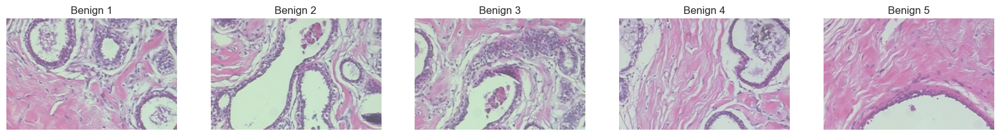


Displaying malignant images:


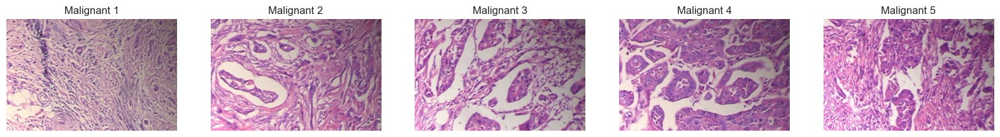

In [147]:
import os
import cv2
import matplotlib.pyplot as plt

# Function to check image sizes
def check_image_sizes(folder, image_list, subfolder):
    sizes = []
    for file_name in image_list[:10]:  # Only check the first 10 images to save time
        img_path = os.path.join(folder, subfolder, file_name)
        img = cv2.imread(img_path)
        if img is not None:
            sizes.append(img.shape)  # Store the shape (height, width, channels)
        else:
            print(f"Failed to load image: {img_path}. Skipping...")
    unique_sizes = set(sizes)  # Get unique sizes to check for consistency
    print(f"Original image sizes in {subfolder}: {unique_sizes}")
    return sizes

# Function to display images (unified version for benign and malignant)
def display_images(image_filenames, folder, title_prefix, max_images=5):
    """Display a few sample images from the provided list"""
    num_images = min(len(image_filenames), max_images)  # Limit to max_images
    fig = plt.figure(figsize=(4 * num_images, 4))  # Dynamically set figure size
    for index, file_name in enumerate(image_filenames[:num_images]):
        img_path = os.path.join(folder, file_name)
        img = cv2.imread(img_path)
        if img is not None:
            ax = fig.add_subplot(1, num_images, index + 1)
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
            ax.axis('off')  # Hide axis
            ax.set_title(f"{title_prefix} {index + 1}")  # Set title
        else:
            print(f"Failed to load image: {img_path}. Skipping...")
    plt.show()

# Check image sizes in the training dataset
print("Checking image sizes in the training set:")
check_image_sizes(train_folder, benign_images_train, "benign")
check_image_sizes(train_folder, malignant_images_train, "malignant")

# Display sample benign images
print("\nDisplaying benign images:")
display_images(benign_images_train, os.path.join(train_folder, "benign"), "Benign")

# Display sample malignant images
print("\nDisplaying malignant images:")
display_images(malignant_images_train, os.path.join(train_folder, "malignant"), "Malignant")


In [4]:
import os
import time
import cv2
import numpy as np
import shutil
from skfuzzy import cmeans
import dask.array as da
import matplotlib.pyplot as plt

# ========== FCM Segmentation using skfuzzy ==========
def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    """
    Initializes cluster centers and assigns labels using scikit-fuzzy FCM.
    """
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:2]), cntr, u

# ========== Optimized FCM with Dask ==========
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()
    normalized_image = (image - np.min(image)) / (np.max(image) - np.min(image))
    flat_image = normalized_image.reshape(-1, 3).T

    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)
        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()
        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)
        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break
        u = new_u

    print(f"✅ Optimized FCM completed in {time.time() - start_time:.2f} seconds.")
    return segmented_image, centroids

# ========== Process All Images in Folder ==========
def process_and_save_images(input_folder, output_folder, num_clusters=5):
    os.makedirs(output_folder, exist_ok=True)
    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.jpg', '.png'))]
    print(f"📂 Found {len(image_files)} images in {input_folder}")

    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        output_path = os.path.join(output_folder, image_file)

        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Failed to read image: {image_path}")
            continue

        image_resized = cv2.resize(image, (299, 299))
        segmented_image, centroids = fuzzy_c_means_optimized(image_resized, num_clusters)

        segmented_image_uint8 = (segmented_image * (255 // (num_clusters - 1))).astype(np.uint8)
        segmented_colored = cv2.applyColorMap(segmented_image_uint8, cv2.COLORMAP_JET)

        cv2.imwrite(output_path, segmented_colored)
        print(f"✅ Saved segmented image: {output_path}")
train_folder = r"P:\BreakHis_split_proper\train"
test_folder = r"P:\BreakHis_split_proper\test"
# ========== Dataset Configuration ==========
train_image_benign = r"P:\BreakHis_split_proper\train\benign"
train_image_malignant = r"P:\BreakHis_split_proper\train\malignant"
save_folder_train_benign = r"P:\BreakHis_split_proper\train\benign3"
save_folder_train_malignant = r"P:\BreakHis_split_proper\train\malignant1"

# ========== Run Segmentation ==========
start_time = time.time()
print("\n🔄 Segmenting TRAIN images (malignant)...")
process_and_save_images(train_image_benign, save_folder_train_benign)

end_time = time.time()
print(f"\n✅ Finished segmenting training set in {end_time - start_time:.2f} seconds.")

ModuleNotFoundError: No module named 'cv2'

In [1]:
import os
import shutil
import pandas as pd
from collections import defaultdict

# Set paths
csv_path = r'P:\BreaKHis_v1\Folds.csv\Folds.csv'  # Replace with your CSV path
base_dir = r'P:\BreaKHis_v1'  # Base dir where image files are located
output_dir = 'P:\BreaKHis_v1\BreaKHis'

# Read CSV with headers
df = pd.read_csv(csv_path)
# Ensure column names are correct
expected_columns = {'fold', 'mag', 'grp', 'filename'}
if not expected_columns.issubset(df.columns):
    raise ValueError(f"CSV file must contain columns: {expected_columns}")

# Summary dictionary
summary = defaultdict(int)

# Process each row
for _, row in df.iterrows():
    fold = f"fold_{row['fold']}"
    mag = f"mag_{row['mag']}"
    grp = row['grp']
    filename = row['filename'].strip()  # Clean extra spaces

    # Build source and destination paths
    src_path = os.path.join(base_dir, filename)
    target_dir = os.path.join(output_dir, fold, mag, grp)
    os.makedirs(target_dir, exist_ok=True)

    # Copy the image if it exists
    if os.path.isfile(src_path):
        shutil.copy2(src_path, target_dir)
        summary[(fold, mag, grp)] += 1
    else:
        print(f"⚠️ File not found: {src_path}")

# Print summary
print("\n📊 Summary of organized images:")
for key in sorted(summary):
    fold, mag, grp = key
    count = summary[key]
    print(f"{fold} / {mag} / {grp} → {count} images")


<>:9: SyntaxWarning: invalid escape sequence '\B'
<>:9: SyntaxWarning: invalid escape sequence '\B'
C:\Users\pnryl\AppData\Local\Temp\ipykernel_12712\1134870237.py:9: SyntaxWarning: invalid escape sequence '\B'
  output_dir = 'P:\BreaKHis_v1\BreaKHis'



📊 Summary of organized images:
fold_1 / mag_100 / test → 760 images
fold_1 / mag_100 / train → 1321 images
fold_1 / mag_200 / test → 744 images
fold_1 / mag_200 / train → 1269 images
fold_1 / mag_40 / test → 745 images
fold_1 / mag_40 / train → 1250 images
fold_1 / mag_400 / test → 655 images
fold_1 / mag_400 / train → 1165 images
fold_2 / mag_100 / test → 620 images
fold_2 / mag_100 / train → 1461 images
fold_2 / mag_200 / test → 597 images
fold_2 / mag_200 / train → 1416 images
fold_2 / mag_40 / test → 632 images
fold_2 / mag_40 / train → 1363 images
fold_2 / mag_400 / test → 554 images
fold_2 / mag_400 / train → 1266 images
fold_3 / mag_100 / test → 669 images
fold_3 / mag_100 / train → 1412 images
fold_3 / mag_200 / test → 659 images
fold_3 / mag_200 / train → 1354 images
fold_3 / mag_40 / test → 657 images
fold_3 / mag_40 / train → 1338 images
fold_3 / mag_400 / test → 592 images
fold_3 / mag_400 / train → 1228 images
fold_4 / mag_100 / test → 698 images
fold_4 / mag_100 / train 

In [29]:
import os
import shutil

# Root directory
root_dir = r'P:\BreaKHis_v1\BreaKHis_Separated'  # This should be the organized one from earlier

# Define which folders are benign and which are malignant
benign = {'adenosis', 'fibroadenoma', 'phyllodes_tumor', 'tubular_adenoma'}
malignant = {'ductal_carcinoma', 'lobular_carcinoma', 'mucinous_carcinoma', 'papillary_carcinoma'}

# Loop through folds 2 to 5
for fold in range(2, 3):
    fold_name = f'fold_{fold}'
    fold_path = os.path.join(root_dir, fold_name)

    # Loop through mag folders
    for mag_folder in os.listdir(fold_path):
        if not mag_folder.startswith('mag_'):
            continue
        mag_path = os.path.join(fold_path, mag_folder)

        for grp in ['train', 'test']:
            grp_path = os.path.join(mag_path, grp)
            if not os.path.isdir(grp_path):
                continue

            # Prepare benign and malignant output dirs
            benign_dir = os.path.join(grp_path, 'benign')
            malignant_dir = os.path.join(grp_path, 'malignant')
            os.makedirs(benign_dir, exist_ok=True)
            os.makedirs(malignant_dir, exist_ok=True)

            # Move each class into its corresponding super-folder
            for cls_folder in os.listdir(grp_path):
                cls_path = os.path.join(grp_path, cls_folder)
                if not os.path.isdir(cls_path) or cls_folder in ['benign', 'malignant']:
                    continue

                if cls_folder in benign:
                    dst = os.path.join(benign_dir, cls_folder)
                elif cls_folder in malignant:
                    dst = os.path.join(malignant_dir, cls_folder)
                else:
                    print(f"⚠️ Unknown class folder: {cls_folder}")
                    continue

                # Move the entire folder
                shutil.move(cls_path, dst)
                print(f"📦 Moved {cls_folder} → {'benign' if cls_folder in benign else 'malignant'}")

print("\n✅ All class folders have been grouped into benign and malignant.")


📦 Moved adenosis → benign
📦 Moved ductal_carcinoma → malignant
📦 Moved fibroadenoma → benign
📦 Moved lobular_carcinoma → malignant
📦 Moved mucinous_carcinoma → malignant
📦 Moved papillary_carcinoma → malignant
📦 Moved phyllodes_tumor → benign
📦 Moved tubular_adenoma → benign
📦 Moved adenosis → benign
📦 Moved ductal_carcinoma → malignant
📦 Moved fibroadenoma → benign
📦 Moved lobular_carcinoma → malignant
📦 Moved mucinous_carcinoma → malignant
📦 Moved papillary_carcinoma → malignant
📦 Moved phyllodes_tumor → benign
📦 Moved tubular_adenoma → benign
📦 Moved adenosis → benign
📦 Moved ductal_carcinoma → malignant
📦 Moved fibroadenoma → benign
📦 Moved lobular_carcinoma → malignant
📦 Moved mucinous_carcinoma → malignant
📦 Moved papillary_carcinoma → malignant
📦 Moved phyllodes_tumor → benign
📦 Moved tubular_adenoma → benign
📦 Moved adenosis → benign
📦 Moved ductal_carcinoma → malignant
📦 Moved fibroadenoma → benign
📦 Moved lobular_carcinoma → malignant
📦 Moved mucinous_carcinoma → malignant
📦 

In [ ]:
print("="*80)
print("=== 🔹 BẮT ĐẦU FINE-TUNING (Giai đoạn 2) ===")
tf.keras.backend.clear_session()
with strategy.scope():
    # Tải mô hình tốt nhất từ Phase 1
    model = tf.keras.models.load_model("./best_model.keras", custom_objects={'F1Score': F1Score})
history_phase_2 = train_model(
    model=model,
    train_data=train_dataset,
    val_data=val_dataset,
    class_weight_dict=class_weight_dict,
    phase=2,
    epochs=PHASE_2_EPOCHS,
    initial_lrate=LEARNING_RATE_PHASE_2,
    validation_steps=validation_steps,
    fine_tune=True
)

In [ ]:
print("="*80)
print("=== 🔹 BẮT ĐẦU HUẤN LUYỆN GIAI ĐOẠN 1 ===")
history_phase_1 = train_model(
    model=model,
    train_data=train_dataset,  # Sử dụng dataset từ phần trước
    val_data=val_dataset,
    class_weight_dict=class_weight_dict,
    phase=1,
    epochs=PHASE_1_EPOCHS,
    initial_lrate=LEARNING_RATE_PHASE_1,
    validation_steps=validation_steps,
    fine_tune=False
)

In [ ]:
!pip install pydot graphviz  
from tensorflow.keras.utils import plot_model  

plot_model(model, to_file='./model_plot_BreaKHis_Cancer.png', show_shapes=True, show_layer_names=True)

In [ ]:
tf.keras.backend.clear_session()
with strategy.scope():
    model = build_model(training=False)
    print(f"Tổng số tham số có thể train (Giai đoạn 1): {count_trainable_params(model):,}")
    model.summary()

In [ ]:
def train_model(model, train_data, val_data, class_weight_dict, phase, epochs, initial_lrate, validation_steps=None, fine_tune=False):
    """
    Hàm huấn luyện mô hình cho từng giai đoạn.
    Args:
        model: Mô hình cần huấn luyện.
        train_data: Dữ liệu huấn luyện (tf.data.Dataset).
        val_data: Dữ liệu validation (tf.data.Dataset).
        class_weight_dict: Trọng số lớp để xử lý mất cân bằng.
        phase: Giai đoạn huấn luyện (1 hoặc 2).
        epochs: Số epoch huấn luyện.
        initial_lrate: Learning rate ban đầu.
        validation_steps: Số bước validation mỗi epoch.
        fine_tune: Có fine-tune base model hay không.
    Returns:
        history: Lịch sử huấn luyện.
    """
    if train_data is None or val_data is None:
        raise ValueError("Dữ liệu huấn luyện hoặc validation không hợp lệ!")

    print(f"Huấn luyện mô hình - Giai đoạn {phase}...")

    # Compile mô hình bên trong strategy.scope()
    with strategy.scope():
        if fine_tune:
            base_model = None
            # Tìm base model InceptionResNetV2 trong các layer của mô hình
            for layer in model.layers:
                if isinstance(layer, tf.keras.Model) and layer.name == 'inception_resnet_v2':
                    base_model = layer
                    break
            if base_model is None:
                raise ValueError("Không tìm thấy InceptionResNetV2 trong mô hình!")

            # Mở khóa base model để fine-tune
            base_model.trainable = True
            print(f"Tổng số layer trong base model: {len(base_model.layers)}")
            # Đóng băng tất cả layer trừ FINE_TUNE_AT layer cuối
            for layer in base_model.layers[:-FINE_TUNE_AT]:
                layer.trainable = False
            # Đóng băng các layer BatchNormalization
            for layer in base_model.layers:
                if isinstance(layer, tf.keras.layers.BatchNormalization):
                    layer.trainable = False

            print(f"Tổng số tham số có thể train (Giai đoạn {phase}): {count_trainable_params(model):,}")
            model.summary()

        # Compile mô hình
        optimizer = tfa.optimizers.AdamW(
            learning_rate=initial_lrate,
            weight_decay=1e-4,
            clipnorm=0.5  # Thêm gradient clipping để tránh gradient bùng nổ
        )
        f1_score_metric = F1Score(threshold=0.5)
        model.compile(
            optimizer=optimizer,
            loss=tf.keras.losses.BinaryCrossentropy(label_smoothing=0.1),  # Tăng label smoothing để giảm overconfidence
            metrics=["accuracy", f1_score_metric],
            steps_per_execution=32
        )

    # Huấn luyện mô hình
    start_time = time.time()
    history = model.fit(
        train_data,
        validation_data=val_data,
        validation_steps=validation_steps,
        steps_per_epoch=steps_per_epoch,
        epochs=epochs,
        callbacks=callbacks_list_phase,
        class_weight=class_weight_dict,
        workers=4,
        use_multiprocessing=True,
        verbose=2
    )

    print(f"Thời gian huấn luyện giai đoạn {phase}: {(time.time() - start_time) / 60:.2f} phút")
    save_history(history, f"history_phase_{phase}.json")

    return history

In [ ]:
def convert_history_to_serializable(history_dict):
    """
    Chuyển đổi history sang định dạng có thể lưu dưới dạng JSON.
    """
    return {key: [float(v) for v in values] for key, values in history_dict.items()}

def save_history(history, filename):
    """
    Lưu history huấn luyện vào file JSON.
    """
    history_path = os.path.join(LOGS_DIR, filename)
    with open(history_path, 'w') as f:
        json.dump(convert_history_to_serializable(history.history), f)
    print(f"Đã lưu history vào {history_path}")

# Callback để lưu mô hình tốt nhất
checkpoint_callback = ModelCheckpoint(
    filepath="/kaggle/working/best_model.keras",
    monitor="accuracy",  
    save_best_only=True,
    save_weights_only=False,
    mode='max',
    verbose=1
)

# Callback giảm learning rate khi val_loss không cải thiện
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=9, 
    min_lr=1e-7,
    verbose=1
)

# Callback Cosine Decay để giảm learning rate dần
cosine_decay = tf.keras.callbacks.LearningRateScheduler(
    tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=LEARNING_RATE_PHASE_1,
        decay_steps=PHASE_1_EPOCHS * steps_per_epoch,
        alpha=0.0  # Giảm learning rate về 0
    )
)

# Callback TensorBoard để theo dõi huấn luyện
tensorboard_callback = TensorBoard(
    log_dir=LOGS_DIR,
    histogram_freq=1,
    write_graph=True,
    update_freq='epoch'
)

# Danh sách callback
callbacks_list_phase = [checkpoint_callback, lr_scheduler, cosine_decay, tensorboard_callback]

In [ ]:
# === 2️⃣ XÂY DỰNG MÔ HÌNH ===
def count_trainable_params(model):
    """
    Đếm số tham số có thể huấn luyện trong mô hình.
    """
    return sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])

def build_model(input_shape=(299, 299, 3), num_classes=1, fine_tune_at=0, training=False):
    """
    Xây dựng mô hình phân loại nhị phân với InceptionResNetV2 làm base model.
    Args:
        input_shape: Kích thước đầu vào của ảnh (mặc định: 299x299x3).
        num_classes: Số lớp đầu ra (mặc định: 1 cho phân loại nhị phân).
        fine_tune_at: Số layer cuối của base model sẽ được mở khóa để fine-tune (0 nếu không fine-tune).
        training: Chế độ huấn luyện (True/False).
    Returns:
        model: Mô hình đã được xây dựng.
    """
    # Tải base model InceptionResNetV2 với trọng số ImageNet
    base_model = tf.keras.applications.InceptionResNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    
    # Đóng băng base model ban đầu
    base_model.trainable = False
    
    # Mở khóa các layer cuối nếu fine_tune_at > 0
    if fine_tune_at > 0:
        print(f"Mở khóa {fine_tune_at} lớp cuối của Base Model để fine-tune")
        base_model.trainable = True
        for layer in base_model.layers[:-fine_tune_at]:
            layer.trainable = False
        # Đóng băng các layer BatchNormalization để tránh vấn đề khi fine-tune
        for layer in base_model.layers:
            if isinstance(layer, tf.keras.layers.BatchNormalization):
                layer.trainable = False

    # Xây dựng mô hình
    inputs = tf.keras.Input(shape=input_shape)
    x = base_model(inputs, training=training)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    # Fully connected layers với regularization và dropout mạnh hơn
    x = tf.keras.layers.Dense(130, kernel_initializer='he_uniform', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
    x = tf.keras.layers.Dropout(0.5)(x)  

    x = tf.keras.layers.Dense(70, kernel_initializer='he_uniform', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
    x = tf.keras.layers.Dropout(0.4)(x)  

    # Lớp đầu ra cho phân loại nhị phân
    outputs = tf.keras.layers.Dense(num_classes, activation='sigmoid', dtype=tf.float32)(x)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

In [ ]:
# === 🔹 STRATEGY (Multi-GPU/TPU) ===
strategy = tf.distribute.MirroredStrategy()
print("Running on GPU/CPU with MirroredStrategy")

# === 🔹 CẤU HÌNH HYPERPARAMETERS ===
# Hyperparameters cho Phase 1
PHASE_1_EPOCHS = 125  
LEARNING_RATE_PHASE_1 = 3e-4  
BATCH_SIZE = 16

# Hyperparameters cho Phase 2 (Fine-tuning)
PHASE_2_EPOCHS = 65  
LEARNING_RATE_PHASE_2 = 4e-5  
FINE_TUNE_AT = 205

LOGS_DIR = "./logs"  # Or a specific path you prefer
if not os.path.exists(LOGS_DIR):
    os.makedirs(LOGS_DIR, exist_ok=True)

@tf.keras.saving.register_keras_serializable()
class F1Score(tf.keras.metrics.Metric):
    """
    Custom F1-score metric cho bài toán phân loại nhị phân.
    """
    def __init__(self, name='f1_score', threshold=0.5, **kwargs):
        super().__init__(name=name, **kwargs)
        self.threshold = threshold
        self.precision = tf.keras.metrics.Precision(thresholds=threshold)
        self.recall = tf.keras.metrics.Recall(thresholds=threshold)

    def update_state(self, y_true, y_pred, sample_weight=None):
        self.precision.update_state(y_true, y_pred, sample_weight)
        self.recall.update_state(y_true, y_pred, sample_weight)

    def result(self):
        p = self.precision.result()
        r = self.recall.result()
        return tf.where((p + r) > 0, 2 * (p * r) / (p + r), 0.0)

    def reset_states(self):
        self.precision.reset_states()
        self.recall.reset_states()

    def get_config(self):
        config = super().get_config()
        config.update({'threshold': self.threshold})
        return config

In [ ]:
if __name__ == "__main__":
    print("="*80)
    print("========================= BẮT ĐẦU TẢI VÀ CHIA DỮ LIỆU ==========================")

    # Tải và chia dữ liệu
    train_paths, train_labels, val_paths, val_labels, test_paths, test_labels, class_weight_dict = load_and_split_data(
        train_folder, test_folder, seed=SEED
    )

    # Kiểm tra tính hợp lệ của các đường dẫn ảnh
    print("Kiểm tra file ảnh trong train_paths...")
    train_paths, train_labels, discarded_train = verify_image_paths(train_paths, train_labels)
    print(f"Số lượng mẫu trong train sau khi kiểm tra: {len(train_paths)}")

    print("\nKiểm tra file ảnh trong val_paths...")
    val_paths, val_labels, discarded_val = verify_image_paths(val_paths, val_labels)
    print(f"Số lượng mẫu trong validation sau khi kiểm tra: {len(val_paths)}")

    print("\nKiểm tra file ảnh trong test_paths...")
    test_paths, test_labels, discarded_test = verify_image_paths(test_paths, test_labels)
    print(f"Số lượng mẫu trong test sau khi kiểm tra: {len(test_paths)}")

    print("="*40)
    # Tạo dataset
    print("Tạo dataset cho tập train...")
    train_dataset = create_dataset(train_paths, train_labels, BATCH_SIZE, dataset_name="train", augment=True, cache_data=True)

    print("\nTạo dataset cho tập validation...")
    val_dataset = create_dataset(val_paths, val_labels, BATCH_SIZE, dataset_name="val", augment=False, cache_data=True)

    print("\nTạo dataset cho tập test...")
    test_dataset = create_dataset(test_paths, test_labels, BATCH_SIZE, dataset_name="test", augment=False, cache_data=True)

    # Tính số bước mỗi epoch
    steps_per_epoch = len(train_paths) // BATCH_SIZE if len(train_paths) > 0 else 1
    validation_steps = len(val_paths) // BATCH_SIZE if len(val_paths) > 0 else 1
    test_steps = len(test_paths) // BATCH_SIZE if len(test_paths) > 0 else 1

    # Cảnh báo nếu số batch quá nhỏ
    if steps_per_epoch <= 1:
        print("CẢNH BÁO: Số batch trong train_data quá nhỏ, có thể ảnh hưởng đến huấn luyện!")
    if validation_steps <= 1:
        print("CẢNH BÁO: Số batch trong val_data quá nhỏ, có thể ảnh hưởng đến đánh giá!")
    if test_steps <= 1:
        print("CẢNH BÁO: Số batch trong test_data quá nhỏ, có thể ảnh hưởng đến kiểm tra!")

    print("="*40)
    print(f"Số batch trong train_data: {steps_per_epoch}")
    print(f"Số batch trong val_data: {validation_steps}")
    print(f"Số batch trong test_data: {test_steps}")
    print("="*40)

    print("========================= HOÀN TẤT TẢI VÀ CHIA DỮ LIỆU =========================")
    print("="*80)

    # Kiểm tra dataset
    if train_dataset is not None:
        print("Train dataset đã được tạo thành công!")
    if val_dataset is not None:
        print("Validation dataset đã được tạo thành công!")
    if test_dataset is not None:
        print("Test dataset đã được tạo thành công!")

In [ ]:
def verify_image_paths(paths, labels):
    """
    Kiểm tra tính hợp lệ của các đường dẫn ảnh.
    Args:
        paths: Danh sách đường dẫn ảnh.
        labels: Danh sách nhãn tương ứng.
    Returns:
        valid_paths: Danh sách đường dẫn hợp lệ.
        valid_labels: Danh sách nhãn tương ứng.
        discarded_files: Danh sách các file bị loại bỏ.
    """
    valid_paths = []
    valid_labels = []
    discarded_files = []
    for path, label in zip(paths, labels):
        if tf.io.gfile.exists(path):
            try:
                img = tf.io.read_file(path)
                img = tf.image.decode_image(img, channels=3, expand_animations=False)
                img = tf.cast(img, tf.float32)
                img_max = tf.reduce_max(img)
                if img_max < 10.0:  # Giảm ngưỡng để giữ lại nhiều ảnh hơn
                    print(f"Ảnh có giá trị max quá thấp ({img_max}): {path}")
                    discarded_files.append(path)
                    continue
                valid_paths.append(path)
                valid_labels.append(label)
            except tf.errors.InvalidArgumentError:
                print(f"File ảnh không hợp lệ: {path}")
                discarded_files.append(path)
        else:
            print(f"File không tồn tại: {path}")
            discarded_files.append(path)
    if discarded_files:
        print(f"Các file bị loại bỏ trong verify_image_paths: {discarded_files}")
    return valid_paths, valid_labels, discarded_files

# === 8️⃣ HÀM TẠO DATASET ===
def create_dataset(paths, labels, batch_size, dataset_name, augment=False, cache_data=True):
    """
    Tạo tf.data.Dataset từ danh sách đường dẫn và nhãn.
    Args:
        paths: Danh sách đường dẫn ảnh.
        labels: Danh sách nhãn.
        batch_size: Kích thước batch.
        dataset_name: Tên tập dữ liệu ("train", "val", "test").
        augment: Có áp dụng tăng cường dữ liệu hay không.
        cache_data: Có sử dụng cache hay không (default: True).
    Returns:
        dataset: tf.data.Dataset đã được tiền xử lý và batch.
    """
    if len(paths) == 0:
        print(f"Dataset {dataset_name} trống! Không thể tạo dataset.")
        print(f"Số lượng paths: {len(paths)}")
        print(f"Số lượng labels: {len(labels)}")
        return None

    if len(paths) != len(labels):
        print(f"Số lượng paths ({len(paths)}) không khớp với số lượng labels ({len(labels)}) trong dataset {dataset_name}!")
        return None

    unique_labels = set(labels)
    expected_labels = {0, 1}
    if not unique_labels.issubset(expected_labels):
        print(f"Nhãn không hợp lệ trong dataset {dataset_name}! Nhãn tìm thấy: {unique_labels}, Nhãn kỳ vọng: {expected_labels}")
        valid_indices = [i for i, label in enumerate(labels) if label in expected_labels]
        paths = [paths[i] for i in valid_indices]
        labels = [labels[i] for i in valid_indices]
        if len(paths) == 0:
            print(f"Sau khi lọc nhãn không hợp lệ, dataset {dataset_name} trống!")
            return None

    labels = tf.cast(labels, tf.float32)
    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    
    dataset = dataset.map(
        lambda x, y: preprocess_and_augment(x, y, dataset_name, augment=augment), 
        num_parallel_calls=tf.data.AUTOTUNE
    )

    if cache_data:
        dataset = dataset.cache()
        print(f"Sử dụng cache cho dataset {dataset_name}.")
    else:
        print(f"Không sử dụng cache cho dataset {dataset_name} để tiết kiệm RAM.")

    if augment:
        buffer_size = min(len(paths), 2000)
        dataset = dataset.shuffle(buffer_size=buffer_size, reshuffle_each_iteration=True)
        print(f"Áp dụng shuffle cho dataset {dataset_name} với buffer_size={buffer_size}.")

    dataset = dataset.batch(batch_size, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

In [ ]:
def extract_patient_id(filename):
    """
    Trích xuất Patient ID từ tên file ảnh.
    Args:
        filename: Tên file ảnh (string).
    Returns:
        Patient ID (string) hoặc None nếu không trích xuất được.
    """
    try:
        parts = filename.split('-')
        if len(parts) < 3:
            print(f"Định dạng tên file không đúng, không thể trích xuất Patient ID: {filename}")
            return None
        pid = parts[-3]
        # Kiểm tra tính hợp lệ của Patient ID (chỉ chứa chữ và số, độ dài từ 3 đến 15 ký tự)
        if not re.match(r'^[a-zA-Z0-9]{3,15}$', pid):
            print(f"Patient ID không hợp lệ (chứa ký tự không mong muốn hoặc độ dài không phù hợp): {pid} từ file {filename}")
            return None
        return pid
    except Exception as e:
        print(f"Lỗi khi trích xuất Patient ID từ file {filename}: {str(e)}")
        return None

# === 6️⃣ TẢI DỮ LIỆU VÀ CHIA LẠI THEO PATIENT ID ===
def load_and_split_data(train_folder, test_folder, seed=SEED):
    """
    Tải dữ liệu và chia lại train/val/test theo Patient ID để tránh data leakage.
    Args:
        train_folder: Đường dẫn đến thư mục train.
        test_folder: Đường dẫn đến thư mục test.
        seed: Random seed để tái lập kết quả.
    Returns:
        train_paths, train_labels, val_paths, val_labels, test_paths, test_labels, class_weight_dict.
    """
    def get_all_images_with_pid(directory):
        """
        Lấy danh sách đường dẫn ảnh và Patient ID từ một thư mục.
        Args:
            directory: Đường dẫn đến thư mục chứa ảnh.
        Returns:
            image_paths: Danh sách đường dẫn ảnh.
            patient_ids: Danh sách Patient ID tương ứng.
            discarded_files: Danh sách các file bị loại bỏ.
        """
        if not os.path.exists(directory):
            print(f"Thư mục không tồn tại: {directory}")
            return [], [], []
        
        image_paths = []
        patient_ids = []
        discarded_files = []
        total_files = 0
        invalid_files = 0
        for filename in os.listdir(directory):
            if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                total_files += 1
                path = os.path.join(directory, filename)
                if tf.io.gfile.exists(path):
                    pid = extract_patient_id(filename)
                    if pid is None or pid.strip() == "":
                        invalid_files += 1
                        discarded_files.append(path)
                        continue
                    image_paths.append(path)
                    patient_ids.append(pid)
                else:
                    print(f"File không tồn tại: {path}")
                    invalid_files += 1
                    discarded_files.append(path)
        print(f"Thư mục {directory}: Tổng số file ảnh: {total_files}, Số file hợp lệ: {len(image_paths)}, Số file không hợp lệ: {invalid_files}")
        unique_pids = set(patient_ids)
        print(f"Số Patient ID duy nhất trong thư mục {directory}: {len(unique_pids)}")
        print(f"Danh sách Patient ID: {sorted(unique_pids)}\n")
        if discarded_files:
            print(f"Các file bị loại bỏ trong thư mục {directory}: {discarded_files}")
        return image_paths, patient_ids, discarded_files

    # Đường dẫn đến các thư mục con
    benign_train_dir = os.path.join(train_folder, 'benign')
    malign_train_dir = os.path.join(train_folder, 'malignant')
    benign_test_dir = os.path.join(test_folder, 'benign')
    malign_test_dir = os.path.join(test_folder, 'malignant')

    # Lấy danh sách ảnh và Patient ID từ các thư mục
    train_benign_paths, train_benign_pids, discarded_train_benign = get_all_images_with_pid(benign_train_dir)
    train_malign_paths, train_malign_pids, discarded_train_malign = get_all_images_with_pid(malign_train_dir)
    test_benign_paths, test_benign_pids, discarded_test_benign = get_all_images_with_pid(benign_test_dir)
    test_malign_paths, test_malign_pids, discarded_test_malign = get_all_images_with_pid(malign_test_dir)

    # Kiểm tra xem có ảnh hợp lệ không
    if not train_benign_paths and not train_malign_paths:
        print("Không có ảnh hợp lệ trong tập train!")
    if not test_benign_paths and not test_malign_paths:
        print("Không có ảnh hợp lệ trong tập test!")

    # Gộp tất cả dữ liệu
    all_paths = train_benign_paths + train_malign_paths + test_benign_paths + test_malign_paths
    all_labels = [0] * len(train_benign_paths) + [1] * len(train_malign_paths) + \
                 [0] * len(test_benign_paths) + [1] * len(test_malign_paths)
    all_pids = train_benign_pids + train_malign_pids + test_benign_pids + test_malign_pids
    all_discarded = discarded_train_benign + discarded_train_malign + discarded_test_benign + discarded_test_malign

    print("="*80)
    print(f"Số lượng ảnh ban đầu trong train_benign: {len(train_benign_paths)}")
    print(f"Số lượng ảnh ban đầu trong train_malignant: {len(train_malign_paths)}")
    print(f"Số lượng ảnh ban đầu trong test_benign: {len(test_benign_paths)}")
    print(f"Số lượng ảnh ban đầu trong test_malignant: {len(test_malign_paths)}")
    print(f"Tổng số ảnh hợp lệ: {len(all_paths)}")
    print(f"Tổng số ảnh bị loại bỏ: {len(all_discarded)}")
    print("="*80)

    # Nhóm ảnh theo Patient ID
    pid_to_images = defaultdict(list)
    for path, label, pid in zip(all_paths, all_labels, all_pids):
        pid_to_images[pid].append((path, label))

    # Tính nhãn chính của mỗi Patient (dựa trên đa số nhãn của ảnh)
    pid_to_label = {}
    for pid, images in pid_to_images.items():
        labels = [label for _, label in images]
        pid_to_label[pid] = 1 if sum(labels) / len(labels) > 0.5 else 0

    # Chia train/val/test theo Patient ID với stratified sampling
    unique_pids = list(pid_to_images.keys())
    pid_labels = [pid_to_label[pid] for pid in unique_pids]
    train_val_pids, test_pids = train_test_split(unique_pids, test_size=0.2, stratify=pid_labels, random_state=seed)
    train_val_labels = [pid_to_label[pid] for pid in train_val_pids]
    train_pids, val_pids = train_test_split(train_val_pids, test_size=0.2, stratify=train_val_labels, random_state=seed)

    print(f"Số Patient ID duy nhất trong train: {len(train_pids)}")
    print(f"Số Patient ID duy nhất trong validation: {len(val_pids)}")
    print(f"Số Patient ID duy nhất trong test: {len(test_pids)}")
    print("="*80)

    print(f"Danh sách Patient ID trong tập train: {sorted(train_pids)}")
    print(f"Danh sách Patient ID trong tập validation: {sorted(val_pids)}")
    print(f"Danh sách Patient ID trong tập test: {sorted(test_pids)}")
    print("="*80)

    # Phân chia ảnh vào các tập train/val/test
    train_paths = []
    train_labels = []
    val_paths = []
    val_labels = []
    test_paths = []
    test_labels = []

    for pid in train_pids:
        for path, label in pid_to_images[pid]:
            train_paths.append(path)
            train_labels.append(label)
    for pid in val_pids:
        for path, label in pid_to_images[pid]:
            val_paths.append(path)
            val_labels.append(label)
    for pid in test_pids:
        for path, label in pid_to_images[pid]:
            test_paths.append(path)
            test_labels.append(label)

    # Xáo trộn tập train
    train_paths, train_labels = shuffle(train_paths, train_labels, random_state=seed)

    # In phân bố số lượng ảnh theo Patient ID
    def print_pid_distribution(pids, paths, name):
        pid_to_count = defaultdict(int)
        for pid in pids:
            pid_to_count[pid] = sum(1 for path, _ in pid_to_images[pid] if path in paths)
        counts = list(pid_to_count.values())
        if counts:
            print(f"Phân bố số lượng ảnh theo Patient ID trong tập {name}:")
            print(f" - Số ảnh tối đa của một Patient: {max(counts)}")
            print(f" - Số ảnh tối thiểu của một Patient: {min(counts)}")
            print(f" - Số ảnh trung bình của một Patient: {np.mean(counts):.2f}")
        else:
            print(f"Không có dữ liệu trong tập {name} để tính phân bố!")

    print_pid_distribution(train_pids, train_paths, "train")
    print_pid_distribution(val_pids, val_paths, "validation")
    print_pid_distribution(test_pids, test_paths, "test")
    print("="*80)

    # Tính class weights để xử lý mất cân bằng lớp
    class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(train_labels), y=train_labels)
    class_weight_dict = {i: float(w) for i, w in enumerate(class_weights)}

    # Kiểm tra data leakage
    train_val_pids_set = set(train_pids + val_pids)
    test_pids_set = set(test_pids)
    overlap_ids = train_val_pids_set.intersection(test_pids_set)
    print(f"Số Patient ID trùng giữa train/val và test: {len(overlap_ids)}")
    if overlap_ids:
        print(f"Danh sách Patient ID trùng: {sorted(overlap_ids)}")

    train_pids_set = set(train_pids)
    val_pids_set = set(val_pids)
    overlap_train_val = train_pids_set.intersection(val_pids_set)
    print(f"Số Patient ID trùng giữa train và validation: {len(overlap_train_val)}")
    if overlap_train_val:
        print(f"Danh sách Patient ID trùng: {sorted(overlap_train_val)}")
    print("="*80)

    # In thông tin số lượng ảnh và tỷ lệ lớp
    print(f"Số lượng ảnh train: {len(train_paths)}")
    print(f"Số lượng ảnh validation: {len(val_paths)}")
    print(f"Số lượng ảnh test: {len(test_paths)}")
    print("="*80)
    print(f"Tỷ lệ lớp trong train: Benign={sum(1 for l in train_labels if l == 0)} ({sum(1 for l in train_labels if l == 0)/len(train_labels):.2%}), Malignant={sum(1 for l in train_labels if l == 1)} ({sum(1 for l in train_labels if l == 1)/len(train_labels):.2%})")
    print(f"Tỷ lệ lớp trong validation: Benign={sum(1 for l in val_labels if l == 0)} ({sum(1 for l in val_labels if l == 0)/len(val_labels):.2%}), Malignant={sum(1 for l in val_labels if l == 1)} ({sum(1 for l in val_labels if l == 1)/len(val_labels):.2%})")
    print(f"Tỷ lệ lớp trong test: Benign={sum(1 for l in test_labels if l == 0)} ({sum(1 for l in test_labels if l == 0)/len(test_labels):.2%}), Malignant={sum(1 for l in test_labels if l == 1)} ({sum(1 for l in test_labels if l == 1)/len(test_labels):.2%})")
    print("="*80)
    print(f"Class weights: {class_weight_dict}")
    print("="*80)

    return train_paths, train_labels, val_paths, val_labels, test_paths, test_labels, class_weight_dict

In [ ]:
IMG_SIZE = (299, 299)  # Kích thước ảnh phù hợp với InceptionResNetV2
BATCH_SIZE = 16        # Kích thước batch
SEED = 42              # Seed để tái lập kết quả
train_folder =r"P:\BreaKHis_v1\200\train"
test_folder = r"P:\BreaKHis_v1\200\test"

In [ ]:
import cv2
import numpy as np
import tensorflow as tf

def apply_clahe_and_enhance(image):
    """
    Áp dụng CLAHE và tăng cường cạnh cho ảnh xám.
    Args:
        image: Ảnh xám trong thang [0, 255] (dtype: float32 hoặc uint8).
    Returns:
        Ảnh xám trong thang [0, 255] (dtype: float32).
    """
    image = (image * 255.0).astype(np.uint8) if image.dtype != np.uint8 else image
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    # Apply CLAHE to the grayscale image directly
    clahe_image = clahe.apply(image)

    # Edge enhancement using Laplacian
    laplacian = cv2.Laplacian(clahe_image, cv2.CV_8U)
    enhanced_image = cv2.addWeighted(clahe_image, 0.8, laplacian, 0.2, 0.0)

    # Apply sharpening filter
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], dtype=np.float32)
    result = cv2.filter2D(enhanced_image, -1, kernel)

    result = result.astype(np.float32)
    if result.shape != (299, 299):
        raise ValueError(f"Shape không đúng sau tiền xử lý: {result.shape}")
    if np.any(np.isnan(result)) or np.any(np.isinf(result)):
        raise ValueError("Dữ liệu sau tiền xử lý chứa NaN hoặc Inf!")
    result = np.clip(result, 0, 255)
    return result

# === 3️⃣ TĂNG CƯỜNG DỮ LIỆU ===
common_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.5),
    tf.keras.layers.RandomZoom(0.4),
    tf.keras.layers.RandomTranslation(height_factor=0.3, width_factor=0.3),
    tf.keras.layers.RandomContrast(0.2),
    tf.keras.layers.RandomBrightness(0.1),
    tf.keras.layers.RandomCrop(height=299, width=299),
])

def add_noise(x, gaussian_stddev=0.02, salt_pepper_prob=0.01):
    """
    Thêm nhiễu Gaussian và nhiễu muối tiêu cho ảnh xám.
    Args:
        x: Ảnh xám trong thang [0, 255].
        gaussian_stddev: Độ lệch chuẩn của nhiễu Gaussian.
        salt_pepper_prob: Xác suất của nhiễu muối tiêu.
    Returns:
        Ảnh xám trong thang [0, 255].
    """
    noise = tf.random.normal(shape=tf.shape(x), mean=0.0, stddev=gaussian_stddev * 255, dtype=tf.float32)
    x = x + noise
    x = tf.clip_by_value(x, 0.0, 255.0)

    noise = tf.random.uniform(shape=tf.shape(x), minval=0, maxval=1)
    salt = noise < salt_pepper_prob / 2
    pepper = noise > (1 - salt_pepper_prob / 2)
    x = tf.where(salt, 255.0, x)
    x = tf.where(pepper, 0.0, x)
    return x

def benign_augmentation(x):
    """
    Tăng cường dữ liệu cho lớp Benign: Áp dụng pipeline chung và thêm nhiễu.
    Args:
        x: Ảnh xám trong thang [0, 255].
    Returns:
        Ảnh xám trong thang [0, 255].
    """
    x = common_augmentation(x, training=True)
    x = add_noise(x, gaussian_stddev=0.02, salt_pepper_prob=0.01)
    return x

def malignant_augmentation(x):
    """
    Tăng cường dữ liệu cho lớp Malignant: Áp dụng pipeline chung và thêm nhiễu.
    Args:
        x: Ảnh xám trong thang [0, 255].
    Returns:
        Ảnh xám trong thang [0, 255].
    """
    x = common_augmentation(x, training=True)
    x = add_noise(x, gaussian_stddev=0.01, salt_pepper_prob=0.005)
    return x

# === 4️⃣ HÀM TIỀN XỬ LÝ VÀ TĂNG CƯỜNG TỔNG HỢP ===
def preprocess_and_augment(x, y, dataset_name, augment=False):
    """
    Tiền xử lý và tăng cường dữ liệu cho ảnh xám.
    Args:
        x: Đường dẫn file ảnh (string).
        y: Nhãn (0: Benign, 1: Malignant).
        dataset_name: Tên tập dữ liệu ("train", "val", "test").
        augment: Có áp dụng tăng cường dữ liệu hay không.
    Returns:
        img: Ảnh đã được tiền xử lý và tăng cường (thang [-1, 1]).
        y: Nhãn đã được định dạng lại.
    """
    try:
        if isinstance(x, bytes):
            x = x.decode('utf-8')
        elif not isinstance(x, str):
            x = tf.cast(x, tf.string)

        img = tf.io.read_file(x)
        img = tf.image.decode_png(img, channels=1)  # Grayscale images have 1 channel

        img = tf.image.resize(img, [299, 299])
        img = tf.cast(img, tf.float32)

        img = tf.numpy_function(apply_clahe_and_enhance, [img], tf.float32)
        img = tf.ensure_shape(img, (299, 299))  # Single channel image
        img = tf.clip_by_value(img, 0, 255)

        if augment:
            img = tf.cond(tf.equal(y, 0),
                          lambda: benign_augmentation(img),
                          lambda: malignant_augmentation(img))

        # Chuẩn hóa với mean và std của ImageNet (only for grayscale)
        mean = tf.constant([123.68], dtype=tf.float32)
        std = tf.constant([58.395], dtype=tf.float32)
        img = (img - mean) / std

        # Chuẩn hóa tuyến tính về [-1, 1]
        img_min = tf.reduce_min(img)
        img_max = tf.reduce_max(img)
        img = 2 * (img - img_min) / (img_max - img_min + 1e-8) - 1
        img = tf.clip_by_value(img, -1.0, 1.0)

        y = tf.expand_dims(tf.cast(y, tf.float32), axis=-1)
    except Exception as e:
        print(f"Lỗi trong preprocess_and_augment cho ảnh: {x} - Lỗi: {str(e)}")
        img = tf.zeros([299, 299], dtype=tf.float32)
        y = tf.zeros([1], dtype=tf.float32)
    return img, y


In [ ]:
# === KÍCH HOẠT GPU/TPU ===
def enable_gpu_tpu():
    try:
        tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
        print('Running on TPU:', tpu.master())
        tf.config.experimental_connect_to_cluster(tpu)
        tf.tpu.experimental.initialize_tpu_system(tpu)
        strategy = tf.distribute.TPUStrategy(tpu)
        print("TPU đã kích hoạt với", strategy.num_replicas_in_sync, "lõi!")
        return strategy
    except ValueError:
        gpus = tf.config.list_physical_devices('GPU')
        if gpus:
            try:
                for gpu in gpus:
                    tf.config.experimental.set_memory_growth(gpu, True)
                print(f"{len(gpus)} GPU đã kích hoạt với memory growth!")
                strategy = tf.distribute.MirroredStrategy()
                return strategy
            except RuntimeError as e:
                print(f"Lỗi khi cấu hình GPU: {e}")
        print("Không có GPU/TPU, sẽ chạy trên CPU!")
        strategy = tf.distribute.get_strategy()
        return strategy

strategy = enable_gpu_tpu()

In [53]:
import math
import json
import os
import logging
import re
import random
import time
from pathlib import Path

import numpy as np
import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers, models, initializers
from tensorflow.keras.layers import (Dense, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D,
                                     LeakyReLU, Input, Flatten, Conv2D, BatchNormalization, Activation)
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.models import load_model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import (EarlyStopping, ModelCheckpoint,
                                        ReduceLROnPlateau, LearningRateScheduler, Callback, TensorBoard)
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.mixed_precision import set_global_policy
from tensorflow.keras.utils import Progbar
from tensorflow.data.experimental import AUTOTUNE

from glob import glob
from collections import defaultdict
from types import SimpleNamespace

from keras import optimizers
from keras.preprocessing.image import load_img, save_img, img_to_array, array_to_img

import torch
import torch.nn as nn
import torchvision.transforms as T
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay,recall_score, cohen_kappa_score,
                             roc_curve, auc, classification_report, matthews_corrcoef,
                             accuracy_score, f1_score, precision_score)
from sklearn.utils.class_weight import compute_class_weight
from collections import Counter
from IPython.display import Image
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt


%matplotlib inline

ModuleNotFoundError: No module named 'tensorflow_addons'

In [ ]:
import numpy as np
import cv2
import os
import time
from skfuzzy import cmeans
import dask.array as da
from skfuzzy import cmeans  
import dask  
import dask.array as da  
from dask import delayed  
from dask.distributed import Client  
import skimage.io as io  
import skimage.transform as transform  
from multiprocessing import Pool, get_context  

def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:-1]), cntr, u

# ==== HÀM PHÂN ĐOẠN FCM TỐI ƯU ====
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()

    normalized_image = (image - np.min(image)) / (np.max(image) - np.min(image))
    flat_image = normalized_image.reshape(-1, 3).T

    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)

        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()

        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)

        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break

        u = new_u

    print(f"✅ FCM tối ưu hoàn tất sau {time.time() - start_time:.2f} giây.")
    return segmented_image, centroids

# ==== HÀM PHÂN ĐOẠN TOÀN BỘ ẢNH TRONG THƯ MỤC ====
def process_and_save_images(input_folder, output_folder, num_clusters=5):
    os.makedirs(output_folder, exist_ok=True)

    image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.png'))]
    print(f"📂 Tìm thấy {len(image_files)} ảnh trong {input_folder}")

    # Fixed RGB colors for clusters
    colors = np.array([
        [50, 50, 50],     # Dark gray
        [100, 100, 100],  # Medium dark gray
        [150, 150, 150],  # Medium gray
        [200, 200, 200],  # Light gray
        [250, 250, 250]   # Almost white
    ], dtype=np.uint8)

    if num_clusters > len(colors):
        raise ValueError("❌ Not enough predefined colors for the number of clusters!")

    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        output_path = os.path.join(output_folder, image_file)

        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Không thể đọc ảnh: {image_path}")
            continue

        image_resized = cv2.resize(image, (299, 299))

        # Run optimized FCM
        segmented_image, centroids = fuzzy_c_means_optimized(image_resized, num_clusters)

        # Step 1: Compute brightness of centroids
        brightness = np.mean(centroids, axis=1)

        # Step 2: Sort centroids by brightness
        sorted_indices = np.argsort(brightness)

        # Step 3: Reassign labels for consistency
        new_labels = np.zeros_like(segmented_image)
        for new_label, old_label in enumerate(sorted_indices):
            new_labels[segmented_image == old_label] = new_label

        # Step 4: Assign consistent RGB colors
        segmented_colored = colors[new_labels]

        # Save output
        cv2.imwrite(output_path, segmented_colored)
        print(f"✅ Đã lưu ảnh phân đoạn: {output_path}")
train_image_benign = r"P:\BreaKHis_v1\fold_2\mag_40\test\benign"
train_image_malignant = r"P:\BreaKHis_v1\fold_2\mag_40\test\malignant"
save_folder_train_benign = r"P:\BreaKHis_v1\fold_2\mag_40\test\benign_seg"
save_folder_train_malignant =r"P:\BreaKHis_v1\fold_2\mag_40\test\malignant_seg"
start_time = time.time()

print("\n🔄 Phân đoạn ảnh TRAIN (benign)...")
process_and_save_images(train_image_benign, save_folder_train_benign)

print("\n🔄 Phân đoạn ảnh TRAIN (malignant)...")
process_and_save_images(train_image_malignant, save_folder_train_malignant)

end_time = time.time()
print(f"\n✅ Toàn bộ quá trình phân đoạn tập train hoàn tất trong {end_time - start_time:.2f} giây.")


In [ ]:
import numpy as np
import cv2
import os
import time
from skfuzzy import cmeans
import dask.array as da
from skfuzzy import cmeans  
import dask  
import dask.array as da  
from dask import delayed  
from dask.distributed import Client  
import skimage.io as io  
import skimage.transform as transform  
from multiprocessing import Pool, get_context  

def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:-1]), cntr, u

# ==== HÀM PHÂN ĐOẠN FCM TỐI ƯU ====
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()

    normalized_image = (image - np.min(image)) / (np.max(image) - np.min(image))
    flat_image = normalized_image.reshape(-1, 3).T

    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)

        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()

        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)

        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break

        u = new_u

    print(f"✅ FCM tối ưu hoàn tất sau {time.time() - start_time:.2f} giây.")
    return segmented_image, centroids

# ==== HÀM PHÂN ĐOẠN TOÀN BỘ ẢNH TRONG THƯ MỤC ====
def process_and_save_images(input_folder, output_folder, num_clusters=5):
    os.makedirs(output_folder, exist_ok=True)

    image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.png'))]
    print(f"📂 Tìm thấy {len(image_files)} ảnh trong {input_folder}")

    # Fixed RGB colors for clusters
    colors = np.array([
        [50, 50, 50],     # Dark gray
        [100, 100, 100],  # Medium dark gray
        [150, 150, 150],  # Medium gray
        [200, 200, 200],  # Light gray
        [250, 250, 250]   # Almost white
    ], dtype=np.uint8)

    if num_clusters > len(colors):
        raise ValueError("❌ Not enough predefined colors for the number of clusters!")

    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        output_path = os.path.join(output_folder, image_file)

        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Không thể đọc ảnh: {image_path}")
            continue

        image_resized = cv2.resize(image, (299, 299))

        # Run optimized FCM
        segmented_image, centroids = fuzzy_c_means_optimized(image_resized, num_clusters)

        # Step 1: Compute brightness of centroids
        brightness = np.mean(centroids, axis=1)

        # Step 2: Sort centroids by brightness
        sorted_indices = np.argsort(brightness)

        # Step 3: Reassign labels for consistency
        new_labels = np.zeros_like(segmented_image)
        for new_label, old_label in enumerate(sorted_indices):
            new_labels[segmented_image == old_label] = new_label

        # Step 4: Assign consistent RGB colors
        segmented_colored = colors[new_labels]

        # Save output
        cv2.imwrite(output_path, segmented_colored)
        print(f"✅ Đã lưu ảnh phân đoạn: {output_path}")
train_image_benign = r"P:\BreaKHis_v1\fold_2\mag_100\test\benign"
train_image_malignant = r"P:\BreaKHis_v1\fold_2\mag_100\test\malignant"
save_folder_train_benign = r"P:\BreaKHis_v1\fold_2\mag_100\test\benign_seg"
save_folder_train_malignant =r"P:\BreaKHis_v1\fold_2\mag_100\test\malignant_seg"
start_time = time.time()

print("\n🔄 Phân đoạn ảnh TRAIN (benign)...")
process_and_save_images(train_image_benign, save_folder_train_benign)

print("\n🔄 Phân đoạn ảnh TRAIN (malignant)...")
process_and_save_images(train_image_malignant, save_folder_train_malignant)

end_time = time.time()
print(f"\n✅ Toàn bộ quá trình phân đoạn tập train hoàn tất trong {end_time - start_time:.2f} giây.")



🔄 Phân đoạn ảnh TRAIN (benign)...
📂 Tìm thấy 195 ảnh trong P:\BreaKHis_v1\fold_2\mag_100\test\benign
✅ FCM tối ưu hoàn tất sau 2.72 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\test\benign_seg\SOB_B_A-14-22549G-100-001.png
✅ FCM tối ưu hoàn tất sau 2.26 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\test\benign_seg\SOB_B_A-14-22549G-100-002.png
✅ FCM tối ưu hoàn tất sau 2.83 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\test\benign_seg\SOB_B_A-14-22549G-100-003.png
✅ FCM tối ưu hoàn tất sau 3.09 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\test\benign_seg\SOB_B_A-14-22549G-100-004.png
✅ FCM tối ưu hoàn tất sau 2.38 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\test\benign_seg\SOB_B_A-14-22549G-100-005.png
✅ FCM tối ưu hoàn tất sau 3.00 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\test\benign_seg\SOB_B_A-14-22549G-100-006.png
✅ FCM tối ưu hoàn tất sau 3.26 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\

In [46]:
import numpy as np
import cv2
import os
import time
from skfuzzy import cmeans
import dask.array as da
from skfuzzy import cmeans  
import dask  
import dask.array as da  
from dask import delayed  
from dask.distributed import Client  
import skimage.io as io  
import skimage.transform as transform  
from multiprocessing import Pool, get_context  

def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:-1]), cntr, u

# ==== HÀM PHÂN ĐOẠN FCM TỐI ƯU ====
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()

    normalized_image = (image - np.min(image)) / (np.max(image) - np.min(image))
    flat_image = normalized_image.reshape(-1, 3).T

    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)

        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()

        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)

        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break

        u = new_u

    print(f"✅ FCM tối ưu hoàn tất sau {time.time() - start_time:.2f} giây.")
    return segmented_image, centroids

# ==== HÀM PHÂN ĐOẠN TOÀN BỘ ẢNH TRONG THƯ MỤC ====
def process_and_save_images(input_folder, output_folder, num_clusters=5):
    os.makedirs(output_folder, exist_ok=True)

    image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.png'))]
    print(f"📂 Tìm thấy {len(image_files)} ảnh trong {input_folder}")

    # Fixed RGB colors for clusters
    colors = np.array([
        [50, 50, 50],     # Dark gray
        [100, 100, 100],  # Medium dark gray
        [150, 150, 150],  # Medium gray
        [200, 200, 200],  # Light gray
        [250, 250, 250]   # Almost white
    ], dtype=np.uint8)

    if num_clusters > len(colors):
        raise ValueError("❌ Not enough predefined colors for the number of clusters!")

    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        output_path = os.path.join(output_folder, image_file)

        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Không thể đọc ảnh: {image_path}")
            continue

        image_resized = cv2.resize(image, (299, 299))

        # Run optimized FCM
        segmented_image, centroids = fuzzy_c_means_optimized(image_resized, num_clusters)

        # Step 1: Compute brightness of centroids
        brightness = np.mean(centroids, axis=1)

        # Step 2: Sort centroids by brightness
        sorted_indices = np.argsort(brightness)

        # Step 3: Reassign labels for consistency
        new_labels = np.zeros_like(segmented_image)
        for new_label, old_label in enumerate(sorted_indices):
            new_labels[segmented_image == old_label] = new_label

        # Step 4: Assign consistent RGB colors
        segmented_colored = colors[new_labels]

        # Save output
        cv2.imwrite(output_path, segmented_colored)
        print(f"✅ Đã lưu ảnh phân đoạn: {output_path}")
train_image_benign = r"P:\BreaKHis_v1\fold_2\mag_200\test\benign"
train_image_malignant = r"P:\BreaKHis_v1\fold_2\mag_200\test\malignant"
save_folder_train_benign = r"P:\BreaKHis_v1\fold_2\mag_200\test\benign_seg"
save_folder_train_malignant =r"P:\BreaKHis_v1\fold_2\mag_200\test\malignant_seg"
start_time = time.time()

print("\n🔄 Phân đoạn ảnh TRAIN (benign)...")
process_and_save_images(train_image_benign, save_folder_train_benign)

print("\n🔄 Phân đoạn ảnh TRAIN (malignant)...")
process_and_save_images(train_image_malignant, save_folder_train_malignant)

end_time = time.time()
print(f"\n✅ Toàn bộ quá trình phân đoạn tập train hoàn tất trong {end_time - start_time:.2f} giây.")



🔄 Phân đoạn ảnh TRAIN (benign)...
📂 Tìm thấy 168 ảnh trong P:\BreaKHis_v1\fold_2\mag_200\test\benign
✅ FCM tối ưu hoàn tất sau 2.75 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\test\benign_seg\SOB_B_A-14-22549G-200-001.png
✅ FCM tối ưu hoàn tất sau 2.75 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\test\benign_seg\SOB_B_A-14-22549G-200-002.png
✅ FCM tối ưu hoàn tất sau 2.76 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\test\benign_seg\SOB_B_A-14-22549G-200-003.png
✅ FCM tối ưu hoàn tất sau 2.76 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\test\benign_seg\SOB_B_A-14-22549G-200-004.png
✅ FCM tối ưu hoàn tất sau 2.74 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\test\benign_seg\SOB_B_A-14-22549G-200-005.png
✅ FCM tối ưu hoàn tất sau 2.75 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\test\benign_seg\SOB_B_A-14-22549G-200-006.png
✅ FCM tối ưu hoàn tất sau 2.74 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\

In [45]:
import numpy as np
import cv2
import os
import time
from skfuzzy import cmeans
import dask.array as da
from skfuzzy import cmeans  
import dask  
import dask.array as da  
from dask import delayed  
from dask.distributed import Client  
import skimage.io as io  
import skimage.transform as transform  
from multiprocessing import Pool, get_context  

def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:-1]), cntr, u

# ==== HÀM PHÂN ĐOẠN FCM TỐI ƯU ====
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()

    normalized_image = (image - np.min(image)) / (np.max(image) - np.min(image))
    flat_image = normalized_image.reshape(-1, 3).T

    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)

        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()

        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)

        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break

        u = new_u

    print(f"✅ FCM tối ưu hoàn tất sau {time.time() - start_time:.2f} giây.")
    return segmented_image, centroids

# ==== HÀM PHÂN ĐOẠN TOÀN BỘ ẢNH TRONG THƯ MỤC ====
def process_and_save_images(input_folder, output_folder, num_clusters=5):
    os.makedirs(output_folder, exist_ok=True)

    image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.png'))]
    print(f"📂 Tìm thấy {len(image_files)} ảnh trong {input_folder}")

    # Fixed RGB colors for clusters
    colors = np.array([
        [50, 50, 50],     # Dark gray
        [100, 100, 100],  # Medium dark gray
        [150, 150, 150],  # Medium gray
        [200, 200, 200],  # Light gray
        [250, 250, 250]   # Almost white
    ], dtype=np.uint8)

    if num_clusters > len(colors):
        raise ValueError("❌ Not enough predefined colors for the number of clusters!")

    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        output_path = os.path.join(output_folder, image_file)

        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Không thể đọc ảnh: {image_path}")
            continue

        image_resized = cv2.resize(image, (299, 299))

        # Run optimized FCM
        segmented_image, centroids = fuzzy_c_means_optimized(image_resized, num_clusters)

        # Step 1: Compute brightness of centroids
        brightness = np.mean(centroids, axis=1)

        # Step 2: Sort centroids by brightness
        sorted_indices = np.argsort(brightness)

        # Step 3: Reassign labels for consistency
        new_labels = np.zeros_like(segmented_image)
        for new_label, old_label in enumerate(sorted_indices):
            new_labels[segmented_image == old_label] = new_label

        # Step 4: Assign consistent RGB colors
        segmented_colored = colors[new_labels]

        # Save output
        cv2.imwrite(output_path, segmented_colored)
        print(f"✅ Đã lưu ảnh phân đoạn: {output_path}")
train_image_benign = r"P:\BreaKHis_v1\fold_2\mag_400\test\benign"
train_image_malignant = r"P:\BreaKHis_v1\fold_2\mag_400\test\malignant"
save_folder_train_benign = r"P:\BreaKHis_v1\fold_2\mag_400\test\benign_seg"
save_folder_train_malignant =r"P:\BreaKHis_v1\fold_2\mag_400\test\malignant_seg"
start_time = time.time()

print("\n🔄 Phân đoạn ảnh TRAIN (benign)...")
process_and_save_images(train_image_benign, save_folder_train_benign)

print("\n🔄 Phân đoạn ảnh TRAIN (malignant)...")
process_and_save_images(train_image_malignant, save_folder_train_malignant)

end_time = time.time()
print(f"\n✅ Toàn bộ quá trình phân đoạn tập train hoàn tất trong {end_time - start_time:.2f} giây.")



🔄 Phân đoạn ảnh TRAIN (benign)...
📂 Tìm thấy 169 ảnh trong P:\BreaKHis_v1\fold_2\mag_400\test\benign
✅ FCM tối ưu hoàn tất sau 2.75 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\test\benign_seg\SOB_B_A-14-22549G-400-001.png
✅ FCM tối ưu hoàn tất sau 2.64 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\test\benign_seg\SOB_B_A-14-22549G-400-002.png
✅ FCM tối ưu hoàn tất sau 2.73 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\test\benign_seg\SOB_B_A-14-22549G-400-003.png
✅ FCM tối ưu hoàn tất sau 2.63 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\test\benign_seg\SOB_B_A-14-22549G-400-004.png
✅ FCM tối ưu hoàn tất sau 2.73 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\test\benign_seg\SOB_B_A-14-22549G-400-005.png
✅ FCM tối ưu hoàn tất sau 2.72 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\test\benign_seg\SOB_B_A-14-22549G-400-006.png
✅ FCM tối ưu hoàn tất sau 2.48 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\

In [44]:
import numpy as np
import cv2
import os
import time
from skfuzzy import cmeans
import dask.array as da
from skfuzzy import cmeans  
import dask  
import dask.array as da  
from dask import delayed  
from dask.distributed import Client  
import skimage.io as io  
import skimage.transform as transform  
from multiprocessing import Pool, get_context  

def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:-1]), cntr, u

# ==== HÀM PHÂN ĐOẠN FCM TỐI ƯU ====
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()

    normalized_image = (image - np.min(image)) / (np.max(image) - np.min(image))
    flat_image = normalized_image.reshape(-1, 3).T

    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)

        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()

        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)

        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break

        u = new_u

    print(f"✅ FCM tối ưu hoàn tất sau {time.time() - start_time:.2f} giây.")
    return segmented_image, centroids

# ==== HÀM PHÂN ĐOẠN TOÀN BỘ ẢNH TRONG THƯ MỤC ====
def process_and_save_images(input_folder, output_folder, num_clusters=5):
    os.makedirs(output_folder, exist_ok=True)

    image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.png'))]
    print(f"📂 Tìm thấy {len(image_files)} ảnh trong {input_folder}")

    # Fixed RGB colors for clusters
    colors = np.array([
        [50, 50, 50],     # Dark gray
        [100, 100, 100],  # Medium dark gray
        [150, 150, 150],  # Medium gray
        [200, 200, 200],  # Light gray
        [250, 250, 250]   # Almost white
    ], dtype=np.uint8)

    if num_clusters > len(colors):
        raise ValueError("❌ Not enough predefined colors for the number of clusters!")

    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        output_path = os.path.join(output_folder, image_file)

        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Không thể đọc ảnh: {image_path}")
            continue

        image_resized = cv2.resize(image, (299, 299))

        # Run optimized FCM
        segmented_image, centroids = fuzzy_c_means_optimized(image_resized, num_clusters)

        # Step 1: Compute brightness of centroids
        brightness = np.mean(centroids, axis=1)

        # Step 2: Sort centroids by brightness
        sorted_indices = np.argsort(brightness)

        # Step 3: Reassign labels for consistency
        new_labels = np.zeros_like(segmented_image)
        for new_label, old_label in enumerate(sorted_indices):
            new_labels[segmented_image == old_label] = new_label

        # Step 4: Assign consistent RGB colors
        segmented_colored = colors[new_labels]

        # Save output
        cv2.imwrite(output_path, segmented_colored)
        print(f"✅ Đã lưu ảnh phân đoạn: {output_path}")
train_image_benign = r"P:\BreaKHis_v1\fold_2\mag_400\train\benign"
train_image_malignant = r"P:\BreaKHis_v1\fold_2\mag_400\train\malignant"
save_folder_train_benign = r"P:\BreaKHis_v1\fold_2\mag_400\train\benign_seg"
save_folder_train_malignant =r"P:\BreaKHis_v1\fold_2\mag_400\train\malignant_seg"
start_time = time.time()

print("\n🔄 Phân đoạn ảnh TRAIN (benign)...")
process_and_save_images(train_image_benign, save_folder_train_benign)

print("\n🔄 Phân đoạn ảnh TRAIN (malignant)...")
process_and_save_images(train_image_malignant, save_folder_train_malignant)

end_time = time.time()
print(f"\n✅ Toàn bộ quá trình phân đoạn tập train hoàn tất trong {end_time - start_time:.2f} giây.")



🔄 Phân đoạn ảnh TRAIN (benign)...
📂 Tìm thấy 419 ảnh trong P:\BreaKHis_v1\fold_2\mag_400\train\benign
✅ FCM tối ưu hoàn tất sau 2.69 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\train\benign_seg\SOB_B_A-14-22549AB-400-001.png
✅ FCM tối ưu hoàn tất sau 2.49 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\train\benign_seg\SOB_B_A-14-22549AB-400-002.png
✅ FCM tối ưu hoàn tất sau 1.78 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\train\benign_seg\SOB_B_A-14-22549AB-400-003.png
✅ FCM tối ưu hoàn tất sau 1.92 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\train\benign_seg\SOB_B_A-14-22549AB-400-004.png
✅ FCM tối ưu hoàn tất sau 2.45 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\train\benign_seg\SOB_B_A-14-22549AB-400-005.png
✅ FCM tối ưu hoàn tất sau 2.69 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_400\train\benign_seg\SOB_B_A-14-22549AB-400-006.png
✅ FCM tối ưu hoàn tất sau 2.35 giây.
✅ Đã lưu ảnh phân đoạn: P:

In [43]:
import numpy as np
import cv2
import os
import time
from skfuzzy import cmeans
import dask.array as da
from skfuzzy import cmeans  
import dask  
import dask.array as da  
from dask import delayed  
from dask.distributed import Client  
import skimage.io as io  
import skimage.transform as transform  
from multiprocessing import Pool, get_context  

def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:-1]), cntr, u

# ==== HÀM PHÂN ĐOẠN FCM TỐI ƯU ====
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()

    normalized_image = (image - np.min(image)) / (np.max(image) - np.min(image))
    flat_image = normalized_image.reshape(-1, 3).T

    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)

        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()

        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)

        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break

        u = new_u

    print(f"✅ FCM tối ưu hoàn tất sau {time.time() - start_time:.2f} giây.")
    return segmented_image, centroids

# ==== HÀM PHÂN ĐOẠN TOÀN BỘ ẢNH TRONG THƯ MỤC ====
def process_and_save_images(input_folder, output_folder, num_clusters=5):
    os.makedirs(output_folder, exist_ok=True)

    image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.png'))]
    print(f"📂 Tìm thấy {len(image_files)} ảnh trong {input_folder}")

    # Fixed RGB colors for clusters
    colors = np.array([
        [50, 50, 50],     # Dark gray
        [100, 100, 100],  # Medium dark gray
        [150, 150, 150],  # Medium gray
        [200, 200, 200],  # Light gray
        [250, 250, 250]   # Almost white
    ], dtype=np.uint8)

    if num_clusters > len(colors):
        raise ValueError("❌ Not enough predefined colors for the number of clusters!")

    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        output_path = os.path.join(output_folder, image_file)

        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Không thể đọc ảnh: {image_path}")
            continue

        image_resized = cv2.resize(image, (299, 299))

        # Run optimized FCM
        segmented_image, centroids = fuzzy_c_means_optimized(image_resized, num_clusters)

        # Step 1: Compute brightness of centroids
        brightness = np.mean(centroids, axis=1)

        # Step 2: Sort centroids by brightness
        sorted_indices = np.argsort(brightness)

        # Step 3: Reassign labels for consistency
        new_labels = np.zeros_like(segmented_image)
        for new_label, old_label in enumerate(sorted_indices):
            new_labels[segmented_image == old_label] = new_label

        # Step 4: Assign consistent RGB colors
        segmented_colored = colors[new_labels]

        # Save output
        cv2.imwrite(output_path, segmented_colored)
        print(f"✅ Đã lưu ảnh phân đoạn: {output_path}")
train_image_benign = r"P:\BreaKHis_v1\fold_2\mag_200\train\benign"
train_image_malignant = r"P:\BreaKHis_v1\fold_2\mag_200\train\malignant"
save_folder_train_benign = r"P:\BreaKHis_v1\fold_2\mag_200\train\benign_seg"
save_folder_train_malignant =r"P:\BreaKHis_v1\fold_2\mag_200\train\malignant_seg"
start_time = time.time()

print("\n🔄 Phân đoạn ảnh TRAIN (benign)...")
process_and_save_images(train_image_benign, save_folder_train_benign)

print("\n🔄 Phân đoạn ảnh TRAIN (malignant)...")
process_and_save_images(train_image_malignant, save_folder_train_malignant)

end_time = time.time()
print(f"\n✅ Toàn bộ quá trình phân đoạn tập train hoàn tất trong {end_time - start_time:.2f} giây.")



🔄 Phân đoạn ảnh TRAIN (benign)...
📂 Tìm thấy 455 ảnh trong P:\BreaKHis_v1\fold_2\mag_200\train\benign
✅ FCM tối ưu hoàn tất sau 2.45 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\train\benign_seg\SOB_B_A-14-22549AB-200-001.png
✅ FCM tối ưu hoàn tất sau 2.73 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\train\benign_seg\SOB_B_A-14-22549AB-200-002.png
✅ FCM tối ưu hoàn tất sau 2.89 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\train\benign_seg\SOB_B_A-14-22549AB-200-003.png
✅ FCM tối ưu hoàn tất sau 2.76 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\train\benign_seg\SOB_B_A-14-22549AB-200-004.png
✅ FCM tối ưu hoàn tất sau 3.26 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\train\benign_seg\SOB_B_A-14-22549AB-200-005.png
✅ FCM tối ưu hoàn tất sau 4.17 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_200\train\benign_seg\SOB_B_A-14-22549AB-200-006.png
✅ FCM tối ưu hoàn tất sau 2.87 giây.
✅ Đã lưu ảnh phân đoạn: P:

In [42]:
import numpy as np
import cv2
import os
import time
from skfuzzy import cmeans
import dask.array as da
from skfuzzy import cmeans  
import dask  
import dask.array as da  
from dask import delayed  
from dask.distributed import Client  
import skimage.io as io  
import skimage.transform as transform  
from multiprocessing import Pool, get_context  

def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:-1]), cntr, u

# ==== HÀM PHÂN ĐOẠN FCM TỐI ƯU ====
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()

    normalized_image = (image - np.min(image)) / (np.max(image) - np.min(image))
    flat_image = normalized_image.reshape(-1, 3).T

    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)

        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()

        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)

        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break

        u = new_u

    print(f"✅ FCM tối ưu hoàn tất sau {time.time() - start_time:.2f} giây.")
    return segmented_image, centroids

# ==== HÀM PHÂN ĐOẠN TOÀN BỘ ẢNH TRONG THƯ MỤC ====
def process_and_save_images(input_folder, output_folder, num_clusters=5):
    os.makedirs(output_folder, exist_ok=True)

    image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.png'))]
    print(f"📂 Tìm thấy {len(image_files)} ảnh trong {input_folder}")

    # Fixed RGB colors for clusters
    colors = np.array([
        [50, 50, 50],     # Dark gray
        [100, 100, 100],  # Medium dark gray
        [150, 150, 150],  # Medium gray
        [200, 200, 200],  # Light gray
        [250, 250, 250]   # Almost white
    ], dtype=np.uint8)

    if num_clusters > len(colors):
        raise ValueError("❌ Not enough predefined colors for the number of clusters!")

    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        output_path = os.path.join(output_folder, image_file)

        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Không thể đọc ảnh: {image_path}")
            continue

        image_resized = cv2.resize(image, (299, 299))

        # Run optimized FCM
        segmented_image, centroids = fuzzy_c_means_optimized(image_resized, num_clusters)

        # Step 1: Compute brightness of centroids
        brightness = np.mean(centroids, axis=1)

        # Step 2: Sort centroids by brightness
        sorted_indices = np.argsort(brightness)

        # Step 3: Reassign labels for consistency
        new_labels = np.zeros_like(segmented_image)
        for new_label, old_label in enumerate(sorted_indices):
            new_labels[segmented_image == old_label] = new_label

        # Step 4: Assign consistent RGB colors
        segmented_colored = colors[new_labels]

        # Save output
        cv2.imwrite(output_path, segmented_colored)
        print(f"✅ Đã lưu ảnh phân đoạn: {output_path}")
train_image_benign = r"P:\BreaKHis_v1\fold_2\mag_100\train\benign"
train_image_malignant = r"P:\BreaKHis_v1\fold_2\mag_100\train\malignant"
save_folder_train_benign = r"P:\BreaKHis_v1\fold_2\mag_100\train\benign_seg"
save_folder_train_malignant =r"P:\BreaKHis_v1\fold_2\mag_100\train\malignant_seg"
start_time = time.time()

print("\n🔄 Phân đoạn ảnh TRAIN (benign)...")
process_and_save_images(train_image_benign, save_folder_train_benign)

print("\n🔄 Phân đoạn ảnh TRAIN (malignant)...")
process_and_save_images(train_image_malignant, save_folder_train_malignant)

end_time = time.time()
print(f"\n✅ Toàn bộ quá trình phân đoạn tập train hoàn tất trong {end_time - start_time:.2f} giây.")



🔄 Phân đoạn ảnh TRAIN (benign)...
📂 Tìm thấy 449 ảnh trong P:\BreaKHis_v1\fold_2\mag_100\train\benign
✅ FCM tối ưu hoàn tất sau 3.19 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\train\benign_seg\SOB_B_A-14-22549AB-100-001.png
✅ FCM tối ưu hoàn tất sau 3.00 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\train\benign_seg\SOB_B_A-14-22549AB-100-002.png
✅ FCM tối ưu hoàn tất sau 2.26 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\train\benign_seg\SOB_B_A-14-22549AB-100-003.png
✅ FCM tối ưu hoàn tất sau 3.03 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\train\benign_seg\SOB_B_A-14-22549AB-100-004.png
✅ FCM tối ưu hoàn tất sau 3.05 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\train\benign_seg\SOB_B_A-14-22549AB-100-005.png
✅ FCM tối ưu hoàn tất sau 3.03 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_100\train\benign_seg\SOB_B_A-14-22549AB-100-006.png
✅ FCM tối ưu hoàn tất sau 2.64 giây.
✅ Đã lưu ảnh phân đoạn: P:

In [41]:
import numpy as np
import cv2
import os
import time
from skfuzzy import cmeans
import dask.array as da
from skfuzzy import cmeans  
import dask  
import dask.array as da  
from dask import delayed  
from dask.distributed import Client  
import skimage.io as io  
import skimage.transform as transform  
from multiprocessing import Pool, get_context  

def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:-1]), cntr, u

# ==== HÀM PHÂN ĐOẠN FCM TỐI ƯU ====
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()

    normalized_image = (image - np.min(image)) / (np.max(image) - np.min(image))
    flat_image = normalized_image.reshape(-1, 3).T

    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)

        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()

        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)

        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break

        u = new_u

    print(f"✅ FCM tối ưu hoàn tất sau {time.time() - start_time:.2f} giây.")
    return segmented_image, centroids

# ==== HÀM PHÂN ĐOẠN TOÀN BỘ ẢNH TRONG THƯ MỤC ====
def process_and_save_images(input_folder, output_folder, num_clusters=5):
    os.makedirs(output_folder, exist_ok=True)

    image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.png'))]
    print(f"📂 Tìm thấy {len(image_files)} ảnh trong {input_folder}")

    # Fixed RGB colors for clusters
    colors = np.array([
        [50, 50, 50],     # Dark gray
        [100, 100, 100],  # Medium dark gray
        [150, 150, 150],  # Medium gray
        [200, 200, 200],  # Light gray
        [250, 250, 250]   # Almost white
    ], dtype=np.uint8)

    if num_clusters > len(colors):
        raise ValueError("❌ Not enough predefined colors for the number of clusters!")

    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        output_path = os.path.join(output_folder, image_file)

        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Không thể đọc ảnh: {image_path}")
            continue

        image_resized = cv2.resize(image, (299, 299))

        # Run optimized FCM
        segmented_image, centroids = fuzzy_c_means_optimized(image_resized, num_clusters)

        # Step 1: Compute brightness of centroids
        brightness = np.mean(centroids, axis=1)

        # Step 2: Sort centroids by brightness
        sorted_indices = np.argsort(brightness)

        # Step 3: Reassign labels for consistency
        new_labels = np.zeros_like(segmented_image)
        for new_label, old_label in enumerate(sorted_indices):
            new_labels[segmented_image == old_label] = new_label

        # Step 4: Assign consistent RGB colors
        segmented_colored = colors[new_labels]

        # Save output
        cv2.imwrite(output_path, segmented_colored)
        print(f"✅ Đã lưu ảnh phân đoạn: {output_path}")
train_image_benign = r"P:\BreaKHis_v1\fold_2\mag_40\train\benign"
train_image_malignant = r"P:\BreaKHis_v1\fold_2\mag_40\train\malignant"
save_folder_train_benign = r"P:\BreaKHis_v1\fold_2\mag_40\train\benign_seg"
save_folder_train_malignant =r"P:\BreaKHis_v1\fold_2\mag_40\train\malignant_seg"
start_time = time.time()

print("\n🔄 Phân đoạn ảnh TRAIN (benign)...")
process_and_save_images(train_image_benign, save_folder_train_benign)

print("\n🔄 Phân đoạn ảnh TRAIN (malignant)...")
process_and_save_images(train_image_malignant, save_folder_train_malignant)

end_time = time.time()
print(f"\n✅ Toàn bộ quá trình phân đoạn tập train hoàn tất trong {end_time - start_time:.2f} giây.")



🔄 Phân đoạn ảnh TRAIN (benign)...
📂 Tìm thấy 433 ảnh trong P:\BreaKHis_v1\fold_2\mag_40\train\benign
✅ FCM tối ưu hoàn tất sau 3.19 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_40\train\benign_seg\SOB_B_A-14-22549AB-40-001.png
✅ FCM tối ưu hoàn tất sau 3.26 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_40\train\benign_seg\SOB_B_A-14-22549AB-40-002.png
✅ FCM tối ưu hoàn tất sau 3.23 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_40\train\benign_seg\SOB_B_A-14-22549AB-40-003.png
✅ FCM tối ưu hoàn tất sau 3.01 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_40\train\benign_seg\SOB_B_A-14-22549AB-40-004.png
✅ FCM tối ưu hoàn tất sau 3.53 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_40\train\benign_seg\SOB_B_A-14-22549AB-40-005.png
✅ FCM tối ưu hoàn tất sau 3.01 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\fold_2\mag_40\train\benign_seg\SOB_B_A-14-22549AB-40-006.png
✅ FCM tối ưu hoàn tất sau 2.95 giây.
✅ Đã lưu ảnh phân đoạn: P:\BreaKHis_v1\

✅ Number of segmented benign images in TRAIN set: 437
✅ Number of segmented malignant images in TRAIN set: 934
✅ Number of segmented benign images in TEST set: 196
✅ Number of segmented malignant images in TEST set: 444


C:\Users\pnryl\AppData\Local\Temp\ipykernel_12712\3978991773.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette='viridis')


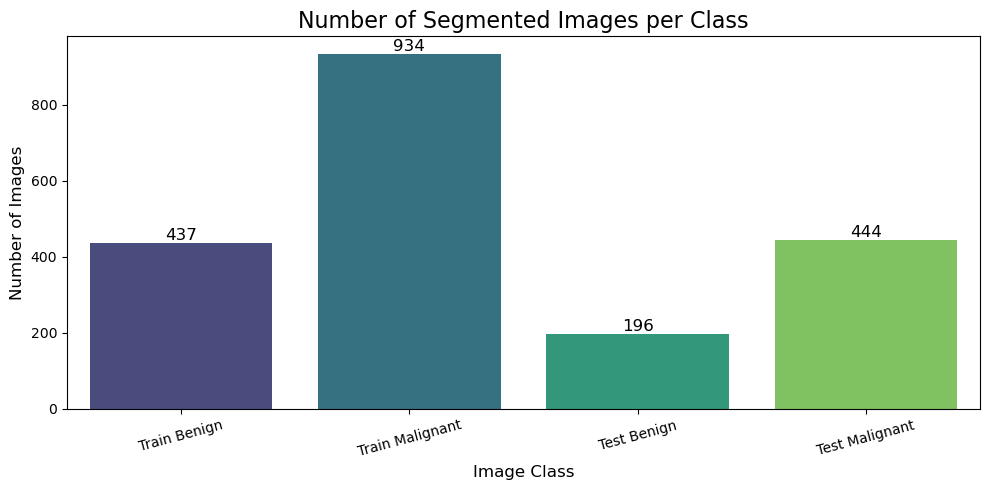

In [31]:
import os
import seaborn as sns
import matplotlib.pyplot as plt

# ======== Function to count images in train and test sets ========
def count_images_in_folders(train_folder, test_folder):
    # Count images in training set
    benign_folder_train = os.path.join(train_folder, "benign")
    malignant_folder_train = os.path.join(train_folder, "malignant")

    benign_images_train = os.listdir(benign_folder_train)
    malignant_images_train = os.listdir(malignant_folder_train)

    num_benign_train = len(benign_images_train)
    num_malignant_train = len(malignant_images_train)

    print(f"✅ Number of segmented benign images in TRAIN set: {num_benign_train}")
    print(f"✅ Number of segmented malignant images in TRAIN set: {num_malignant_train}")
    print("=" * 60)

    # Count images in test set
    benign_folder_test = os.path.join(test_folder, "benign")
    malignant_folder_test = os.path.join(test_folder, "malignant")

    benign_images_test = os.listdir(benign_folder_test)
    malignant_images_test = os.listdir(malignant_folder_test)

    num_benign_test = len(benign_images_test)
    num_malignant_test = len(malignant_images_test)

    print(f"✅ Number of segmented benign images in TEST set: {num_benign_test}")
    print(f"✅ Number of segmented malignant images in TEST set: {num_malignant_test}")

    return num_benign_train, num_malignant_train, num_benign_test, num_malignant_test

# ======== Function to plot image counts ========
def plot_image_counts(num_benign_train, num_malignant_train, num_benign_test, num_malignant_test):
    class_counts = {
        "Train Benign": num_benign_train,
        "Train Malignant": num_malignant_train,
        "Test Benign": num_benign_test,
        "Test Malignant": num_malignant_test,
    }

    plt.figure(figsize=(10, 5))
    ax = sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette='viridis')
    plt.title("Number of Segmented Images per Class", fontsize=16)
    plt.ylabel("Number of Images", fontsize=12)
    plt.xlabel("Image Class", fontsize=12)
    plt.xticks(rotation=15)

    # Annotate each bar with its value
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=12)

    plt.tight_layout()
    plt.show()

# ======== Execution block ========
if __name__ == "__main__":
    train_folder = r"P:\BreaKHis_v1\fold_2\mag_40\train"
    test_folder = r"P:\BreaKHis_v1\fold_2\mag_40\test"

    # Count and visualize image counts
    num_benign_train, num_malignant_train, num_benign_test, num_malignant_test = count_images_in_folders(train_folder, test_folder)
    plot_image_counts(num_benign_train, num_malignant_train, num_benign_test, num_malignant_test)


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# === Function to check image dimensions ===
def check_image_sizes(image_paths, label):
    sizes = []
    for img_path in image_paths[:10]:  # Check only the first 10 images
        img = cv2.imread(img_path)
        if img is not None:
            sizes.append(img.shape)
        else:
            print(f"⚠️ Cannot load image: {img_path}. Skipping...")
    unique_sizes = set(sizes)
    print(f"📏 Unique image sizes in {label}: {unique_sizes}")
    return sizes

# === Function to display sample images ===
def display_sample_images(image_paths, title, num_samples=5):
    valid_paths = [path for path in image_paths if os.path.exists(path)]
    num_display = min(len(valid_paths), num_samples)

    if num_display == 0:
        print(f"⚠️ No valid images to display for: {title}")
        return

    fig = plt.figure(figsize=(4 * num_display, 4))
    for index, img_path in enumerate(valid_paths[:num_display]):
        img = cv2.imread(img_path)
        if img is not None:
            ax = fig.add_subplot(1, num_display, index + 1)
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            ax.axis('off')
            ax.set_title(f"Image {index + 1}", fontsize=14)
        else:
            print(f"⚠️ Cannot load image: {img_path}. Skipping...")

    plt.suptitle(f"Sample Images: {title}", fontsize=20)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# === Define training data folders ===
train_folder = r"P:\BreaKHis_v1\fold_2\mag_40\train"
benign_folder_train = os.path.join(train_folder, "benign")
malignant_folder_train = os.path.join(train_folder, "malignant")

# === Check if folders exist ===
if not os.path.exists(benign_folder_train) or not os.path.exists(malignant_folder_train):
    print(f"❌ One or both folders do not exist:\n{benign_folder_train}\n{malignant_folder_train}")
else:
    # Create image path lists
    benign_images_train_paths = [
        os.path.join(benign_folder_train, img)
        for img in os.listdir(benign_folder_train)
        if img.lower().endswith(('.jpg', '.jpeg', '.png'))
    ]
    malignant_images_train_paths = [
        os.path.join(malignant_folder_train, img)
        for img in os.listdir(malignant_folder_train)
        if img.lower().endswith(('.jpg', '.jpeg', '.png'))
    ]

    # Display sample benign images
    print("\n📷 Displaying benign segmented images:")
    display_sample_images(benign_images_train_paths, "Benign Segmented")

    # Display sample malignant images
    print("\n📷 Displaying malignant segmented images:")
    display_sample_images(malignant_images_train_paths, "Malignant Segmented")

    # Check image sizes
    print("\n📏 Checking image sizes in the training set:")
    check_image_sizes(benign_images_train_paths, "Benign Segmented")
    check_image_sizes(malignant_images_train_paths, "Malignant Segmented")


In [1]:
import os
import time
import cv2
import numpy as np
from skfuzzy import cmeans
import dask.array as da

# ========== FCM Segmentation using scikit-fuzzy ==========
def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:2]), cntr, u

# ========== Optimized FCM with Dask ==========
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()
    flat_image = image.reshape(-1, 3).T

    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)
        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()
        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)
        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break
        u = new_u

    print(f"✅ Optimized FCM completed in {time.time() - start_time:.2f} seconds.")
    return segmented_image, centroids

# ========== Process and Save Images ==========
def process_and_save_images(input_folder, output_folder, num_clusters=5):
    os.makedirs(output_folder, exist_ok=True)
    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.jpg', '.png'))]
    print(f"📂 Found {len(image_files)} images in {input_folder}")

    for image_file in image_files:
        base_name = os.path.splitext(image_file)[0]
        image_path = os.path.join(input_folder, image_file)

        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Failed to read image: {image_path}")
            continue

        image_resized = cv2.resize(image, (299, 299))
        segmented_image, centroids = fuzzy_c_means_optimized(image_resized, num_clusters)

        # Grayscale Label Mask - scaled for visibility
        label_mask = segmented_image.astype(np.uint8)
        scaled_label_mask = (label_mask * (255 // (num_clusters - 1))).astype(np.uint8)
        output_mask_path = os.path.join(output_folder, f"{base_name}_mask.png")
        cv2.imwrite(output_mask_path, scaled_label_mask)

        # Colored Segmentation using OpenCV colormap (same as Code 1)
        colored_segmented = cv2.applyColorMap(scaled_label_mask, cv2.COLORMAP_JET)
        output_colored_path = os.path.join(output_folder, f"{base_name}_segmented.png")
        cv2.imwrite(output_colored_path, colored_segmented)

        print(f"✅ Saved segmented and mask images for: {image_file}")

# ========== Run Example ==========
if __name__ == "__main__":
    train_image_benign = r"P:\BreakHis_split_proper\test\malignant"
    save_folder_train_benign = r"P:\BreakHis_split_proper\test\malignant3"

    print("\n🔄 Segmenting and saving BENIGN class...")
    start_time = time.time()
    process_and_save_images(train_image_benign, save_folder_train_benign, num_clusters=5)
    end_time = time.time()
    print(f"\n✅ Finished processing in {end_time - start_time:.2f} seconds.")



🔄 Segmenting and saving BENIGN class...
📂 Found 810 images in P:\BreakHis_split_proper\test\malignant
✅ Optimized FCM completed in 9.35 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-10926-200-005.png
✅ Optimized FCM completed in 8.91 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-10926-200-008.png
✅ Optimized FCM completed in 7.20 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-10926-40-010.png
✅ Optimized FCM completed in 9.67 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-10926-400-009.png
✅ Optimized FCM completed in 8.31 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-11031-100-008.png
✅ Optimized FCM completed in 7.87 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-11031-200-014.png
✅ Optimized FCM completed in 7.80 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-11031-40-003.png
✅ Optimized FCM completed in 8.61 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-11031-40-006.png
✅ Op

KeyboardInterrupt: 

In [26]:
import os
import time
import cv2
import numpy as np
from skfuzzy import cmeans
from scipy.spatial.distance import cdist
import dask.array as da

# ========== FCM Segmentation using scikit-fuzzy ==========
def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:2]), cntr, u

# ========== Centroid Matching Function ==========
def align_clusters_by_centroids(u, centroids, reference_centroids):
    distances = cdist(centroids, reference_centroids)
    matched_indices = np.argmin(distances, axis=1)
    
    # Create label map
    reordered_labels = np.argmax(u, axis=0)
    label_map = {i: matched_indices[i] for i in range(len(centroids))}
    aligned_labels = np.vectorize(label_map.get)(reordered_labels)
    
    return aligned_labels

# ========== Optimized FCM with Dask ==========
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()
    flat_image = image.reshape(-1, 3).T

    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)
        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()
        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)
        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break
        u = new_u

    print(f"✅ Optimized FCM completed in {time.time() - start_time:.2f} seconds.")
    return segmented_image, centroids, u

# ========== Process and Save Images with Cluster Alignment ==========
def process_and_save_images(input_folder, output_folder, num_clusters=5):
    os.makedirs(output_folder, exist_ok=True)
    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.jpg', '.png'))]
    print(f"📂 Found {len(image_files)} images in {input_folder}")

    reference_centroids = None  # Used to align clusters across images

    for idx, image_file in enumerate(image_files):
        base_name = os.path.splitext(image_file)[0]
        image_path = os.path.join(input_folder, image_file)

        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Failed to read image: {image_path}")
            continue

        image_resized = cv2.resize(image, (299, 299))
        segmented_image, centroids, u = fuzzy_c_means_optimized(image_resized, num_clusters)

        if reference_centroids is None:
            # Set the reference on first image
            reference_centroids = centroids
            label_mask = segmented_image
        else:
            # Align current image's cluster labels to reference
            aligned_labels = align_clusters_by_centroids(u, centroids, reference_centroids)
            label_mask = aligned_labels.reshape(image_resized.shape[:2])

        # Grayscale Label Mask - scaled for visibility
        label_mask_uint8 = label_mask.astype(np.uint8)
        scaled_label_mask = (label_mask_uint8 * (255 // (num_clusters - 1))).astype(np.uint8)
        output_mask_path = os.path.join(output_folder, f"{base_name}_mask.png")
        cv2.imwrite(output_mask_path, scaled_label_mask)

        # Colored Segmentation using OpenCV colormap
        colored_segmented = cv2.applyColorMap(scaled_label_mask, cv2.COLORMAP_JET)
        output_colored_path = os.path.join(output_folder, f"{base_name}_segmented.png")
        cv2.imwrite(output_colored_path, colored_segmented)

        print(f"✅ Saved segmented and mask images for: {image_file}")

# ========== Run Example ==========
if __name__ == "__main__":
    train_image_benign = r"P:\BreakHis_split_proper\test\malignant"
    save_folder_train_benign = r"P:\BreakHis_split_proper\test\malignant3"

    print("\n🔄 Segmenting and saving BENIGN class...")
    start_time = time.time()
    process_and_save_images(train_image_benign, save_folder_train_benign, num_clusters=5)
    end_time = time.time()
    print(f"\n✅ Finished processing in {end_time - start_time:.2f} seconds.")



🔄 Segmenting and saving BENIGN class...
📂 Found 810 images in P:\BreakHis_split_proper\test\malignant
✅ Optimized FCM completed in 4.58 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-10926-200-005.png
✅ Optimized FCM completed in 3.48 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-10926-200-008.png
✅ Optimized FCM completed in 3.15 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-10926-40-010.png
✅ Optimized FCM completed in 4.19 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-10926-400-009.png
✅ Optimized FCM completed in 3.41 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-11031-100-008.png
✅ Optimized FCM completed in 3.19 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-11031-200-014.png
✅ Optimized FCM completed in 3.09 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-11031-40-003.png
✅ Optimized FCM completed in 3.51 seconds.
✅ Saved segmented and mask images for: SOB_M_DC-14-11031-40-006.png
✅ Op

KeyboardInterrupt: 

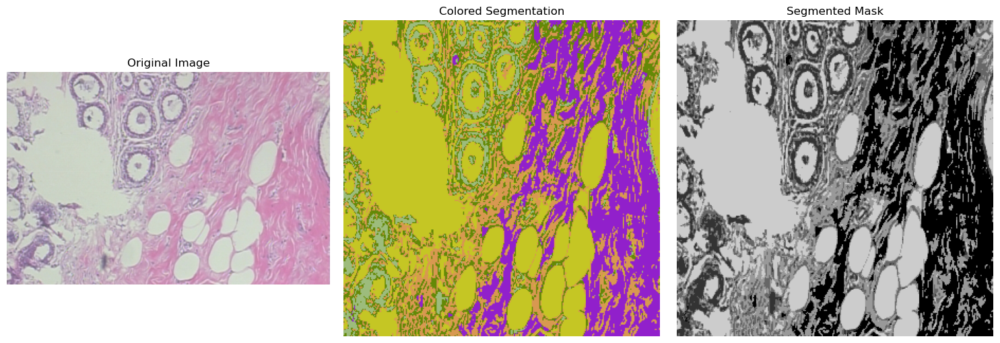

In [141]:
import matplotlib.pyplot as plt
import cv2

# Load images
original = cv2.imread(r'P:\BreakHis_split_proper\test\benign\SOB_B_A-14-22549AB-40-029.png')
segmented = cv2.imread(r'P:\BreakHis_split_proper\test\benign1\SOB_B_A-14-22549AB-40-029_mask.png')
colored = cv2.imread(r'P:\BreakHis_split_proper\test\benign1\SOB_B_A-14-22549AB-40-029_segmented.png')

# Convert from BGR (OpenCV default) to RGB for proper display in matplotlib
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
segmented = cv2.cvtColor(segmented, cv2.COLOR_BGR2RGB)
colored = cv2.cvtColor(colored, cv2.COLOR_BGR2RGB)

# Plot images side by side
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(original)
axs[0].set_title('Original Image')
axs[2].imshow(segmented)
axs[2].set_title('Segmented Mask')
axs[1].imshow(colored)
axs[1].set_title('Colored Segmentation')

# Remove axis ticks
for ax in axs:
    ax.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt
from pathlib import Path

# Define image directories
train_folder = r"P:\BreakHis_split_proper\train"
segmented_train_folder =r"P:\BreakHis_split_proper\train1"

# === Function to visualize original vs segmented images ===
def visualize_random_images(original_folder, segmented_folder, num_images=5):
    """Display original and segmented images side by side."""
    for class_name in ['benign', 'malignant']:
        original_class_folder = Path(original_folder) / class_name
        segmented_class_folder = Path(segmented_folder) / class_name

        # Get image lists
        original_images = sorted([
            img for img in os.listdir(original_class_folder) if img.lower().endswith(('.jpg', '.jpeg', '.png'))
        ])
        segmented_images = sorted([
            img for img in os.listdir(segmented_class_folder) if img.lower().endswith(('.jpg', '.jpeg', '.png'))
        ])

        # Check for empty folders
        if not original_images or not segmented_images:
            print(f"⚠️ No images found in {class_name}. Skipping...")
            continue

        # Select valid image indices
        num_valid_images = min(num_images, len(original_images), len(segmented_images))
        selected_indices = random.sample(range(len(original_images)), num_valid_images)

        # Start visualization
        plt.figure(figsize=(16, 5))
        plt.suptitle(f"{class_name.capitalize()} - Original vs Segmented", fontsize=16)

        for i, idx in enumerate(selected_indices):
            orig_img_path = original_class_folder / original_images[idx]
            seg_img_path = segmented_class_folder / segmented_images[idx]

            # Load images
            orig_img = cv2.imread(str(orig_img_path))
            seg_img = cv2.imread(str(seg_img_path))

            if orig_img is not None:
                orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
                plt.subplot(2, num_valid_images, i + 1)
                plt.imshow(orig_img)
                plt.title(f"Original {i+1}")
                plt.axis("off")
            else:
                print(f"❌ Failed to load original image: {orig_img_path}")

            if seg_img is not None:
                seg_img = cv2.cvtColor(seg_img, cv2.COLOR_BGR2RGB)
                plt.subplot(2, num_valid_images, i + 1 + num_valid_images)
                plt.imshow(seg_img)
                plt.title(f"Segmented {i+1}")
                plt.axis("off")
            else:
                print(f"❌ Failed to load segmented image: {seg_img_path}")

        plt.tight_layout(rect=[0, 0, 1, 0.93])
        plt.show()

# === Call the function to visualize ===
visualize_random_images(original_folder=train_folder, segmented_folder=segmented_train_folder, num_images=5)


In [ ]:
import tensorflow as tf

def enable_gpu_tpu():
    """Activate TPU or GPU if available, otherwise use CPU."""
    try:
        # Prefer using TPU if available
        tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
        print('🔌 TPU detected:', tpu.master())
        tf.config.experimental_connect_to_cluster(tpu)
        tf.tpu.experimental.initialize_tpu_system(tpu)
        strategy = tf.distribute.TPUStrategy(tpu)
        print("✅ TPU activated with", strategy.num_replicas_in_sync, "cores!")
        return strategy
    except ValueError:
        # If no TPU, try activating GPU
        gpus = tf.config.list_physical_devices('GPU')
        if gpus:
            try:
                for gpu in gpus:
                    tf.config.experimental.set_memory_growth(gpu, True)
                print(f"✅ {len(gpus)} GPU(s) activated with memory growth!")
                strategy = tf.distribute.MirroredStrategy()
                return strategy
            except RuntimeError as e:
                print(f"❌ Error configuring GPU: {e}")
        
        # If no TPU or GPU, use CPU
        print("⚠️ No GPU/TPU found — running on CPU.")
        strategy = tf.distribute.get_strategy()
        return strategy

# Activate and print the distribution strategy
strategy = enable_gpu_tpu()


In [3]:
import os
import time
import cv2
import numpy as np
from skfuzzy import cmeans
import dask.array as da
import pandas as pd

# ========== FCM Segmentation using scikit-fuzzy ==========
def segment_image_fcm(image, num_clusters=5, m=1.8, error=0.0001, max_iter=100):
    image_reshaped = image.reshape((-1, 3)).T
    cntr, u, _, _, _, _, _ = cmeans(data=image_reshaped, c=num_clusters, m=m, error=error, maxiter=max_iter)
    labels = np.argmax(u, axis=0)
    return labels.reshape(image.shape[:2]), cntr, u

# ========== Optimized FCM with Dask ==========
def fuzzy_c_means_optimized(image, num_clusters=5, m=2, epsilon=1e-4, max_iter=100):
    start_time = time.time()
    flat_image = image.reshape(-1, 3).T

    # Get labels, centroids, and u from FCM segmentation
    segmented_image, centroids, u = segment_image_fcm(image, num_clusters, m, epsilon, max_iter)
    
    j_history = []

    for iteration in range(max_iter):
        centroids = np.dot((u ** m), flat_image.T) / np.sum(u ** m, axis=1, keepdims=True)
        distances = da.sqrt(da.sum((flat_image.T[:, None, :] - centroids[None, :, :]) ** 2, axis=2)).T.compute()
        distances_safe = np.where(distances > 1e-10, distances, 1e-10)
        new_u = (distances_safe ** (-2 / (m - 1))) / np.sum((distances_safe ** (-2 / (m - 1))), axis=0)
        j = np.sum((u ** m) * (distances ** 2))
        j_history.append(j)

        if iteration > 0 and abs(j_history[-1] - j_history[-2]) < epsilon:
            break
        u = new_u

    print(f"✅ Optimized FCM completed in {time.time() - start_time:.2f} seconds.")
    return segmented_image, centroids

# ========== Visualize Segmentation ==========
def visualize_segmentation(segmented_image, num_clusters):
    # Create a color palette (random colors for each cluster)
    colors = np.random.randint(0, 255, size=(num_clusters, 3), dtype=np.uint8)
    # Map the segmented labels to colors
    colored_image = colors[segmented_image]
    return colored_image

# ========== Process and Save Images ==========
# ========== Process and Save Images ==========
def process_and_save_images(input_folder, original_image_folder, output_folder, num_clusters=5, save_nii=True):
    os.makedirs(output_folder, exist_ok=True)
    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.jpg', '.png'))]
    print(f"📂 Found {len(image_files)} images in {input_folder}")

    for image_file in image_files:
        base_name = image_file.replace(".png", "").replace(".jpg", "")
        image_path = os.path.join(input_folder, image_file)
        original_image_path = os.path.join(original_image_folder, image_file)

        # Read the original image
        image = cv2.imread(image_path)
        original_image = cv2.imread(original_image_path)

        if image is None or original_image is None:
            print(f"❌ Failed to read image: {image_path} or {original_image_path}")
            continue

        # Resize image for consistency
        image_resized = cv2.resize(image, (299, 299))
        original_resized = cv2.resize(original_image, (299, 299))

        # Segment the image using FCM
        segmented_image, centroids = fuzzy_c_means_optimized(image_resized, num_clusters)

        # Visualize segmentation by mapping labels to colors
        colored_segmented_image = visualize_segmentation(segmented_image, num_clusters)

        # Save the segmentation mask as a grayscale image (labels)
        mask_image_path = os.path.join(output_folder, f"{base_name}_mask.png")
        cv2.imwrite(mask_image_path, segmented_image * (255 // num_clusters))  # Rescale mask to 0-255 range for visualization

        # Save the colored segmented image
        colored_image_path = os.path.join(output_folder, f"{base_name}_segmented.png")
        cv2.imwrite(colored_image_path, colored_segmented_image)

        print(f"✅ Processed and saved {base_name} to {output_folder}")

# ========== Directories ==========
train_image_benign = r"P:\BreakHis_split_proper\test\benign"
train_image_malignant = r"P:\BreakHis_split_proper\test\malignant"
save_folder_train_benign = r"P:\BreakHis_split_proper\test\benign1"
save_folder_train_malignant = r"P:\BreakHis_split_proper\test\malignant1"

# ========== Run Segmentation and Feature Extraction ==========
start_time = time.time()

print("\n🔄 Segmenting and saving images for MALIGNANT class...")
process_and_save_images(train_image_malignant, train_image_malignant, save_folder_train_malignant)

end_time = time.time()
print(f"\n✅ Finished processing in {end_time - start_time:.2f} seconds.")


ModuleNotFoundError: No module named 'cv2'

(377, 38)
0      0.308170
1      0.126665
2      0.570246
3      0.172625
4      0.321439
         ...   
372    0.553400
373    0.151647
374    0.121018
375    0.186915
376    0.149204
Name: 5, Length: 377, dtype: float64


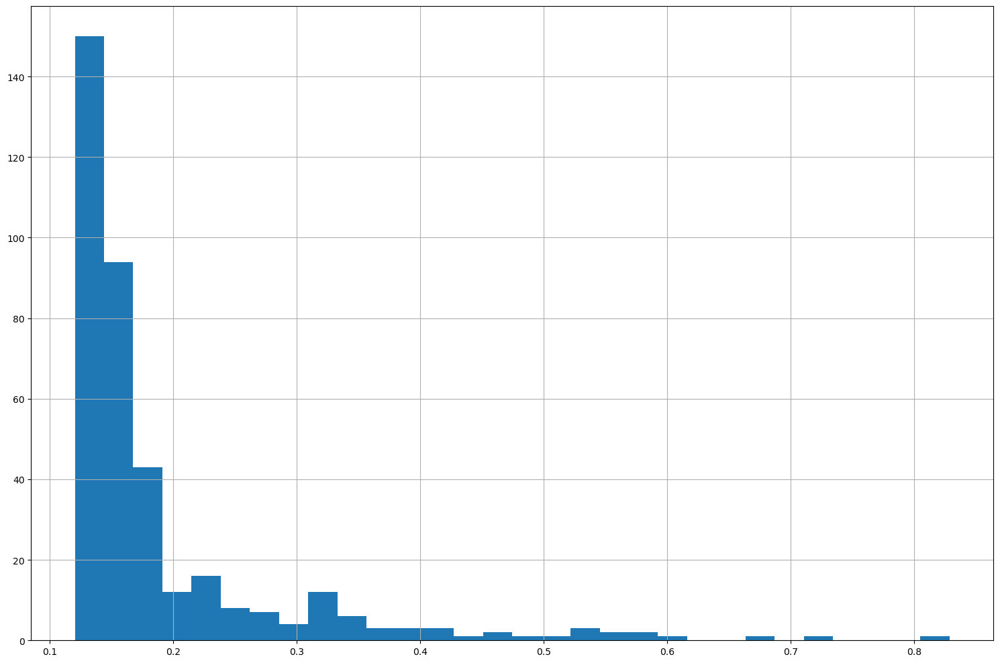

In [145]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Load CSV
df = pd.read_csv(r"P:\BreakHis_split_proper\train\pyradiomics_features_benign1.csv", header=None, sep=';')
print(df.shape)
df = df.iloc[:,5]

# Step 2: Convert all values to numeric (handles strings like '002E+16')
df = df.apply(pd.to_numeric)  # 'coerce' turns non-numeric into NaN
print(df)
# Optional: drop columns or rows with too many NaNs if needed
# df = df.dropna(axis=1)  # Drop columns with NaNs
# df = df.dropna(axis=0)  # Drop rows with NaNs

# Step 3: Plot histograms
df.hist(bins=30, figsize=(15, 10))
plt.tight_layout()
plt.show()


In [20]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\MalignTrainO\400x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\MalignTrain\400x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\train_Malign400.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



🔍 Extracting features for: SOB_M_DC-14-10926-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-400-007
🔍 Extracting features for: SOB_M_DC-14-11031-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-400-007
🔍 Extracting features for: SOB_M_DC-14-11031-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-400-009
🔍 Extracting features for: SOB_M_DC-14-11031-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-400-012
🔍 Extracting features for: SOB_M_DC-14-11031-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-400-014
🔍 Extracting features for: SOB_M_DC-14-11520-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-400-003
🔍 Extracting features for: SOB_M_DC-14-11520-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-400-007
🔍 Extracting features for: SOB_M_DC-14-11520-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-400-009
🔍 Extracting features for: SOB_M_DC-14-11520-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-400-013
🔍 Extracting features for: SOB_M_DC-14-11520-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-001
🔍 Extracting features for: SOB_M_DC-14-11951-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-005
🔍 Extracting features for: SOB_M_DC-14-11951-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-011
🔍 Extracting features for: SOB_M_DC-14-11951-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-013
🔍 Extracting features for: SOB_M_DC-14-11951-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-016
🔍 Extracting features for: SOB_M_DC-14-11951-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-020
🔍 Extracting features for: SOB_M_DC-14-12312-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-002
🔍 Extracting features for: SOB_M_DC-14-12312-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-005
🔍 Extracting features for: SOB_M_DC-14-12312-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-012
🔍 Extracting features for: SOB_M_DC-14-12312-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-014
🔍 Extracting features for: SOB_M_DC-14-12312-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-016
🔍 Extracting features for: SOB_M_DC-14-12312-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-019
🔍 Extracting features for: SOB_M_DC-14-12312-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-024
🔍 Extracting features for: SOB_M_DC-14-12312-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-027
🔍 Extracting features for: SOB_M_DC-14-12312-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-029
🔍 Extracting features for: SOB_M_DC-14-12312-400-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-035
🔍 Extracting features for: SOB_M_DC-14-12312-400-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-038
🔍 Extracting features for: SOB_M_DC-14-13412-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-004
🔍 Extracting features for: SOB_M_DC-14-13412-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-008
🔍 Extracting features for: SOB_M_DC-14-13412-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-011
🔍 Extracting features for: SOB_M_DC-14-13412-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-016
🔍 Extracting features for: SOB_M_DC-14-13412-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-020
🔍 Extracting features for: SOB_M_DC-14-13412-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-022
🔍 Extracting features for: SOB_M_DC-14-13412-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-025
🔍 Extracting features for: SOB_M_DC-14-13412-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-001
🔍 Extracting features for: SOB_M_DC-14-13993-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-003
🔍 Extracting features for: SOB_M_DC-14-13993-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-005
🔍 Extracting features for: SOB_M_DC-14-13993-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-008
🔍 Extracting features for: SOB_M_DC-14-13993-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-013
🔍 Extracting features for: SOB_M_DC-14-13993-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-015
🔍 Extracting features for: SOB_M_DC-14-13993-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-017
🔍 Extracting features for: SOB_M_DC-14-13993-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-021
🔍 Extracting features for: SOB_M_DC-14-13993-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-023
🔍 Extracting features for: SOB_M_DC-14-13993-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-027
🔍 Extracting features for: SOB_M_DC-14-13993-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-029
🔍 Extracting features for: SOB_M_DC-14-13993-400-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-031
🔍 Extracting features for: SOB_M_DC-14-13993-400-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-033
🔍 Extracting features for: SOB_M_DC-14-13993-400-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-400-003
🔍 Extracting features for: SOB_M_DC-14-14015-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-400-006
🔍 Extracting features for: SOB_M_DC-14-14015-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-400-008
🔍 Extracting features for: SOB_M_DC-14-14015-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-400-011
🔍 Extracting features for: SOB_M_DC-14-14015-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-400-013
🔍 Extracting features for: SOB_M_DC-14-14015-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-400-017
🔍 Extracting features for: SOB_M_DC-14-14015-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-400-020
🔍 Extracting features for: SOB_M_DC-14-14926-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-400-003
🔍 Extracting features for: SOB_M_DC-14-14926-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-400-011
🔍 Extracting features for: SOB_M_DC-14-14926-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-400-014
🔍 Extracting features for: SOB_M_DC-14-14926-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-400-016
🔍 Extracting features for: SOB_M_DC-14-14946-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-002
🔍 Extracting features for: SOB_M_DC-14-14946-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-004
🔍 Extracting features for: SOB_M_DC-14-14946-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-008
🔍 Extracting features for: SOB_M_DC-14-14946-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-011
🔍 Extracting features for: SOB_M_DC-14-14946-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-013
🔍 Extracting features for: SOB_M_DC-14-14946-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-018
🔍 Extracting features for: SOB_M_DC-14-14946-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-024
🔍 Extracting features for: SOB_M_DC-14-14946-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-026
🔍 Extracting features for: SOB_M_DC-14-14946-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-028
🔍 Extracting features for: SOB_M_DC-14-14946-400-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-033
🔍 Extracting features for: SOB_M_DC-14-14946-400-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-400-002
🔍 Extracting features for: SOB_M_DC-14-15572-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-400-007
🔍 Extracting features for: SOB_M_DC-14-15572-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-400-009
🔍 Extracting features for: SOB_M_DC-14-15572-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-400-013
🔍 Extracting features for: SOB_M_DC-14-15572-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-400-001
🔍 Extracting features for: SOB_M_DC-14-15696-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-400-004
🔍 Extracting features for: SOB_M_DC-14-15696-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-400-008
🔍 Extracting features for: SOB_M_DC-14-15696-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-400-001
🔍 Extracting features for: SOB_M_DC-14-15792-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-400-004
🔍 Extracting features for: SOB_M_DC-14-15792-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-400-008
🔍 Extracting features for: SOB_M_DC-14-15792-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-400-010
🔍 Extracting features for: SOB_M_DC-14-15792-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-400-012
🔍 Extracting features for: SOB_M_DC-14-15792-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-400-005
🔍 Extracting features for: SOB_M_DC-14-16188-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-400-009
🔍 Extracting features for: SOB_M_DC-14-16188-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-400-017
🔍 Extracting features for: SOB_M_DC-14-16188-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-400-019
🔍 Extracting features for: SOB_M_DC-14-16188-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-400-023
🔍 Extracting features for: SOB_M_DC-14-16336-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-400-009
🔍 Extracting features for: SOB_M_DC-14-16448-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-400-005
🔍 Extracting features for: SOB_M_DC-14-16448-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-400-007
🔍 Extracting features for: SOB_M_DC-14-16448-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-400-009
🔍 Extracting features for: SOB_M_DC-14-16448-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-400-001
🔍 Extracting features for: SOB_M_DC-14-16601-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-400-003
🔍 Extracting features for: SOB_M_DC-14-16601-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-400-005
🔍 Extracting features for: SOB_M_DC-14-16601-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-400-009
🔍 Extracting features for: SOB_M_DC-14-16601-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-400-012
🔍 Extracting features for: SOB_M_DC-14-16601-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-001
🔍 Extracting features for: SOB_M_DC-14-16716-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-003
🔍 Extracting features for: SOB_M_DC-14-16716-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-006
🔍 Extracting features for: SOB_M_DC-14-16716-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-008
🔍 Extracting features for: SOB_M_DC-14-16716-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-014
🔍 Extracting features for: SOB_M_DC-14-16716-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-018
🔍 Extracting features for: SOB_M_DC-14-16716-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-021
🔍 Extracting features for: SOB_M_DC-14-16716-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-026
🔍 Extracting features for: SOB_M_DC-14-16716-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-029
🔍 Extracting features for: SOB_M_DC-14-16875-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-400-002
🔍 Extracting features for: SOB_M_DC-14-16875-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-400-005
🔍 Extracting features for: SOB_M_DC-14-16875-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-400-008
🔍 Extracting features for: SOB_M_DC-14-17614-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-003
🔍 Extracting features for: SOB_M_DC-14-17614-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-005
🔍 Extracting features for: SOB_M_DC-14-17614-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-007
🔍 Extracting features for: SOB_M_DC-14-17614-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-010
🔍 Extracting features for: SOB_M_DC-14-17614-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-012
🔍 Extracting features for: SOB_M_DC-14-17614-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-018
🔍 Extracting features for: SOB_M_DC-14-17614-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-020
🔍 Extracting features for: SOB_M_DC-14-17614-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-025
🔍 Extracting features for: SOB_M_DC-14-17614-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-027
🔍 Extracting features for: SOB_M_DC-14-17614-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-001
🔍 Extracting features for: SOB_M_DC-14-17901-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-005
🔍 Extracting features for: SOB_M_DC-14-17901-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-007
🔍 Extracting features for: SOB_M_DC-14-17901-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-011
🔍 Extracting features for: SOB_M_DC-14-17901-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-013
🔍 Extracting features for: SOB_M_DC-14-17901-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-015
🔍 Extracting features for: SOB_M_DC-14-17901-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-019
🔍 Extracting features for: SOB_M_DC-14-17901-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-022
🔍 Extracting features for: SOB_M_DC-14-17901-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-400-001
🔍 Extracting features for: SOB_M_DC-14-17915-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-400-003
🔍 Extracting features for: SOB_M_DC-14-17915-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-400-005
🔍 Extracting features for: SOB_M_DC-14-17915-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-400-009
🔍 Extracting features for: SOB_M_DC-14-17915-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-400-011
🔍 Extracting features for: SOB_M_DC-14-17915-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-003
🔍 Extracting features for: SOB_M_DC-14-18650-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-005
🔍 Extracting features for: SOB_M_DC-14-18650-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-008
🔍 Extracting features for: SOB_M_DC-14-18650-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-012
🔍 Extracting features for: SOB_M_DC-14-18650-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-018
🔍 Extracting features for: SOB_M_DC-14-18650-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-023
🔍 Extracting features for: SOB_M_DC-14-18650-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-027
🔍 Extracting features for: SOB_M_DC-14-20629-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-007
🔍 Extracting features for: SOB_M_DC-14-20629-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-009
🔍 Extracting features for: SOB_M_DC-14-20629-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-011
🔍 Extracting features for: SOB_M_DC-14-20629-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-015
🔍 Extracting features for: SOB_M_DC-14-20629-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-018
🔍 Extracting features for: SOB_M_DC-14-20629-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-003
🔍 Extracting features for: SOB_M_DC-14-20636-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-006
🔍 Extracting features for: SOB_M_DC-14-20636-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-016
🔍 Extracting features for: SOB_M_DC-14-20636-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-022
🔍 Extracting features for: SOB_M_DC-14-2523-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-400-006
🔍 Extracting features for: SOB_M_DC-14-2523-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-400-009
🔍 Extracting features for: SOB_M_DC-14-2523-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-400-016
🔍 Extracting features for: SOB_M_DC-14-2523-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-400-020
🔍 Extracting features for: SOB_M_DC-14-2523-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-400-022
🔍 Extracting features for: SOB_M_DC-14-2523-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-400-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-400-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-400-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-400-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-400-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-026
🔍 Extracting features for: SOB_M_DC-14-2773-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-029
🔍 Extracting features for: SOB_M_DC-14-2773-400-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-034
🔍 Extracting features for: SOB_M_DC-14-2773-400-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-036
🔍 Extracting features for: SOB_M_DC-14-2773-400-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-400-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-400-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-400-004
🔍 Extracting features for: SOB_M_DC-14-2980-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-400-009
🔍 Extracting features for: SOB_M_DC-14-2980-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-400-012
🔍 Extracting features for: SOB_M_DC-14-2980-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-400-016
🔍 Extracting features for: SOB_M_DC-14-2985-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-400-002
🔍 Extracting features for: SOB_M_DC-14-2985-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-400-005
🔍 Extracting features for: SOB_M_DC-14-2985-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-400-008
🔍 Extracting features for: SOB_M_DC-14-2985-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2985-400-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-400-014
🔍 Extracting features for: SOB_M_DC-14-3909-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-400-007
🔍 Extracting features for: SOB_M_DC-14-3909-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-400-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-400-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-400-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-400-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-400-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-400-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-400-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-400-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-400-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-400-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-400-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-022
🔍 Extracting features for: SOB_M_DC-14-5287-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-400-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-017
🔍 Extracting features for: SOB_M_DC-14-5694-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-020
🔍 Extracting features for: SOB_M_DC-14-5694-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-400-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-024
🔍 Extracting features for: SOB_M_DC-14-5694-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-001
🔍 Extracting features for: SOB_M_DC-14-5695-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-005
🔍 Extracting features for: SOB_M_DC-14-5695-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-012
🔍 Extracting features for: SOB_M_DC-14-5695-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-015
🔍 Extracting features for: SOB_M_DC-14-5695-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-018
🔍 Extracting features for: SOB_M_DC-14-5695-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-400-005
🔍 Extracting features for: SOB_M_DC-14-6241-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-400-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-400-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-400-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-400-015
🔍 Extracting features for: SOB_M_DC-14-6241-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-400-003
🔍 Extracting features for: SOB_M_DC-14-8168-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-400-005
🔍 Extracting features for: SOB_M_DC-14-8168-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-005
🔍 Extracting features for: SOB_M_DC-14-9461-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-010
🔍 Extracting features for: SOB_M_DC-14-9461-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-021
🔍 Extracting features for: SOB_M_DC-14-9461-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-028
🔍 Extracting features for: SOB_M_DC-14-9461-400-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-030
🔍 Extracting features for: SOB_M_LC-14-12204-400-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-032
🔍 Extracting features for: SOB_M_LC-14-12204-400-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-400-039


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-400-040


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-043


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-045


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-046


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-007
🔍 Extracting features for: SOB_M_LC-14-13412-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-009
🔍 Extracting features for: SOB_M_LC-14-13412-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-400-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-400-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-400-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-024
🔍 Extracting features for: SOB_M_LC-14-13412-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-400-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-017
🔍 Extracting features for: SOB_M_LC-14-15570-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-024
🔍 Extracting features for: SOB_M_LC-14-15570-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-030
🔍 Extracting features for: SOB_M_LC-14-15570-400-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-035
🔍 Extracting features for: SOB_M_LC-14-15570-400-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-041
🔍 Extracting features for: SOB_M_LC-14-15570C-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-003
🔍 Extracting features for: SOB_M_LC-14-15570C-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-006
🔍 Extracting features for: SOB_M_LC-14-15570C-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-011
🔍 Extracting features for: SOB_M_LC-14-15570C-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-014
🔍 Extracting features for: SOB_M_LC-14-15570C-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-016
🔍 Extracting features for: SOB_M_LC-14-15570C-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-024
🔍 Extracting features for: SOB_M_LC-14-15570C-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-029
🔍 Extracting features for: SOB_M_LC-14-16196-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-400-004
🔍 Extracting features for: SOB_M_LC-14-16196-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-400-010
🔍 Extracting features for: SOB_M_LC-14-16196-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-400-002
🔍 Extracting features for: SOB_M_MC-14-10147-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-400-005
🔍 Extracting features for: SOB_M_MC-14-10147-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-400-013
🔍 Extracting features for: SOB_M_MC-14-10147-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-10147-400-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-400-007
🔍 Extracting features for: SOB_M_MC-14-12773-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-400-009
🔍 Extracting features for: SOB_M_MC-14-12773-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-400-014
🔍 Extracting features for: SOB_M_MC-14-12773-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-002
🔍 Extracting features for: SOB_M_MC-14-13413-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-005
🔍 Extracting features for: SOB_M_MC-14-13413-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-007
🔍 Extracting features for: SOB_M_MC-14-13413-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-009
🔍 Extracting features for: SOB_M_MC-14-13413-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-019
🔍 Extracting features for: SOB_M_MC-14-13413-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-400-010
🔍 Extracting features for: SOB_M_MC-14-13418DE-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-001
🔍 Extracting features for: SOB_M_MC-14-16456-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-004
🔍 Extracting features for: SOB_M_MC-14-16456-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-008
🔍 Extracting features for: SOB_M_MC-14-16456-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-012
🔍 Extracting features for: SOB_M_MC-14-16456-400-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-037
🔍 Extracting features for: SOB_M_MC-14-16456-400-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-042
🔍 Extracting features for: SOB_M_MC-14-16456-400-043


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-045


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-046


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-047


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-049
🔍 Extracting features for: SOB_M_MC-14-16456-400-050


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-054
🔍 Extracting features for: SOB_M_MC-14-16456-400-055


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-056
🔍 Extracting features for: SOB_M_MC-14-16456-400-057


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-400-003
🔍 Extracting features for: SOB_M_MC-14-18842-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-400-005
🔍 Extracting features for: SOB_M_MC-14-18842-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-400-007
🔍 Extracting features for: SOB_M_MC-14-18842-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-400-002
🔍 Extracting features for: SOB_M_MC-14-18842D-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-400-006
🔍 Extracting features for: SOB_M_MC-14-18842D-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-400-010
🔍 Extracting features for: SOB_M_MC-14-18842D-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-400-014
🔍 Extracting features for: SOB_M_MC-14-18842D-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-001
🔍 Extracting features for: SOB_M_MC-14-19979-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-003
🔍 Extracting features for: SOB_M_MC-14-19979-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-007
🔍 Extracting features for: SOB_M_MC-14-19979-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-009
🔍 Extracting features for: SOB_M_MC-14-19979-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-012
🔍 Extracting features for: SOB_M_MC-14-19979-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-014
🔍 Extracting features for: SOB_M_MC-14-19979-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-016
🔍 Extracting features for: SOB_M_MC-14-19979-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-018
🔍 Extracting features for: SOB_M_MC-14-19979-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-024
🔍 Extracting features for: SOB_M_MC-14-19979C-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-400-006
🔍 Extracting features for: SOB_M_MC-14-19979C-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-400-009
🔍 Extracting features for: SOB_M_MC-14-19979C-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-400-011
🔍 Extracting features for: SOB_M_MC-14-19979C-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-400-015
🔍 Extracting features for: SOB_M_PC-14-12465-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-400-002
🔍 Extracting features for: SOB_M_PC-14-12465-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-400-007
🔍 Extracting features for: SOB_M_PC-14-12465-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-400-010
🔍 Extracting features for: SOB_M_PC-14-12465-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-400-013
🔍 Extracting features for: SOB_M_PC-14-15687B-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-400-002
🔍 Extracting features for: SOB_M_PC-14-15687B-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-400-005
🔍 Extracting features for: SOB_M_PC-14-15687B-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-400-010
🔍 Extracting features for: SOB_M_PC-14-15687B-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-400-014
🔍 Extracting features for: SOB_M_PC-14-15704-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-005
🔍 Extracting features for: SOB_M_PC-14-15704-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-007
🔍 Extracting features for: SOB_M_PC-14-15704-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-013
🔍 Extracting features for: SOB_M_PC-14-15704-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-016
🔍 Extracting features for: SOB_M_PC-14-15704-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-026
🔍 Extracting features for: SOB_M_PC-14-15704-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-030
🔍 Extracting features for: SOB_M_PC-14-15704-400-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-035
🔍 Extracting features for: SOB_M_PC-14-19440-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-003
🔍 Extracting features for: SOB_M_PC-14-19440-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-006
🔍 Extracting features for: SOB_M_PC-14-19440-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-009
🔍 Extracting features for: SOB_M_PC-14-19440-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-011
🔍 Extracting features for: SOB_M_PC-14-19440-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-015
🔍 Extracting features for: SOB_M_PC-14-19440-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-021
🔍 Extracting features for: SOB_M_PC-14-19440-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-025
🔍 Extracting features for: SOB_M_PC-14-19440-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-028
🔍 Extracting features for: SOB_M_PC-14-19440-400-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-032
🔍 Extracting features for: SOB_M_PC-14-19440-400-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-035
🔍 Extracting features for: SOB_M_PC-14-19440-400-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-001
🔍 Extracting features for: SOB_M_PC-14-9146-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-004
🔍 Extracting features for: SOB_M_PC-14-9146-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-008
🔍 Extracting features for: SOB_M_PC-14-9146-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-010
🔍 Extracting features for: SOB_M_PC-14-9146-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-012
🔍 Extracting features for: SOB_M_PC-14-9146-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-021
🔍 Extracting features for: SOB_M_PC-14-9146-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-400-002
🔍 Extracting features for: SOB_M_PC-15-190EF-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-400-006
🔍 Extracting features for: SOB_M_PC-15-190EF-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-400-008
🔍 Extracting features for: SOB_M_PC-15-190EF-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-400-011
🔍 Extracting features for: SOB_M_PC-15-190EF-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-400-013
🔍 Extracting features for: SOB_M_PC-15-190EF-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-400-015

✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\train_Malign400.csv


In [19]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\MalignTrainO\200x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\MalignTrain\200x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\train_Malign200.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



🔍 Extracting features for: SOB_M_DC-14-10926-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-200-013
🔍 Extracting features for: SOB_M_DC-14-11520-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-200-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-200-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-200-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-200-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-200-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-200-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-200-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-200-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-200-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-200-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-200-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-026
🔍 Extracting features for: SOB_M_DC-14-12312-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-028
🔍 Extracting features for: SOB_M_DC-14-12312-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-006
🔍 Extracting features for: SOB_M_DC-14-13412-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-010
🔍 Extracting features for: SOB_M_DC-14-13412-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-200-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-024
🔍 Extracting features for: SOB_M_DC-14-13412-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-027
🔍 Extracting features for: SOB_M_DC-14-13412-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-031
🔍 Extracting features for: SOB_M_DC-14-13412-200-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-008
🔍 Extracting features for: SOB_M_DC-14-13993-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-014
🔍 Extracting features for: SOB_M_DC-14-13993-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-200-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-200-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-032
🔍 Extracting features for: SOB_M_DC-14-13993-200-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-001
🔍 Extracting features for: SOB_M_DC-14-14015-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-200-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-025
🔍 Extracting features for: SOB_M_DC-14-14015-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-027
🔍 Extracting features for: SOB_M_DC-14-14015-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-200-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-200-004
🔍 Extracting features for: SOB_M_DC-14-14926-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-200-007
🔍 Extracting features for: SOB_M_DC-14-14926-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-200-011
🔍 Extracting features for: SOB_M_DC-14-14926-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-200-014
🔍 Extracting features for: SOB_M_DC-14-14926-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-200-018
🔍 Extracting features for: SOB_M_DC-14-14946-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-200-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-033
🔍 Extracting features for: SOB_M_DC-14-15572-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-200-004
🔍 Extracting features for: SOB_M_DC-14-15572-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-012
🔍 Extracting features for: SOB_M_DC-14-15696-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-017
🔍 Extracting features for: SOB_M_DC-14-15696-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-020
🔍 Extracting features for: SOB_M_DC-14-15696-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-200-003
🔍 Extracting features for: SOB_M_DC-14-16188-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16188-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16188-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16188-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16188-200-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-200-002
🔍 Extracting features for: SOB_M_DC-14-16336-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-200-011
🔍 Extracting features for: SOB_M_DC-14-16336-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-200-015
🔍 Extracting features for: SOB_M_DC-14-16336-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-200-018
🔍 Extracting features for: SOB_M_DC-14-16336-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-200-001
🔍 Extracting features for: SOB_M_DC-14-16448-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-200-007
🔍 Extracting features for: SOB_M_DC-14-16448-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16601-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16601-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16601-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-008
🔍 Extracting features for: SOB_M_DC-14-16716-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-015
🔍 Extracting features for: SOB_M_DC-14-16716-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-023
🔍 Extracting features for: SOB_M_DC-14-16716-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-032
🔍 Extracting features for: SOB_M_DC-14-16716-200-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-200-001
🔍 Extracting features for: SOB_M_DC-14-16875-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-200-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-200-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-013
🔍 Extracting features for: SOB_M_DC-14-17614-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-016
🔍 Extracting features for: SOB_M_DC-14-17614-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-020
🔍 Extracting features for: SOB_M_DC-14-17614-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-200-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-024
🔍 Extracting features for: SOB_M_DC-14-17614-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-027
🔍 Extracting features for: SOB_M_DC-14-17614-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-029
🔍 Extracting features for: SOB_M_DC-14-17614-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-200-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-033
🔍 Extracting features for: SOB_M_DC-14-17901-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-004
🔍 Extracting features for: SOB_M_DC-14-17901-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-018
🔍 Extracting features for: SOB_M_DC-14-17901-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-020
🔍 Extracting features for: SOB_M_DC-14-17901-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-024
🔍 Extracting features for: SOB_M_DC-14-17915-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-200-004
🔍 Extracting features for: SOB_M_DC-14-17915-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-200-006
🔍 Extracting features for: SOB_M_DC-14-17915-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-200-009
🔍 Extracting features for: SOB_M_DC-14-17915-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17915-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-200-016
🔍 Extracting features for: SOB_M_DC-14-17915-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-200-019
🔍 Extracting features for: SOB_M_DC-14-17915-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17915-200-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-200-022
🔍 Extracting features for: SOB_M_DC-14-18650-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-005
🔍 Extracting features for: SOB_M_DC-14-18650-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-18650-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-015
🔍 Extracting features for: SOB_M_DC-14-18650-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-020
🔍 Extracting features for: SOB_M_DC-14-18650-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-022
🔍 Extracting features for: SOB_M_DC-14-18650-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-028
🔍 Extracting features for: SOB_M_DC-14-20629-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-006
🔍 Extracting features for: SOB_M_DC-14-20629-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-012
🔍 Extracting features for: SOB_M_DC-14-20629-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-015
🔍 Extracting features for: SOB_M_DC-14-20629-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-023
🔍 Extracting features for: SOB_M_DC-14-20629-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-026
🔍 Extracting features for: SOB_M_DC-14-20629-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-029
🔍 Extracting features for: SOB_M_DC-14-20629-200-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-200-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-002
🔍 Extracting features for: SOB_M_DC-14-20636-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-200-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-200-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-200-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-200-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-200-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-200-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-200-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-200-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-200-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-200-035


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-018
🔍 Extracting features for: SOB_M_DC-14-2773-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-023
🔍 Extracting features for: SOB_M_DC-14-2773-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-035


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-009
🔍 Extracting features for: SOB_M_DC-14-2980-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-011
🔍 Extracting features for: SOB_M_DC-14-2980-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-013
🔍 Extracting features for: SOB_M_DC-14-2980-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-200-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2985-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-200-007
🔍 Extracting features for: SOB_M_DC-14-2985-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-200-010
🔍 Extracting features for: SOB_M_DC-14-2985-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2985-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-200-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-010
🔍 Extracting features for: SOB_M_DC-14-3909-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-014
🔍 Extracting features for: SOB_M_DC-14-3909-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-200-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-200-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-200-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4364-200-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-011
🔍 Extracting features for: SOB_M_DC-14-4364-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4364-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4364-200-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-200-011
🔍 Extracting features for: SOB_M_DC-14-4372-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-200-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-200-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-200-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-8168-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-8168-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-8168-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-016
🔍 Extracting features for: SOB_M_DC-14-9461-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-035


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-037


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-038
🔍 Extracting features for: SOB_M_DC-14-9461-200-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-041


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-043


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-045


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-047


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-049


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-051


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-053


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-054


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-056


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-058


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-060


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-064


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-065


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-067


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-068


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-069


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-070
🔍 Extracting features for: SOB_M_DC-14-9461-200-071


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-072
🔍 Extracting features for: SOB_M_DC-14-9461-200-073


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-200-033


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-200-037


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-039
🔍 Extracting features for: SOB_M_LC-14-12204-200-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-041


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-042
🔍 Extracting features for: SOB_M_LC-14-12204-200-045


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-047
🔍 Extracting features for: SOB_M_LC-14-12204-200-049


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-050
🔍 Extracting features for: SOB_M_LC-14-12204-200-053


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-054
🔍 Extracting features for: SOB_M_LC-14-12204-200-055


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-001
🔍 Extracting features for: SOB_M_LC-14-13412-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-010
🔍 Extracting features for: SOB_M_LC-14-13412-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-013
🔍 Extracting features for: SOB_M_LC-14-13412-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-027
🔍 Extracting features for: SOB_M_LC-14-13412-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-030
🔍 Extracting features for: SOB_M_LC-14-13412-200-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-200-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-014
🔍 Extracting features for: SOB_M_LC-14-15570-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-200-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-029
🔍 Extracting features for: SOB_M_LC-14-15570-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-031
🔍 Extracting features for: SOB_M_LC-14-15570-200-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-035
🔍 Extracting features for: SOB_M_LC-14-15570-200-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-041
🔍 Extracting features for: SOB_M_LC-14-15570-200-044


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-045
🔍 Extracting features for: SOB_M_LC-14-15570-200-046


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-047


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-050


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-006
🔍 Extracting features for: SOB_M_LC-14-15570C-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-017
🔍 Extracting features for: SOB_M_LC-14-15570C-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-200-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-200-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-200-009
🔍 Extracting features for: SOB_M_LC-14-16196-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-200-002
🔍 Extracting features for: SOB_M_MC-14-10147-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-10147-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-10147-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-10147-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-10147-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-10147-200-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-10147-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-10147-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-10147-200-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-002
🔍 Extracting features for: SOB_M_MC-14-12773-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-005
🔍 Extracting features for: SOB_M_MC-14-12773-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-018
🔍 Extracting features for: SOB_M_MC-14-12773-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-021
🔍 Extracting features for: SOB_M_MC-14-13413-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-004
🔍 Extracting features for: SOB_M_MC-14-13413-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-006
🔍 Extracting features for: SOB_M_MC-14-13413-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-014
🔍 Extracting features for: SOB_M_MC-14-13413-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-020
🔍 Extracting features for: SOB_M_MC-14-13413-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-200-006
🔍 Extracting features for: SOB_M_MC-14-13418DE-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-200-010
🔍 Extracting features for: SOB_M_MC-14-13418DE-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-005
🔍 Extracting features for: SOB_M_MC-14-16456-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-009
🔍 Extracting features for: SOB_M_MC-14-16456-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-014
🔍 Extracting features for: SOB_M_MC-14-16456-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-049


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-050


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-051


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-053


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-054
🔍 Extracting features for: SOB_M_MC-14-16456-200-055


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-056


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-057


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-058


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-059


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-060


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-061
🔍 Extracting features for: SOB_M_MC-14-16456-200-062


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-063


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-065
🔍 Extracting features for: SOB_M_MC-14-16456-200-066


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-067


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-068
🔍 Extracting features for: SOB_M_MC-14-16456-200-069


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-070
🔍 Extracting features for: SOB_M_MC-14-16456-200-071


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-072
🔍 Extracting features for: SOB_M_MC-14-16456-200-073


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-074
🔍 Extracting features for: SOB_M_MC-14-16456-200-076


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-200-001
🔍 Extracting features for: SOB_M_MC-14-18842-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-200-004
🔍 Extracting features for: SOB_M_MC-14-18842-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-200-007
🔍 Extracting features for: SOB_M_MC-14-18842-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-200-013
🔍 Extracting features for: SOB_M_MC-14-18842-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-200-002
🔍 Extracting features for: SOB_M_MC-14-18842D-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-200-009
🔍 Extracting features for: SOB_M_MC-14-18842D-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-010
🔍 Extracting features for: SOB_M_MC-14-19979-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-200-003
🔍 Extracting features for: SOB_M_MC-14-19979C-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979C-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-200-013
🔍 Extracting features for: SOB_M_MC-14-19979C-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-200-001
🔍 Extracting features for: SOB_M_PC-14-12465-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-200-005
🔍 Extracting features for: SOB_M_PC-14-12465-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-200-011
🔍 Extracting features for: SOB_M_PC-14-12465-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-200-019
🔍 Extracting features for: SOB_M_PC-14-15687B-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-006
🔍 Extracting features for: SOB_M_PC-14-15704-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-017
🔍 Extracting features for: SOB_M_PC-14-15704-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-019
🔍 Extracting features for: SOB_M_PC-14-15704-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-021
🔍 Extracting features for: SOB_M_PC-14-15704-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-001
🔍 Extracting features for: SOB_M_PC-14-19440-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-003
🔍 Extracting features for: SOB_M_PC-14-19440-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-008
🔍 Extracting features for: SOB_M_PC-14-19440-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-010
🔍 Extracting features for: SOB_M_PC-14-19440-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-013
🔍 Extracting features for: SOB_M_PC-14-19440-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-016
🔍 Extracting features for: SOB_M_PC-14-19440-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-018
🔍 Extracting features for: SOB_M_PC-14-19440-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-021
🔍 Extracting features for: SOB_M_PC-14-19440-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-027
🔍 Extracting features for: SOB_M_PC-14-19440-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-031
🔍 Extracting features for: SOB_M_PC-14-19440-200-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-200-001
🔍 Extracting features for: SOB_M_PC-14-9146-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-200-009
🔍 Extracting features for: SOB_M_PC-14-9146-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-200-012
🔍 Extracting features for: SOB_M_PC-14-9146-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-200-016
🔍 Extracting features for: SOB_M_PC-14-9146-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-200-018
🔍 Extracting features for: SOB_M_PC-14-9146-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-200-020
🔍 Extracting features for: SOB_M_PC-14-9146-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-200-001
🔍 Extracting features for: SOB_M_PC-15-190EF-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-200-004
🔍 Extracting features for: SOB_M_PC-15-190EF-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-200-008
🔍 Extracting features for: SOB_M_PC-15-190EF-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-200-010
🔍 Extracting features for: SOB_M_PC-15-190EF-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-200-013
🔍 Extracting features for: SOB_M_PC-15-190EF-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated



✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\train_Malign200.csv


In [18]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\MalignTrainO\100x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\MalignTrain\100x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\train_Malign100.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



🔍 Extracting features for: SOB_M_DC-14-10926-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-100-005
🔍 Extracting features for: SOB_M_DC-14-10926-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-10926-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-100-004
🔍 Extracting features for: SOB_M_DC-14-11031-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-100-006
🔍 Extracting features for: SOB_M_DC-14-11031-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-024
🔍 Extracting features for: SOB_M_DC-14-11520-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-002
🔍 Extracting features for: SOB_M_DC-14-11951-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-005
🔍 Extracting features for: SOB_M_DC-14-11951-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-015
🔍 Extracting features for: SOB_M_DC-14-11951-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-007
🔍 Extracting features for: SOB_M_DC-14-12312-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-010
🔍 Extracting features for: SOB_M_DC-14-12312-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-012
🔍 Extracting features for: SOB_M_DC-14-12312-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-027
🔍 Extracting features for: SOB_M_DC-14-12312-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-038
🔍 Extracting features for: SOB_M_DC-14-12312-100-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-041


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-011
🔍 Extracting features for: SOB_M_DC-14-13412-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-100-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-100-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-100-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-100-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-030
🔍 Extracting features for: SOB_M_DC-14-13412-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-002
🔍 Extracting features for: SOB_M_DC-14-13993-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-011
🔍 Extracting features for: SOB_M_DC-14-13993-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-018
🔍 Extracting features for: SOB_M_DC-14-13993-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-021
🔍 Extracting features for: SOB_M_DC-14-13993-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-026
🔍 Extracting features for: SOB_M_DC-14-13993-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-100-034


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-100-042


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-004
🔍 Extracting features for: SOB_M_DC-14-14015-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-009
🔍 Extracting features for: SOB_M_DC-14-14015-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-012
🔍 Extracting features for: SOB_M_DC-14-14015-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-100-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-010
🔍 Extracting features for: SOB_M_DC-14-14926-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-012
🔍 Extracting features for: SOB_M_DC-14-14926-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-006
🔍 Extracting features for: SOB_M_DC-14-14946-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-010
🔍 Extracting features for: SOB_M_DC-14-14946-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-100-001
🔍 Extracting features for: SOB_M_DC-14-15572-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-100-014
🔍 Extracting features for: SOB_M_DC-14-15572-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-004
🔍 Extracting features for: SOB_M_DC-14-15696-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-018
🔍 Extracting features for: SOB_M_DC-14-15696-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-100-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15792-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15792-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16188-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-100-007
🔍 Extracting features for: SOB_M_DC-14-16188-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-100-011
🔍 Extracting features for: SOB_M_DC-14-16188-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-100-014
🔍 Extracting features for: SOB_M_DC-14-16188-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-100-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-100-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16448-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16448-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16448-100-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-100-014
🔍 Extracting features for: SOB_M_DC-14-16601-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-100-005
🔍 Extracting features for: SOB_M_DC-14-16601-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-100-011
🔍 Extracting features for: SOB_M_DC-14-16716-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-100-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-018
🔍 Extracting features for: SOB_M_DC-14-16716-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-100-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-100-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-100-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-100-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-100-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-100-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-100-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-012
🔍 Extracting features for: SOB_M_DC-14-17614-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-014
🔍 Extracting features for: SOB_M_DC-14-17614-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-100-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-022
🔍 Extracting features for: SOB_M_DC-14-17614-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-100-015
🔍 Extracting features for: SOB_M_DC-14-17901-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-100-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17915-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-100-003
🔍 Extracting features for: SOB_M_DC-14-17915-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17915-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17915-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17915-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-005
🔍 Extracting features for: SOB_M_DC-14-18650-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-009
🔍 Extracting features for: SOB_M_DC-14-18650-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-18650-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-017
🔍 Extracting features for: SOB_M_DC-14-18650-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-004
🔍 Extracting features for: SOB_M_DC-14-20629-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-006
🔍 Extracting features for: SOB_M_DC-14-20629-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-009
🔍 Extracting features for: SOB_M_DC-14-20629-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-100-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-020
🔍 Extracting features for: SOB_M_DC-14-20629-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-100-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-100-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-100-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-032
🔍 Extracting features for: SOB_M_DC-14-20629-100-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-001
🔍 Extracting features for: SOB_M_DC-14-20636-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-007
🔍 Extracting features for: SOB_M_DC-14-20636-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-009
🔍 Extracting features for: SOB_M_DC-14-20636-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-012
🔍 Extracting features for: SOB_M_DC-14-20636-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-022
🔍 Extracting features for: SOB_M_DC-14-20636-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-025
🔍 Extracting features for: SOB_M_DC-14-20636-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-100-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-029
🔍 Extracting features for: SOB_M_DC-14-20636-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-032
🔍 Extracting features for: SOB_M_DC-14-20636-100-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-034
🔍 Extracting features for: SOB_M_DC-14-20636-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-026
🔍 Extracting features for: SOB_M_DC-14-2523-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-041


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-043


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-044


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-045


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-001
🔍 Extracting features for: SOB_M_DC-14-2773-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-006
🔍 Extracting features for: SOB_M_DC-14-2773-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-019
🔍 Extracting features for: SOB_M_DC-14-2773-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-029
🔍 Extracting features for: SOB_M_DC-14-2773-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-037
🔍 Extracting features for: SOB_M_DC-14-2773-100-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-041


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-002
🔍 Extracting features for: SOB_M_DC-14-2980-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-009
🔍 Extracting features for: SOB_M_DC-14-2980-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-012
🔍 Extracting features for: SOB_M_DC-14-2980-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-014
🔍 Extracting features for: SOB_M_DC-14-2980-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-024
🔍 Extracting features for: SOB_M_DC-14-2980-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-100-005
🔍 Extracting features for: SOB_M_DC-14-2985-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-100-009
🔍 Extracting features for: SOB_M_DC-14-2985-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-009
🔍 Extracting features for: SOB_M_DC-14-3909-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-011
🔍 Extracting features for: SOB_M_DC-14-3909-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-100-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4364-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4364-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-005
🔍 Extracting features for: SOB_M_DC-14-4372-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-007
🔍 Extracting features for: SOB_M_DC-14-4372-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-015
🔍 Extracting features for: SOB_M_DC-14-4372-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-001
🔍 Extracting features for: SOB_M_DC-14-5287-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-003
🔍 Extracting features for: SOB_M_DC-14-5287-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-014
🔍 Extracting features for: SOB_M_DC-14-5287-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-016
🔍 Extracting features for: SOB_M_DC-14-5287-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-002
🔍 Extracting features for: SOB_M_DC-14-5695-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-100-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-100-001
🔍 Extracting features for: SOB_M_DC-14-6241-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-100-007
🔍 Extracting features for: SOB_M_DC-14-6241-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-100-020
🔍 Extracting features for: SOB_M_DC-14-6241-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-100-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-100-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-100-029
🔍 Extracting features for: SOB_M_DC-14-8168-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-100-005
🔍 Extracting features for: SOB_M_DC-14-8168-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-100-008
🔍 Extracting features for: SOB_M_DC-14-8168-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-035


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-041


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-037


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-039


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-041


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-042


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-043


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-044


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-047


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-049


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-052


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-053


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-055
🔍 Extracting features for: SOB_M_LC-14-12204-100-056


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-057
🔍 Extracting features for: SOB_M_LC-14-12204-100-059


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-060


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-004
🔍 Extracting features for: SOB_M_LC-14-13412-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-019
🔍 Extracting features for: SOB_M_LC-14-13412-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-100-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-100-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-100-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-100-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-100-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-100-033


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-037
🔍 Extracting features for: SOB_M_LC-14-15570-100-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-040


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-045


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-046


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-047


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-048


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-049


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-050


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-051


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-052


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-053


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-054


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-003
🔍 Extracting features for: SOB_M_LC-14-15570C-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-011
🔍 Extracting features for: SOB_M_LC-14-15570C-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-013
🔍 Extracting features for: SOB_M_LC-14-15570C-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-034


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-100-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-100-013
🔍 Extracting features for: SOB_M_LC-14-16196-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-100-001
🔍 Extracting features for: SOB_M_MC-14-10147-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-100-006
🔍 Extracting features for: SOB_M_MC-14-10147-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-003
🔍 Extracting features for: SOB_M_MC-14-12773-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-100-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-025
🔍 Extracting features for: SOB_M_MC-14-13413-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-016
🔍 Extracting features for: SOB_M_MC-14-13413-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-100-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-021
🔍 Extracting features for: SOB_M_MC-14-13413-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-100-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-100-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-100-037


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-039
🔍 Extracting features for: SOB_M_MC-14-13413-100-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-100-001
🔍 Extracting features for: SOB_M_MC-14-13418DE-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-16456-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-16456-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-010
🔍 Extracting features for: SOB_M_MC-14-16456-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-012
🔍 Extracting features for: SOB_M_MC-14-16456-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-052


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-053


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-054


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-057


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-16456-100-058


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-059


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-060
🔍 Extracting features for: SOB_M_MC-14-16456-100-061


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-062


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-063


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-065


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-067


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-16456-100-068


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-069


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-070


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-071
🔍 Extracting features for: SOB_M_MC-14-16456-100-073


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-074


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-075


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-076
🔍 Extracting features for: SOB_M_MC-14-16456-100-078


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-079


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-16456-100-080


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-16456-100-081


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-082
🔍 Extracting features for: SOB_M_MC-14-16456-100-083


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-003
🔍 Extracting features for: SOB_M_MC-14-18842-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-18842-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-010
🔍 Extracting features for: SOB_M_MC-14-18842-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-18842-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-021
🔍 Extracting features for: SOB_M_MC-14-18842-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-007
🔍 Extracting features for: SOB_M_MC-14-18842D-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-18842D-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-100-010
🔍 Extracting features for: SOB_M_MC-14-19979-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979C-100-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979C-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979C-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979C-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979C-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979C-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979C-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979C-100-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979C-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15687B-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15687B-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15687B-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15687B-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-100-013
🔍 Extracting features for: SOB_M_PC-14-15687B-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15687B-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-002
🔍 Extracting features for: SOB_M_PC-14-15704-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-006
🔍 Extracting features for: SOB_M_PC-14-15704-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-008
🔍 Extracting features for: SOB_M_PC-14-15704-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-012
🔍 Extracting features for: SOB_M_PC-14-15704-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-014
🔍 Extracting features for: SOB_M_PC-14-15704-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-016
🔍 Extracting features for: SOB_M_PC-14-15704-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-021
🔍 Extracting features for: SOB_M_PC-14-15704-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-100-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-011
🔍 Extracting features for: SOB_M_PC-14-19440-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-013
🔍 Extracting features for: SOB_M_PC-14-19440-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-023
🔍 Extracting features for: SOB_M_PC-14-19440-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-100-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-100-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-100-033


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-037
🔍 Extracting features for: SOB_M_PC-14-9146-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-100-006
🔍 Extracting features for: SOB_M_PC-14-9146-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-100-010
🔍 Extracting features for: SOB_M_PC-14-9146-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-100-012
🔍 Extracting features for: SOB_M_PC-14-9146-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-9146-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-9146-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-9146-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-15-190EF-100-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-15-190EF-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-15-190EF-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-15-190EF-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-15-190EF-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-100-016

✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\train_Malign100.csv


In [17]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\MalignTrainO\40x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\MalignTrain\40x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\train_Malign40.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-10926-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-10926-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-10926-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-10926-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11031-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-40-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-40-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-40-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-40-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-40-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-40-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-40-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-006
🔍 Extracting features for: SOB_M_DC-14-13412-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-008
🔍 Extracting features for: SOB_M_DC-14-13412-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-016
🔍 Extracting features for: SOB_M_DC-14-13412-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-018
🔍 Extracting features for: SOB_M_DC-14-13412-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-021
🔍 Extracting features for: SOB_M_DC-14-13412-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-40-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-40-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-030
🔍 Extracting features for: SOB_M_DC-14-13993-40-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-40-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-40-034


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-40-016
🔍 Extracting features for: SOB_M_DC-14-14015-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14015-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-40-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-40-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-40-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-40-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15792-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15792-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15792-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-40-013
🔍 Extracting features for: SOB_M_DC-14-15792-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16188-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16188-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16188-40-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16448-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16448-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16448-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16601-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-40-004
🔍 Extracting features for: SOB_M_DC-14-16601-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-005
🔍 Extracting features for: SOB_M_DC-14-16716-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-015
🔍 Extracting features for: SOB_M_DC-14-16716-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-020
🔍 Extracting features for: SOB_M_DC-14-16716-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-40-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-030
🔍 Extracting features for: SOB_M_DC-14-16716-40-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-40-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-40-033


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-40-035


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-40-037


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-40-038


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-027
🔍 Extracting features for: SOB_M_DC-14-17614-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-030
🔍 Extracting features for: SOB_M_DC-14-17614-40-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-034


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-40-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-40-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17915-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17915-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-18650-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-18650-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-18650-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-18650-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-18650-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-18650-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-006
🔍 Extracting features for: SOB_M_DC-14-20629-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-40-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-40-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-40-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-40-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-40-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-030
🔍 Extracting features for: SOB_M_DC-14-20629-40-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20629-40-034


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-019
🔍 Extracting features for: SOB_M_DC-14-20636-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-40-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-40-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-40-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-40-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-40-014
🔍 Extracting features for: SOB_M_DC-14-2980-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-40-017
🔍 Extracting features for: SOB_M_DC-14-2980-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-40-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-001
🔍 Extracting features for: SOB_M_DC-14-2985-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2985-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-007
🔍 Extracting features for: SOB_M_DC-14-2985-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2985-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-019
🔍 Extracting features for: SOB_M_DC-14-2985-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-017
🔍 Extracting features for: SOB_M_DC-14-5287-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-001
🔍 Extracting features for: SOB_M_DC-14-5694-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-020
🔍 Extracting features for: SOB_M_DC-14-5695-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-40-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-40-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-034


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-043


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-044


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-045


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-048


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-049


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-051


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-054


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-055


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-40-056


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-40-002
🔍 Extracting features for: SOB_M_DC-14-8168-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-40-009
🔍 Extracting features for: SOB_M_DC-14-8168-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-017
🔍 Extracting features for: SOB_M_DC-14-9461-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-40-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-022
🔍 Extracting features for: SOB_M_DC-14-9461-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-40-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-40-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-40-034
🔍 Extracting features for: SOB_M_LC-14-12204-40-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-025
🔍 Extracting features for: SOB_M_LC-14-13412-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-13412-40-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-015
🔍 Extracting features for: SOB_M_LC-14-15570-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-019
🔍 Extracting features for: SOB_M_LC-14-15570-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-033


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-034


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-036
🔍 Extracting features for: SOB_M_LC-14-15570-40-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-041


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-042


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-043


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-044


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-40-045


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-046


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-048
🔍 Extracting features for: SOB_M_LC-14-15570-40-051


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-40-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-40-001
🔍 Extracting features for: SOB_M_MC-14-10147-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-40-001
🔍 Extracting features for: SOB_M_MC-14-12773-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-40-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-40-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-009
🔍 Extracting features for: SOB_M_MC-14-13413-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-40-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-40-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-40-002
🔍 Extracting features for: SOB_M_MC-14-13418DE-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13418DE-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13418DE-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13418DE-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13418DE-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13418DE-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-006
🔍 Extracting features for: SOB_M_MC-14-16456-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-009
🔍 Extracting features for: SOB_M_MC-14-16456-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-16456-40-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-16456-40-048


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-049


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-16456-40-050


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-051


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-052


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-053


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-16456-40-054


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-055


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-056


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-057


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-059


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-16456-40-060


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-062


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-064
🔍 Extracting features for: SOB_M_MC-14-16456-40-065


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-066


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-067


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-069


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-071


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-072
🔍 Extracting features for: SOB_M_MC-14-16456-40-073


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-075


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-076


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-079


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-40-001
🔍 Extracting features for: SOB_M_MC-14-18842-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-18842-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-18842-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-18842-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-18842D-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-40-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-40-025
🔍 Extracting features for: SOB_M_MC-14-19979C-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-40-007
🔍 Extracting features for: SOB_M_MC-14-19979C-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979C-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-40-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15687B-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15687B-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15687B-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15687B-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-003
🔍 Extracting features for: SOB_M_PC-14-15704-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-012
🔍 Extracting features for: SOB_M_PC-14-15704-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15704-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15704-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15704-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15704-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15704-40-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15704-40-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-40-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-40-034


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-007
🔍 Extracting features for: SOB_M_PC-14-9146-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-010
🔍 Extracting features for: SOB_M_PC-14-9146-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-012
🔍 Extracting features for: SOB_M_PC-14-9146-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-015
🔍 Extracting features for: SOB_M_PC-14-9146-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-023
🔍 Extracting features for: SOB_M_PC-15-190EF-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-018
🔍 Extracting features for: SOB_M_PC-15-190EF-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated



✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\train_Malign40.csv


In [16]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\MalignTestO\400x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\MalignTest\400x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\test_Malign400.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



🔍 Extracting features for: SOB_M_DC-14-10926-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-400-015
🔍 Extracting features for: SOB_M_DC-14-11520-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-400-015
🔍 Extracting features for: SOB_M_DC-14-11520-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11520-400-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-007
🔍 Extracting features for: SOB_M_DC-14-12312-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-025
🔍 Extracting features for: SOB_M_DC-14-12312-400-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-400-031
🔍 Extracting features for: SOB_M_DC-14-12312-400-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-003
🔍 Extracting features for: SOB_M_DC-14-13412-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-400-023
🔍 Extracting features for: SOB_M_DC-14-13412-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-011
🔍 Extracting features for: SOB_M_DC-14-13993-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-400-035
🔍 Extracting features for: SOB_M_DC-14-14015-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-400-015
🔍 Extracting features for: SOB_M_DC-14-14015-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-400-006
🔍 Extracting features for: SOB_M_DC-14-14926-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-400-014
🔍 Extracting features for: SOB_M_DC-14-14946-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-400-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-400-015
🔍 Extracting features for: SOB_M_DC-14-15696-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-400-012
🔍 Extracting features for: SOB_M_DC-14-15792-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-400-004
🔍 Extracting features for: SOB_M_DC-14-16188-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16188-400-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-400-006
🔍 Extracting features for: SOB_M_DC-14-16336-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16448-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16601-400-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-400-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-400-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-001
🔍 Extracting features for: SOB_M_DC-14-18650-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-400-012
🔍 Extracting features for: SOB_M_DC-14-20629-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-005
🔍 Extracting features for: SOB_M_DC-14-20636-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-011
🔍 Extracting features for: SOB_M_DC-14-20636-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-400-017
🔍 Extracting features for: SOB_M_DC-14-2523-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-400-019
🔍 Extracting features for: SOB_M_DC-14-2773-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-003
🔍 Extracting features for: SOB_M_DC-14-2773-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-400-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-400-018
🔍 Extracting features for: SOB_M_DC-14-2985-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-400-015
🔍 Extracting features for: SOB_M_DC-14-4372-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-400-006
🔍 Extracting features for: SOB_M_DC-14-5695-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-012
🔍 Extracting features for: SOB_M_DC-14-9461-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-400-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-400-024
🔍 Extracting features for: SOB_M_DC-14-9461-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-027
🔍 Extracting features for: SOB_M_LC-14-12204-400-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-400-042


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-400-025
🔍 Extracting features for: SOB_M_LC-14-15570-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-400-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-400-022
🔍 Extracting features for: SOB_M_LC-14-15570-400-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-400-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-400-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-400-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-400-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-400-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-400-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-10147-400-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-12773-400-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13418DE-400-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-044
🔍 Extracting features for: SOB_M_MC-14-16456-400-051


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-400-052
🔍 Extracting features for: SOB_M_MC-14-16456-400-058


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-400-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-400-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-400-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-400-004
🔍 Extracting features for: SOB_M_MC-14-19979C-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-400-007
🔍 Extracting features for: SOB_M_PC-14-15687B-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-014
🔍 Extracting features for: SOB_M_PC-14-15704-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-400-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-004
🔍 Extracting features for: SOB_M_PC-14-19440-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-400-027
🔍 Extracting features for: SOB_M_PC-14-19440-400-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-9146-400-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-400-018
🔍 Extracting features for: SOB_M_PC-15-190EF-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated



✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\test_Malign400.csv


In [15]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\MalignTestO\200x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\MalignTest\200x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\test_Malign200.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



🔍 Extracting features for: SOB_M_DC-14-10926-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-10926-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-004
🔍 Extracting features for: SOB_M_DC-14-12312-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-020
🔍 Extracting features for: SOB_M_DC-14-12312-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-200-030
🔍 Extracting features for: SOB_M_DC-14-12312-200-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-200-035


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-200-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-200-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13993-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-008
🔍 Extracting features for: SOB_M_DC-14-14946-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-016
🔍 Extracting features for: SOB_M_DC-14-14946-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-200-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15572-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-200-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15792-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15792-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15792-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16188-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16188-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16336-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16448-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16448-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16448-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16448-200-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-200-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16716-200-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-200-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-200-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-200-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17901-200-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17915-200-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17915-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-002
🔍 Extracting features for: SOB_M_DC-14-18650-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-008
🔍 Extracting features for: SOB_M_DC-14-20629-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-019
🔍 Extracting features for: SOB_M_DC-14-20629-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-200-032
🔍 Extracting features for: SOB_M_DC-14-20636-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-200-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-200-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2980-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-200-004
🔍 Extracting features for: SOB_M_DC-14-2985-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-200-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-200-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4364-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4364-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-200-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5287-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5694-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-200-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-5695-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-200-005
🔍 Extracting features for: SOB_M_DC-14-9461-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-023
🔍 Extracting features for: SOB_M_DC-14-9461-200-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-046


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-048


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-055


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-200-062


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-200-063


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-043


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-046
🔍 Extracting features for: SOB_M_LC-14-12204-200-048


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-200-051


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-012
🔍 Extracting features for: SOB_M_LC-14-13412-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-200-029
🔍 Extracting features for: SOB_M_LC-14-15570-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-032
🔍 Extracting features for: SOB_M_LC-14-15570-200-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-043
🔍 Extracting features for: SOB_M_LC-14-15570-200-048


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-200-052
🔍 Extracting features for: SOB_M_LC-14-15570-200-055


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-200-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-200-027
🔍 Extracting features for: SOB_M_LC-14-16196-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-10147-200-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-200-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-200-052


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-200-002
🔍 Extracting features for: SOB_M_MC-14-18842-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-18842D-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-200-017
🔍 Extracting features for: SOB_M_MC-14-19979-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15687B-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-014
🔍 Extracting features for: SOB_M_PC-14-15704-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15704-200-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-200-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-200-019
🔍 Extracting features for: SOB_M_PC-14-19440-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-200-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-9146-200-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-200-015

✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\test_Malign200.csv


In [14]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\MalignTestO\100x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\MalignTest\100x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\test_Malign100.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



🔍 Extracting features for: SOB_M_DC-14-11031-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-11951-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11951-100-014
🔍 Extracting features for: SOB_M_DC-14-12312-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-100-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-12312-100-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-100-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-13412-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-005
🔍 Extracting features for: SOB_M_DC-14-13993-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-100-041


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-100-006
🔍 Extracting features for: SOB_M_DC-14-14926-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-100-014
🔍 Extracting features for: SOB_M_DC-14-15696-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-100-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-100-006
🔍 Extracting features for: SOB_M_DC-14-16336-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16336-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16875-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-100-028
🔍 Extracting features for: SOB_M_DC-14-20629-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-100-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-20636-100-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2523-100-033


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-037
🔍 Extracting features for: SOB_M_DC-14-2523-100-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2523-100-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-100-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-100-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-2773-100-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-3909-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4364-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-4372-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-100-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-6241-100-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-8168-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-9461-100-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-100-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-050


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-051


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-12204-100-054


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-058


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-100-061


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-033


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570-100-041


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-100-043


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-005
🔍 Extracting features for: SOB_M_LC-14-15570C-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-100-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-16196-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-100-003
🔍 Extracting features for: SOB_M_MC-14-12773-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-009
🔍 Extracting features for: SOB_M_MC-14-13413-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-13413-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-100-041


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-051
🔍 Extracting features for: SOB_M_MC-14-16456-100-055


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-100-072
🔍 Extracting features for: SOB_M_MC-14-16456-100-077


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-18842-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_MC-14-19979-100-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-12465-100-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15687B-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-15704-100-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_PC-14-19440-100-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-100-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-100-005

✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\test_Malign100.csv


In [13]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\MalignTestO\40x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\MalignTest\40x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\test_Malign40.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-10926-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11031-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-11520-40-021
🔍 Extracting features for: SOB_M_DC-14-11951-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-003
🔍 Extracting features for: SOB_M_DC-14-12312-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-011
🔍 Extracting features for: SOB_M_DC-14-12312-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-023
🔍 Extracting features for: SOB_M_DC-14-12312-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-12312-40-029
🔍 Extracting features for: SOB_M_DC-14-13412-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13412-40-025
🔍 Extracting features for: SOB_M_DC-14-13412-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-13993-40-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-40-003
🔍 Extracting features for: SOB_M_DC-14-14015-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14015-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14926-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14926-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-14946-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-14946-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-40-008
🔍 Extracting features for: SOB_M_DC-14-15572-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15572-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-15696-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-40-010
🔍 Extracting features for: SOB_M_DC-14-15696-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15696-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-15792-40-010
🔍 Extracting features for: SOB_M_DC-14-16188-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16188-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16448-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-16601-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16601-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-006
🔍 Extracting features for: SOB_M_DC-14-16716-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16716-40-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-40-007
🔍 Extracting features for: SOB_M_DC-14-16875-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-16875-40-010
🔍 Extracting features for: SOB_M_DC-14-17614-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-005
🔍 Extracting features for: SOB_M_DC-14-17614-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_DC-14-17614-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17614-40-028
🔍 Extracting features for: SOB_M_DC-14-17614-40-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17901-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-005
🔍 Extracting features for: SOB_M_DC-14-17915-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-022
🔍 Extracting features for: SOB_M_DC-14-17915-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-17915-40-026
🔍 Extracting features for: SOB_M_DC-14-18650-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-014
🔍 Extracting features for: SOB_M_DC-14-18650-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-18650-40-026
🔍 Extracting features for: SOB_M_DC-14-20629-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20629-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-20636-40-011
🔍 Extracting features for: SOB_M_DC-14-2523-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2773-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2980-40-001
🔍 Extracting features for: SOB_M_DC-14-2980-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-2985-40-012
🔍 Extracting features for: SOB_M_DC-14-3909-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-3909-40-018
🔍 Extracting features for: SOB_M_DC-14-4372-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-40-008
🔍 Extracting features for: SOB_M_DC-14-4372-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-4372-40-013
🔍 Extracting features for: SOB_M_DC-14-4372-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-006
🔍 Extracting features for: SOB_M_DC-14-5287-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5287-40-020
🔍 Extracting features for: SOB_M_DC-14-5694-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-007
🔍 Extracting features for: SOB_M_DC-14-5694-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-012
🔍 Extracting features for: SOB_M_DC-14-5694-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5694-40-021
🔍 Extracting features for: SOB_M_DC-14-5694-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-40-002
🔍 Extracting features for: SOB_M_DC-14-5695-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-5695-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-6241-40-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-002
🔍 Extracting features for: SOB_M_DC-14-9461-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_DC-14-9461-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-12204-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-010
🔍 Extracting features for: SOB_M_LC-14-13412-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-13412-40-032
🔍 Extracting features for: SOB_M_LC-14-15570-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-009
🔍 Extracting features for: SOB_M_LC-14-15570-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-047


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-049


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570-40-050


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-007
🔍 Extracting features for: SOB_M_LC-14-15570C-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_M_LC-14-15570C-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-15570C-40-029
🔍 Extracting features for: SOB_M_LC-14-16196-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_LC-14-16196-40-012
🔍 Extracting features for: SOB_M_MC-14-10147-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-10147-40-009
🔍 Extracting features for: SOB_M_MC-14-12773-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-40-017
🔍 Extracting features for: SOB_M_MC-14-12773-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-12773-40-024
🔍 Extracting features for: SOB_M_MC-14-13413-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13413-40-028
🔍 Extracting features for: SOB_M_MC-14-13413-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-13418DE-40-010
🔍 Extracting features for: SOB_M_MC-14-16456-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-004
🔍 Extracting features for: SOB_M_MC-14-16456-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-014
🔍 Extracting features for: SOB_M_MC-14-16456-40-077


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-16456-40-078
🔍 Extracting features for: SOB_M_MC-14-16456-40-080


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842-40-003
🔍 Extracting features for: SOB_M_MC-14-18842-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-18842D-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-40-010
🔍 Extracting features for: SOB_M_MC-14-19979-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_MC-14-19979C-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-12465-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15687B-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-006
🔍 Extracting features for: SOB_M_PC-14-15704-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-15704-40-024
🔍 Extracting features for: SOB_M_PC-14-19440-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-007
🔍 Extracting features for: SOB_M_PC-14-19440-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-19440-40-023
🔍 Extracting features for: SOB_M_PC-14-19440-40-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-14-9146-40-009
🔍 Extracting features for: SOB_M_PC-15-190EF-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_M_PC-15-190EF-40-012

✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\test_Malign40.csv


In [12]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\BenignTrainO\400x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\BenignTrain\400x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\train_benign400.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-400-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-002
🔍 Extracting features for: SOB_B_A-14-22549AB-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-009
🔍 Extracting features for: SOB_B_A-14-22549AB-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-012
🔍 Extracting features for: SOB_B_A-14-22549AB-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-016
🔍 Extracting features for: SOB_B_A-14-22549AB-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-018
🔍 Extracting features for: SOB_B_A-14-22549AB-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-021
🔍 Extracting features for: SOB_B_A-14-22549AB-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-023
🔍 Extracting features for: SOB_B_A-14-22549AB-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-026
🔍 Extracting features for: SOB_B_A-14-22549AB-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-400-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-400-003
🔍 Extracting features for: SOB_B_A-14-22549CD-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-400-006
🔍 Extracting features for: SOB_B_A-14-22549CD-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-400-010
🔍 Extracting features for: SOB_B_A-14-22549CD-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-400-016
🔍 Extracting features for: SOB_B_A-14-22549CD-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-400-020
🔍 Extracting features for: SOB_B_A-14-22549CD-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-400-024
🔍 Extracting features for: SOB_B_A-14-22549CD-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-400-026
🔍 Extracting features for: SOB_B_A-14-22549CD-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-400-029
🔍 Extracting features for: SOB_B_A-14-22549CD-400-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-001
🔍 Extracting features for: SOB_B_A-14-22549G-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-008
🔍 Extracting features for: SOB_B_A-14-22549G-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-010
🔍 Extracting features for: SOB_B_A-14-22549G-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-012
🔍 Extracting features for: SOB_B_A-14-22549G-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-017
🔍 Extracting features for: SOB_B_A-14-22549G-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-019
🔍 Extracting features for: SOB_B_A-14-22549G-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-023
🔍 Extracting features for: SOB_B_A-14-22549G-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-026
🔍 Extracting features for: SOB_B_A-14-22549G-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-400-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-400-004
🔍 Extracting features for: SOB_B_A-14-29960CD-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-400-008
🔍 Extracting features for: SOB_B_A-14-29960CD-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-400-011
🔍 Extracting features for: SOB_B_A-14-29960CD-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-400-013
🔍 Extracting features for: SOB_B_A-14-29960CD-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-400-015
🔍 Extracting features for: SOB_B_A-14-29960CD-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-400-017
🔍 Extracting features for: SOB_B_F-14-14134-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-005
🔍 Extracting features for: SOB_B_F-14-14134-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-010
🔍 Extracting features for: SOB_B_F-14-14134-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-012
🔍 Extracting features for: SOB_B_F-14-14134-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-018
🔍 Extracting features for: SOB_B_F-14-14134-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-023
🔍 Extracting features for: SOB_B_F-14-14134-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-025
🔍 Extracting features for: SOB_B_F-14-14134-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-027
🔍 Extracting features for: SOB_B_F-14-14134-400-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-031
🔍 Extracting features for: SOB_B_F-14-14134-400-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-400-035
🔍 Extracting features for: SOB_B_F-14-14134-400-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-400-002
🔍 Extracting features for: SOB_B_F-14-14134E-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-400-004
🔍 Extracting features for: SOB_B_F-14-14134E-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-400-007
🔍 Extracting features for: SOB_B_F-14-14134E-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-400-011
🔍 Extracting features for: SOB_B_F-14-14134E-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-002
🔍 Extracting features for: SOB_B_F-14-21998CD-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-004
🔍 Extracting features for: SOB_B_F-14-21998CD-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-007
🔍 Extracting features for: SOB_B_F-14-21998CD-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-009
🔍 Extracting features for: SOB_B_F-14-21998CD-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-012
🔍 Extracting features for: SOB_B_F-14-21998CD-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-014
🔍 Extracting features for: SOB_B_F-14-21998CD-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-016
🔍 Extracting features for: SOB_B_F-14-21998CD-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-018
🔍 Extracting features for: SOB_B_F-14-21998CD-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-024
🔍 Extracting features for: SOB_B_F-14-21998CD-400-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-400-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-004
🔍 Extracting features for: SOB_B_F-14-21998EF-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-008
🔍 Extracting features for: SOB_B_F-14-21998EF-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-014
🔍 Extracting features for: SOB_B_F-14-21998EF-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-016
🔍 Extracting features for: SOB_B_F-14-21998EF-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-019
🔍 Extracting features for: SOB_B_F-14-21998EF-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-022
🔍 Extracting features for: SOB_B_F-14-21998EF-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-025
🔍 Extracting features for: SOB_B_F-14-21998EF-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-400-028
🔍 Extracting features for: SOB_B_F-14-23060AB-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-400-003
🔍 Extracting features for: SOB_B_F-14-23060AB-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-400-006
🔍 Extracting features for: SOB_B_F-14-23060AB-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-400-008
🔍 Extracting features for: SOB_B_F-14-23060AB-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-400-010
🔍 Extracting features for: SOB_B_F-14-23060AB-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-400-013
🔍 Extracting features for: SOB_B_F-14-23060AB-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-400-015
🔍 Extracting features for: SOB_B_F-14-23060AB-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-400-017
🔍 Extracting features for: SOB_B_F-14-23060CD-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-400-004
🔍 Extracting features for: SOB_B_F-14-23060CD-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-400-009
🔍 Extracting features for: SOB_B_F-14-23060CD-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-400-011
🔍 Extracting features for: SOB_B_F-14-23060CD-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-400-016
🔍 Extracting features for: SOB_B_F-14-23222AB-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-400-003
🔍 Extracting features for: SOB_B_F-14-23222AB-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-400-007
🔍 Extracting features for: SOB_B_F-14-23222AB-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-400-010
🔍 Extracting features for: SOB_B_F-14-23222AB-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-400-013
🔍 Extracting features for: SOB_B_F-14-23222AB-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-038
🔍 Extracting features for: SOB_B_F-14-25197-400-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-041
🔍 Extracting features for: SOB_B_F-14-25197-400-042


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-043


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-044


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-047


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-048
🔍 Extracting features for: SOB_B_F-14-25197-400-049


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-050


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-051


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-053


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-054


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-055


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-056


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-057


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-058
🔍 Extracting features for: SOB_B_F-14-25197-400-059


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-060


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-061
🔍 Extracting features for: SOB_B_F-14-25197-400-062


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-400-063


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-400-007
🔍 Extracting features for: SOB_B_F-14-29960AB-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-29960AB-400-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-400-011
🔍 Extracting features for: SOB_B_F-14-29960AB-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-400-014
🔍 Extracting features for: SOB_B_F-14-29960AB-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-400-017
🔍 Extracting features for: SOB_B_F-14-9133-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-400-002
🔍 Extracting features for: SOB_B_F-14-9133-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-400-009
🔍 Extracting features for: SOB_B_F-14-9133-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-400-012
🔍 Extracting features for: SOB_B_F-14-9133-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-400-016
🔍 Extracting features for: SOB_B_F-14-9133-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-400-020
🔍 Extracting features for: SOB_B_F-14-9133-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-007
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-009
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-015
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-018
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-021
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-026
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-028
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-031
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-035
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-037
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-039
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-042
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-044


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-045
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-046


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-047


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-048
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-050


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-051
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-053


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-055
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-056


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-400-058
🔍 Extracting features for: SOB_B_PT-14-21998AB-400-059


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-002
🔍 Extracting features for: SOB_B_PT-14-22704-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-004
🔍 Extracting features for: SOB_B_PT-14-22704-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-007
🔍 Extracting features for: SOB_B_PT-14-22704-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-010
🔍 Extracting features for: SOB_B_PT-14-22704-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-015
🔍 Extracting features for: SOB_B_PT-14-22704-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-017
🔍 Extracting features for: SOB_B_PT-14-22704-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-020
🔍 Extracting features for: SOB_B_PT-14-22704-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-023
🔍 Extracting features for: SOB_B_PT-14-22704-400-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-027
🔍 Extracting features for: SOB_B_PT-14-22704-400-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-033
🔍 Extracting features for: SOB_B_PT-14-22704-400-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-035
🔍 Extracting features for: SOB_B_PT-14-22704-400-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-037
🔍 Extracting features for: SOB_B_PT-14-22704-400-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-400-039
🔍 Extracting features for: SOB_B_PT-14-29315EF-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-400-006
🔍 Extracting features for: SOB_B_PT-14-29315EF-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-400-008
🔍 Extracting features for: SOB_B_PT-14-29315EF-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-400-016
🔍 Extracting features for: SOB_B_PT-14-29315EF-400-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-400-002
🔍 Extracting features for: SOB_B_TA-14-13200-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-400-010
🔍 Extracting features for: SOB_B_TA-14-13200-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-400-012
🔍 Extracting features for: SOB_B_TA-14-13200-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-400-014
🔍 Extracting features for: SOB_B_TA-14-15275-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-400-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-400-005
🔍 Extracting features for: SOB_B_TA-14-15275-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-400-008
🔍 Extracting features for: SOB_B_TA-14-15275-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-400-012
🔍 Extracting features for: SOB_B_TA-14-15275-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-400-002
🔍 Extracting features for: SOB_B_TA-14-16184-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-400-005
🔍 Extracting features for: SOB_B_TA-14-16184-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-400-008
🔍 Extracting features for: SOB_B_TA-14-16184-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-400-014
🔍 Extracting features for: SOB_B_TA-14-16184-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-400-017
🔍 Extracting features for: SOB_B_TA-14-16184-400-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-400-021
🔍 Extracting features for: SOB_B_TA-14-16184-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-400-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-002
🔍 Extracting features for: SOB_B_TA-14-16184CD-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-008
🔍 Extracting features for: SOB_B_TA-14-16184CD-400-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-013
🔍 Extracting features for: SOB_B_TA-14-16184CD-400-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-015
🔍 Extracting features for: SOB_B_TA-14-16184CD-400-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-023
🔍 Extracting features for: SOB_B_TA-14-16184CD-400-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-400-028
🔍 Extracting features for: SOB_B_TA-14-19854C-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-400-002
🔍 Extracting features for: SOB_B_TA-14-19854C-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-400-007
🔍 Extracting features for: SOB_B_TA-14-19854C-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-400-009
🔍 Extracting features for: SOB_B_TA-14-19854C-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-400-011
🔍 Extracting features for: SOB_B_TA-14-19854C-400-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-400-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-400-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-400-002
🔍 Extracting features for: SOB_B_TA-14-21978AB-400-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-400-006
🔍 Extracting features for: SOB_B_TA-14-21978AB-400-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-400-009
🔍 Extracting features for: SOB_B_TA-14-21978AB-400-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-400-012
🔍 Extracting features for: SOB_B_TA-14-21978AB-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-400-001
🔍 Extracting features for: SOB_B_TA-14-3411F-400-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-400-005
🔍 Extracting features for: SOB_B_TA-14-3411F-400-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-400-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-400-010
🔍 Extracting features for: SOB_B_TA-14-3411F-400-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-400-012
🔍 Extracting features for: SOB_B_TA-14-3411F-400-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-400-014
🔍 Extracting features for: SOB_B_TA-14-3411F-400-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-400-016

✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\train_benign400.csv


In [8]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\BenignTrainO\200x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\BenignTrain\200x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\train_benign200.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-200-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-010
🔍 Extracting features for: SOB_B_A-14-22549AB-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-200-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-200-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-022
🔍 Extracting features for: SOB_B_A-14-22549AB-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-200-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-200-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-200-007
🔍 Extracting features for: SOB_B_A-14-22549CD-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549CD-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549CD-200-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-200-014
🔍 Extracting features for: SOB_B_A-14-22549CD-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-200-016
🔍 Extracting features for: SOB_B_A-14-22549CD-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-200-020
🔍 Extracting features for: SOB_B_A-14-22549CD-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549CD-200-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549CD-200-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-200-030
🔍 Extracting features for: SOB_B_A-14-22549CD-200-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-006
🔍 Extracting features for: SOB_B_A-14-22549G-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-012
🔍 Extracting features for: SOB_B_A-14-22549G-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-200-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-022
🔍 Extracting features for: SOB_B_A-14-22549G-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-200-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-200-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-29960CD-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-29960CD-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-29960CD-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-29960CD-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-29960CD-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-200-016
🔍 Extracting features for: SOB_B_F-14-14134-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-009
🔍 Extracting features for: SOB_B_F-14-14134-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-023
🔍 Extracting features for: SOB_B_F-14-14134-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-025
🔍 Extracting features for: SOB_B_F-14-14134-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-033
🔍 Extracting features for: SOB_B_F-14-14134-200-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-200-036
🔍 Extracting features for: SOB_B_F-14-14134-200-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-200-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-200-006
🔍 Extracting features for: SOB_B_F-14-14134E-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-200-012
🔍 Extracting features for: SOB_B_F-14-14134E-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-200-015
🔍 Extracting features for: SOB_B_F-14-14134E-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-001
🔍 Extracting features for: SOB_B_F-14-21998CD-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-013
🔍 Extracting features for: SOB_B_F-14-21998CD-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-016
🔍 Extracting features for: SOB_B_F-14-21998CD-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-019
🔍 Extracting features for: SOB_B_F-14-21998CD-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-021
🔍 Extracting features for: SOB_B_F-14-21998CD-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-200-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-200-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-200-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998EF-200-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-010
🔍 Extracting features for: SOB_B_F-14-21998EF-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-015
🔍 Extracting features for: SOB_B_F-14-21998EF-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998EF-200-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-023
🔍 Extracting features for: SOB_B_F-14-21998EF-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-200-026
🔍 Extracting features for: SOB_B_F-14-21998EF-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-015
🔍 Extracting features for: SOB_B_F-14-23060AB-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-200-017
🔍 Extracting features for: SOB_B_F-14-23060CD-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-200-007
🔍 Extracting features for: SOB_B_F-14-23060CD-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060CD-200-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-200-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-200-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-25197-200-041


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-043


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-044


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-045
🔍 Extracting features for: SOB_B_F-14-25197-200-046


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-047


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-048


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-049


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-050


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-051


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-052


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-054


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-056


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-057


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-059


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-060


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-061


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-200-062


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-29960AB-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-29960AB-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-29960AB-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-29960AB-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-29960AB-200-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-29960AB-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-200-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-017
🔍 Extracting features for: SOB_B_F-14-9133-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-022
🔍 Extracting features for: SOB_B_F-14-9133-200-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-024
🔍 Extracting features for: SOB_B_F-14-9133-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-028
🔍 Extracting features for: SOB_B_F-14-9133-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-200-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-200-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-200-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-200-037


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-200-038
🔍 Extracting features for: SOB_B_PT-14-21998AB-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-003
🔍 Extracting features for: SOB_B_PT-14-21998AB-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-006
🔍 Extracting features for: SOB_B_PT-14-21998AB-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-011
🔍 Extracting features for: SOB_B_PT-14-21998AB-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-013
🔍 Extracting features for: SOB_B_PT-14-21998AB-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-033


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-034


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-040


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-041


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-042


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-044


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-046


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-047


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-048


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-049
🔍 Extracting features for: SOB_B_PT-14-21998AB-200-050


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-200-052
🔍 Extracting features for: SOB_B_PT-14-22704-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-005
🔍 Extracting features for: SOB_B_PT-14-22704-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-22704-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-22704-200-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-028
🔍 Extracting features for: SOB_B_PT-14-22704-200-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-035
🔍 Extracting features for: SOB_B_PT-14-22704-200-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-200-042
🔍 Extracting features for: SOB_B_PT-14-29315EF-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-200-002
🔍 Extracting features for: SOB_B_PT-14-29315EF-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-29315EF-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-29315EF-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-200-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-200-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-200-021
🔍 Extracting features for: SOB_B_TA-14-15275-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-15275-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-15275-200-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-15275-200-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-200-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-200-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-021
🔍 Extracting features for: SOB_B_TA-14-16184-200-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-200-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-200-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-016
🔍 Extracting features for: SOB_B_TA-14-16184CD-200-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-200-023
🔍 Extracting features for: SOB_B_TA-14-19854C-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-200-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-19854C-200-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-200-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-200-012
🔍 Extracting features for: SOB_B_TA-14-19854C-200-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-200-015
🔍 Extracting features for: SOB_B_TA-14-19854C-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-200-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-21978AB-200-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-200-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-21978AB-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-21978AB-200-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-200-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-21978AB-200-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-21978AB-200-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-200-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-200-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-21978AB-200-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-200-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-3411F-200-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-3411F-200-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-3411F-200-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-200-007
🔍 Extracting features for: SOB_B_TA-14-3411F-200-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-200-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-200-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-200-014
🔍 Extracting features for: SOB_B_TA-14-3411F-200-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-3411F-200-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated



✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\train_benign200.csv


In [7]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\BenignTrainO\100x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\BenignTrain\100x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\train_benign100.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



🔍 Extracting features for: SOB_B_A-14-22549AB-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-007
🔍 Extracting features for: SOB_B_A-14-22549AB-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-009
🔍 Extracting features for: SOB_B_A-14-22549AB-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-014
🔍 Extracting features for: SOB_B_A-14-22549AB-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-019
🔍 Extracting features for: SOB_B_A-14-22549AB-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-002
🔍 Extracting features for: SOB_B_A-14-22549CD-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-006
🔍 Extracting features for: SOB_B_A-14-22549CD-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-022
🔍 Extracting features for: SOB_B_A-14-22549CD-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-031
🔍 Extracting features for: SOB_B_A-14-22549CD-100-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-100-036
🔍 Extracting features for: SOB_B_A-14-22549G-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-004
🔍 Extracting features for: SOB_B_A-14-22549G-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-100-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-014
🔍 Extracting features for: SOB_B_A-14-22549G-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-100-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-028
🔍 Extracting features for: SOB_B_A-14-22549G-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-100-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-100-033


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-100-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-100-007
🔍 Extracting features for: SOB_B_A-14-29960CD-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-011
🔍 Extracting features for: SOB_B_F-14-14134-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-100-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-100-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-100-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-100-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-100-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-100-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-100-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-100-031


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-100-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-100-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-100-026
🔍 Extracting features for: SOB_B_F-14-21998CD-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-100-029
🔍 Extracting features for: SOB_B_F-14-21998CD-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-001
🔍 Extracting features for: SOB_B_F-14-21998EF-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-003
🔍 Extracting features for: SOB_B_F-14-21998EF-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-010
🔍 Extracting features for: SOB_B_F-14-21998EF-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-017
🔍 Extracting features for: SOB_B_F-14-21998EF-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998EF-100-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998EF-100-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-028
🔍 Extracting features for: SOB_B_F-14-21998EF-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-030
🔍 Extracting features for: SOB_B_F-14-21998EF-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-100-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-100-002
🔍 Extracting features for: SOB_B_F-14-23060AB-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-100-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-100-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-100-017
🔍 Extracting features for: SOB_B_F-14-23060AB-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-100-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060CD-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-100-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-100-005
🔍 Extracting features for: SOB_B_F-14-23222AB-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-100-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-100-014
🔍 Extracting features for: SOB_B_F-14-25197-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-004
🔍 Extracting features for: SOB_B_F-14-25197-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-006
🔍 Extracting features for: SOB_B_F-14-25197-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-011
🔍 Extracting features for: SOB_B_F-14-25197-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-015
🔍 Extracting features for: SOB_B_F-14-25197-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-026
🔍 Extracting features for: SOB_B_F-14-25197-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-100-006
🔍 Extracting features for: SOB_B_F-14-29960AB-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-100-014
🔍 Extracting features for: SOB_B_F-14-29960AB-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-100-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-100-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-021
🔍 Extracting features for: SOB_B_F-14-9133-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-100-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-032
🔍 Extracting features for: SOB_B_F-14-9133-100-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-100-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-003
🔍 Extracting features for: SOB_B_PT-14-21998AB-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-005
🔍 Extracting features for: SOB_B_PT-14-21998AB-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-009
🔍 Extracting features for: SOB_B_PT-14-21998AB-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-018
🔍 Extracting features for: SOB_B_PT-14-21998AB-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-026
🔍 Extracting features for: SOB_B_PT-14-21998AB-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-034
🔍 Extracting features for: SOB_B_PT-14-21998AB-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-041
🔍 Extracting features for: SOB_B_PT-14-21998AB-100-042


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-043


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-045


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-046


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-047
🔍 Extracting features for: SOB_B_PT-14-21998AB-100-048


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-049


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-050


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-051


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-053


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-055


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-056


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-057


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-060


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-061


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-100-063
🔍 Extracting features for: SOB_B_PT-14-21998AB-100-064


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-22704-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-22704-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-22704-100-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-033
🔍 Extracting features for: SOB_B_PT-14-22704-100-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-037
🔍 Extracting features for: SOB_B_PT-14-22704-100-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-100-039
🔍 Extracting features for: SOB_B_PT-14-29315EF-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-100-003
🔍 Extracting features for: SOB_B_PT-14-29315EF-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-100-007
🔍 Extracting features for: SOB_B_PT-14-29315EF-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-29315EF-100-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-29315EF-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-100-013
🔍 Extracting features for: SOB_B_PT-14-29315EF-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-100-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-100-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-100-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-100-008
🔍 Extracting features for: SOB_B_TA-14-15275-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-002
🔍 Extracting features for: SOB_B_TA-14-16184-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-005
🔍 Extracting features for: SOB_B_TA-14-16184-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-009
🔍 Extracting features for: SOB_B_TA-14-16184-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-014
🔍 Extracting features for: SOB_B_TA-14-16184-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-020
🔍 Extracting features for: SOB_B_TA-14-16184-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-100-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-100-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-100-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-100-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-100-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-008
🔍 Extracting features for: SOB_B_TA-14-16184CD-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-013
🔍 Extracting features for: SOB_B_TA-14-16184CD-100-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-035


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-100-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-19854C-100-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-100-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-19854C-100-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-19854C-100-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-100-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-100-016
🔍 Extracting features for: SOB_B_TA-14-21978AB-100-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-100-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-100-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-100-012
🔍 Extracting features for: SOB_B_TA-14-21978AB-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-100-014
🔍 Extracting features for: SOB_B_TA-14-21978AB-100-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-100-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-100-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-100-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-100-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-100-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-100-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-100-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-100-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-100-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-3411F-100-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-100-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-100-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-3411F-100-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-3411F-100-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-100-017

✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\train_benign100.csv


In [6]:
from radiomics import featureextractor
import SimpleITK as sitk
import pandas as pd
import os
import numpy as np
from PIL import Image

def convert_to_grayscale(image_path):
    """Convert RGB image to grayscale and return as SimpleITK image."""
    image = Image.open(image_path).convert("L")
    array = np.array(image)
    sitk_image = sitk.GetImageFromArray(array)
    sitk_image.SetSpacing((1.0, 1.0))
    return sitk_image

def resize_mask_to_image(mask, reference_image):
    """Resize the mask to match the reference image size using nearest-neighbor interpolation."""
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkNearestNeighbor)
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(mask)

def extract_features(image_folder, mask_folder, output_csv_path):
    params = {
        'binWidth': 25,
        'resampledPixelSpacing': None,
        'interpolator': 'sitkBSpline',
        'enableCExtensions': True,
        'normalize': True
    }

    extractor = featureextractor.RadiomicsFeatureExtractor(**params)
    feature_rows = []

    for file in os.listdir(mask_folder):
        if file.endswith("_mask.png"):
            base_name = file.replace("_mask.png", "")
            mask_path = os.path.join(mask_folder, file)
            original_image_path = os.path.join(image_folder, f"{base_name}.png")

            if not os.path.exists(original_image_path):
                print(f"⚠️ Skipping {base_name}: original image not found.")
                continue

            try:
                print(f"🔍 Extracting features for: {base_name}")

                # Load grayscale image
                grayscale_image = convert_to_grayscale(original_image_path)

                # Read mask and resize to image size
                mask = sitk.ReadImage(mask_path)
                mask_resized = resize_mask_to_image(mask, grayscale_image)

                # Check labels
                mask_array = sitk.GetArrayFromImage(mask_resized)
                unique_labels = [label for label in np.unique(mask_array) if label != 0]

                if not unique_labels:
                    print(f"⚠️ Skipping {base_name}: no valid labels found in mask.")
                    continue

                label_to_use = unique_labels[0]  # You can prioritize label choice here

                # Extract features
                features = extractor.execute(grayscale_image, mask_resized, label=label_to_use)

                # Filter out diagnostics
                filtered_features = {k: v for k, v in features.items() if not k.startswith("diagnostics")}
                filtered_features["Image"] = base_name
                feature_rows.append(filtered_features)

            except Exception as e:
                print(f"❌ Error processing {base_name}: {e}")

    # Save to CSV
    df = pd.DataFrame(feature_rows)
    df.to_csv(output_csv_path, index=False, sep=';')
    print(f"\n✅ Feature extraction complete. Saved to: {output_csv_path}")
image_folder_benign = r"P:\BreakHis_split_proper\x\BenignTrainO\40x"
mask_folder_benign = r"P:\BreakHis_split_proper\x\BenignTrain\40x\mask"
output_csv_benign = r"P:\BreakHis_split_proper\x\train_benign40.csv"
extract_features(image_folder_benign, mask_folder_benign, output_csv_benign)

# Repeat for other folders as in your original script



Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-40-019


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-022
🔍 Extracting features for: SOB_B_A-14-22549AB-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-025
🔍 Extracting features for: SOB_B_A-14-22549AB-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549AB-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549AB-40-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549CD-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549CD-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-014
🔍 Extracting features for: SOB_B_A-14-22549CD-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-018
🔍 Extracting features for: SOB_B_A-14-22549CD-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549CD-40-021


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-025
🔍 Extracting features for: SOB_B_A-14-22549CD-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-027
🔍 Extracting features for: SOB_B_A-14-22549CD-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549CD-40-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-40-003
🔍 Extracting features for: SOB_B_A-14-22549G-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-40-009
🔍 Extracting features for: SOB_B_A-14-22549G-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-40-020


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-40-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-40-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-22549G-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-40-034


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-22549G-40-035


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-29960CD-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-29960CD-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_A-14-29960CD-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_A-14-29960CD-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-006
🔍 Extracting features for: SOB_B_F-14-14134-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-022
🔍 Extracting features for: SOB_B_F-14-14134-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-40-026


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-40-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-40-030


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134-40-032


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-14134E-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-014
🔍 Extracting features for: SOB_B_F-14-14134E-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-020
🔍 Extracting features for: SOB_B_F-14-14134E-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-025


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-14134E-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-40-022


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-40-027


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-40-028


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-40-029


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998CD-40-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998CD-40-037


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998EF-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998EF-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998EF-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998EF-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998EF-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-21998EF-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-21998EF-40-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060AB-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060AB-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060CD-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060CD-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060CD-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060CD-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060CD-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23060CD-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23060CD-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-23222AB-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-23222AB-40-017


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-25197-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-40-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-25197-40-033


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-40-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-40-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-25197-40-042


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-25197-40-043


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-29960AB-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-29960AB-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-29960AB-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-40-004
🔍 Extracting features for: SOB_B_F-14-29960AB-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-29960AB-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-40-009
🔍 Extracting features for: SOB_B_F-14-29960AB-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-40-015
🔍 Extracting features for: SOB_B_F-14-29960AB-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-29960AB-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-004


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-018


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_F-14-9133-40-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_F-14-9133-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-003


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-006


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-017
🔍 Extracting features for: SOB_B_PT-14-21998AB-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-023
🔍 Extracting features for: SOB_B_PT-14-21998AB-40-024


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-036


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-037


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-038


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-040


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-041


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-043


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-044


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-045


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-046


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-049


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-054


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-055


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-056


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-21998AB-40-057


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-001
🔍 Extracting features for: SOB_B_PT-14-22704-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-009
🔍 Extracting features for: SOB_B_PT-14-22704-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-22704-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-017


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-018


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-019
🔍 Extracting features for: SOB_B_PT-14-22704-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-22704-40-023


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-22704-40-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-028
🔍 Extracting features for: SOB_B_PT-14-22704-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-032
🔍 Extracting features for: SOB_B_PT-14-22704-40-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-22704-40-037
🔍 Extracting features for: SOB_B_PT-14-22704-40-038


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-40-001
🔍 Extracting features for: SOB_B_PT-14-29315EF-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-29315EF-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-29315EF-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-29315EF-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_PT-14-29315EF-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_PT-14-29315EF-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-40-005


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-13200-40-010


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-40-013


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-40-014


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-13200-40-015


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-40-002
🔍 Extracting features for: SOB_B_TA-14-15275-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-15275-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-15275-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-15275-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-40-010


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-40-011


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-40-012


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-016


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-018
🔍 Extracting features for: SOB_B_TA-14-16184-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-022


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-023


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-026


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184-40-034


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-036


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184-40-038
🔍 Extracting features for: SOB_B_TA-14-16184-40-039


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-001


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-003
🔍 Extracting features for: SOB_B_TA-14-16184CD-40-004


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-008


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-011


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-019


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-020


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-021


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-024


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-025


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-027


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-028


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-029


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-030


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-031


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-032


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-033


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-034


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-16184CD-40-035


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-40-004
🔍 Extracting features for: SOB_B_TA-14-19854C-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-40-007


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-19854C-40-008


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-40-010
🔍 Extracting features for: SOB_B_TA-14-19854C-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-40-014


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-19854C-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-19854C-40-016


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-21978AB-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-21978AB-40-002


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-40-004
🔍 Extracting features for: SOB_B_TA-14-21978AB-40-005


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-40-007
🔍 Extracting features for: SOB_B_TA-14-21978AB-40-009


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-40-010
🔍 Extracting features for: SOB_B_TA-14-21978AB-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-21978AB-40-014
🔍 Extracting features for: SOB_B_TA-14-21978AB-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-3411F-40-001


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-40-002


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-40-003


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-40-005
🔍 Extracting features for: SOB_B_TA-14-3411F-40-006


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-3411F-40-007


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input


🔍 Extracting features for: SOB_B_TA-14-3411F-40-009


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-40-011
🔍 Extracting features for: SOB_B_TA-14-3411F-40-012


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-40-013


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


🔍 Extracting features for: SOB_B_TA-14-3411F-40-014
🔍 Extracting features for: SOB_B_TA-14-3411F-40-015


Shape features are only available 3D input (for 2D input, use shape2D). Found 2D input
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated



✅ Feature extraction complete. Saved to: P:\BreakHis_split_proper\x\train_benign40.csv


(5536, 94)
RandomForest - Accuracy: 0.3707, Precision: 0.7590, Recall: 0.3707, F1 Score: 0.2614
LogisticRegression - Accuracy: 0.7911, Precision: 0.8360, Recall: 0.7911, F1 Score: 0.7548
SVC - Accuracy: 0.7447, Precision: 0.7883, Recall: 0.7447, F1 Score: 0.6855
KNeighbors - Accuracy: 0.7203, Precision: 0.7095, Recall: 0.7203, F1 Score: 0.6703
GradientBoosting - Accuracy: 0.3210, Precision: 0.7836, Recall: 0.3210, F1 Score: 0.1602
RandomForest - Cross-Validation Accuracy: 0.9996
LogisticRegression - Cross-Validation Accuracy: 0.9967
SVC - Cross-Validation Accuracy: 0.9953
KNeighbors - Cross-Validation Accuracy: 0.9695
GradientBoosting - Cross-Validation Accuracy: 0.9993


C:\Users\pnryl\anaconda3\Lib\site-packages\sklearn\metrics\_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\pnryl\anaconda3\Lib\site-packages\sklearn\metrics\_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\pnryl\anaconda3\Lib\site-packages\sklearn\metrics\_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\pnryl\anaconda3\Lib\site-packages\sklearn\metrics\_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\pnryl\anaconda3\Lib\site-packages\sklearn\metrics\_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\pnryl\anaconda3\Lib\site-packages\sk

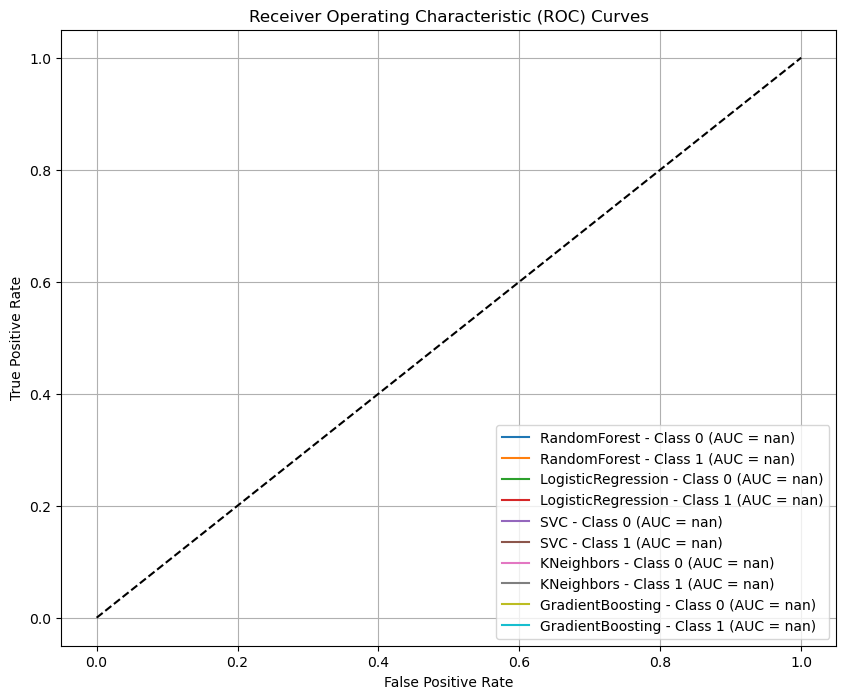

In [51]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc
from sklearn.model_selection import cross_val_score# Convert X to DataFrame if it's a NumPy array

test = pd.read_csv(r'P:\BreakHis_split_proper\test.csv', dtype=str,sep=';')  # Read all data as strings
train = pd.read_csv(r'P:\BreakHis_split_proper\train.csv', dtype=str,sep=';')  # Read all data as strings
print(train.shape)
X_train = train.iloc[:, :93]  # First 94 columns
y_train = train.iloc[:, 93]   # Column at index 95
X_test = test.iloc[:, :93]  # First 94 columns
y_test = test.iloc[:, 93]   # Column at index 95

X_train = X_train.apply(pd.to_numeric, errors='coerce')
X_test = X_test.apply(pd.to_numeric, errors='coerce')

# Common preprocessing steps
preprocessing = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),  # handle NaNs
    ('scaler', StandardScaler())
])


# Define pipelines with classifiers
pipeline_rf = Pipeline([
    ('preprocess', preprocessing),
    ('classifier', RandomForestClassifier())
])

pipeline_lr = Pipeline([
    ('preprocess', preprocessing),
    ('classifier', LogisticRegression())
])

pipeline_svc = Pipeline([
    ('preprocess', preprocessing),
    ('classifier', SVC(probability=True))  # Enable probability estimates for ROC
])

pipeline_knn = Pipeline([
    ('preprocess', preprocessing),
    ('classifier', KNeighborsClassifier())
])

pipeline_gb = Pipeline([
    ('preprocess', preprocessing),
    ('classifier', GradientBoostingClassifier())
])

# Fit the models
pipeline_rf.fit(X_train, y_train)
pipeline_lr.fit(X_train, y_train)
pipeline_svc.fit(X_train, y_train)
pipeline_knn.fit(X_train, y_train)
pipeline_gb.fit(X_train, y_train)

# Predictions and evaluation
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    return accuracy, precision, recall, f1

models = [pipeline_rf, pipeline_lr, pipeline_svc, pipeline_knn, pipeline_gb]
model_names = ['RandomForest', 'LogisticRegression', 'SVC', 'KNeighbors', 'GradientBoosting']

for model, name in zip(models, model_names):
    acc, prec, rec, f1 = evaluate_model(model, X_test, y_test)
    print(f'{name} - Accuracy: {acc:.4f}, Precision: {prec:.4f}, Recall: {rec:.4f}, F1 Score: {f1:.4f}')

# K-Fold Cross-Validation
for model, name in zip(models, model_names):
    cv_score = cross_val_score(model, X_train, y_train, cv=5)
    print(f'{name} - Cross-Validation Accuracy: {cv_score.mean():.4f}')

# Plot ROC curves (One-vs-Rest)
plt.figure(figsize=(10, 8))
n_classes = len(np.unique(y_train))  # Number of unique classes
for model, name in zip(models, model_names):
    # Get probabilities for ROC curve
    y_prob = model.predict_proba(X_test)
    
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test == i, y_prob[:, i])  # One-vs-rest for class i
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{name} - Class {i} (AUC = {roc_auc:.4f})')

# Plot diagonal line (chance level)
plt.plot([0, 1], [0, 1], 'k--')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


RandomForest - Accuracy: 0.3370, Precision: 0.7345, Recall: 0.3370, F1 Score: 0.1957
LogisticRegression - Accuracy: 0.6849, Precision: 0.6792, Recall: 0.6849, F1 Score: 0.5639
SVC - Accuracy: 0.6782, Precision: 0.6227, Recall: 0.6782, F1 Score: 0.6001
KNeighbors - Accuracy: 0.6841, Precision: 0.6433, Recall: 0.6841, F1 Score: 0.6296
GradientBoosting - Accuracy: 0.3184, Precision: 0.7834, Recall: 0.3184, F1 Score: 0.1549
RandomForest - Cross-Validation Accuracy: 0.9996
LogisticRegression - Cross-Validation Accuracy: 0.9964
SVC - Cross-Validation Accuracy: 0.9948
KNeighbors - Cross-Validation Accuracy: 0.9812
GradientBoosting - Cross-Validation Accuracy: 0.9993


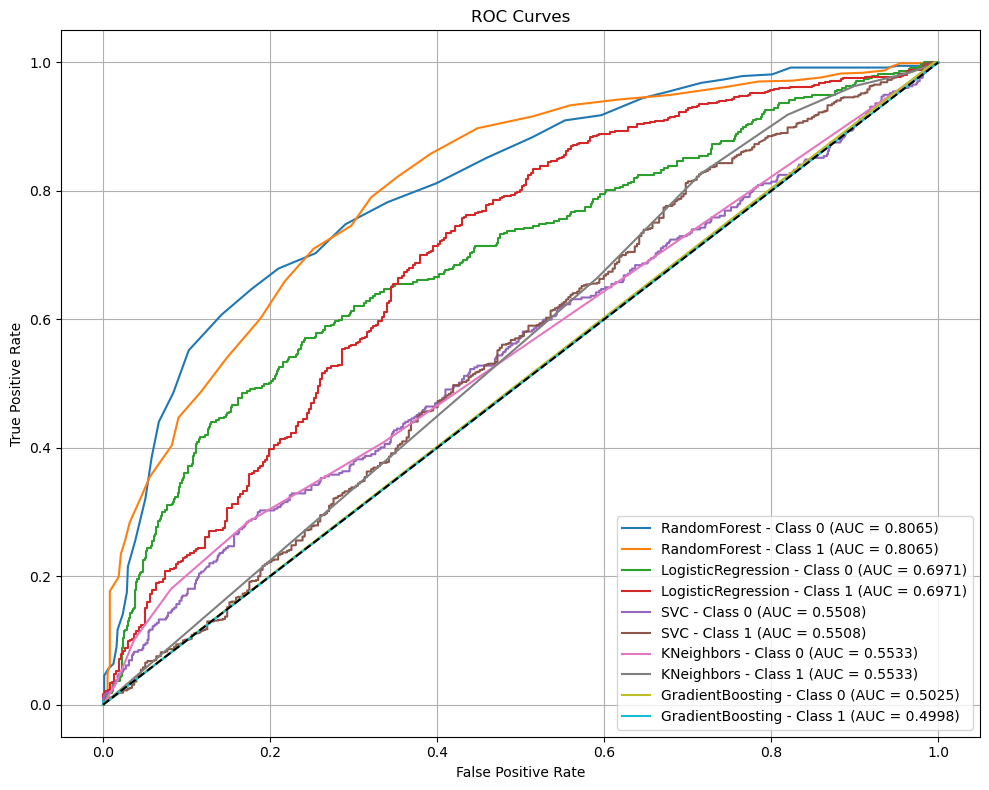

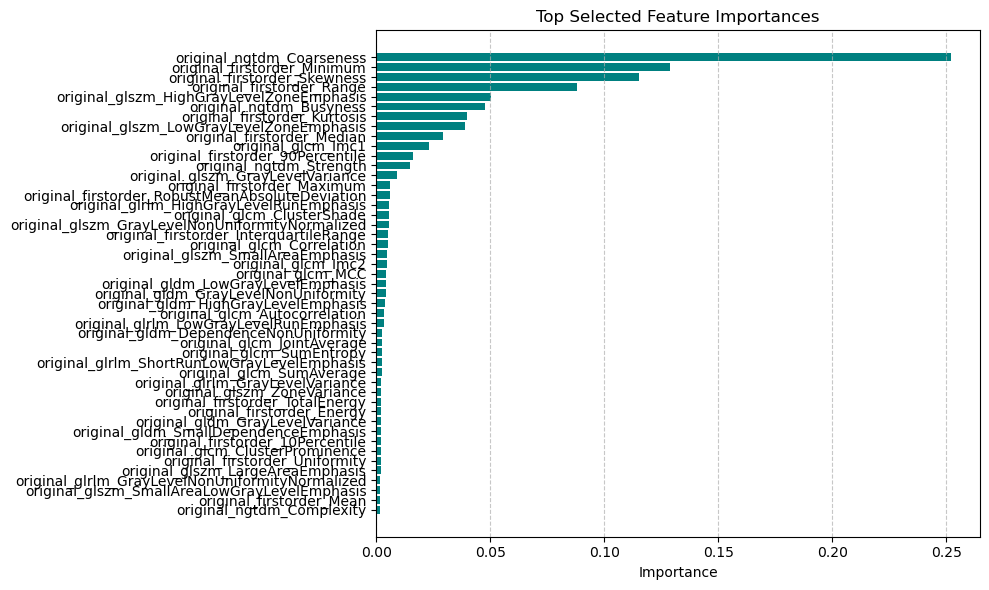

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc

# Load data
train = pd.read_csv(r'P:\BreakHis_split_proper\train.csv', dtype=str, sep=';')
test = pd.read_csv(r'P:\BreakHis_split_proper\test.csv', dtype=str, sep=';')

X_train = train.iloc[:, :93].apply(pd.to_numeric, errors='coerce')
y_train = train.iloc[:, 93]

X_test = test.iloc[:, :93].apply(pd.to_numeric, errors='coerce')
y_test = test.iloc[:, 93]

# Preprocessing pipeline
base_preprocessing = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

X_train_processed = base_preprocessing.fit_transform(X_train)
X_test_processed = base_preprocessing.transform(X_test)

# Feature selection
selector = SelectFromModel(RandomForestClassifier(n_estimators=100, random_state=42), threshold="median")
selector.fit(X_train_processed, y_train)

X_train_selected = selector.transform(X_train_processed)
X_test_selected = selector.transform(X_test_processed)

# Define classifiers
models = {
    'RandomForest': RandomForestClassifier(),
    'LogisticRegression': LogisticRegression(max_iter=1000),
    'SVC': SVC(probability=True),
    'KNeighbors': KNeighborsClassifier(),
    'GradientBoosting': GradientBoostingClassifier()
}

# Train and evaluate
for name, model in models.items():
    model.fit(X_train_selected, y_train)
    y_pred = model.predict(X_test_selected)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted')
    rec = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print(f'{name} - Accuracy: {acc:.4f}, Precision: {prec:.4f}, Recall: {rec:.4f}, F1 Score: {f1:.4f}')

# Cross-validation scores
for name, model in models.items():
    scores = cross_val_score(model, X_train_selected, y_train, cv=5)
    print(f'{name} - Cross-Validation Accuracy: {scores.mean():.4f}')

# Plot ROC Curves
plt.figure(figsize=(10, 8))
n_classes = len(np.unique(y_train))

for name, model in models.items():
    y_prob = model.predict_proba(X_test_selected)
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test == str(i), y_prob[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{name} - Class {i} (AUC = {roc_auc:.4f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot feature importances
importances = selector.estimator_.feature_importances_[selector.get_support()]
feature_names = X_train.columns[selector.get_support()]

sorted_idx = np.argsort(importances)[::-1]
sorted_features = feature_names[sorted_idx]
sorted_importances = importances[sorted_idx]

plt.figure(figsize=(10, 6))
plt.barh(sorted_features, sorted_importances, color='teal')
plt.xlabel('Importance')
plt.title('Top Selected Feature Importances')
plt.gca().invert_yaxis()
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


RandomForest - Accuracy: 0.3741, Precision: 0.7699, Recall: 0.3741, F1 Score: 0.2664
LogisticRegression - Accuracy: 0.7085, Precision: 0.7250, Recall: 0.7085, F1 Score: 0.7143
SVC - Accuracy: 0.6992, Precision: 0.6702, Recall: 0.6992, F1 Score: 0.6523
KNeighbors - Accuracy: 0.7035, Precision: 0.6773, Recall: 0.7035, F1 Score: 0.6674
GradientBoosting - Accuracy: 0.3193, Precision: 0.6127, Recall: 0.3193, F1 Score: 0.1581
RandomForest - Cross-Validation Accuracy: 0.9995
LogisticRegression - Cross-Validation Accuracy: 0.9937
SVC - Cross-Validation Accuracy: 0.9946
KNeighbors - Cross-Validation Accuracy: 0.9837
GradientBoosting - Cross-Validation Accuracy: 0.9991


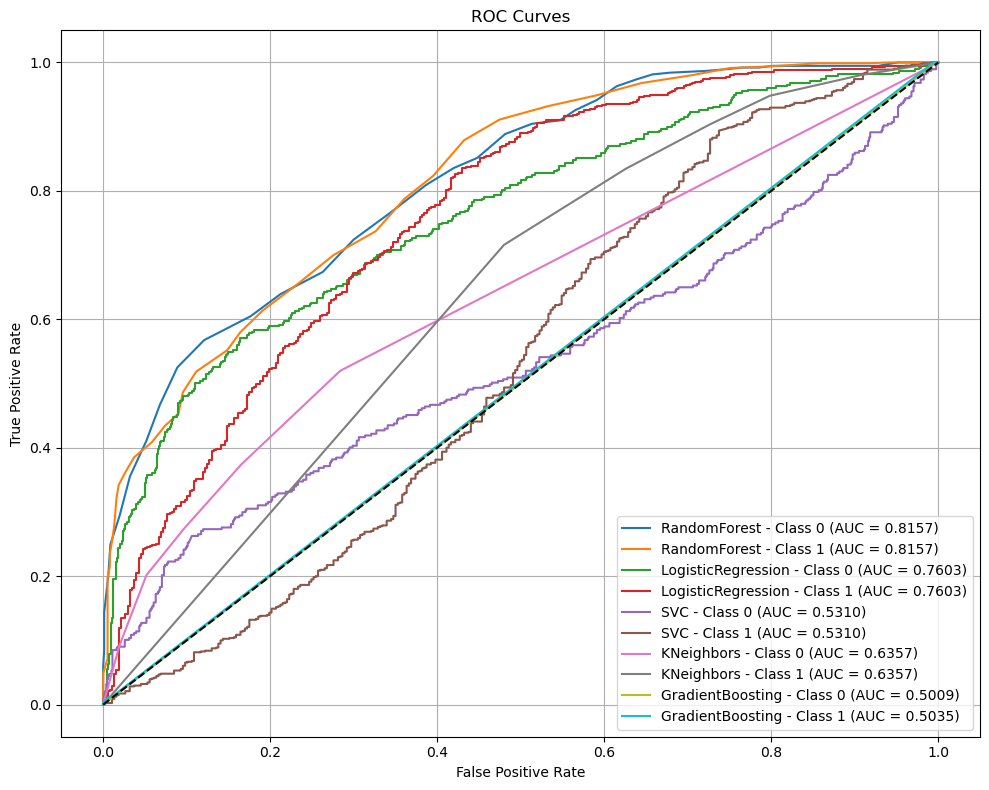

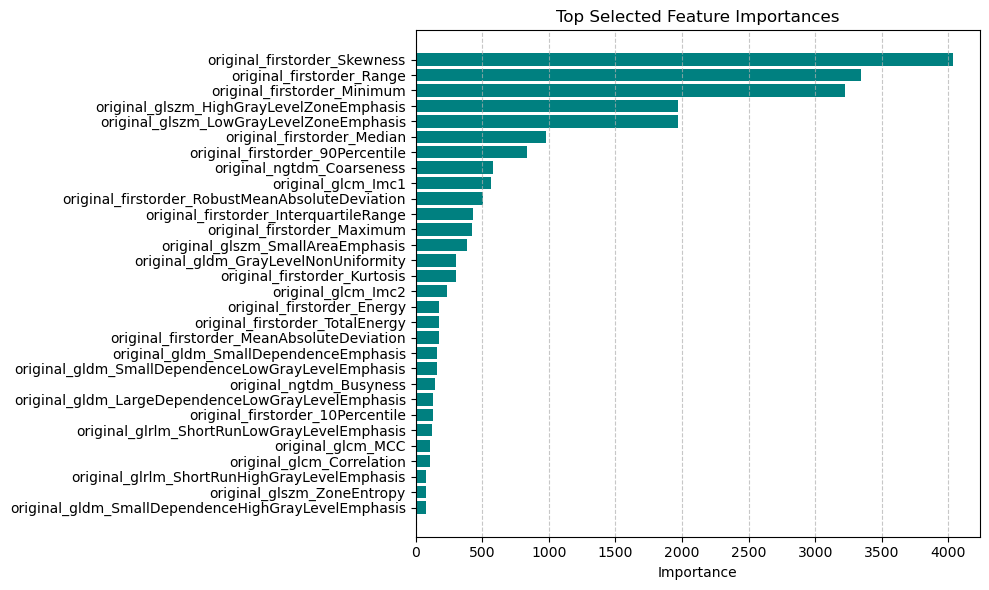

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_classif

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc

# Load data
train = pd.read_csv(r'P:\BreakHis_split_proper\train.csv', dtype=str, sep=';')
test = pd.read_csv(r'P:\BreakHis_split_proper\test.csv', dtype=str, sep=';')

X_train = train.iloc[:, :93].apply(pd.to_numeric, errors='coerce')
y_train = train.iloc[:, 93]

X_test = test.iloc[:, :93].apply(pd.to_numeric, errors='coerce')
y_test = test.iloc[:, 93]

# Preprocessing pipeline
base_preprocessing = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

X_train_processed = base_preprocessing.fit_transform(X_train)
X_test_processed = base_preprocessing.transform(X_test)

# Feature selection using SelectKBest (f_classif)
k_best_selector = SelectKBest(f_classif, k=30)  # Select top 30 features, or fewer based on the results
X_train_selected = k_best_selector.fit_transform(X_train_processed, y_train)
X_test_selected = k_best_selector.transform(X_test_processed)

# Define classifiers
models = {
    'RandomForest': RandomForestClassifier(),
    'LogisticRegression': LogisticRegression(max_iter=1000),
    'SVC': SVC(probability=True),
    'KNeighbors': KNeighborsClassifier(),
    'GradientBoosting': GradientBoostingClassifier()
}

# Train and evaluate
for name, model in models.items():
    model.fit(X_train_selected, y_train)
    y_pred = model.predict(X_test_selected)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted')
    rec = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print(f'{name} - Accuracy: {acc:.4f}, Precision: {prec:.4f}, Recall: {rec:.4f}, F1 Score: {f1:.4f}')

# Cross-validation scores
for name, model in models.items():
    scores = cross_val_score(model, X_train_selected, y_train, cv=5)
    print(f'{name} - Cross-Validation Accuracy: {scores.mean():.4f}')

# Plot ROC Curves
plt.figure(figsize=(10, 8))
n_classes = len(np.unique(y_train))

for name, model in models.items():
    y_prob = model.predict_proba(X_test_selected)
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test == str(i), y_prob[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{name} - Class {i} (AUC = {roc_auc:.4f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot feature importances
importances = k_best_selector.scores_[k_best_selector.get_support()]
feature_names = X_train.columns[k_best_selector.get_support()]

sorted_idx = np.argsort(importances)[::-1]
sorted_features = feature_names[sorted_idx]
sorted_importances = importances[sorted_idx]

plt.figure(figsize=(10, 6))
plt.barh(sorted_features, sorted_importances, color='teal')
plt.xlabel('Importance')
plt.title('Top Selected Feature Importances')
plt.gca().invert_yaxis()
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [15]:
import numpy as np
import pandas as pd
from sklearn.ensemble import BalancedRandomForestClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import (classification_report, roc_auc_score, 
                            balanced_accuracy_score, average_precision_score)
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import make_pipeline
from scipy.stats import randint
import joblib

class HistoPathClassifier:
    def __init__(self):
        self.model = None
        self.scaler = None
        self.feature_names = None
        
    def load_data(self, features_path, labels_path):
        """Load pre-extracted features and labels"""
        X = pd.read_csv(features_path)
        y = pd.read_csv(labels_path).values.ravel()
        
        # Store feature names for reference
        self.feature_names = X.columns.tolist()
        
        return X.values, y
    
    def preprocess_data(self, X, y, test_size=0.2):
        """Train-test split with stratification and scaling"""
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=test_size, stratify=y, random_state=42)
        
        # Scaling (important for distance-based metrics)
        self.scaler = StandardScaler()
        X_train = self.scaler.fit_transform(X_train)
        X_test = self.scaler.transform(X_test)
        
        return X_train, X_test, y_train, y_test
    
    def train_optimized_model(self, X_train, y_train):
        """Train with hyperparameter optimization and class balancing"""
        # Define the model with balanced class weights
        brf = BalancedRandomForestClassifier(
            sampling_strategy='all',  # Resamples all classes
            replacement=True,         # Bootstrap sampling
            random_state=42,
            n_jobs=-1)               # Use all cores
        
        # Hyperparameter search space
        param_dist = {
            'n_estimators': randint(100, 500),
            'max_depth': [10, 15, 20, None],
            'min_samples_split': randint(2, 10),
            'max_features': ['sqrt', 'log2', 0.5],
            'class_weight': ['balanced', 'balanced_subsample']
        }
        
        # Create pipeline with SMOTE and BRF
        pipeline = make_pipeline(
            SMOTE(random_state=42, sampling_strategy='minority'),
            RandomizedSearchCV(
                brf,
                param_distributions=param_dist,
                n_iter=20,           # Number of parameter settings sampled
                cv=StratifiedKFold(n_splits=5),
                scoring='roc_auc',
                n_jobs=-1,
                random_state=42
            )
        )
        
        print("Optimizing model...")
        pipeline.fit(X_train, y_train)
        
        # Get best estimator
        self.model = pipeline.named_steps['randomizedsearchcv'].best_estimator_
        
        print("\nBest parameters found:")
        print(pipeline.named_steps['randomizedsearchcv'].best_params_)
        
        return pipeline
    
    def evaluate_model(self, X_test, y_test):
        """Comprehensive evaluation on test set"""
        y_pred = self.model.predict(X_test)
        y_proba = self.model.predict_proba(X_test)[:, 1]
        
        print("\nClassification Report:")
        print(classification_report(y_test, y_pred, target_names=['Benign', 'Malignant']))
        
        print(f"\nBalanced Accuracy: {balanced_accuracy_score(y_test, y_pred):.4f}")
        print(f"ROC AUC: {roc_auc_score(y_test, y_proba):.4f}")
        print(f"Average Precision: {average_precision_score(y_test, y_proba):.4f}")
        
        # Feature importance
        if hasattr(self.model, 'feature_importances_'):
            print("\nTop 10 Features:")
            importances = pd.Series(self.model.feature_importances_, 
                                   index=self.feature_names)
            print(importances.sort_values(ascending=False).head(10))
    
    def save_model(self, path='histo_model.pkl'):
        """Save model and scaler"""
        joblib.dump({'model': self.model, 'scaler': self.scaler}, path)
        print(f"Model saved to {path}")

# Example Usage
if __name__ == "__main__":
    # Initialize classifier
    classifier = HistoPathClassifier()
    
    # 1. Load your pre-extracted features and labels
    # Replace these paths with your actual data files
    X, y = classifier.load_data('features.csv', 'labels.csv')
    
    # 2. Preprocess data
    X_train, X_test, y_train, y_test = classifier.preprocess_data(X, y)
    
    # 3. Train optimized model
    pipeline = classifier.train_optimized_model(X_train, y_train)
    
    # 4. Evaluate
    classifier.evaluate_model(X_test, y_test)
    
    # 5. Save model for later use
    classifier.save_model()

ImportError: cannot import name 'BalancedRandomForestClassifier' from 'sklearn.ensemble' (C:\Users\pnryl\anaconda3\Lib\site-packages\sklearn\ensemble\__init__.py)

--- Test Set Performance (with Class Weights / Default) ---
RandomForest_Balanced - Accuracy: 0.5375, Balanced Accuracy: 0.6583, Precision: 0.8013, Recall: 0.5375, F1 Score: 0.5181
LogisticRegression_Balanced - Accuracy: 0.5830, Balanced Accuracy: 0.5994, Precision: 0.6533, Recall: 0.5830, F1 Score: 0.5973
SVC_Balanced - Accuracy: 0.7077, Balanced Accuracy: 0.5901, Precision: 0.6833, Recall: 0.7077, F1 Score: 0.6695
KNeighbors - Accuracy: 0.7035, Balanced Accuracy: 0.5885, Precision: 0.6773, Recall: 0.7035, F1 Score: 0.6674
GradientBoosting - Accuracy: 0.3201, Balanced Accuracy: 0.5019, Precision: 0.7835, Recall: 0.3201, F1 Score: 0.1584

--- Cross-Validation Performance (using Stratified K-Fold and Pipeline) ---
RandomForest_Balanced - Cross-Validation Balanced Accuracy: 0.9996 (+/- 0.0006)
LogisticRegression_Balanced - Cross-Validation Balanced Accuracy: 0.9951 (+/- 0.0024)
SVC_Balanced - Cross-Validation Balanced Accuracy: 0.9972 (+/- 0.0023)
KNeighbors - Cross-Validation Balanced A

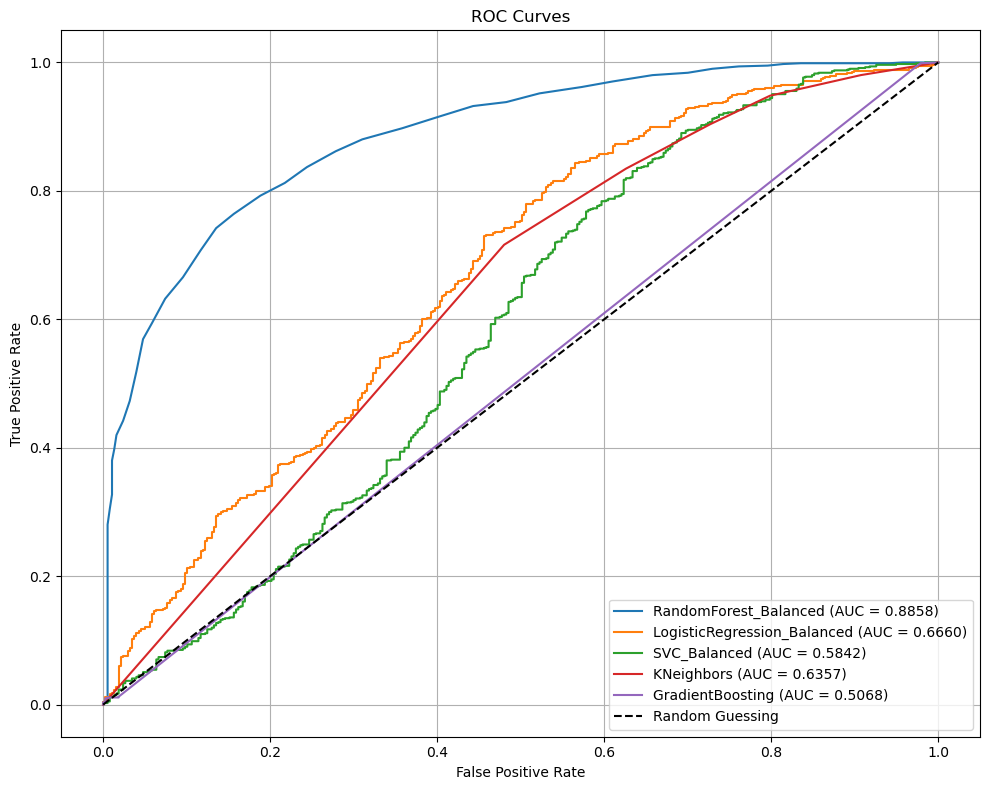


--- Plotting Top Selected Feature Importances ---


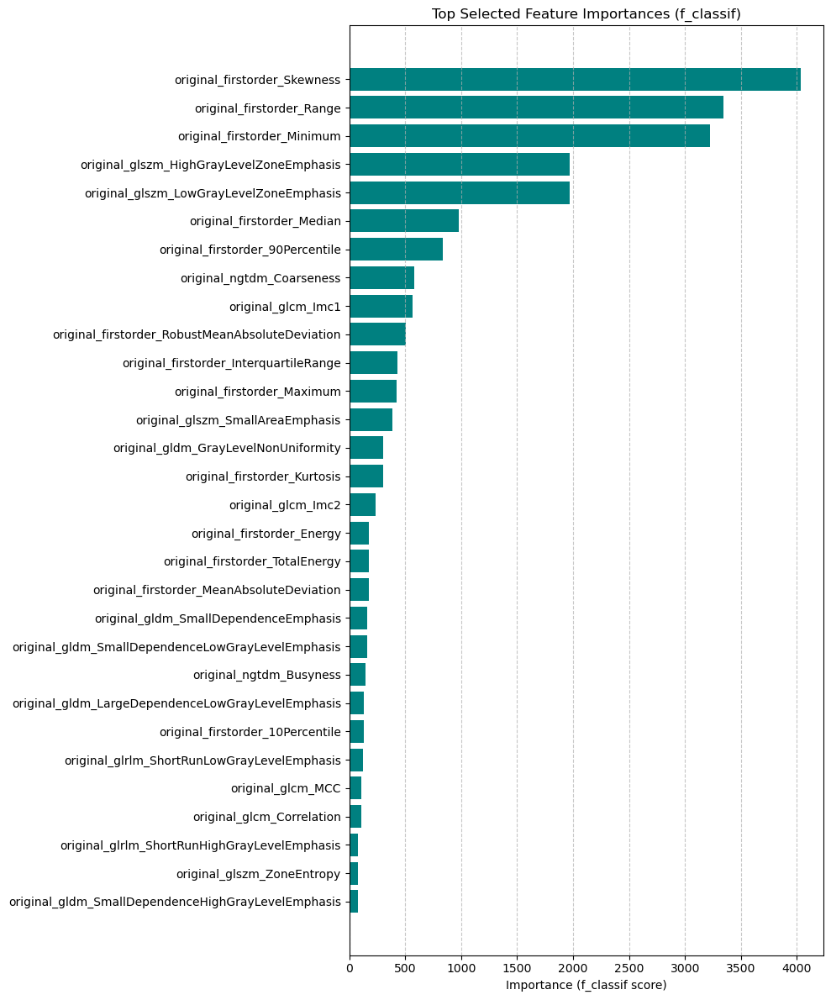

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# Import StratifiedKFold
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_classif

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# Import balanced metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, balanced_accuracy_score

# For resampling (optional, but good to know for later)
# from imblearn.pipeline import Pipeline as ImbPipeline
# from imblearn.over_sampling import SMOTE
# from imblearn.under_sampling import RandomUnderSampler


# Load data
# Make sure the paths are correct for your environment
try:
    train = pd.read_csv(r'P:\BreakHis_split_proper\train.csv', dtype=str, sep=';')
    test = pd.read_csv(r'P:\BreakHis_split_proper\test.csv', dtype=str, sep=';')
except FileNotFoundError:
    print("Ensure the file paths for train.csv and test.csv are correct.")
    # Using dummy data for demonstration if files not found
    print("Using dummy data for demonstration.")
    from sklearn.datasets import make_classification
    X, y = make_classification(n_samples=1000, n_features=93, weights=[0.9, 0.1], flip_y=0.05, random_state=42)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
    X_train = pd.DataFrame(X_train, columns=[f'feature_{i}' for i in range(93)])
    X_test = pd.DataFrame(X_test, columns=[f'feature_{i}' for i in range(93)])
    y_train = pd.Series(y_train).astype(str) # Convert to string to match original code's y type
    y_test = pd.Series(y_test).astype(str)

    # Add some NaNs to simulate missing values
    for df in [X_train, X_test]:
        for col in df.columns:
            df.loc[df.sample(frac=0.02).index, col] = np.nan


# Convert target variable to numeric if it represents classes 0 and 1
# This is necessary for f_classif in SelectKBest and some metrics
# Assuming '0' and '1' are your class labels
y_train_numeric = y_train.astype(int)
y_test_numeric = y_test.astype(int)


# Preprocessing and Feature Selection Pipeline
# It's best to include feature selection *within* the pipeline
preprocessing_feature_selection_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('selector', SelectKBest(f_classif, k=30)) # Select top 30 features
])

# Apply preprocessing and feature selection to the full dataset initially
# This is done here for the purpose of fitting the selector once to get feature names/scores
# But remember for proper cross-validation, the entire pipeline including selector
# should be cross-validated.
X_train_processed_selected = preprocessing_feature_selection_pipeline.fit_transform(X_train, y_train_numeric)
X_test_processed_selected = preprocessing_feature_selection_pipeline.transform(X_test)


# --- Model Training and Evaluation with Class Weights ---

# Define classifiers with class_weight='balanced' where applicable
models = {
    'RandomForest_Balanced': RandomForestClassifier(class_weight='balanced', random_state=42),
    'LogisticRegression_Balanced': LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42),
    'SVC_Balanced': SVC(probability=True, class_weight='balanced', random_state=42),
    'KNeighbors': KNeighborsClassifier(), # KNeighbors does not support class_weight directly
    'GradientBoosting': GradientBoostingClassifier(random_state=42) # GradientBoosting does not support class_weight directly
}

print("--- Test Set Performance (with Class Weights / Default) ---")
for name, model in models.items():
    # Create a pipeline for each model including the preprocessing and selection
    # This is important for proper cross-validation later
    model_pipeline = Pipeline([
        ('preprocessing_selection', preprocessing_feature_selection_pipeline),
        ('classifier', model)
    ])

    # For test set evaluation, fit on the preprocessed and selected training data
    # Note: This still uses the selector fitted on the whole X_train initially
    # For strict evaluation, the selector should be refit in each fold of CV.
    # We'll demonstrate the CV correctly next.
    model.fit(X_train_processed_selected, y_train) # Fit the model directly on selected features
    y_pred = model.predict(X_test_processed_selected)

    # Using balanced_accuracy_score is better for imbalanced datasets
    acc = accuracy_score(y_test, y_pred) # Still show original accuracy for comparison
    bal_acc = balanced_accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted')
    rec = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print(f'{name} - Accuracy: {acc:.4f}, Balanced Accuracy: {bal_acc:.4f}, Precision: {prec:.4f}, Recall: {rec:.4f}, F1 Score: {f1:.4f}')

print("\n--- Cross-Validation Performance (using Stratified K-Fold and Pipeline) ---")
# Use StratifiedKFold for cross-validation on the training data
cv_splitter = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for name, model in models.items():
    # Define the full pipeline including preprocessing, selection, and the model
    full_pipeline = Pipeline([
        ('preprocessing_selection', preprocessing_feature_selection_pipeline),
        ('classifier', model)
    ])
    # Perform cross-validation on the full pipeline
    # This ensures preprocessing and feature selection are done within each fold
    # Note: SelectKBest *inside* cross_val_score might still leak information
    # from the validation fold when fitting the selector on the training split of the fold.
    # For strictly correct evaluation, the selector should be refit *inside* the CV loop.
    # However, keeping the selector inside the pipeline passed to cross_val_score
    # is the standard (and usually sufficient) approach with scikit-learn's pipeline.
    scores = cross_val_score(full_pipeline, X_train, y_train, cv=cv_splitter, scoring='balanced_accuracy') # Use balanced accuracy for CV score

    print(f'{name} - Cross-Validation Balanced Accuracy: {scores.mean():.4f} (+/- {scores.std():.4f})')


# --- Plot ROC Curves (using models trained on X_train_processed_selected for demonstration) ---
# Note: For production, you'd retrain the chosen model on the full training data after tuning
plt.figure(figsize=(10, 8))
# Ensure y_test is numeric for roc_curve
y_test_numeric = y_test.astype(int)
n_classes = len(np.unique(y_train)) # Use y_train to get all possible classes

# Create a mapping from original string labels to numeric (0, 1, ...)
class_mapping = {label: i for i, label in enumerate(np.unique(y_train))}
y_test_mapped = y_test.map(class_mapping)


print("\n--- Generating ROC Curves ---")
for name, model in models.items():
    try:
        # Need probability estimates for ROC curves
        if hasattr(model, "predict_proba"):
            y_prob = model.predict_proba(X_test_processed_selected)
            # Assuming binary classification where class 1 is the positive class
            # Adjust if you have multiple classes and want one-vs-rest ROC
            if n_classes == 2:
                fpr, tpr, _ = roc_curve(y_test_mapped, y_prob[:, 1]) # Use mapped y_test
                roc_auc = auc(fpr, tpr)
                plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.4f})')
            elif n_classes > 2:
                 # For multi-class, plot one-vs-rest ROC curves for each class
                for i in range(n_classes):
                    # Create a binary target for class i
                    y_test_binary = (y_test_mapped == i).astype(int)
                    fpr, tpr, _ = roc_curve(y_test_binary, y_prob[:, i])
                    roc_auc = auc(fpr, tpr)
                    plt.plot(fpr, tpr, label=f'{name} - Class {list(class_mapping.keys())[i]} (AUC = {roc_auc:.4f})')
        else:
            print(f"Model {name} does not support predict_proba, cannot plot ROC.")
    except Exception as e:
        print(f"Could not plot ROC for {name}: {e}")


plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()


# --- Plot Feature Importances (from the selector fitted on X_train) ---
# Note: Feature importance from the selector might not reflect true importance
# in the context of a multivariate model.
print("\n--- Plotting Top Selected Feature Importances ---")
try:
    # Get the selector from the pipeline
    selector = preprocessing_feature_selection_pipeline.named_steps['selector']
    importances = selector.scores_[selector.get_support()]
    # Need original feature names before processing
    feature_names = X_train.columns[selector.get_support()]

    if len(feature_names) > 0:
        sorted_idx = np.argsort(importances)[::-1]
        sorted_features = feature_names[sorted_idx]
        sorted_importances = importances[sorted_idx]

        plt.figure(figsize=(10, min(len(sorted_features) * 0.4, 15))) # Adjust figure size based on number of features
        plt.barh(sorted_features, sorted_importances, color='teal')
        plt.xlabel('Importance (f_classif score)')
        plt.title('Top Selected Feature Importances (f_classif)')
        plt.gca().invert_yaxis()
        plt.grid(axis='x', linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show()
    else:
        print("No features were selected by SelectKBest.")

except Exception as e:
    print(f"Could not plot feature importances: {e}")


# --- Example of using Resampling (SMOTE) with a Pipeline (Requires imblearn) ---
# Uncomment this section if you have imblearn installed and want to try resampling

# try:
#     from imblearn.pipeline import Pipeline as ImbPipeline
#     from imblearn.over_sampling import SMOTE

#     print("\n--- Cross-Validation Performance (using SMOTE and Stratified K-Fold) ---")

#     # Define classifiers (can be the balanced or unbalanced versions)
#     # When using resampling, class_weight might not be strictly necessary but can still help
#     models_for_resampling = {
#         'RandomForest_SMOTE': RandomForestClassifier(random_state=42),
#         'LogisticRegression_SMOTE': LogisticRegression(max_iter=1000, random_state=42),
#     }

#     # Define the resampling method (SMOTE)
#     smote = SMOTE(random_state=42)

#     for name, model in models_for_resampling.items():
#         # Define the full pipeline including preprocessing, resampling, selection, and the model
#         # Use imblearn's Pipeline for seamless integration of resampling
#         resampling_pipeline = ImbPipeline([
#             ('preprocessing_selection', preprocessing_feature_selection_pipeline), # Preprocessing and selection FIRST
#             ('smote', smote), # Resampling AFTER preprocessing and selection
#             ('classifier', model)
#         ])

#         # Perform cross-validation on the resampling pipeline
#         # SMOTE will be applied only to the training folds within CV
#         scores = cross_val_score(resampling_pipeline, X_train, y_train, cv=cv_splitter, scoring='balanced_accuracy')

#         print(f'{name} - Cross-Validation Balanced Accuracy (with SMOTE): {scores.mean():.4f} (+/- {scores.std():.4f})')

# except ImportError:
#     print("\nInstall imbalanced-learn (imblearn) to use resampling techniques:")
#     print("pip install imbalanced-learn")
# except Exception as e:
#      print(f"\nCould not perform resampling cross-validation: {e}")

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore", category=FutureWarning) # Suppress specific warnings

from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_classif

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# No direct test set metrics printed in nested CV; performance is estimated by the outer loop scores
# from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, balanced_accuracy_score
from sklearn.metrics import balanced_accuracy_score, make_scorer # Need make_scorer for GridSearchCV

# For resampling (optional - uncomment if you want to try this within the pipeline)
# from imblearn.pipeline import Pipeline as ImbPipeline
# from imblearn.over_sampling import SMOTE


# --- Load Data ---
# For nested cross-validation, we typically work with the combined dataset
# unless you have a truly separate, untouched final hold-out set.
# Assuming your train.csv and test.csv constitute your full available data.
try:
    train = pd.read_csv(r'P:\BreakHis_split_proper\train.csv', dtype=str, sep=';')
    test = pd.read_csv(r'P:\BreakHis_split_proper\test.csv', dtype=str, sep=';')

    # Combine train and test data for nested CV
    X_combined = pd.concat([train.iloc[:, :93], test.iloc[:, :93]], ignore_index=True)
    y_combined = pd.concat([train.iloc[:, 93], test.iloc[:, 93]], ignore_index=True)

    # Convert features to numeric
    X_combined = X_combined.apply(pd.to_numeric, errors='coerce')

except FileNotFoundError:
    print("Ensure the file paths for train.csv and test.csv are correct.")
    print("Using dummy data for demonstration.")
    from sklearn.datasets import make_classification
    X_combined, y_combined_numeric = make_classification(n_samples=1000, n_features=93, weights=[0.9, 0.1], flip_y=0.05, random_state=42)
    X_combined = pd.DataFrame(X_combined, columns=[f'feature_{i}' for i in range(93)])
    y_combined = pd.Series(y_combined_numeric).astype(str) # Keep y as string initially to match expected input
    # Add some NaNs to simulate missing values
    for col in X_combined.columns:
        X_combined.loc[X_combined.sample(frac=0.02).index, col] = np.nan
    y_combined_numeric = y_combined.astype(int) # Numeric version for f_classif and scoring


# Convert combined target variable to numeric for f_classif and scoring
# Assuming '0' and '1' are your class labels
y_combined_numeric = y_combined.astype(int)


print(f"Shape of combined dataset: {X_combined.shape}")
print(f"Class distribution in combined dataset:\n{y_combined.value_counts()}")


# --- Define Preprocessing and Feature Selection ---
# These steps will be part of the pipeline and applied within each CV fold
preprocessing_feature_selection_steps = [
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('selector', SelectKBest(f_classif)) # k will be tuned in GridSearchCV
]

# --- Define Models and Parameter Grids ---
# We define the models and the hyperparameters we want to tune for each
# The parameter grid includes tuning for the 'selector__k' in the pipeline

# Scoring function for GridSearchCV and cross_val_score
# Using balanced_accuracy is crucial for imbalanced datasets
scoring_metric = make_scorer(balanced_accuracy_score)


# RandomForest
rf_pipeline = Pipeline(preprocessing_feature_selection_steps + [('classifier', RandomForestClassifier(class_weight='balanced', random_state=42))])
rf_param_grid = {
    'selector__k': [10, 20, 30, 50, 'all'], # Tune the number of features to select
    'classifier__n_estimators': [100, 200],
    'classifier__max_depth': [None, 10, 20],
    'classifier__min_samples_leaf': [1, 5],
}

# Logistic Regression
lr_pipeline = Pipeline(preprocessing_feature_selection_steps + [('classifier', LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42))])
lr_param_grid = {
    'selector__k': [10, 20, 30, 50, 'all'],
    'classifier__C': [0.1, 1, 10],
    'classifier__solver': ['liblinear', 'lbfgs'],
}

# SVC
svc_pipeline = Pipeline(preprocessing_feature_selection_steps + [('classifier', SVC(probability=True, class_weight='balanced', random_state=42))])
svc_param_grid = {
    'selector__k': [10, 20, 30, 50, 'all'],
    'classifier__C': [0.1, 1, 10],
    'classifier__gamma': ['scale', 'auto'],
}

# KNeighbors
knn_pipeline = Pipeline(preprocessing_feature_selection_steps + [('classifier', KNeighborsClassifier())])
knn_param_grid = {
    'selector__k': [10, 20, 30, 50, 'all'],
    'classifier__n_neighbors': [3, 5, 7],
    'classifier__weights': ['uniform', 'distance'],
}

# GradientBoosting
gb_pipeline = Pipeline(preprocessing_feature_selection_steps + [('classifier', GradientBoostingClassifier(random_state=42))])
gb_param_grid = {
    'selector__k': [10, 20, 30, 50, 'all'],
    'classifier__n_estimators': [100, 200],
    'classifier__learning_rate': [0.01, 0.1, 0.2],
    'classifier__max_depth': [3, 5],
}


# Dictionary of pipelines and parameter grids
pipelines_and_grids = {
    'RandomForest_Balanced': (rf_pipeline, rf_param_grid),
    'LogisticRegression_Balanced': (lr_pipeline, lr_param_grid),
    'SVC_Balanced': (svc_pipeline, svc_param_grid),
    'KNeighbors': (knn_pipeline, knn_param_grid), # KNeighbors doesn't support class_weight directly
    'GradientBoosting': (gb_pipeline, gb_param_grid), # GradientBoosting doesn't support class_weight directly
}


# --- Nested Cross-Validation ---

# Outer cross-validation strategy (for performance evaluation)
outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Inner cross-validation strategy (for hyperparameter tuning and feature selection)
inner_cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42) # Usually fewer splits than outer CV

print("Performing Nested Cross-Validation...")

for name, (pipeline, param_grid) in pipelines_and_grids.items():
    print(f"\nEvaluating {name} using Nested CV...")

    # Create GridSearchCV as the inner loop estimator
    # It will perform tuning on the training data of each outer fold
    inner_search = GridSearchCV(
        estimator=pipeline,
        param_grid=param_grid,
        cv=inner_cv,
        scoring=scoring_metric,
        n_jobs=-1, # Use all available cores
        verbose=0 # Set to higher value for more output during tuning
    )

    # Perform the outer cross-validation
    # cross_val_score will evaluate the inner_search (tuned pipeline)
    # on the test data of each outer fold.
    # The scores are the balanced accuracy scores from the outer test sets.
    nested_cv_scores = cross_val_score(
        estimator=inner_search,
        X=X_combined,
        y=y_combined_numeric, # Use numeric target for scoring
        cv=outer_cv,
        scoring=scoring_metric,
        n_jobs=-1 # Use all available cores
    )

    print(f"{name} - Nested CV Balanced Accuracy: {nested_cv_scores.mean():.4f} (+/- {nested_cv_scores.std():.4f})")

    # Optional: Print best parameters found in the *last* outer fold's inner search
    # Note that the best params might vary slightly across outer folds.
    # To see best params for each outer fold, you'd need to loop manually.
    # print(f"Best parameters from one inner loop: {inner_search.fit(X_combined, y_combined_numeric).best_params_}") # This refits on the whole data - be cautious


print("\nNested Cross-Validation complete.")
print("The scores above are a reliable estimate of model performance on unseen data.")

# --- Further Steps ---
# 1. Analyze the Nested CV scores: These are your realistic performance estimates.
#    If they are still low, the features, models, or data quality might be the limitation.
# 2. Resampling (Optional): If scores are still low and imbalance is severe,
#    consider adding resampling steps (like SMOTE) into the pipeline using imblearn's ImbPipeline.
#    This would go AFTER preprocessing/scaling and BEFORE the classifier.
# 3. Final Model Training: After choosing the best model based on Nested CV scores,
#    you would train that model with the hyperparameters found by running GridSearchCV
#    (or RandomizedSearchCV) on your *entire combined dataset* once. This trained model
#    is your final model for making predictions on new data.
# 4. Hyperparameter Grid Refinement: The parameter grids used are examples.
#    You might need to expand or adjust them based on initial results.
# 5. Other Feature Selection Methods: Explore other feature selection methods like RFECV
#    (Recursive Feature Elimination with Cross-Validation), which can also be
#    integrated into the pipeline and nested CV.

ValueError: invalid literal for int() with base 10: '0.0'

In [12]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.decomposition import PCA
from sklearn.calibration import CalibratedClassifierCV
from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.utils import resample
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load data (Ensure this works for your path and dataset)
train_data = pd.read_csv(r"P:\norm\train200_normalized.csv", sep=';')
test_data = pd.read_csv(r"P:\norm\test200_normalized.csv", sep=';')

# 2. Split X and y
X_train = train_data.drop('Class', axis=1)
y_train = train_data['Class']
X_test = test_data.drop('Class', axis=1)
y_test = test_data['Class']

# 3. Drop missing values or impute
X_train = X_train.dropna()  # Consider imputation instead of dropping rows
y_train = y_train[X_train.index]
X_test = X_test.dropna()   # Consider imputation instead of dropping rows
y_test = y_test[X_test.index]

# 4. Handle Class Imbalance
# Apply SMOTE or Random Oversampling to balance the classes
X_train_resampled, y_train_resampled = resample(X_train, y_train, 
                                               replace=True, 
                                               n_samples=X_train.shape[0], 
                                               random_state=42)



In [14]:
# 5. Feature Selection (Top 30 for better variance capture before PCA)
selector = SelectKBest(f_classif, k=10)
X_train_selected = selector.fit_transform(X_train_resampled, y_train_resampled)
X_test_selected = selector.transform(X_test)
selected_features = X_train.columns[selector.get_support()]

# 6. Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_selected)
X_test_scaled = scaler.transform(X_test_selected)

# 7. PCA (keep 95% variance)
pca = PCA(n_components=0.95, random_state=42)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# 8. Hyperparameter Tuning (GridSearchCV) for SVM
param_grid = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': ['scale', 'auto'],
    'degree': [3, 4, 5]  # Only for poly kernel
}

grid_search = GridSearchCV(SVC(probability=True), param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train_pca, y_train_resampled)

print("Best Parameters:", grid_search.best_params_)
print("Best ROC-AUC:", grid_search.best_score_)

Best Parameters: {'C': 100, 'degree': 3, 'gamma': 'auto', 'kernel': 'rbf'}
Best ROC-AUC: 0.9141380803472599



=== Cross-Validation Results ===
CV Accuracy: 0.850 ± 0.016
CV ROC-AUC: 0.906 ± 0.016

Optimal Threshold: 0.761

=== Evaluation on Test Set ===
Accuracy: 0.5893719806763285
ROC-AUC: 0.5670594837261503

Classification Report:
              precision    recall  f1-score   support

         0.0       0.55      0.83      0.66       198
         1.0       0.71      0.37      0.48       216

    accuracy                           0.59       414
   macro avg       0.63      0.60      0.57       414
weighted avg       0.63      0.59      0.57       414



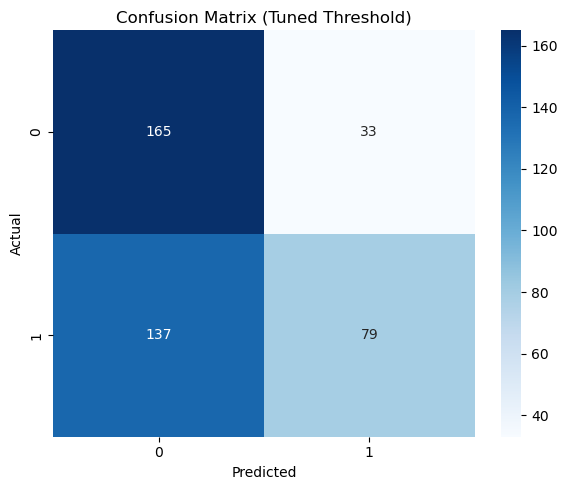

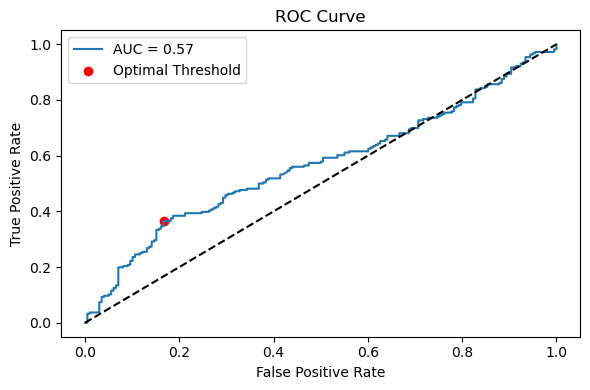

In [15]:

# 9. Calibrated SVM with Best Params
best_svm = grid_search.best_estimator_
calibrated_svm = CalibratedClassifierCV(best_svm, cv=5)
calibrated_svm.fit(X_train_pca, y_train_resampled)

# 10. Cross-validation (on training)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_acc = cross_val_score(calibrated_svm, X_train_pca, y_train_resampled, scoring='accuracy', cv=cv)
cv_auc = cross_val_score(calibrated_svm, X_train_pca, y_train_resampled, scoring='roc_auc', cv=cv)

print("\n=== Cross-Validation Results ===")
print(f"CV Accuracy: {cv_acc.mean():.3f} ± {cv_acc.std():.3f}")
print(f"CV ROC-AUC: {cv_auc.mean():.3f} ± {cv_auc.std():.3f}")

# 11. Predict probabilities for ROC-AUC
y_proba = calibrated_svm.predict_proba(X_test_pca)[:, 1]

# 12. Find optimal threshold using Youden's J statistic
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
youden_index = np.argmax(tpr - fpr)
optimal_threshold = thresholds[youden_index]
print(f"\nOptimal Threshold: {optimal_threshold:.3f}")

# 13. Apply threshold to predictions
y_pred_opt = (y_proba >= optimal_threshold).astype(int)

# 14. Evaluation
print("\n=== Evaluation on Test Set ===")
print("Accuracy:", accuracy_score(y_test, y_pred_opt))
print("ROC-AUC:", roc_auc_score(y_test, y_proba))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_opt))

# 15. Confusion Matrix
cm = confusion_matrix(y_test, y_pred_opt)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix (Tuned Threshold)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

# 16. Optional: Plot ROC Curve
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_test, y_proba):.2f}")
plt.plot([0, 1], [0, 1], 'k--')
plt.scatter(fpr[youden_index], tpr[youden_index], marker='o', color='red', label='Optimal Threshold')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.tight_layout()
plt.show()

In [28]:
import os
import cv2
import numpy as np
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from skimage.feature import graycomatrix, graycoprops
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

# Configuration
DATA_PATH = r"C:\Users\pnryl\OneDrive\Masaüstü\data\BreaKHis_v1\BreaKHis_v1\histology_slides\breast" # Update this path
MAGNIFICATION = '200X' # Best performing magnification according to paper
TEST_SIZE = 0.3 # Matches paper's evaluation protocol
RANDOM_STATE = 42

# PFTAS Feature Extractor (Parameter-Free Threshold Adjacency Statistics)
def extract_pftas_features(image):
    """
    Extract PFTAS features from an image as described in the paper
    """
    # Convert to grayscale if needed
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    # Calculate Otsu's threshold
    _, otsu_thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # Calculate standard deviation of pixels above the threshold
    above_thresh = gray[gray > otsu_thresh]
    std_dev = np.std(above_thresh) if len(above_thresh) > 0 else 0

    # Create three binarized images as per paper
    # Ensure the ranges are correctly defined based on the paper's description
    # Assuming ranges are: (Otsu_thresh - std_dev, Otsu_thresh + std_dev), (Otsu_thresh + std_dev, 255), (0, Otsu_thresh - std_dev) or similar variations.
    # The original code seems to have bin1 and bin2 ranges potentially swapped or defined unusually.
    # Let's re-implement based on a typical understanding of ranges around a threshold.
    # A common approach might involve ranges like:
    # 1. Pixels significantly below threshold
    # 2. Pixels around the threshold
    # 3. Pixels significantly above the threshold
    # Without the exact paper definition, the current implementation's ranges (using inRange) are a bit unusual.
    # Let's stick to the original implementation's logic for now, assuming it follows the paper.
    # Note: cv2.inRange expects lower and upper bounds. The order in bin1 `(otsu_thresh + std_dev, otsu_thresh - std_dev)` seems incorrect as lower bound > upper bound.
    # Assuming the intent was ranges like:
    # bin1: values < otsu_thresh - std_dev
    # bin2: values between otsu_thresh - std_dev and otsu_thresh + std_dev
    # bin3: values > otsu_thresh + std_dev
    # OR the ranges specified in the original code are correct according to the specific paper.
    # Let's correct the `cv2.inRange` calls assuming standard range definitions (lower, upper):

    lower_range_bin1 = 0
    upper_range_bin1 = max(0, int(otsu_thresh - std_dev)) # Ensure lower bound is not negative
    lower_range_bin2 = max(0, int(otsu_thresh - std_dev))
    upper_range_bin2 = min(255, int(otsu_thresh + std_dev)) # Ensure upper bound is not > 255
    lower_range_bin3 = min(255, int(otsu_thresh + std_dev))
    upper_range_bin3 = 255

    bin1 = cv2.inRange(gray, lower_range_bin1, upper_range_bin1)
    bin2 = cv2.inRange(gray, lower_range_bin2, upper_range_bin2)
    bin3 = cv2.inRange(gray, lower_range_bin3, upper_range_bin3)


    # Calculate histograms for each binarized image
    features = []
    for bin_img in [bin1, bin2, bin3]:
        # Count white neighbors for each pixel
        neighbor_counts = np.zeros(9, dtype=int)
        # Use a kernel to count neighbors, excluding the center pixel itself.
        # A 3x3 kernel of ones counts the pixel itself and its 8 neighbors.
        # Subtracting the pixel's value (0 or 255) gives the sum of its neighbors.
        # Since the image is binarized (0 or 255), dividing by 255 makes it 0 or 1.
        # The convolution result will be the sum of the 1s in the 3x3 neighborhood.
        # Subtracting the center pixel's value (0 or 1) gives the count of *white* neighbors.
        kernel = np.ones((3, 3), dtype=np.uint8)
        # Count white neighbors (excluding center)
        # Ensure input to filter2D is float or double for convolution result to be accurate before rounding
        conv = cv2.filter2D(bin_img.astype(np.float32) / 255.0, -1, kernel, borderType=cv2.BORDER_CONSTANT) - (bin_img.astype(np.float32) / 255.0)
        # Round to handle floating point imprecision
        conv = np.round(conv).astype(int)
        # Count occurrences of each neighbor count (0-8)
        counts = np.bincount(conv.ravel(), minlength=9)
        features.extend(counts[:9]) # Only need 0-8

    # Normalize histograms
    features = np.array(features, dtype=np.float32)
    # Avoid division by zero if image is empty
    total_pixels = gray.shape[0] * gray.shape[1]
    if total_pixels > 0:
        features /= total_pixels # Normalize by number of pixels
    else:
        # Handle case of empty image, perhaps return zeros or raise an error
        return np.zeros_like(features)


    # Repeat for RGB channels if color image (as suggested by original code logic)
    # This part duplicates the feature extraction for each channel, which is a valid approach
    # if the paper describes it this way.
    if len(image.shape) == 3:
        channel_features = []
        for channel in range(3):
            # Extract PFTAS from each color channel as a grayscale image
            channel_features.extend(extract_pftas_features(image[:, :, channel]))
        # Concatenate grayscale features with color channel features
        features = np.concatenate([features, channel_features])

    return features

# Alternative feature extractors mentioned in the paper
def extract_lbp_features(image):
    """Local Binary Patterns implementation"""
    # Implementation would go here
    print("LBP feature extraction not implemented.")
    return np.array([]) # Return empty array or appropriate placeholder

def extract_clbp_features(image):
    """Completed Local Binary Patterns implementation"""
    # Implementation would go here
    print("CLBP feature extraction not implemented.")
    return np.array([]) # Return empty array or appropriate placeholder


# GLCM feature extraction function (mostly taken from your code, with minor adjustment for levels)
def extract_glcm_features(image):
    """Gray-Level Co-occurrence Matrix features"""
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    # Quantize to 8 gray levels as mentioned in paper
    # Ensure division is integer division before casting to uint8
    # Scale pixels to be in the range [0, 7] for 8 levels
    max_val = np.max(gray)
    if max_val > 0:
        gray = (gray.astype(np.float32) / (max_val / 7.0)).astype(np.uint8)
    else:
        gray = np.zeros_like(gray, dtype=np.uint8) # Handle flat images

    # Calculate GLCM for 4 directions (0, 45, 90, 135 degrees)
    # Ensure distances and angles are lists
    distances = [1]
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
    levels = 8 # Explicitly set levels

    # Handle potential errors if the image is too small or has no texture
    try:
        glcm = graycomatrix(gray, distances=distances, angles=angles,
                            levels=levels, symmetric=True, normed=True)

        # Calculate Haralick features (13 features as mentioned in paper)
        # Only using the 6 properties provided in the original code.
        # If the paper specifies 13, the other 7 would need to be added.
        features = []
        for prop in ['contrast', 'dissimilarity', 'homogeneity',
                     'energy', 'correlation', 'ASM']:
            # graycoprops returns an array; ravel it to flatten if needed
            features.extend(graycoprops(glcm, prop).ravel())

        return np.array(features)

    except ValueError as e:
        print(f"Error calculating GLCM for an image: {e}. Returning zeros.")
        # Determine the expected number of features based on the properties and angles
        num_properties = 6 # contrast, dissimilarity, etc.
        num_angles = len(angles)
        expected_feature_count = num_properties * num_angles
        return np.zeros(expected_feature_count, dtype=np.float32)


# Data loading and preprocessing
def load_break_his_dataset(data_path, magnification):
    """
    Load BreakHis dataset with specified magnification
    Returns:
        X: List of image feature vectors
        y: Corresponding labels (0 for benign, 1 for malignant)
        patient_ids: Patient IDs for patient-wise evaluation
    """
    X = []
    y = []
    patient_ids = []

    # Structure: data_path/benign/patient_id/magnification/*.png
    # and data_path/malignant/patient_id/magnification/*.png
    for class_name in ['benign', 'malignant']:
        class_path = os.path.join(data_path, class_name)
        if not os.path.exists(class_path):
            print(f"Warning: Class directory not found: {class_path}")
            continue

        label = 0 if class_name == 'benign' else 1

        for patient_id in os.listdir(class_path):
            patient_path = os.path.join(class_path, patient_id, magnification)
            if not os.path.exists(patient_path):
                #print(f"Warning: Magnification directory not found for patient {patient_id}: {patient_path}")
                continue

            for img_file in os.listdir(patient_path):
                if img_file.endswith('.png'):
                    img_path = os.path.join(patient_path, img_file)
                    image = cv2.imread(img_path)

                    if image is None:
                        print(f"Warning: Could not read image: {img_path}")
                        continue

                    # Extract features (using PFTAS as per best results in paper)
                    # To use GLCM, replace the next line with:
                    # features = extract_glcm_features(image)
                    # To use LBP or CLBP (if implemented), replace with:
                    # features = extract_lbp_features(image)
                    # features = extract_clbp_features(image)
                    features = extract_pftas_features(image)

                    # Check if features are empty or have unexpected shape
                    if features is None or features.size == 0:
                         print(f"Warning: No features extracted for image: {img_path}")
                         continue

                    X.append(features)
                    y.append(label)
                    patient_ids.append(patient_id)

    # Convert lists to numpy arrays
    if not X: # Handle case with no loaded images
        print("No images loaded. Exiting.")
        return np.array([]), np.array([]), np.array([])

    # Ensure all feature vectors have the same length
    # Find the maximum feature vector length
    max_features_len = max(len(f) for f in X)
    # Pad shorter feature vectors with zeros if necessary (though ideally feature extractors
    # should produce consistent lengths)
    X_padded = []
    for features in X:
        if len(features) < max_features_len:
            padded_features = np.pad(features, (0, max_features_len - len(features)), 'constant')
            X_padded.append(padded_features)
        else:
            X_padded.append(features)


    return np.array(X_padded), np.array(y), np.array(patient_ids)


# Evaluation metrics
def evaluate_model(model, X_test, y_test):
    """Evaluate model performance"""
    if len(X_test) == 0:
        print("No test data available for evaluation.")
        return None, None, None

    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=['benign', 'malignant'])

    print(f"Accuracy: {accuracy:.4f}") # Increased precision for accuracy
    print("Confusion Matrix:")
    print(cm)
    print("Classification Report:")
    print(report)

    return accuracy, cm, report

# Main execution
# Main execution
# Main execution
# Main execution
if __name__ == "__main__": # Corrected `_name_` to `__name__`
    # Load dataset
    print(f"Loading BreakHis dataset with {MAGNIFICATION} magnification...")
    X, y, patient_ids = load_break_his_dataset(DATA_PATH, MAGNIFICATION)

    if len(X) == 0:
        print("No data loaded. Cannot proceed with training and evaluation.")
    else:
        print(f"Loaded {len(X)} samples with {len(set(patient_ids))} unique patients")
        print(f"Benign samples: {np.sum(y == 0)}, Malignant samples: {np.sum(y == 1)}")

        # Split into train/test sets ensuring patient separation
        unique_patients = np.unique(patient_ids)
        # Check if there are enough patients for splitting
        if len(unique_patients) < 2:
            print("Not enough unique patients to perform train/test split.")
            # Option 1: Train and evaluate on all data (not ideal for generalization)
            # X_train, y_train = X, y
            # X_test, y_test = X, y
            # Option 2: Skip training/evaluation
            print("Skipping training and evaluation.")
        else:
            # Adjust test_size if it's too large for the number of unique patients
            actual_test_size = min(TEST_SIZE, 1.0 / len(unique_patients))
            if TEST_SIZE > actual_test_size:
                print(f"Adjusted test_size to {actual_test_size:.2f} due to limited unique patients.")
            TEST_SIZE = actual_test_size # Update TEST_SIZE for train_test_split

            train_patients, test_patients = train_test_split(
                unique_patients, test_size=TEST_SIZE, random_state=RANDOM_STATE
            )

            train_mask = np.isin(patient_ids, train_patients)
            test_mask = np.isin(patient_ids, test_patients)

            X_train, X_test = X[train_mask], X[test_mask]
            y_train, y_test = y[train_mask], y[test_mask]

            print(f"Train set: {len(X_train)} samples, Test set: {len(X_test)} samples")

            # Check if train/test sets are not empty
            if len(X_train) == 0 or len(X_test) == 0:
                print("Train or test set is empty after splitting patients. Cannot proceed with training.")
            else:
                # Train SVM classifier (best performing in paper)
                print("\nTraining SVM classifier...")
                svm_clf = svm.SVC(kernel='rbf', C=1.0, gamma='scale', random_state=RANDOM_STATE)
                svm_clf.fit(X_train, y_train)

                # Evaluate SVM
                print("\nSVM Evaluation:")
                svm_accuracy, svm_cm, svm_report = evaluate_model(svm_clf, X_test, y_test)

                # Train Random Forest classifier (also good performance in paper)
                print("\nTraining Random Forest classifier...")
                rf_clf = RandomForestClassifier(n_estimators=100, random_state=RANDOM_STATE)
                rf_clf.fit(X_train, y_train)

                # Evaluate Random Forest
                print("\nRandom Forest Evaluation:")
                rf_accuracy, rf_cm, rf_report = evaluate_model(rf_clf, X_test, y_test)

                # Plot feature importance for Random Forest
                if hasattr(rf_clf, 'feature_importances_') and len(rf_clf.feature_importances_) > 0:
                    plt.figure(figsize=(10, 6))
                    plt.bar(range(len(rf_clf.feature_importances_)), rf_clf.feature_importances_)
                    plt.title("Random Forest Feature Importances")
                    plt.xlabel("Feature Index")
                    plt.ylabel("Importance")
                    plt.show()
                else:
                    print("\nCannot plot feature importance: Classifier does not have feature_importances_ or it is empty.")

Loading BreakHis dataset with 200X magnification...
No images loaded. Exiting.
No data loaded. Cannot proceed with training and evaluation.


In [114]:

import os
import cv2
import numpy as np
from skimage.feature import graycomatrix, graycoprops
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from tqdm import tqdm

# Constants
IMG_SIZE = (100, 100)
DATA_PATH = r"C:\Users\pnryl\OneDrive\Masaüstü\data\BreaKHis_v1\BreaKHis_v1\histology_slides\breast"
MAGNIFICATION = "200X"

# Modified directory checking
def load_data(data_path, magnification):
    """
    Improved version with:
    - Exact magnification directory matching
    - Better error handling
    - Debug prints
    """
    images = []
    labels = []
    
    for root, dirs, files in os.walk(data_path):
        # Check if current directory is exactly the specified magnification
        dir_parts = root.split(os.sep)
        if magnification not in dir_parts:
            continue

        processed_files = 0
        for file in tqdm(files, desc=f"Processing {os.path.basename(root)}"):
            if file.lower().endswith(".png"):
                img_path = os.path.join(root, file)
                
                # Debug print
                # print(f"Attempting to load: {img_path}")  # Uncomment for debugging
                
                img = cv2.imread(img_path)
                if img is None:
                    # print(f"Failed to read: {img_path}")  # Uncomment for debugging
                    continue

                try:
                    # Resize and feature extraction
                    img = cv2.resize(img, IMG_SIZE)
                    
                    # Feature extraction
                    color_features = extract_color_histogram(img)
                    glcm_features = extract_glcm_features(img)
                    
                    # Validate features
                    if len(color_features) != 768 or len(glcm_features) != 4:
                        # print(f"Invalid features from: {img_path}")  # Uncomment for debugging
                        continue
                        
                    features = np.concatenate([color_features, glcm_features])
                    images.append(features)
                    labels.append(1 if "malignant" in root.lower() else 0)
                    processed_files += 1
                    
                except Exception as e:
                    print(f"Error processing {img_path}: {str(e)}")
                    continue

        # print(f"Processed {processed_files}/{len(files)} files in {root}")  # Uncomment for debugging

    return np.array(images), np.array(labels)

# Unchanged feature extraction functions
def extract_color_histogram(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hist_r = cv2.calcHist([image], [0], None, [256], [0, 256]).flatten()
    hist_g = cv2.calcHist([image], [1], None, [256], [0, 256]).flatten()
    hist_b = cv2.calcHist([image], [2], None, [256], [0, 256]).flatten()
    combined_hist = np.concatenate([hist_r, hist_g, hist_b])
    return combined_hist / combined_hist.sum() if combined_hist.sum() > 0 else combined_hist

def extract_glcm_features(image):
    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    try:
        glcm = graycomatrix(gray_img, distances=[1], angles=[0], symmetric=True, normed=True)
        return [
            graycoprops(glcm, 'contrast')[0, 0],
            graycoprops(glcm, 'homogeneity')[0, 0],
            graycoprops(glcm, 'energy')[0, 0],
            graycoprops(glcm, 'correlation')[0, 0]
        ]
    except Exception as e:
        print(f"GLCM error: {str(e)}")
        return [0.0, 0.0, 0.0, 0.0]

# Main execution
print("Loading data...")
X, y = load_data(DATA_PATH, MAGNIFICATION)
print(f"Loaded {len(X)} samples")

if len(X) == 0:
    print("No images loaded! Check:")
    print(f"1. DATA_PATH exists: {os.path.exists(DATA_PATH)}")
    print(f"2. Directory structure: .../breast/benign/SOB_B_.../{MAGNIFICATION}/")
    print("3. File extensions are .png")
else:
    # Rest of the original pipeline remains unchanged
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
    
    print(f"\nTraining set: {len(X_train)} samples")
    print(f"Testing set: {len(X_test)} samples")

    # Classifiers
    svm = SVC(kernel='linear', random_state=42)
    rf = RandomForestClassifier(random_state=42)

    print("\nTraining SVM...")
    svm.fit(X_train, y_train)
    print("Training Random Forest...")
    rf.fit(X_train, y_train)

    # Evaluation
    def evaluate(model, name):
        preds = model.predict(X_test)
        print(f"\n{name} Evaluation:")
        print(classification_report(y_test, preds))
        print(f"Accuracy: {accuracy_score(y_test, preds):.2%}")

    evaluate(svm, "SVM")
    evaluate(rf, "Random Forest")

Loading data...


Processing 200X: 100%|██████████| 15/15 [00:00<00:00, 15004.66it/s]

Loaded 0 samples
No images loaded! Check:
1. DATA_PATH exists: True
2. Directory structure: .../breast/benign/SOB_B_.../200X/
3. File extensions are .png


In [126]:

import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Load original dataset
df = pd.read_csv('radiomics_features.csv', header=None)

# Separate features and labels
features = df.iloc[:, :-1]
labels = df.iloc[:, -1]

# Augment by adding small Gaussian noise to features
noise = np.random.normal(loc=0, scale=0.01, size=features.shape)
augmented_features = features.values + noise  # Ensure NumPy array

# Clip values to [0, 1]
augmented_features = np.clip(augmented_features, 0, 1)

# Re-normalize augmented features using MinMaxScaler
scaler = MinMaxScaler()
augmented_features_normalized = scaler.fit_transform(augmented_features)

# Convert to DataFrame and add labels
augmented_df = pd.DataFrame(augmented_features_normalized)
augmented_df[len(augmented_df.columns)] = labels.values

# Combine original and augmented datasets
doubled_df = pd.concat([df, augmented_df], ignore_index=True)

# Save to CSV
doubled_df.to_csv('radiomics_features_augmented.csv', index=False, header=False)



In [138]:
from pathlib import Path

# === 1️⃣ CẤU HÌNH CHUNG ===
IMG_SIZE = (299, 299) # Kích thước ảnh phù hợp với InceptionResNetV2
BATCH_SIZE = 16       # Kích thước batch
SEED = 42             # Seed để tái lập kết quả

# Chuyển DATA_DIR thành đối tượng Path
DATA_DIR = Path(r"P:\x")

# Sử dụng toán tử / trên đối tượng Path
train_folder = DATA_DIR / r"test"
test_folder = DATA_DIR / r"train"

print(f"DATA_DIR: {DATA_DIR}")
print(f"train_folder: {train_folder}")
print(f"test_folder: {test_folder}")

DATA_DIR: P:\x
train_folder: P:\x\test
test_folder: P:\x\train


In [160]:
import tensorflow as tf
import keras # Import keras explicitly

# === 1️⃣ CUSTOM F1-SCORE METRIC ===
# Use the decorator from keras.utils
@keras.utils.register_keras_serializable()
class F1Score(tf.keras.metrics.Metric): # Or potentially inherit from keras.metrics.Metric if fully migrating to Keras 3
    """
    Custom F1-score metric for binary classification.
    """
    def __init__(self, name='f1_score', threshold=0.5, **kwargs):
        super().__init__(name=name, **kwargs)
        # You can keep using tf.keras.metrics or switch to keras.metrics
        self.precision = tf.keras.metrics.Precision(thresholds=threshold)
        self.recall = tf.keras.metrics.Recall(thresholds=threshold)

    def update_state(self, y_true, y_pred, sample_weight=None):
        self.precision.update_state(y_true, y_pred, sample_weight)
        self.recall.update_state(y_true, y_pred, sample_weight)

    def result(self):
        p = self.precision.result()
        r = self.recall.result()
        # Avoid division by zero if both precision and recall are 0
        return tf.where((p + r) > 0, 2 * (p * r) / (p + r), 0.0)

    def reset_states(self):
        self.precision.reset_states()
        self.recall.reset_states()

    def get_config(self):
        config = super().get_config()
        config.update({'threshold': self.threshold})
        return config

# Example usage (optional)
# metric = F1Score(threshold=0.5)
# y_true = tf.constant([1, 0, 1, 1, 0, 1], dtype=tf.float32)
# y_pred = tf.constant([0.9, 0.1, 0.8, 0.4, 0.3, 0.7], dtype=tf.float32)
# metric.update_state(y_true, y_pred)
# print(metric.result().numpy())

In [162]:
import tensorflow as tf
import keras # Needed for keras.utils.register_keras_serializable in Keras 3+

# Assuming F1Score is defined and registered as shown previously
# @keras.utils.register_keras_serializable()
# class F1Score(tf.keras.metrics.Metric):
#    ... (your F1Score class definition) ...


# === 2️⃣ BUILD MODEL ===
def count_trainable_params(model):
    """
    Counts the number of trainable parameters in the model.
    """
    return sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])

def build_model(input_shape=(299, 299, 3), num_classes=1, fine_tune_at=0, training=False):
    """
    Builds a binary classification model using InceptionResNetV2 as a base model.
    Args:
        input_shape: Input image shape (default: 299x299x3).
        num_classes: Number of output classes (default: 1 for binary classification).
        fine_tune_at: Number of top layers in the base model to unfreeze for fine-tuning (0 if not fine-tuning).
        training: This argument is often used to control the *overall* model's behavior (like Dropout).
                  Note: Base model's BN layers are explicitly set to inference mode during forward pass.
    Returns:
        model: The built model.
    """
    # Load the InceptionResNetV2 base model with ImageNet weights
    base_model = tf.keras.applications.InceptionResNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

    # Initially freeze the base model
    base_model.trainable = False

    # Unfreeze specific layers for fine-tuning if fine_tune_at > 0
    if fine_tune_at > 0:
        print(f"Unfreezing the top {fine_tune_at} layers of the Base Model for fine-tuning")
        base_model.trainable = True # Set the whole base model to trainable first
        # Then freeze the layers from the beginning up to the fine_tune_at mark
        for layer in base_model.layers[:-fine_tune_at]:
            layer.trainable = False
        # Note: BatchNormalization layers within the base model are handled by
        # passing training=False during the base_model call below, ensuring
        # they use population statistics instead of batch statistics.
        # We remove the explicit loop freezing BN layers as training=False
        # during the call is the primary mechanism to control their *behavior*.


    # Build the full model
    inputs = tf.keras.Input(shape=input_shape)
    # Pass training=False to the base_model call to keep its BN layers in inference mode
    x = base_model(inputs, training=False) # <-- Key change here

    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    # Fully connected layers with regularization and dropout
    x = tf.keras.layers.Dense(130, kernel_initializer='he_uniform', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
    x = tf.keras.layers.Dropout(0.5)(x)

    x = tf.keras.layers.Dense(70, kernel_initializer='he_uniform', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
    x = tf.keras.layers.Dropout(0.4)(x)

    # Output layer for binary classification
    # Ensure num_classes is 1 for sigmoid activation
    if num_classes != 1:
         raise ValueError("num_classes must be 1 for binary classification with sigmoid activation.")
    outputs = tf.keras.layers.Dense(num_classes, activation='sigmoid', dtype=tf.float32)(x) # dtype=tf.float32 is good practice for mixed precision

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Print trainable parameter count for verification
    print(f"Total trainable parameters in the model: {count_trainable_params(model)}")

    return model

# # Example usage:
# # Build model with base frozen (initial training)
# model_frozen = build_model(fine_tune_at=0)
# model_frozen.summary()

# # Build model for fine-tuning top layers
# # Load weights from the initially trained model_frozen before compiling for fine-tuning
# model_fine_tune = build_model(fine_tune_at=30) # Example: fine-tune last 30 layers
# model_fine_tune.summary()

# # Important: When training the built model, Keras automatically passes training=True
# # to the call method of the *overall* model, which affects Dropout layers and
# # the BN layers *you added on top of the base model*.
# # However, because we explicitly passed training=False to the *base_model* call
# # *inside* build_model, the BN layers *within the base model* will remain
# # in inference mode during training of the full model.

In [164]:
import tensorflow as tf
import keras # Import keras explicitly for Keras 3+ utilities
from pathlib import Path # For handling file paths
import os    # For creating directories and joining paths
import json  # For saving history

# === 1️⃣ GENERAL CONFIGURATION ===
IMG_SIZE = (299, 299)      # Image size suitable for InceptionResNetV2
BATCH_SIZE = 16            # Batch size
SEED = 42                  # Seed for reproducibility

# --- Define your data directories ---
# IMPORTANT: Replace "P:\x" with the actual root path to your data
DATA_ROOT_DIR = Path(r"P:\x") # Use Path object for directory manipulation

# Construct train and test folder paths using Path object
train_folder = DATA_ROOT_DIR / "train" # Assuming train folder is directly under DATA_ROOT_DIR
test_folder = DATA_ROOT_DIR / "test"   # Assuming test folder is directly under DATA_ROOT_DIR

# --- Define variables needed for callbacks and training ---
# IMPORTANT: Replace these with your actual values
LOGS_DIR = "./training_logs" # Directory to save logs and history
LEARNING_RATE_PHASE_1 = 1e-4 # Initial learning rate for the first training phase
PHASE_1_EPOCHS = 50          # Number of epochs for the first training phase
# Calculate steps_per_epoch based on your dataset size and BATCH_SIZE
# steps_per_epoch = total_samples_in_training_set // BATCH_SIZE
# You'll need to calculate total_samples_in_training_set from your data loading
steps_per_epoch = 100 # Placeholder: Replace with your actual calculation

# Create the log directory if it doesn't exist
os.makedirs(LOGS_DIR, exist_ok=True)

print(f"Configuration loaded:")
print(f"  IMG_SIZE: {IMG_SIZE}")
print(f"  BATCH_SIZE: {BATCH_SIZE}")
print(f"  SEED: {SEED}")
print(f"  DATA_ROOT_DIR: {DATA_ROOT_DIR}")
print(f"  train_folder: {train_folder}")
print(f"  test_folder: {test_folder}")
print(f"  LOGS_DIR: {LOGS_DIR}")
print(f"  LEARNING_RATE_PHASE_1: {LEARNING_RATE_PHASE_1}")
print(f"  PHASE_1_EPOCHS: {PHASE_1_EPOCHS}")
print(f"  steps_per_epoch: {steps_per_epoch}")


# === 2️⃣ CUSTOM F1-SCORE METRIC ===
# Register the custom metric for serialization with Keras 3+
@keras.utils.register_keras_serializable()
class F1Score(tf.keras.metrics.Metric):
    """
    Custom F1-score metric for binary classification.
    """
    def __init__(self, name='f1_score', threshold=0.5, **kwargs):
        super().__init__(name=name, **kwargs)
        # Use tf.keras.metrics for precision and recall
        self.precision = tf.keras.metrics.Precision(thresholds=[threshold]) # Thresholds should be a list
        self.recall = tf.keras.metrics.Recall(thresholds=[threshold])     # Thresholds should be a list
        self.threshold = threshold # Store threshold for get_config

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Ensure y_true and y_pred are float32 for metric calculation compatibility
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred, tf.float32)
        self.precision.update_state(y_true, y_pred, sample_weight)
        self.recall.update_state(y_true, y_pred, sample_weight)

    def result(self):
        p = self.precision.result()
        r = self.recall.result()
        # Calculate F1 score, handle case where p + r is 0 to avoid division by zero
        return tf.where((p + r) > 0, 2 * (p * r) / (p + r), 0.0)

    def reset_states(self):
        # Reset states of the internal precision and recall metrics
        self.precision.reset_states()
        self.recall.reset_states()

    def get_config(self):
        # Serialize the threshold parameter
        config = super().get_config()
        config.update({'threshold': self.threshold})
        return config


# === 3️⃣ MODEL BUILDING ===

def count_trainable_params(model):
    """
    Counts the number of trainable parameters in the model.
    """
    return sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])

def build_model(input_shape=(299, 299, 3), num_classes=1, fine_tune_at=0):
    """
    Builds a binary classification model using InceptionResNetV2 as a base model.
    Args:
        input_shape: Input image shape (default: 299x299x3).
        num_classes: Number of output classes (default: 1 for binary classification).
        fine_tune_at: Number of top layers in the base model to unfreeze for fine-tuning (0 if not fine-tuning).
                      When fine_tune_at > 0, the base model is set to trainable,
                      and layers *before* the last fine_tune_at layers are frozen.
    Returns:
        model: The built model.
    """
    # Load the InceptionResNetV2 base model with ImageNet weights, excluding the top classification layer
    base_model = tf.keras.applications.InceptionResNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

    # Initially freeze the base model's weights
    base_model.trainable = False

    # Unfreeze specific layers for fine-tuning if fine_tune_at > 0
    if fine_tune_at > 0:
        print(f"Unfreezing the top {fine_tune_at} layers of the Base Model for fine-tuning")
        # Set the entire base model to trainable first
        base_model.trainable = True
        # Then freeze the layers from the beginning up to the fine_tune_at mark
        # The layers[:-fine_tune_at] slice selects all layers *except* the last fine_tune_at ones.
        for layer in base_model.layers[:-fine_tune_at]:
            layer.trainable = False
        # Note: BatchNormalization layers within the base model are handled by
        # passing training=False during the base_model call below, ensuring
        # they use population statistics instead of batch statistics during training.


    # Build the full model by adding custom layers on top of the base model
    inputs = tf.keras.Input(shape=input_shape)
    # Pass training=False to the base_model call. This is crucial for
    # keeping BatchNormalization layers within the base model in inference mode
    # during training of the full model, especially during fine-tuning.
    x = base_model(inputs, training=False) # <-- Pass training=False here

    # Add a Global Average Pooling layer to reduce spatial dimensions
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    # Add fully connected layers with regularization, batch normalization, and dropout
    # Layer 1
    x = tf.keras.layers.Dense(130, kernel_initializer='he_uniform', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = tf.keras.layers.BatchNormalization()(x) # Batch Norm layer on top of base model (will be in training mode)
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(x) # Leaky ReLU activation
    x = tf.keras.layers.Dropout(0.5)(x)         # Dropout for regularization

    # Layer 2
    x = tf.keras.layers.Dense(70, kernel_initializer='he_uniform', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = tf.keras.layers.BatchNormalization()(x) # Batch Norm layer on top of base model (will be in training mode)
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(x) # Leaky ReLU activation
    x = tf.keras.layers.Dropout(0.4)(x)         # Dropout for regularization

    # Output layer for binary classification
    # Uses sigmoid activation to output a probability between 0 and 1
    if num_classes != 1:
         print(f"Warning: num_classes is {num_classes}. Sigmoid activation is typically used for num_classes=1.")
    outputs = tf.keras.layers.Dense(num_classes, activation='sigmoid', dtype=tf.float32)(x) # dtype=tf.float32 is good practice

    # Create the final Keras Model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Print the number of trainable parameters
    print(f"Total trainable parameters in the model: {count_trainable_params(model)}")

    return model


# === 4️⃣ CALLBACKS AND HISTORY SAVING UTILITIES ===

def convert_history_to_serializable(history_dict):
    """
    Converts history dictionary values to a format that can be saved as JSON.
    TensorFlow history values are often NumPy arrays, which are not JSON serializable.
    """
    return {key: [float(v) for v in values] for key, values in history_dict.items()}

def save_history(history, filename="training_history.json"):
    """
    Saves training history (from model.fit()) to a JSON file.
    Args:
        history: The History object returned by model.fit().
        filename: The name of the JSON file to save the history to.
    """
    # Ensure LOGS_DIR is defined before attempting to save
    if 'LOGS_DIR' not in globals():
        print("Error: LOGS_DIR is not defined. Cannot save history.")
        return

    history_path = os.path.join(LOGS_DIR, filename)

    # Ensure the log directory exists
    os.makedirs(LOGS_DIR, exist_ok=True)

    try:
        # Convert history to a serializable format and save as JSON
        with open(history_path, 'w') as f:
            json.dump(convert_history_to_serializable(history.history), f, indent=4) # Use indent for readability
        print(f"History saved to {history_path}")
    except Exception as e:
        print(f"Error saving history to {history_path}: {e}")


# --- Define Callbacks ---

# Callback to save the best model based on validation accuracy
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    # Filepath to save the model. Consider making this relative to LOGS_DIR.
    # For Kaggle notebooks, /kaggle/working is a standard output directory.
    filepath=os.path.join(LOGS_DIR, "best_model.keras"), # Save inside LOGS_DIR
    monitor="val_accuracy",  # Monitor validation accuracy
    save_best_only=True,     # Only save the model when validation accuracy improves
    save_weights_only=False, # Save the entire model (architecture + weights)
    mode='max',              # 'max' mode for monitoring accuracy
    verbose=1                # Print messages when a better model is saved
)

# Callback to reduce learning rate when a metric (e.g., val_loss) stops improving
# This is an alternative to LearningRateScheduler. Typically, you use one or the other
# for a given training phase. We define it here but won't include it in the list
# if using Cosine Decay.
lr_scheduler_on_plateau = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', # Monitor validation loss
    factor=0.5,         # Reduce learning rate by half
    patience=9,         # Number of epochs with no improvement after which learning rate will be reduced
    min_lr=1e-7,        # Minimum learning rate
    verbose=1           # Print messages when learning rate is reduced
)

# Callback for Cosine Decay learning rate schedule
# This schedule decays the learning rate following a cosine curve.
# It requires initial_learning_rate, decay_steps (total training steps for the decay), and alpha (minimum learning rate as a fraction of initial_learning_rate).
# Ensure LEARNING_RATE_PHASE_1, PHASE_1_EPOCHS, and steps_per_epoch are defined before this.
try:
    cosine_decay_schedule = tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=LEARNING_RATE_PHASE_1,
        decay_steps=PHASE_1_EPOCHS * steps_per_epoch, # Total steps = epochs * steps_per_epoch
        alpha=0.0  # Decays learning rate down to 0 * initial_learning_rate = 0
    )
    cosine_decay_callback = tf.keras.callbacks.LearningRateScheduler(cosine_decay_schedule)
    print("Cosine Decay Learning Rate Scheduler defined.")
except NameError as e:
    print(f"Error defining CosineDecay: {e}. Make sure LEARNING_RATE_PHASE_1, PHASE_1_EPOCHS, and steps_per_epoch are defined.")
    cosine_decay_callback = None # Set to None if variables are missing

# Callback for TensorBoard logging
# Logs training metrics, graph, histograms, etc., for visualization in TensorBoard.
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=LOGS_DIR,       # Directory where the log files are written
    histogram_freq=1,       # Frequency (in epochs) to compute activation and weight histograms
    write_graph=True,       # Whether to visualize the graph in TensorBoard
    update_freq='epoch'     # How often to write logs to TensorBoard ('batch' or 'epoch')
)

# --- List of Callbacks for a Training Phase ---
# This list is passed to the model.fit() method.
# We include Checkpoint, TensorBoard, and the Cosine Decay scheduler.
# ReduceLROnPlateau is commented out as it's typically not used with LearningRateScheduler.
callbacks_list_phase = [
    checkpoint_callback,
    # lr_scheduler_on_plateau, # Commented out: Use Cosine Decay schedule instead
    tensorboard_callback
]

# Add the cosine decay callback to the list only if it was successfully defined
if cosine_decay_callback is not None:
    callbacks_list_phase.append(cosine_decay_callback)

print("\nCallbacks defined and configured.")
# print("Callbacks list for this phase:", callbacks_list_phase) # Uncomment to see the final list


# === Example Usage (Conceptual - you would add data loading and model compilation/fitting here) ===

# # 1. Load your data using tf.data.Dataset or similar methods
# # train_dataset = ...
# # validation_dataset = ...

# # 2. Calculate steps_per_epoch if you haven't already
# # total_train_samples = tf.data.experimental.cardinality(train_dataset).numpy()
# # steps_per_epoch = total_train_samples // BATCH_SIZE
# # print(f"Calculated steps_per_epoch: {steps_per_epoch}")

# # 3. Build the model (e.g., initially frozen base model)
# # model_frozen = build_model(input_shape=IMG_SIZE + (3,), num_classes=1, fine_tune_at=0)

# # 4. Compile the model
# # model_frozen.compile(
# #     optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE_PHASE_1),
# #     loss='binary_crossentropy',
# #     metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), F1Score(threshold=0.5)]
# # )

# # 5. Train the model (Phase 1: Frozen Base)
# # history_frozen = model_frozen.fit(
# #     train_dataset,
# #     epochs=PHASE_1_EPOCHS,
# #     validation_data=validation_dataset,
# #     callbacks=callbacks_list_phase # Use the defined callbacks
# # )

# # 6. Save history (optional)
# # save_history(history_frozen, "history_phase1_frozen.json")

# # 7. Optional: Fine-tune the model (Phase 2: Unfrozen Base Layers)
# # Load the best model weights from phase 1
# # best_model_path = os.path.join(LOGS_DIR, "best_model.keras")
# # loaded_model = tf.keras.models.load_model(best_model_path, custom_objects={'F1Score': F1Score})

# # Build a new model instance for fine-tuning with unfrozen layers
# # model_fine_tune = build_model(input_shape=IMG_SIZE + (3,), num_classes=1, fine_tune_at=30) # Unfreeze last 30 layers

# # Transfer weights from the loaded best model (except the unfrozen base layers if they were trained differently)
# # A common approach is to load the weights directly into the fine-tune model instance
# # model_fine_tune.load_weights(best_model_path) # This might need careful handling if model architecture changes significantly

# # Re-compile the fine-tune model, often with a lower learning rate
# # FINE_TUNE_LEARNING_RATE = LEARNING_RATE_PHASE_1 * 0.1 # Example lower LR
# # FINE_TUNE_EPOCHS = 50 # Example epochs for fine-tuning
# # FINE_TUNE_DECAY_STEPS = FINE_TUNE_EPOCHS * steps_per_epoch # New decay steps

# # fine_tune_cosine_decay_schedule = tf.keras.optimizers.schedules.CosineDecay(
# #     initial_learning_rate=FINE_TUNE_LEARNING_RATE,
# #     decay_steps=FINE_TUNE_DECAY_STEPS,
# #     alpha=0.0
# # )
# # fine_tune_cosine_decay_callback = tf.keras.callbacks.LearningRateScheduler(fine_tune_cosine_decay_schedule)

# # fine_tune_callbacks_list = [
# #     tf.keras.callbacks.ModelCheckpoint(
# #          filepath=os.path.join(LOGS_DIR, "best_fine_tune_model.keras"),
# #          monitor="val_accuracy",
# #          save_best_only=True,
# #          mode='max',
# #          verbose=1
# #     ),
# #     tf.keras.callbacks.TensorBoard(log_dir=LOGS_DIR, histogram_freq=1, write_graph=True, update_freq='epoch'),
# #     fine_tune_cosine_decay_callback
# # ]


# # model_fine_tune.compile(
# #     optimizer=tf.keras.optimizers.Adam(learning_rate=FINE_TUNE_LEARNING_RATE), # Use a lower LR for fine-tuning
# #     loss='binary_crossentropy',
# #     metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), F1Score(threshold=0.5)]
# # )

# # history_fine_tune = model_fine_tune.fit(
# #     train_dataset,
# #     epochs=FINE_TUNE_EPOCHS,
# #     validation_data=validation_dataset,
# #     callbacks=fine_tune_callbacks_list
# # )

# # save_history(history_fine_tune, "history_phase2_finetune.json")


Configuration loaded:
  IMG_SIZE: (299, 299)
  BATCH_SIZE: 16
  SEED: 42
  DATA_ROOT_DIR: P:\x
  train_folder: P:\x\train
  test_folder: P:\x\test
  LOGS_DIR: ./training_logs
  LEARNING_RATE_PHASE_1: 0.0001
  PHASE_1_EPOCHS: 50
  steps_per_epoch: 100
Cosine Decay Learning Rate Scheduler defined.

Callbacks defined and configured.


In [184]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

# Define paths
train_dir = r'P:\x\train'
test_dir = r'P:\x\test'

# Define image size and batch size
img_height, img_width = 224, 224
batch_size = 32

# Data augmentation and rescaling for training data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.2  # Use 20% of training data for validation
)

# Data generator for training
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='training'
)

# Data generator for validation
validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='validation'
)

# Data generator for testing
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=1,
    class_mode='binary',
    shuffle=False
)

# Load the InceptionResNetV2 model without the top layers
base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze the base model
base_model.trainable = False

# Add custom top layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
epochs = 10
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    epochs=epochs
)

# Evaluate on test data
test_loss, test_accuracy = model.evaluate(test_generator, steps=test_generator.samples)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')


Found 8859 images belonging to 2 classes.
Found 2213 images belonging to 2 classes.
Found 2374 images belonging to 2 classes.

219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 11s 0us/step


C:\Users\pnryl\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
276/276 ━━━━━━━━━━━━━━━━━━━━ 490s 2s/step - accuracy: 0.6780 - loss: 0.6269 - val_accuracy: 0.6662 - val_loss: 0.6248
Epoch 2/10
  1/276 ━━━━━━━━━━━━━━━━━━━━ 6:04 1s/step - accuracy: 0.7812 - loss: 0.5577

C:\Users\pnryl\anaconda3\Lib\site-packages\keras\src\trainers\epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


276/276 ━━━━━━━━━━━━━━━━━━━━ 93s 334ms/step - accuracy: 0.7812 - loss: 0.5577 - val_accuracy: 0.6667 - val_loss: 0.6138
Epoch 3/10
276/276 ━━━━━━━━━━━━━━━━━━━━ 444s 2s/step - accuracy: 0.6899 - loss: 0.6035 - val_accuracy: 0.6413 - val_loss: 0.6377
Epoch 4/10
276/276 ━━━━━━━━━━━━━━━━━━━━ 89s 321ms/step - accuracy: 0.8438 - loss: 0.5458 - val_accuracy: 0.6531 - val_loss: 0.6319
Epoch 5/10
276/276 ━━━━━━━━━━━━━━━━━━━━ 442s 2s/step - accuracy: 0.7036 - loss: 0.5857 - val_accuracy: 0.6957 - val_loss: 0.5884
Epoch 6/10
276/276 ━━━━━━━━━━━━━━━━━━━━ 90s 324ms/step - accuracy: 0.6875 - loss: 0.5773 - val_accuracy: 0.7029 - val_loss: 0.5831
Epoch 7/10
276/276 ━━━━━━━━━━━━━━━━━━━━ 455s 2s/step - accuracy: 0.6966 - loss: 0.5905 - val_accuracy: 0.6916 - val_loss: 0.6043
Epoch 8/10
276/276 ━━━━━━━━━━━━━━━━━━━━ 92s 331ms/step - accuracy: 0.5625 - loss: 0.8034 - val_accuracy: 0.6861 - val_loss: 0.6073
Epoch 9/10
276/276 ━━━━━━━━━━━━━━━━━━━━ 469s 2s/step - accuracy: 0.7109 - loss: 0.5852 - val_accurac

In [186]:
# Import necessary libraries
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model

# Set random seed for reproducibility
tf.random.set_seed(42)
np.random.seed(42)

# Set your paths here (update these with your actual paths)
train_dir = "P:/x/train"
test_dir = "P:/x/test"

# Image parameters
img_width, img_height = 224, 224  # Common size for CNNs
batch_size = 32
epochs = 50

# Data augmentation for training set
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

# Validation/test generator (only rescaling)
test_datagen = ImageDataGenerator(rescale=1./255)

# Create generators that will read pictures from your directories
print("Creating data generators...")
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='binary',  # Binary classification (Benign vs Malignant)
    shuffle=True
)

validation_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)

# Print class indices
print("Class indices:", train_generator.class_indices)

# CNN Model Architecture
print("Building the CNN model...")
model = Sequential([
    # First convolutional block
    Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(img_width, img_height, 3)),
    BatchNormalization(),
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2, 2),
    Dropout(0.2),
    
    # Second convolutional block
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2, 2),
    Dropout(0.3),
    
    # Third convolutional block
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2, 2),
    Dropout(0.4),
    
    # Fourth convolutional block
    Conv2D(256, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(256, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2, 2),
    Dropout(0.5),
    
    # Classifier
    Flatten(),
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.6),
    Dense(1, activation='sigmoid')  # Binary classification
])

# Compile the model
print("Compiling the model...")
model.compile(
    loss='binary_crossentropy',
    optimizer=Adam(learning_rate=0.0001),
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# Display model summary
model.summary()

# Plot model architecture
plot_model(model, to_file='model_architecture.png', show_shapes=True)

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True),
    ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-7, verbose=1)
]

# Train the model
print("Training the model...")
history = model.fit(
    train_generator,
    steps_per_epoch=max(1, train_generator.samples // batch_size),
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=max(1, validation_generator.samples // batch_size),
    callbacks=callbacks,
    verbose=1
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_acc, test_auc = model.evaluate(validation_generator)
print(f'Test accuracy: {test_acc:.4f}')
print(f'Test AUC: {test_auc:.4f}')

# Save the final model
model.save('breast_cancer_cnn_model.h5')
print("Model saved to breast_cancer_cnn_model.h5")

# Plot training history
def plot_history(history):
    plt.figure(figsize=(12, 4))
    
    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend()
    
    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()
    
    plt.tight_layout()
    plt.savefig('training_history.png')
    plt.show()

plot_history(history)

# Generate predictions
print("Generating predictions...")
y_pred = model.predict(validation_generator)
y_pred = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Get true labels
y_true = validation_generator.classes

# Classification report and confusion matrix
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=validation_generator.class_indices.keys()))

# Plot confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=validation_generator.class_indices.keys(), 
            yticklabels=validation_generator.class_indices.keys())
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.savefig('confusion_matrix.png')
plt.show()

Creating data generators...
Found 11072 images belonging to 2 classes.
Found 2374 images belonging to 2 classes.
Class indices: {'BenignTrain': 0, 'MalignTrain': 1}
Building the CNN model...


C:\Users\pnryl\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Compiling the model...


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_203 (Conv2D)             │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_203         │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_204 (Conv2D)             │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_204         │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_205 (Conv2D)             │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_205         │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_206 (Conv2D)             │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_206         │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_207 (Conv2D)             │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_207         │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_208 (Conv2D)             │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_208         │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_209 (Conv2D)             │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_209         │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_210 (Conv2D)             │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 26,869,281 (102.50 MB)

 Trainable params: 26,866,337 (102.49 MB)

 Non-trainable params: 2,944 (11.50 KB)

You must install pydot (`pip install pydot`) for `plot_model` to work.
Training the model...


C:\Users\pnryl\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
  8/346 ━━━━━━━━━━━━━━━━━━━━ 13:38 2s/step - accuracy: 0.4628 - auc: 0.4431 - loss: 1.2024


KeyboardInterrupt

